In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

import sys
from sklearn.ensemble import ExtraTreesRegressor,RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor
from sklearn.linear_model import LinearRegression,LogisticRegression,Lasso,Ridge
from impyute.imputation.cs import mice,fast_knn
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV,train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
from sklearn.feature_selection import SelectKBest,f_regression,f_classif,chi2
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn import model_selection

In [2]:
train=pd.read_csv('train.csv')

In [3]:
test=pd.read_csv('test.csv')

In [7]:
train.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969


In [6]:
#train.drop(['User_ID','Product_ID'],inplace=True,axis=1)

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   User_ID                     550068 non-null  int64  
 1   Product_ID                  550068 non-null  object 
 2   Gender                      550068 non-null  object 
 3   Age                         550068 non-null  object 
 4   Occupation                  550068 non-null  int64  
 5   City_Category               550068 non-null  object 
 6   Stay_In_Current_City_Years  550068 non-null  object 
 7   Marital_Status              550068 non-null  int64  
 8   Product_Category_1          550068 non-null  int64  
 9   Product_Category_2          376430 non-null  float64
 10  Product_Category_3          166821 non-null  float64
 11  Purchase                    550068 non-null  int64  
dtypes: float64(2), int64(5), object(5)
memory usage: 39.9+ MB


In [8]:
numeric=[]
categorial=[]

def seperate(data):
    type=['int32','int64','float32','float64']
    for i in data.columns:
        if data[i].dtype in type:
            numeric.append(i)
        else:
            categorial.append(i)

In [9]:
seperate(train)

In [10]:
numeric

['User_ID',
 'Occupation',
 'Marital_Status',
 'Product_Category_1',
 'Product_Category_2',
 'Product_Category_3',
 'Purchase']

In [11]:
categorial

['Product_ID', 'Gender', 'Age', 'City_Category', 'Stay_In_Current_City_Years']

In [12]:
train.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            173638
Product_Category_3            383247
Purchase                           0
dtype: int64

In [13]:
train.shape

(550068, 12)

In [14]:
train.corr()

,User_ID,Occupation,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
User_ID,1.000000,-0.023971,0.020443,0.003825,0.001529,0.003419,0.004716
Occupation,-0.023971,1.000000,0.024280,-0.007618,-0.000384,0.013263,0.020833
Marital_Status,0.020443,0.024280,1.000000,0.019888,0.015138,0.019473,-0.000463
Product_Category_1,0.003825,-0.007618,0.019888,1.000000,0.540583,0.229678,-0.343703
Product_Category_2,0.001529,-0.000384,0.015138,0.540583,1.000000,0.543649,-0.209918
Product_Category_3,0.003419,0.013263,0.019473,0.229678,0.543649,1.000000,-0.022006
Purchase,0.004716,0.020833,-0.000463,-0.343703,-0.209918,-0.022006,1.000000


# Univariate Analysis

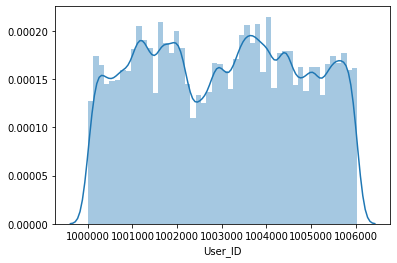

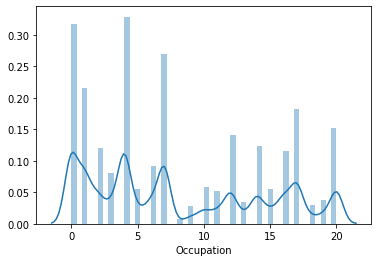

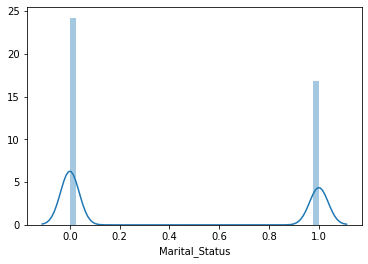

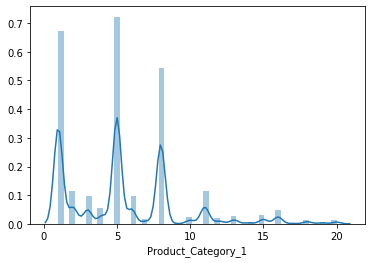

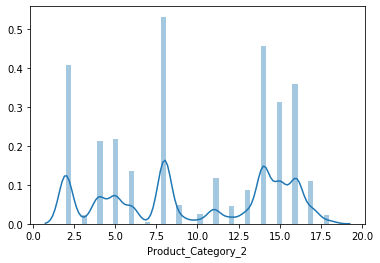

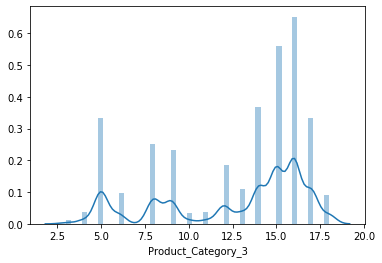

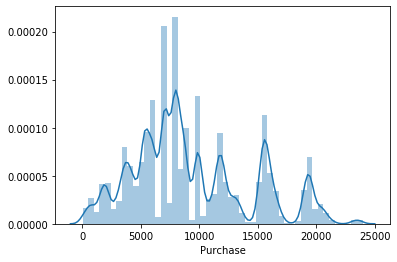

In [15]:
for i in numeric:
        sns.distplot(train[i])
        plt.show()

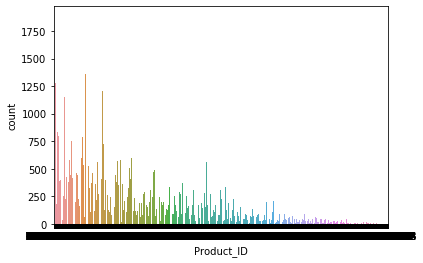

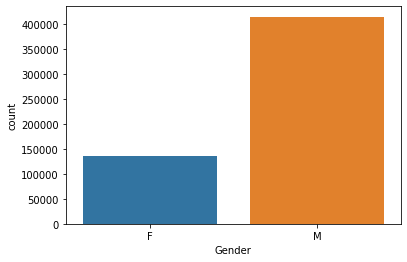

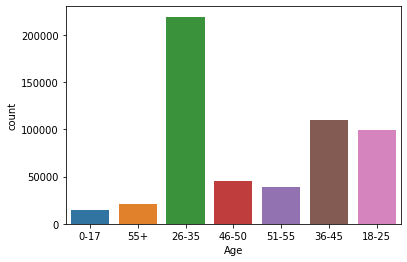

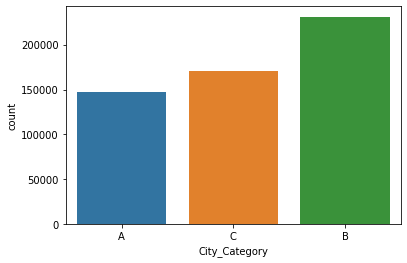

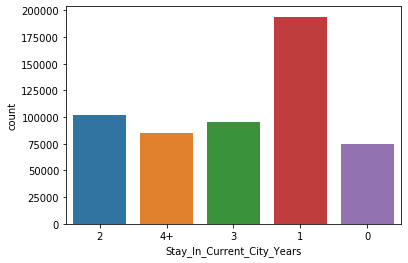

In [16]:
for i in categorial:
        sns.countplot(train[i])
        plt.show()

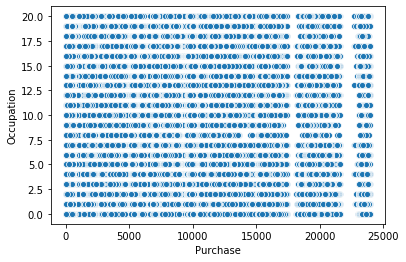

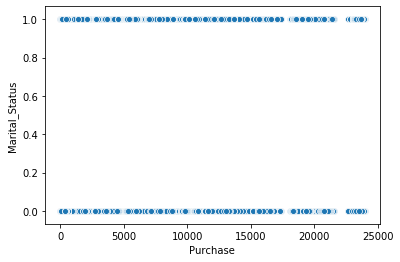

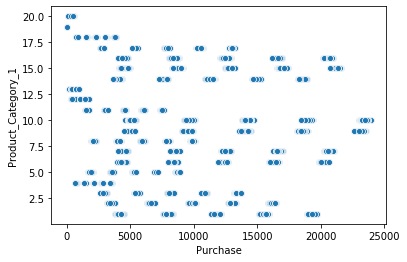

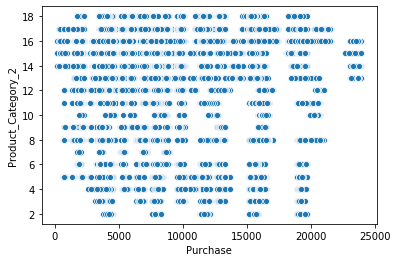

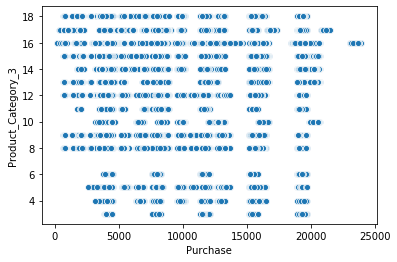

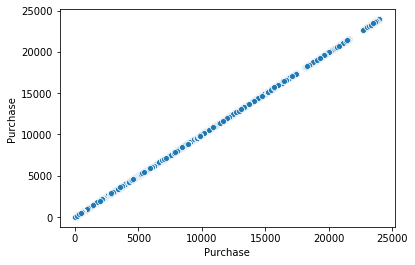

In [45]:
for i in numeric:
        sns.scatterplot(train['Purchase'],train[i])
        plt.show()

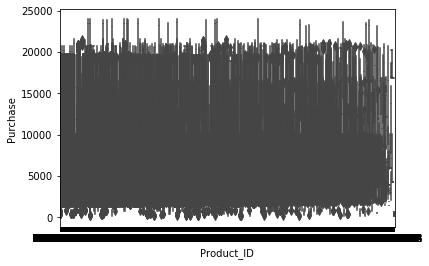

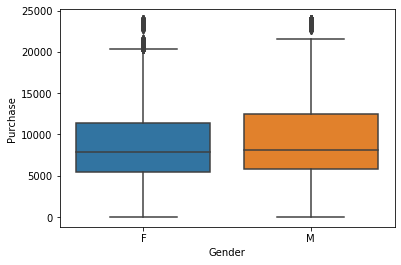

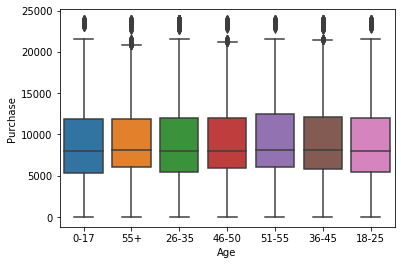

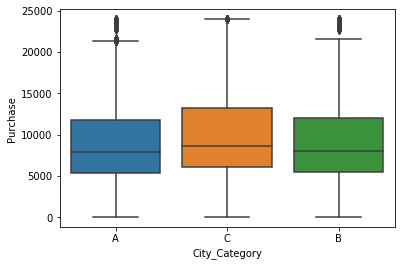

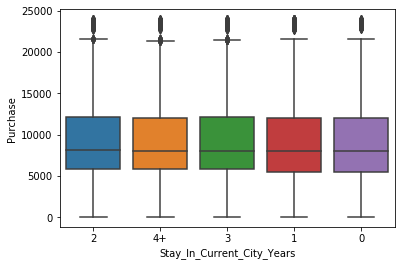

In [17]:
for i in categorial:
        sns.boxplot(train[i],train['Purchase'])
        plt.show()

In [198]:
train.groupby('Stay_In_Current_City_Years')['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Stay_In_Current_City_Years,,,,,,,,
0,74398.0,9180.075123,4990.479940,12.0,5480.0,8025.0,11990.0,23960.0
1,193821.0,9250.145923,5027.476933,12.0,5500.0,8041.0,12042.0,23961.0
2,101838.0,9320.429810,5044.588224,12.0,5846.0,8072.0,12117.0,23961.0
3,95285.0,9286.904119,5020.343541,12.0,5832.0,8047.0,12075.0,23961.0
4+,84726.0,9275.598872,5017.627594,12.0,5844.0,8052.0,12038.0,23958.0


# Null Value Imputation

## Product category 2

In [240]:
#df["Product_Category_2"]=df.groupby("User_ID")["Product_Category_2"].transform(lambda x:x.fillna(x.mode()))

In [241]:
#df.Product_Category_2.isnull().sum()

173637

In [27]:
df=train.copy()

In [28]:
locs = df[df.Product_Category_2.isnull()].index

In [29]:
locs.shape

(173638,)

In [32]:
ids=df[df.Product_Category_2.isnull()]['User_ID']

In [33]:
ids.shape

(173638,)

In [34]:
for i in locs:
    a=pd.DataFrame(stats.mode(df.loc[df.User_ID==ids[i]]["Product_Category_2"]))
    df.iloc[i, 9] = a.iloc[0,0]
    print(i)

0
2
4
9
11
12
21
22
23
26
31
32
34
35
40
45
61
63
70
86
91
92
96
104
106
109
110
124
130
131
132
136
144
145
157
158
162
164
165
166
167
170
174
178
179
181
182
183
187
188
189
190
191
192
199
201
202
203
206
207
208
210
212
213
220
222
231
232
233
234
237
238
239
247
250
256
257
258
260
261
262
265
268
276
277
281
288
289
290
298
304
325
326
327
329
331
333
334
335
337
344
347
348
350
351
355
356
357
360
361
364
367
368
370
373
377
378
381
383
386
387
388
389
391
396
401
402
403
407
408
412
413
414
434
438
439
441
443
444
446
466
473
474
476
477
480
481
488
490
493
498
499
500
506
519
524
525
528
532
533
534
536
539
547
549
553
554
556
569
570
572
573
574
575
578
581
593
594
595
601
602
603
617
623
626
635
636
643
645
646
647
648
660
671
674
677
678
681
682
685
686
690
692
696
702
704
715
717
724
731
732
739
742
750
753
754
755
762
763
764
765
766
772
773
775
778
779
794
796
802
804
806
807
810
812
817
824
825
826
827
830
831
851
852
857
858
859
861
863
864
865
867
871
875
876
878
879

5349
5351
5352
5356
5357
5358
5361
5362
5375
5376
5377
5378
5385
5388
5397
5403
5404
5406
5417
5418
5423
5425
5432
5434
5436
5441
5445
5458
5459
5460
5462
5464
5468
5474
5478
5479
5481
5482
5484
5485
5486
5488
5494
5511
5514
5517
5521
5523
5524
5526
5527
5528
5529
5530
5532
5533
5534
5535
5536
5538
5550
5553
5554
5569
5570
5572
5576
5580
5581
5591
5592
5593
5595
5596
5608
5609
5612
5617
5623
5628
5629
5632
5637
5643
5644
5645
5646
5647
5655
5658
5659
5662
5669
5671
5681
5683
5684
5688
5691
5694
5695
5697
5704
5706
5708
5713
5716
5720
5728
5729
5730
5733
5734
5736
5738
5739
5743
5746
5755
5760
5763
5771
5774
5777
5778
5780
5781
5785
5786
5795
5796
5797
5798
5799
5800
5804
5805
5807
5808
5810
5814
5816
5820
5822
5825
5828
5829
5830
5833
5834
5837
5838
5840
5841
5842
5844
5846
5856
5864
5867
5868
5879
5883
5884
5886
5887
5891
5893
5894
5896
5898
5902
5905
5906
5909
5911
5912
5914
5919
5922
5923
5928
5930
5936
5937
5938
5940
5942
5943
5944
5947
5948
5949
5950
5951
5954
5967
5970
5974
5975


10267
10269
10270
10272
10277
10280
10281
10292
10293
10295
10300
10301
10302
10304
10307
10308
10318
10324
10325
10328
10329
10330
10333
10339
10340
10342
10344
10347
10348
10349
10363
10373
10374
10375
10376
10378
10380
10386
10389
10391
10392
10395
10398
10400
10401
10406
10407
10412
10413
10414
10417
10419
10420
10423
10425
10427
10428
10432
10433
10439
10441
10444
10445
10449
10450
10451
10453
10457
10458
10460
10464
10465
10467
10472
10481
10484
10491
10497
10498
10499
10505
10506
10514
10519
10521
10522
10525
10533
10536
10542
10544
10545
10549
10554
10555
10566
10569
10570
10571
10572
10573
10574
10579
10582
10586
10587
10592
10598
10600
10606
10615
10616
10618
10619
10620
10621
10636
10637
10639
10641
10643
10644
10645
10646
10647
10649
10652
10656
10665
10666
10672
10682
10683
10687
10688
10689
10691
10692
10694
10695
10696
10713
10714
10715
10716
10717
10718
10719
10721
10722
10723
10727
10728
10729
10731
10744
10749
10751
10753
10758
10761
10769
10771
10772
10774
10775
1078

14497
14499
14502
14505
14506
14510
14517
14520
14524
14525
14529
14530
14531
14533
14535
14536
14538
14539
14540
14542
14544
14546
14547
14549
14550
14552
14554
14555
14565
14566
14569
14572
14576
14579
14590
14594
14597
14600
14612
14613
14615
14618
14620
14621
14623
14625
14626
14631
14642
14644
14647
14649
14650
14652
14654
14657
14658
14659
14661
14666
14668
14669
14671
14672
14677
14679
14684
14686
14687
14690
14693
14707
14713
14721
14731
14733
14738
14743
14744
14748
14749
14752
14758
14763
14765
14766
14769
14770
14772
14775
14776
14783
14785
14789
14790
14793
14797
14800
14802
14804
14805
14813
14814
14815
14824
14832
14834
14836
14838
14839
14840
14846
14861
14862
14865
14867
14868
14870
14876
14879
14881
14882
14885
14886
14888
14889
14890
14892
14893
14899
14900
14901
14902
14903
14905
14906
14907
14908
14909
14911
14912
14924
14928
14931
14933
14935
14936
14939
14940
14947
14950
14953
14954
14955
14956
14957
14958
14959
14960
14969
14971
14974
14976
14989
14996
14999
1500

23334
23335
23341
23342
23346
23348
23351
23361
23363
23364
23366
23375
23377
23378
23383
23385
23386
23390
23391
23393
23399
23403
23411
23413
23414
23430
23433
23442
23455
23462
23464
23466
23475
23476
23483
23484
23486
23497
23506
23512
23513
23514
23515
23518
23519
23526
23527
23532
23536
23539
23540
23542
23545
23548
23549
23550
23551
23559
23560
23561
23571
23576
23577
23597
23599
23600
23602
23603
23604
23605
23614
23617
23621
23624
23627
23631
23641
23645
23646
23647
23648
23651
23652
23653
23654
23657
23658
23662
23663
23664
23665
23670
23673
23675
23683
23684
23687
23688
23689
23691
23692
23694
23698
23699
23703
23706
23712
23717
23721
23724
23725
23735
23736
23739
23740
23744
23755
23762
23766
23767
23774
23777
23778
23779
23781
23782
23784
23785
23786
23788
23803
23807
23809
23810
23816
23820
23829
23833
23836
23841
23851
23853
23863
23866
23867
23868
23872
23874
23876
23879
23882
23884
23885
23886
23890
23891
23894
23896
23898
23905
23909
23912
23913
23917
23920
23923
2392

27895
27897
27898
27902
27903
27904
27906
27917
27924
27925
27950
27952
27957
27960
27964
27965
27966
27967
27968
27971
27972
27973
27975
27976
27978
27979
27980
27982
27985
27988
27995
27997
27998
27999
28000
28001
28005
28012
28018
28020
28021
28031
28034
28038
28059
28060
28063
28070
28073
28074
28093
28095
28096
28098
28105
28109
28110
28116
28123
28126
28129
28130
28138
28139
28140
28141
28143
28145
28146
28149
28154
28155
28164
28173
28177
28179
28181
28182
28184
28185
28188
28189
28190
28191
28193
28195
28196
28197
28200
28205
28206
28208
28210
28212
28213
28227
28230
28231
28232
28235
28236
28239
28242
28247
28252
28254
28256
28258
28259
28261
28262
28263
28270
28283
28284
28286
28287
28288
28290
28294
28298
28299
28301
28308
28309
28311
28318
28320
28322
28323
28324
28325
28326
28328
28340
28341
28347
28348
28355
28356
28357
28358
28360
28370
28373
28377
28380
28381
28382
28383
28384
28386
28388
28391
28396
28399
28403
28404
28407
28416
28420
28421
28424
28425
28428
28434
2843

32247
32248
32249
32251
32253
32257
32258
32262
32265
32269
32270
32271
32273
32275
32276
32279
32280
32282
32283
32292
32293
32296
32297
32298
32300
32305
32307
32310
32325
32326
32327
32328
32329
32330
32331
32333
32338
32339
32340
32341
32342
32343
32345
32346
32349
32350
32352
32355
32366
32367
32368
32374
32379
32385
32386
32387
32388
32389
32394
32406
32407
32408
32411
32421
32422
32426
32428
32430
32432
32436
32446
32449
32456
32458
32461
32462
32463
32467
32468
32473
32474
32475
32478
32479
32480
32481
32482
32483
32487
32488
32489
32490
32491
32496
32497
32498
32502
32509
32510
32518
32519
32529
32531
32534
32536
32537
32539
32540
32541
32543
32547
32548
32554
32558
32559
32565
32566
32567
32569
32571
32575
32576
32580
32582
32584
32586
32593
32597
32598
32602
32611
32614
32616
32617
32618
32639
32640
32646
32650
32652
32654
32655
32661
32662
32665
32672
32673
32674
32688
32689
32692
32694
32700
32706
32723
32725
32726
32728
32732
32737
32739
32740
32741
32744
32745
32746
3275

36601
36602
36604
36605
36606
36609
36611
36612
36613
36616
36617
36618
36623
36624
36625
36626
36627
36636
36638
36640
36645
36649
36652
36654
36656
36658
36659
36666
36667
36669
36677
36683
36690
36696
36697
36706
36716
36718
36720
36721
36725
36732
36733
36739
36740
36741
36744
36745
36756
36757
36770
36774
36775
36777
36786
36791
36796
36804
36810
36811
36812
36821
36824
36831
36839
36840
36847
36848
36849
36850
36851
36852
36867
36879
36880
36882
36883
36885
36886
36890
36891
36893
36895
36917
36922
36923
36936
36941
36942
36958
36965
36970
36974
36977
36980
36989
36990
36994
37005
37006
37007
37012
37013
37015
37018
37019
37020
37022
37038
37039
37044
37051
37054
37059
37062
37065
37070
37071
37073
37074
37075
37081
37083
37085
37089
37090
37091
37094
37096
37102
37103
37104
37114
37119
37121
37123
37128
37129
37130
37131
37132
37134
37135
37137
37141
37150
37162
37165
37166
37167
37181
37182
37193
37196
37201
37206
37211
37214
37217
37222
37223
37224
37225
37232
37247
37258
3726

41223
41225
41229
41232
41234
41236
41238
41239
41243
41244
41246
41258
41259
41260
41261
41262
41271
41275
41277
41279
41281
41286
41288
41290
41291
41295
41297
41300
41304
41312
41313
41314
41315
41327
41333
41334
41340
41343
41350
41351
41352
41354
41361
41363
41364
41365
41366
41369
41373
41377
41378
41379
41384
41388
41389
41391
41393
41394
41397
41400
41402
41414
41415
41416
41418
41421
41424
41429
41430
41431
41432
41437
41438
41440
41442
41447
41452
41456
41457
41458
41460
41462
41463
41465
41466
41467
41468
41469
41470
41471
41472
41474
41480
41481
41484
41485
41486
41487
41495
41498
41499
41509
41510
41513
41518
41519
41524
41525
41528
41529
41530
41532
41537
41539
41542
41543
41545
41549
41560
41564
41566
41568
41572
41573
41574
41579
41581
41585
41588
41590
41592
41596
41598
41600
41604
41605
41606
41607
41608
41614
41616
41617
41619
41622
41623
41627
41628
41634
41636
41637
41638
41639
41640
41643
41645
41648
41649
41659
41663
41668
41670
41678
41680
41684
41686
41688
4168

45580
45584
45585
45590
45591
45593
45595
45598
45605
45607
45614
45615
45616
45619
45620
45621
45622
45624
45627
45628
45630
45634
45635
45637
45642
45643
45647
45650
45654
45657
45658
45660
45663
45668
45673
45674
45677
45679
45681
45687
45688
45699
45701
45710
45711
45713
45714
45715
45717
45719
45720
45722
45723
45726
45729
45732
45737
45738
45740
45742
45747
45752
45754
45765
45770
45778
45780
45782
45783
45784
45790
45792
45795
45797
45798
45799
45806
45807
45811
45812
45814
45817
45820
45827
45830
45836
45838
45844
45846
45856
45859
45860
45862
45864
45865
45867
45871
45872
45880
45881
45885
45886
45887
45888
45897
45898
45901
45907
45909
45913
45915
45917
45918
45924
45930
45932
45937
45945
45947
45950
45952
45963
45964
45972
45978
45979
45980
45982
45988
45990
45991
45997
46002
46004
46006
46007
46012
46020
46021
46023
46033
46034
46038
46039
46042
46043
46044
46049
46051
46053
46057
46060
46061
46062
46064
46068
46069
46070
46071
46073
46075
46076
46077
46082
46083
46086
4609

49784
49785
49787
49788
49789
49791
49792
49804
49806
49807
49808
49816
49817
49819
49821
49824
49829
49830
49840
49843
49845
49846
49848
49850
49851
49853
49859
49860
49872
49873
49874
49876
49882
49883
49885
49886
49887
49890
49892
49897
49903
49904
49909
49911
49913
49918
49920
49926
49927
49932
49934
49937
49939
49940
49941
49946
49948
49956
49968
49969
49970
49975
49976
49978
49979
49980
49981
49983
49985
49993
49998
49999
50000
50003
50004
50008
50009
50012
50013
50016
50024
50027
50028
50029
50030
50031
50034
50037
50039
50040
50042
50043
50046
50047
50050
50052
50053
50057
50085
50086
50099
50100
50104
50107
50109
50112
50115
50116
50120
50126
50129
50143
50144
50147
50150
50153
50155
50165
50167
50168
50169
50171
50172
50173
50179
50181
50182
50184
50185
50187
50188
50190
50191
50192
50193
50194
50196
50197
50198
50199
50201
50204
50213
50214
50216
50218
50219
50222
50225
50227
50228
50230
50231
50235
50236
50239
50240
50242
50244
50251
50252
50254
50256
50259
50260
50262
5026

54170
54182
54184
54191
54192
54196
54197
54201
54202
54203
54206
54209
54212
54213
54216
54218
54220
54227
54228
54230
54232
54233
54239
54241
54245
54251
54253
54254
54256
54257
54264
54266
54267
54268
54273
54276
54292
54293
54294
54295
54297
54298
54302
54305
54307
54313
54315
54318
54320
54322
54324
54326
54327
54334
54345
54346
54349
54352
54355
54358
54362
54365
54368
54371
54372
54373
54374
54377
54378
54379
54381
54387
54396
54397
54401
54403
54407
54411
54415
54416
54417
54423
54425
54427
54428
54432
54436
54437
54451
54454
54458
54463
54464
54466
54467
54468
54480
54481
54484
54485
54486
54490
54491
54492
54493
54495
54496
54501
54503
54508
54509
54511
54512
54524
54525
54527
54528
54529
54530
54531
54532
54533
54543
54544
54550
54554
54556
54558
54559
54563
54564
54566
54568
54570
54571
54574
54577
54579
54580
54583
54586
54587
54591
54592
54593
54594
54595
54596
54597
54599
54603
54613
54614
54615
54619
54620
54621
54624
54630
54631
54632
54637
54639
54645
54647
54648
5465

58513
58514
58515
58518
58524
58539
58540
58542
58543
58544
58545
58546
58547
58548
58549
58551
58553
58554
58555
58556
58557
58558
58560
58561
58565
58566
58570
58573
58575
58583
58586
58588
58589
58592
58593
58595
58601
58602
58613
58614
58635
58641
58642
58652
58654
58656
58657
58659
58660
58663
58664
58666
58667
58681
58683
58691
58705
58709
58712
58716
58717
58721
58722
58728
58729
58732
58734
58735
58736
58747
58748
58752
58753
58754
58760
58762
58763
58764
58765
58766
58768
58770
58771
58773
58778
58781
58787
58788
58789
58791
58792
58793
58795
58797
58801
58802
58803
58811
58815
58816
58817
58818
58819
58822
58828
58829
58830
58832
58834
58836
58838
58843
58845
58846
58847
58849
58857
58859
58865
58867
58868
58869
58871
58872
58873
58875
58876
58882
58886
58888
58894
58895
58896
58902
58905
58912
58914
58918
58921
58925
58930
58936
58950
58968
58969
58975
58976
58978
58981
58982
58983
58984
58988
58992
58995
58996
59000
59001
59005
59012
59017
59018
59024
59027
59028
59046
5904

62829
62831
62840
62842
62845
62847
62849
62850
62852
62854
62856
62862
62866
62877
62880
62882
62895
62916
62919
62922
62925
62927
62928
62940
62945
62946
62948
62950
62952
62953
62957
62958
62959
62961
62962
62965
62967
62972
62973
62975
62976
62977
62980
62981
62986
62988
62994
62995
63001
63007
63008
63016
63017
63018
63023
63032
63035
63037
63038
63039
63040
63042
63046
63051
63054
63059
63063
63066
63077
63079
63080
63082
63085
63087
63098
63106
63111
63114
63128
63133
63136
63140
63141
63142
63143
63144
63148
63152
63155
63157
63158
63162
63169
63170
63172
63174
63175
63176
63181
63185
63187
63188
63189
63190
63198
63199
63200
63202
63203
63205
63207
63215
63219
63220
63222
63224
63228
63235
63244
63247
63253
63254
63260
63261
63263
63264
63265
63267
63275
63276
63277
63280
63281
63283
63286
63287
63290
63291
63295
63297
63300
63306
63312
63314
63315
63320
63326
63327
63328
63330
63332
63334
63339
63340
63342
63343
63350
63354
63358
63359
63364
63365
63369
63373
63374
63379
6338

67437
67443
67444
67449
67451
67452
67458
67463
67464
67465
67468
67472
67475
67476
67478
67480
67482
67487
67488
67489
67490
67493
67496
67502
67505
67507
67519
67520
67521
67522
67523
67525
67528
67529
67530
67533
67536
67539
67542
67546
67547
67548
67550
67551
67553
67554
67557
67558
67559
67560
67565
67568
67577
67584
67585
67589
67590
67592
67599
67601
67602
67606
67608
67611
67616
67618
67621
67622
67625
67629
67633
67637
67639
67642
67643
67646
67651
67654
67656
67660
67661
67668
67673
67674
67675
67676
67677
67688
67694
67695
67696
67698
67699
67702
67703
67706
67708
67719
67720
67721
67724
67725
67737
67738
67743
67744
67748
67751
67752
67755
67763
67766
67767
67781
67787
67788
67789
67792
67793
67795
67801
67802
67803
67804
67807
67814
67816
67818
67819
67820
67824
67831
67832
67839
67842
67845
67851
67852
67856
67860
67862
67864
67866
67871
67873
67876
67877
67878
67880
67885
67886
67889
67890
67894
67896
67901
67903
67914
67915
67921
67924
67933
67934
67936
67937
67938
6794

71826
71829
71830
71831
71833
71834
71837
71838
71840
71848
71854
71856
71857
71859
71860
71861
71862
71863
71866
71867
71872
71884
71886
71894
71895
71902
71904
71907
71909
71911
71914
71915
71920
71922
71928
71931
71935
71944
71949
71955
71956
71957
71960
71967
71968
71975
71980
71986
71987
71993
71999
72001
72002
72003
72006
72008
72010
72011
72013
72016
72018
72020
72021
72025
72028
72031
72033
72042
72044
72050
72052
72056
72057
72059
72062
72064
72073
72074
72077
72078
72082
72084
72085
72087
72088
72089
72090
72092
72097
72099
72101
72102
72108
72111
72119
72124
72125
72127
72128
72129
72130
72132
72133
72134
72138
72140
72141
72145
72146
72154
72158
72162
72168
72171
72172
72173
72176
72177
72179
72182
72183
72184
72188
72190
72193
72196
72203
72207
72208
72212
72219
72229
72231
72241
72247
72249
72250
72251
72252
72253
72254
72255
72256
72257
72260
72261
72268
72269
72272
72278
72279
72286
72295
72297
72307
72308
72310
72312
72314
72315
72316
72317
72318
72320
72321
72322
7232

80698
80700
80704
80709
80720
80724
80728
80729
80730
80731
80736
80737
80741
80749
80756
80757
80759
80761
80764
80766
80767
80774
80786
80787
80788
80790
80791
80793
80796
80798
80801
80802
80805
80806
80808
80813
80814
80816
80818
80820
80821
80823
80824
80826
80828
80835
80837
80838
80839
80841
80842
80849
80851
80854
80855
80856
80858
80861
80874
80878
80880
80881
80882
80886
80890
80892
80893
80901
80905
80908
80909
80910
80912
80915
80917
80920
80929
80932
80938
80943
80944
80946
80949
80950
80953
80958
80959
80961
80964
80969
80971
80972
80974
80975
80978
80986
80987
80989
80990
80992
80995
80996
80998
81003
81004
81016
81023
81027
81028
81029
81030
81031
81034
81035
81037
81038
81044
81053
81065
81069
81079
81082
81086
81088
81089
81091
81093
81094
81098
81105
81107
81111
81113
81124
81125
81131
81136
81138
81142
81144
81149
81150
81153
81155
81163
81168
81169
81172
81173
81192
81196
81197
81198
81201
81203
81205
81214
81217
81218
81219
81230
81231
81232
81234
81235
81239
8124

85212
85213
85216
85218
85224
85226
85228
85231
85232
85233
85234
85236
85240
85246
85248
85250
85257
85258
85259
85260
85268
85270
85271
85273
85275
85276
85277
85279
85280
85283
85287
85289
85290
85291
85292
85293
85295
85296
85298
85300
85301
85304
85311
85312
85323
85333
85334
85342
85344
85346
85347
85348
85356
85358
85360
85368
85370
85373
85374
85375
85376
85377
85378
85379
85380
85381
85383
85385
85388
85390
85391
85396
85397
85398
85404
85416
85433
85438
85439
85443
85445
85447
85448
85449
85459
85460
85465
85468
85473
85474
85476
85477
85478
85480
85483
85484
85485
85487
85489
85494
85499
85504
85506
85508
85509
85510
85513
85521
85522
85525
85529
85531
85533
85536
85537
85538
85542
85543
85544
85550
85551
85554
85555
85557
85558
85562
85564
85566
85568
85572
85575
85579
85582
85583
85588
85593
85605
85610
85626
85639
85642
85647
85651
85652
85654
85655
85660
85661
85665
85671
85675
85676
85678
85679
85685
85690
85693
85697
85698
85702
85707
85708
85709
85714
85715
85716
8571

89556
89560
89567
89568
89570
89571
89578
89584
89586
89590
89591
89592
89593
89595
89596
89599
89600
89603
89606
89608
89613
89621
89629
89630
89631
89632
89634
89636
89643
89645
89646
89653
89654
89658
89663
89664
89665
89667
89671
89673
89675
89676
89679
89693
89695
89698
89705
89706
89707
89709
89712
89714
89719
89720
89721
89725
89729
89730
89741
89746
89748
89749
89750
89752
89756
89758
89760
89762
89764
89765
89784
89786
89787
89790
89791
89795
89799
89802
89803
89804
89809
89811
89812
89815
89816
89817
89824
89828
89829
89830
89834
89835
89838
89839
89840
89842
89849
89850
89852
89858
89859
89860
89865
89866
89867
89868
89871
89873
89874
89876
89878
89879
89883
89885
89887
89888
89889
89895
89901
89903
89905
89909
89912
89916
89919
89929
89930
89933
89934
89935
89938
89940
89942
89943
89946
89948
89955
89959
89970
89971
89973
89978
89979
89980
89983
89989
89990
89992
89993
89996
90008
90013
90014
90025
90026
90032
90034
90036
90043
90044
90045
90047
90048
90050
90055
90056
9005

93808
93820
93821
93826
93828
93829
93831
93838
93850
93856
93858
93859
93865
93871
93872
93873
93883
93889
93890
93891
93892
93893
93896
93898
93899
93901
93905
93907
93908
93910
93913
93929
93930
93931
93936
93940
93942
93943
93948
93949
93952
93953
93955
93956
93958
93959
93961
93964
93966
93970
93973
93974
93977
93979
93980
93984
93988
93990
93993
93995
93997
93998
94007
94012
94023
94029
94030
94031
94032
94037
94038
94040
94042
94043
94052
94066
94070
94073
94074
94076
94077
94080
94082
94083
94102
94105
94106
94107
94109
94121
94122
94123
94126
94127
94128
94132
94133
94134
94136
94138
94142
94149
94157
94158
94162
94170
94171
94175
94177
94178
94180
94181
94188
94191
94193
94194
94198
94199
94203
94208
94213
94215
94220
94223
94228
94231
94235
94237
94243
94245
94246
94248
94251
94252
94256
94258
94259
94262
94265
94267
94270
94271
94275
94277
94278
94284
94285
94292
94298
94308
94311
94312
94315
94322
94332
94334
94337
94338
94342
94351
94352
94353
94354
94358
94367
94371
9437

98470
98471
98472
98473
98485
98490
98495
98496
98498
98500
98509
98514
98522
98523
98525
98528
98529
98530
98534
98535
98538
98543
98545
98550
98552
98553
98555
98559
98563
98564
98566
98567
98568
98569
98572
98579
98581
98584
98585
98587
98588
98591
98606
98613
98614
98634
98647
98648
98649
98650
98651
98653
98656
98657
98662
98664
98668
98671
98675
98677
98678
98680
98681
98682
98683
98686
98687
98688
98690
98691
98692
98695
98696
98697
98700
98703
98704
98719
98721
98723
98727
98732
98734
98741
98745
98750
98755
98756
98763
98774
98775
98776
98777
98778
98779
98782
98783
98784
98797
98803
98812
98813
98819
98825
98827
98828
98832
98833
98834
98839
98840
98841
98851
98853
98856
98857
98858
98859
98861
98879
98880
98882
98883
98885
98889
98890
98891
98892
98893
98895
98901
98902
98903
98906
98908
98909
98914
98932
98935
98936
98941
98943
98945
98954
98958
98960
98964
98974
98975
98976
98982
98985
98987
98988
98994
98995
98996
99003
99004
99005
99016
99017
99018
99019
99027
99034
9903

102516
102519
102520
102522
102528
102530
102533
102535
102540
102545
102550
102551
102552
102554
102557
102558
102559
102560
102562
102563
102564
102565
102566
102570
102571
102575
102576
102579
102586
102588
102591
102592
102597
102604
102614
102615
102622
102627
102629
102636
102638
102641
102643
102645
102646
102649
102654
102655
102658
102662
102663
102666
102668
102671
102672
102676
102677
102678
102679
102680
102681
102692
102695
102697
102698
102699
102700
102701
102702
102704
102708
102709
102710
102711
102712
102715
102720
102721
102724
102725
102727
102729
102731
102733
102734
102736
102739
102741
102745
102746
102748
102749
102764
102767
102768
102769
102770
102772
102775
102776
102782
102783
102786
102787
102791
102792
102797
102802
102814
102822
102823
102825
102837
102841
102842
102845
102861
102862
102864
102867
102878
102888
102892
102893
102906
102909
102910
102913
102927
102928
102930
102931
102932
102933
102934
102935
102938
102943
102946
102949
102951
102954
102955

106422
106424
106425
106427
106429
106430
106431
106434
106436
106442
106444
106448
106449
106457
106458
106459
106462
106464
106465
106466
106467
106472
106473
106475
106480
106481
106482
106484
106485
106486
106487
106488
106489
106491
106492
106496
106501
106516
106517
106518
106522
106526
106527
106529
106530
106531
106532
106533
106540
106541
106543
106546
106557
106558
106562
106565
106570
106580
106581
106582
106584
106586
106589
106591
106594
106595
106607
106612
106613
106617
106620
106621
106622
106623
106624
106625
106633
106635
106653
106654
106655
106657
106658
106659
106666
106667
106668
106670
106674
106677
106678
106679
106687
106694
106696
106697
106698
106699
106700
106707
106708
106709
106710
106711
106712
106714
106720
106727
106728
106730
106732
106736
106737
106739
106742
106745
106749
106752
106755
106763
106764
106768
106770
106772
106774
106775
106776
106777
106785
106786
106790
106791
106792
106794
106795
106797
106798
106799
106800
106805
106807
106810
106818

110147
110150
110161
110162
110167
110169
110173
110175
110177
110180
110186
110188
110189
110190
110193
110195
110197
110199
110204
110206
110208
110223
110224
110225
110226
110227
110228
110232
110233
110234
110237
110241
110245
110246
110247
110251
110252
110257
110263
110265
110266
110267
110268
110270
110273
110276
110277
110278
110279
110280
110282
110285
110292
110294
110303
110305
110312
110314
110325
110328
110333
110334
110338
110340
110355
110356
110366
110367
110368
110369
110370
110371
110374
110380
110381
110387
110389
110397
110398
110399
110401
110403
110405
110415
110426
110428
110431
110432
110434
110438
110439
110442
110445
110446
110451
110455
110462
110472
110478
110479
110494
110495
110498
110499
110502
110504
110505
110507
110508
110510
110511
110512
110517
110521
110525
110526
110533
110534
110540
110541
110542
110550
110551
110552
110553
110554
110555
110556
110560
110564
110567
110568
110570
110587
110590
110595
110596
110597
110599
110600
110603
110605
110610

114032
114044
114047
114049
114050
114051
114056
114057
114064
114065
114067
114068
114069
114070
114071
114072
114073
114075
114076
114077
114083
114084
114085
114087
114090
114094
114105
114108
114114
114115
114116
114125
114126
114130
114131
114134
114137
114140
114144
114148
114150
114154
114157
114159
114164
114165
114167
114172
114176
114177
114178
114179
114188
114189
114192
114194
114195
114199
114205
114206
114207
114208
114210
114212
114214
114220
114222
114228
114235
114243
114244
114245
114253
114254
114256
114257
114259
114262
114266
114267
114269
114274
114275
114277
114280
114284
114290
114295
114298
114299
114300
114307
114309
114313
114318
114319
114324
114325
114327
114328
114333
114357
114359
114369
114372
114375
114379
114381
114382
114383
114390
114392
114393
114394
114399
114406
114408
114413
114419
114420
114422
114435
114436
114439
114441
114449
114453
114458
114479
114481
114482
114484
114485
114500
114501
114504
114505
114507
114509
114511
114518
114525
114527

118035
118037
118039
118046
118047
118049
118050
118053
118056
118058
118059
118060
118080
118086
118105
118107
118115
118118
118121
118122
118125
118130
118132
118135
118137
118139
118140
118141
118142
118143
118148
118151
118154
118170
118173
118174
118175
118176
118178
118180
118184
118191
118196
118197
118198
118201
118204
118206
118213
118217
118224
118233
118234
118235
118240
118242
118247
118248
118255
118257
118258
118265
118267
118268
118269
118270
118271
118272
118273
118276
118286
118287
118291
118293
118294
118295
118296
118297
118301
118302
118303
118306
118310
118317
118321
118322
118324
118340
118346
118355
118358
118366
118367
118370
118376
118377
118380
118381
118382
118393
118394
118395
118401
118404
118408
118409
118415
118416
118417
118419
118422
118424
118427
118431
118434
118435
118436
118437
118438
118447
118449
118453
118454
118459
118471
118475
118479
118481
118487
118488
118492
118494
118495
118497
118503
118505
118506
118510
118514
118516
118527
118529
118530

121848
121852
121860
121864
121865
121869
121871
121872
121875
121876
121878
121880
121881
121882
121883
121885
121887
121888
121889
121891
121892
121895
121926
121930
121931
121932
121933
121935
121936
121940
121941
121944
121946
121948
121949
121950
121952
121953
121955
121956
121961
121962
121965
121970
121974
121975
121977
121978
121980
121983
121986
121987
121989
121992
121997
121999
122002
122006
122007
122008
122011
122018
122020
122023
122028
122033
122035
122036
122037
122038
122039
122041
122043
122044
122046
122047
122060
122068
122069
122071
122074
122079
122086
122095
122100
122101
122102
122103
122106
122108
122112
122116
122117
122119
122120
122121
122124
122125
122126
122128
122131
122133
122148
122150
122151
122152
122159
122161
122176
122177
122179
122181
122183
122185
122186
122190
122191
122192
122194
122210
122211
122212
122213
122214
122215
122216
122217
122219
122220
122221
122222
122227
122230
122233
122235
122242
122247
122249
122253
122254
122255
122261
122264

125425
125427
125429
125431
125432
125433
125434
125435
125437
125438
125439
125442
125443
125447
125450
125452
125454
125455
125457
125463
125467
125468
125470
125471
125473
125475
125478
125486
125487
125489
125492
125494
125500
125501
125504
125520
125522
125523
125524
125525
125526
125531
125533
125534
125536
125541
125548
125549
125553
125572
125573
125574
125577
125578
125586
125587
125599
125613
125616
125617
125620
125627
125630
125633
125640
125641
125643
125644
125645
125646
125669
125675
125680
125681
125684
125685
125687
125690
125692
125698
125703
125705
125707
125710
125712
125713
125715
125725
125735
125736
125741
125742
125744
125746
125750
125751
125752
125753
125755
125756
125758
125772
125773
125776
125779
125780
125785
125787
125789
125790
125794
125795
125807
125808
125810
125813
125817
125820
125823
125826
125828
125830
125836
125843
125845
125854
125861
125865
125867
125872
125880
125881
125883
125887
125891
125900
125903
125911
125915
125916
125920
125922
125927

129149
129151
129152
129154
129156
129157
129159
129160
129161
129162
129165
129167
129170
129176
129178
129184
129191
129192
129194
129200
129207
129208
129209
129214
129215
129216
129217
129218
129219
129222
129224
129228
129232
129234
129236
129237
129240
129246
129251
129252
129253
129254
129255
129256
129257
129258
129259
129265
129268
129269
129270
129275
129280
129281
129282
129283
129287
129292
129294
129314
129315
129316
129321
129326
129328
129329
129331
129332
129333
129334
129335
129336
129338
129339
129345
129347
129349
129350
129351
129352
129354
129355
129357
129358
129361
129362
129363
129364
129367
129370
129372
129374
129380
129381
129384
129386
129387
129389
129395
129396
129400
129402
129403
129405
129407
129411
129413
129415
129417
129424
129425
129426
129428
129429
129430
129432
129433
129438
129439
129441
129446
129447
129456
129457
129459
129473
129478
129479
129480
129485
129489
129490
129492
129498
129499
129500
129502
129503
129505
129506
129507
129508
129513

132739
132741
132751
132761
132769
132771
132773
132774
132776
132779
132781
132790
132792
132795
132797
132798
132799
132804
132810
132823
132829
132831
132843
132851
132863
132864
132865
132874
132878
132880
132881
132882
132894
132898
132899
132900
132906
132912
132915
132925
132927
132929
132933
132940
132948
132949
132950
132951
132955
132959
132964
132973
132975
132978
132984
132989
132991
132993
132994
132997
133000
133002
133012
133013
133014
133016
133018
133024
133028
133033
133035
133037
133038
133040
133045
133047
133049
133050
133055
133058
133059
133060
133061
133062
133065
133069
133070
133072
133078
133084
133087
133089
133090
133096
133103
133105
133112
133115
133116
133118
133119
133121
133122
133129
133134
133135
133136
133137
133139
133140
133141
133142
133143
133144
133145
133147
133149
133150
133151
133154
133157
133165
133170
133192
133193
133200
133204
133205
133206
133232
133233
133235
133243
133245
133246
133248
133250
133253
133256
133261
133262
133263
133265

136556
136562
136564
136566
136567
136581
136582
136596
136599
136602
136605
136606
136607
136610
136615
136616
136619
136623
136624
136626
136634
136635
136645
136646
136648
136652
136653
136659
136670
136672
136675
136678
136679
136687
136689
136693
136694
136695
136697
136708
136713
136718
136721
136723
136725
136728
136730
136731
136733
136734
136735
136736
136738
136740
136741
136745
136748
136751
136753
136759
136766
136769
136772
136773
136782
136786
136787
136788
136789
136791
136792
136793
136796
136797
136803
136804
136805
136806
136809
136814
136816
136817
136818
136819
136820
136821
136822
136824
136831
136832
136833
136834
136838
136846
136847
136848
136860
136861
136867
136868
136870
136872
136875
136880
136891
136894
136897
136898
136902
136903
136909
136911
136912
136913
136917
136921
136922
136923
136924
136935
136937
136939
136941
136942
136943
136944
136946
136947
136948
136951
136952
136953
136955
136958
136961
136962
136963
136964
136965
136968
136972
136979
136983

140526
140533
140534
140535
140537
140539
140541
140543
140545
140549
140554
140555
140561
140564
140573
140578
140579
140583
140587
140588
140590
140594
140595
140597
140599
140600
140603
140607
140619
140620
140626
140628
140631
140645
140646
140647
140657
140658
140660
140664
140666
140670
140673
140682
140683
140684
140686
140687
140688
140689
140694
140697
140698
140707
140711
140713
140716
140717
140720
140723
140741
140742
140746
140747
140748
140749
140751
140752
140753
140757
140758
140760
140762
140765
140767
140770
140772
140773
140775
140776
140786
140797
140801
140802
140806
140807
140808
140810
140813
140814
140815
140818
140823
140829
140832
140838
140839
140841
140843
140845
140846
140847
140852
140853
140856
140858
140859
140860
140865
140868
140869
140873
140874
140875
140878
140880
140882
140894
140896
140897
140899
140900
140903
140904
140905
140907
140911
140912
140914
140915
140918
140920
140922
140927
140931
140932
140937
140940
140944
140946
140948
140952
140953

144402
144415
144416
144417
144418
144421
144430
144431
144432
144436
144438
144440
144441
144442
144444
144445
144446
144449
144452
144455
144456
144458
144459
144460
144461
144462
144472
144476
144477
144478
144482
144483
144488
144501
144507
144509
144511
144512
144515
144516
144518
144520
144523
144528
144534
144542
144552
144559
144573
144579
144588
144591
144592
144596
144598
144599
144600
144607
144610
144611
144612
144615
144617
144618
144627
144631
144637
144639
144645
144647
144653
144654
144663
144664
144665
144666
144667
144670
144674
144675
144685
144686
144692
144696
144711
144713
144715
144718
144720
144721
144729
144732
144736
144737
144738
144744
144750
144752
144755
144766
144767
144769
144771
144772
144773
144775
144777
144785
144786
144788
144791
144817
144818
144824
144829
144832
144840
144849
144851
144852
144855
144856
144857
144863
144867
144871
144872
144877
144879
144882
144885
144889
144897
144899
144900
144902
144904
144906
144908
144915
144917
144918
144920

148179
148180
148182
148184
148186
148190
148192
148193
148194
148195
148200
148201
148203
148205
148206
148208
148211
148213
148214
148219
148224
148225
148226
148230
148235
148236
148237
148245
148246
148247
148248
148251
148254
148256
148257
148261
148265
148277
148282
148284
148290
148297
148300
148312
148316
148321
148322
148324
148326
148327
148331
148332
148338
148339
148343
148344
148346
148347
148356
148357
148367
148378
148380
148381
148384
148385
148393
148394
148395
148396
148398
148399
148402
148409
148410
148411
148415
148416
148418
148419
148423
148424
148426
148428
148429
148431
148433
148436
148440
148442
148445
148447
148448
148449
148450
148461
148469
148472
148474
148481
148483
148484
148489
148490
148491
148493
148495
148500
148501
148503
148507
148510
148514
148519
148525
148528
148529
148532
148533
148539
148542
148543
148544
148547
148548
148552
148553
148556
148563
148566
148572
148577
148580
148585
148587
148594
148595
148596
148598
148600
148601
148602
148606

155788
155789
155790
155802
155816
155818
155819
155820
155821
155824
155827
155831
155832
155836
155837
155845
155849
155852
155872
155876
155880
155881
155884
155888
155889
155892
155897
155899
155902
155903
155904
155905
155908
155909
155915
155916
155919
155921
155922
155925
155943
155944
155945
155946
155947
155948
155960
155964
155966
155972
155973
155984
155985
155987
155988
155990
155993
155994
156002
156010
156014
156015
156016
156017
156022
156023
156034
156052
156055
156058
156062
156063
156067
156068
156069
156072
156073
156077
156091
156097
156101
156106
156107
156110
156111
156119
156120
156124
156126
156133
156135
156138
156142
156144
156145
156146
156157
156160
156168
156175
156177
156182
156183
156192
156195
156198
156199
156208
156210
156220
156221
156222
156223
156226
156245
156253
156272
156273
156274
156278
156279
156282
156285
156289
156290
156291
156292
156294
156303
156304
156307
156312
156317
156319
156325
156330
156336
156337
156338
156343
156344
156345
156356

159561
159562
159568
159574
159576
159580
159588
159589
159593
159594
159600
159601
159602
159605
159606
159610
159614
159621
159625
159631
159632
159637
159638
159640
159641
159644
159647
159649
159655
159658
159659
159660
159661
159666
159668
159677
159680
159681
159683
159684
159685
159686
159687
159691
159695
159696
159698
159699
159700
159705
159706
159724
159727
159735
159737
159749
159750
159754
159756
159762
159763
159764
159765
159768
159773
159776
159782
159785
159786
159787
159789
159799
159800
159804
159808
159809
159810
159811
159829
159830
159833
159835
159839
159843
159844
159849
159850
159852
159853
159862
159863
159864
159867
159877
159878
159879
159884
159888
159892
159894
159895
159901
159902
159905
159906
159917
159919
159928
159930
159938
159942
159943
159944
159946
159948
159949
159952
159953
159954
159956
159957
159962
159963
159964
159969
159971
159975
159976
159977
159978
159980
159981
159984
159986
159987
159988
159989
159991
159996
160011
160014
160016
160018

163379
163385
163394
163397
163399
163400
163403
163404
163406
163407
163409
163410
163416
163417
163418
163420
163422
163426
163427
163438
163456
163457
163458
163459
163460
163464
163466
163467
163468
163470
163471
163472
163475
163478
163480
163481
163482
163488
163489
163496
163497
163498
163500
163504
163510
163511
163526
163527
163531
163533
163534
163549
163550
163552
163553
163554
163560
163564
163567
163568
163572
163573
163574
163576
163577
163580
163583
163585
163587
163589
163590
163591
163593
163594
163598
163601
163612
163616
163617
163623
163624
163630
163633
163634
163636
163642
163643
163644
163646
163647
163648
163649
163650
163651
163653
163654
163656
163657
163658
163659
163660
163661
163667
163671
163672
163673
163674
163675
163677
163679
163683
163688
163689
163690
163700
163701
163704
163706
163707
163709
163710
163719
163722
163726
163727
163730
163731
163735
163740
163746
163748
163754
163765
163766
163767
163768
163769
163772
163777
163784
163787
163800
163801

167055
167057
167059
167068
167073
167075
167080
167081
167082
167086
167088
167093
167095
167102
167110
167111
167114
167116
167123
167124
167125
167131
167136
167140
167143
167145
167147
167153
167157
167163
167164
167166
167172
167174
167178
167179
167180
167189
167190
167192
167197
167198
167199
167203
167204
167205
167207
167208
167209
167211
167213
167215
167221
167224
167227
167230
167233
167238
167250
167254
167255
167258
167261
167262
167267
167268
167270
167273
167275
167277
167280
167281
167282
167283
167284
167286
167287
167288
167289
167292
167293
167296
167297
167298
167301
167303
167304
167314
167315
167321
167325
167326
167328
167333
167337
167338
167339
167340
167341
167342
167344
167348
167349
167350
167354
167355
167357
167359
167360
167362
167366
167367
167368
167379
167380
167381
167386
167388
167392
167395
167397
167398
167399
167401
167403
167404
167408
167410
167411
167421
167426
167429
167430
167431
167440
167446
167451
167452
167453
167455
167460
167463
167468

170832
170834
170836
170837
170839
170840
170841
170847
170857
170859
170861
170862
170864
170866
170867
170868
170872
170873
170875
170880
170884
170888
170889
170890
170891
170894
170901
170904
170906
170911
170912
170915
170923
170924
170925
170926
170928
170931
170933
170934
170953
170954
170961
170965
170966
170970
170972
170973
170979
170989
170990
170991
170994
170995
170996
170999
171002
171003
171007
171008
171010
171022
171023
171025
171026
171027
171032
171033
171034
171035
171039
171042
171043
171045
171049
171050
171052
171055
171056
171060
171061
171063
171083
171088
171092
171095
171096
171098
171102
171104
171105
171108
171128
171132
171133
171134
171135
171136
171137
171149
171154
171156
171165
171172
171173
171176
171178
171182
171183
171184
171185
171189
171191
171192
171195
171198
171203
171206
171214
171215
171220
171222
171223
171224
171225
171226
171230
171231
171240
171242
171244
171245
171246
171248
171250
171252
171253
171257
171258
171259
171270
171271
171278

174678
174688
174689
174691
174692
174693
174694
174695
174696
174700
174701
174705
174707
174709
174710
174722
174729
174741
174743
174744
174747
174758
174759
174762
174764
174782
174784
174788
174793
174803
174806
174812
174813
174816
174817
174818
174820
174822
174823
174826
174827
174828
174831
174832
174841
174848
174849
174860
174861
174871
174872
174874
174877
174879
174880
174881
174883
174887
174890
174891
174892
174896
174900
174912
174914
174916
174918
174919
174923
174924
174925
174926
174927
174928
174933
174935
174936
174939
174943
174949
174950
174951
174964
174969
174970
174976
174977
174982
174985
174988
174989
174991
174996
174997
175000
175001
175002
175007
175008
175010
175011
175012
175013
175014
175015
175029
175032
175033
175036
175037
175041
175045
175046
175050
175051
175052
175053
175060
175061
175062
175064
175070
175072
175074
175075
175076
175077
175087
175088
175090
175094
175098
175110
175112
175118
175120
175123
175125
175129
175131
175133
175138
175139

178337
178347
178348
178354
178356
178358
178359
178360
178362
178368
178374
178376
178380
178386
178388
178389
178390
178393
178400
178402
178403
178405
178409
178411
178426
178433
178435
178436
178440
178442
178443
178446
178448
178449
178450
178453
178458
178460
178468
178474
178475
178478
178480
178483
178495
178496
178503
178505
178506
178510
178513
178515
178516
178519
178520
178521
178530
178531
178536
178537
178541
178545
178548
178551
178552
178555
178564
178568
178570
178581
178582
178583
178584
178591
178594
178597
178599
178607
178608
178609
178612
178613
178615
178616
178619
178645
178650
178652
178653
178654
178665
178674
178678
178681
178682
178683
178687
178688
178689
178692
178694
178702
178709
178711
178713
178714
178718
178719
178720
178721
178723
178724
178725
178734
178735
178743
178749
178751
178756
178759
178760
178761
178762
178766
178771
178774
178775
178776
178778
178784
178790
178792
178795
178798
178806
178807
178809
178818
178826
178829
178830
178831
178834

182171
182172
182174
182176
182179
182180
182181
182183
182185
182192
182199
182200
182201
182203
182205
182208
182210
182211
182215
182220
182225
182228
182232
182238
182242
182245
182249
182251
182255
182257
182258
182264
182268
182270
182273
182283
182291
182294
182295
182300
182308
182309
182321
182323
182325
182334
182337
182340
182342
182347
182348
182354
182359
182363
182371
182386
182387
182388
182390
182398
182399
182400
182407
182416
182419
182426
182432
182437
182445
182446
182452
182455
182456
182457
182462
182465
182466
182467
182472
182475
182482
182490
182494
182495
182497
182498
182503
182504
182505
182506
182507
182510
182512
182518
182528
182532
182535
182536
182537
182538
182541
182543
182545
182549
182551
182552
182562
182564
182569
182574
182576
182581
182587
182593
182596
182599
182600
182601
182606
182612
182616
182618
182626
182631
182633
182635
182636
182644
182647
182648
182653
182656
182658
182659
182660
182667
182669
182670
182676
182682
182683
182686
182693

186091
186097
186098
186104
186106
186107
186108
186111
186122
186126
186127
186130
186137
186138
186139
186144
186147
186148
186150
186162
186163
186166
186167
186169
186170
186171
186173
186174
186176
186180
186185
186186
186187
186190
186191
186192
186209
186212
186213
186214
186215
186218
186221
186232
186233
186234
186235
186237
186239
186242
186243
186244
186250
186251
186252
186258
186265
186266
186267
186269
186270
186273
186277
186278
186279
186280
186283
186286
186298
186299
186301
186305
186308
186323
186324
186328
186337
186338
186355
186358
186364
186368
186369
186372
186374
186376
186382
186383
186386
186397
186398
186399
186401
186403
186408
186411
186412
186416
186417
186418
186420
186421
186423
186425
186429
186431
186433
186435
186438
186442
186443
186451
186452
186454
186457
186460
186461
186462
186468
186469
186470
186471
186472
186473
186474
186480
186482
186485
186492
186499
186500
186502
186503
186514
186515
186518
186520
186521
186526
186527
186528
186530
186532

189774
189776
189780
189781
189784
189785
189790
189792
189795
189798
189800
189801
189803
189810
189814
189816
189818
189819
189820
189825
189826
189827
189828
189830
189834
189835
189841
189842
189843
189845
189847
189854
189855
189859
189861
189869
189870
189871
189872
189874
189879
189881
189883
189884
189887
189889
189893
189894
189896
189897
189898
189899
189902
189913
189914
189915
189919
189929
189931
189932
189933
189934
189935
189937
189949
189954
189963
189964
189969
189972
189973
189979
189985
189992
189995
189996
190001
190007
190010
190014
190017
190019
190026
190027
190035
190039
190043
190044
190045
190046
190047
190049
190052
190055
190056
190062
190063
190072
190079
190081
190083
190092
190101
190102
190104
190105
190106
190107
190108
190109
190110
190114
190115
190117
190118
190119
190122
190128
190130
190135
190137
190139
190141
190143
190144
190145
190146
190151
190153
190156
190157
190158
190159
190162
190168
190169
190171
190172
190176
190177
190182
190183
190186

193587
193588
193591
193595
193596
193601
193603
193607
193608
193611
193612
193619
193637
193638
193639
193642
193643
193646
193648
193650
193656
193657
193658
193660
193661
193662
193668
193669
193674
193676
193677
193699
193708
193709
193713
193714
193715
193718
193721
193725
193726
193728
193732
193734
193735
193736
193737
193738
193741
193746
193749
193754
193765
193770
193773
193777
193784
193786
193794
193800
193802
193806
193813
193817
193819
193820
193821
193826
193827
193831
193836
193840
193841
193842
193843
193844
193845
193846
193850
193851
193852
193853
193854
193856
193857
193858
193860
193864
193867
193868
193870
193884
193886
193895
193896
193897
193898
193901
193902
193904
193906
193907
193908
193909
193913
193915
193917
193923
193924
193945
193947
193955
193956
193957
193958
193959
193961
193962
193963
193964
193966
193967
193971
193972
193973
193985
193986
193987
193994
193996
194004
194009
194011
194013
194024
194025
194029
194031
194032
194033
194034
194035
194037

197457
197458
197459
197461
197470
197479
197480
197484
197488
197491
197492
197495
197502
197507
197508
197509
197510
197511
197517
197518
197521
197528
197529
197532
197533
197541
197555
197556
197558
197559
197563
197568
197570
197575
197577
197580
197587
197602
197605
197612
197613
197614
197628
197631
197645
197646
197651
197652
197653
197655
197656
197661
197664
197665
197666
197667
197669
197672
197675
197677
197678
197680
197682
197685
197686
197687
197688
197689
197699
197704
197708
197711
197713
197715
197716
197718
197721
197722
197724
197727
197728
197732
197740
197741
197743
197744
197752
197753
197758
197761
197762
197795
197797
197804
197812
197815
197820
197821
197822
197823
197824
197827
197828
197833
197839
197840
197843
197845
197846
197847
197851
197876
197877
197879
197889
197906
197913
197915
197916
197921
197922
197923
197924
197925
197926
197929
197930
197933
197940
197942
197982
197989
197994
197997
197998
198000
198002
198003
198004
198005
198007
198014
198023

201498
201501
201502
201507
201510
201515
201522
201523
201525
201528
201529
201536
201538
201542
201547
201551
201552
201553
201554
201555
201557
201558
201561
201564
201565
201566
201568
201573
201574
201576
201594
201596
201610
201613
201614
201622
201623
201624
201629
201630
201631
201632
201633
201634
201636
201641
201642
201643
201647
201652
201655
201658
201660
201661
201671
201677
201679
201683
201686
201689
201690
201692
201700
201701
201708
201710
201711
201714
201715
201716
201719
201720
201721
201722
201724
201729
201734
201739
201743
201745
201748
201749
201751
201756
201758
201759
201760
201766
201767
201768
201769
201773
201775
201776
201777
201778
201779
201781
201782
201790
201791
201812
201814
201827
201828
201829
201830
201831
201832
201833
201843
201844
201847
201848
201856
201857
201858
201859
201860
201867
201870
201874
201877
201883
201887
201889
201890
201891
201895
201896
201905
201906
201907
201908
201909
201915
201918
201919
201920
201924
201926
201927
201937

205099
205100
205112
205113
205116
205118
205120
205124
205126
205127
205129
205131
205132
205133
205134
205140
205142
205148
205151
205152
205162
205163
205164
205167
205168
205171
205174
205177
205196
205203
205206
205207
205211
205216
205217
205218
205223
205229
205230
205232
205237
205244
205246
205260
205261
205264
205268
205276
205277
205278
205279
205280
205282
205283
205288
205291
205292
205294
205296
205297
205298
205299
205300
205301
205304
205305
205306
205308
205309
205311
205315
205316
205317
205319
205329
205334
205335
205339
205347
205351
205352
205358
205362
205363
205366
205369
205371
205374
205375
205376
205378
205379
205382
205384
205389
205390
205391
205394
205397
205399
205400
205401
205404
205405
205406
205407
205413
205414
205420
205421
205425
205428
205429
205431
205435
205438
205442
205446
205447
205448
205449
205450
205457
205458
205459
205463
205466
205473
205474
205478
205479
205485
205487
205489
205490
205492
205493
205496
205497
205499
205501
205504
205506

208805
208806
208808
208810
208811
208819
208823
208825
208826
208829
208839
208840
208842
208843
208848
208862
208863
208866
208867
208868
208874
208877
208881
208883
208885
208886
208892
208900
208906
208913
208914
208915
208916
208917
208918
208920
208926
208928
208932
208939
208942
208948
208949
208950
208952
208953
208960
208961
208965
208973
208976
208979
208981
208984
208989
208995
209002
209008
209011
209012
209013
209015
209017
209030
209036
209042
209044
209045
209046
209048
209049
209053
209060
209069
209071
209075
209077
209081
209082
209083
209085
209086
209087
209088
209090
209091
209094
209096
209099
209102
209112
209113
209115
209117
209118
209119
209122
209123
209137
209142
209143
209146
209147
209149
209151
209153
209155
209161
209163
209185
209197
209204
209206
209207
209211
209221
209226
209227
209228
209229
209232
209233
209234
209236
209237
209239
209240
209241
209242
209243
209253
209262
209267
209269
209278
209281
209283
209285
209299
209308
209309
209312
209315

212618
212619
212622
212625
212630
212631
212632
212634
212636
212638
212643
212648
212649
212650
212653
212655
212656
212659
212661
212665
212670
212674
212679
212687
212688
212690
212694
212695
212696
212698
212699
212701
212708
212710
212711
212714
212715
212721
212723
212724
212725
212738
212739
212743
212745
212747
212749
212750
212752
212754
212757
212759
212762
212766
212769
212770
212774
212776
212782
212792
212794
212796
212797
212798
212799
212801
212808
212816
212826
212827
212830
212832
212834
212835
212836
212838
212839
212840
212841
212845
212851
212857
212859
212870
212871
212875
212880
212883
212886
212889
212890
212894
212895
212898
212899
212902
212904
212905
212910
212911
212917
212920
212926
212927
212929
212930
212934
212935
212941
212946
212947
212951
212953
212954
212955
212958
212959
212964
212965
212966
212976
212977
212978
212980
212981
212987
212988
212989
212992
212993
213001
213003
213005
213009
213017
213018
213019
213023
213031
213034
213036
213038
213046

216482
216485
216489
216498
216503
216504
216508
216510
216515
216517
216520
216521
216524
216531
216537
216538
216543
216547
216548
216551
216555
216557
216558
216562
216563
216564
216572
216575
216582
216583
216588
216589
216600
216601
216602
216603
216605
216606
216608
216615
216618
216619
216620
216621
216622
216623
216625
216627
216631
216632
216635
216637
216638
216642
216645
216646
216651
216654
216655
216656
216657
216658
216659
216663
216667
216669
216672
216673
216676
216677
216681
216682
216684
216685
216691
216693
216698
216700
216701
216706
216707
216709
216710
216711
216712
216716
216717
216722
216725
216726
216729
216730
216739
216747
216750
216754
216755
216756
216757
216760
216761
216767
216769
216770
216773
216774
216776
216777
216778
216780
216784
216787
216791
216792
216794
216796
216798
216801
216805
216806
216807
216808
216809
216810
216812
216817
216819
216826
216830
216831
216832
216840
216843
216846
216847
216848
216852
216854
216855
216857
216858
216862
216865

223920
223922
223925
223927
223928
223929
223933
223937
223940
223941
223944
223946
223947
223951
223960
223961
223963
223964
223967
223968
223974
223977
223985
224000
224001
224004
224005
224006
224015
224017
224020
224021
224026
224030
224031
224035
224038
224040
224045
224049
224051
224056
224061
224062
224063
224064
224065
224069
224070
224071
224075
224084
224085
224086
224087
224092
224093
224094
224095
224098
224099
224100
224101
224103
224107
224115
224121
224122
224138
224139
224140
224144
224145
224146
224147
224150
224152
224153
224154
224157
224158
224161
224165
224166
224168
224169
224170
224174
224175
224176
224178
224182
224185
224187
224189
224191
224194
224196
224197
224198
224203
224204
224206
224207
224210
224212
224215
224228
224229
224231
224233
224237
224245
224250
224254
224256
224258
224260
224265
224269
224275
224290
224293
224294
224297
224303
224304
224305
224306
224307
224309
224316
224317
224319
224323
224324
224325
224327
224329
224332
224337
224347
224354

227651
227652
227653
227655
227659
227661
227663
227673
227674
227675
227676
227686
227688
227690
227691
227695
227701
227703
227709
227710
227711
227712
227720
227731
227734
227737
227742
227752
227754
227756
227758
227761
227762
227763
227766
227771
227774
227775
227777
227781
227783
227784
227789
227790
227791
227792
227793
227795
227805
227806
227808
227811
227812
227813
227814
227823
227830
227835
227841
227846
227852
227854
227855
227857
227860
227861
227863
227864
227866
227869
227872
227878
227879
227883
227891
227893
227894
227901
227903
227905
227906
227912
227913
227914
227917
227918
227919
227922
227923
227924
227925
227933
227936
227937
227940
227955
227956
227964
227967
227968
227969
227970
227971
227973
227974
227978
227981
227984
227989
227996
228003
228008
228011
228017
228019
228020
228021
228025
228027
228028
228044
228049
228050
228051
228052
228056
228058
228059
228062
228064
228065
228066
228076
228078
228083
228087
228088
228089
228091
228097
228099
228103
228104

231569
231572
231575
231576
231577
231578
231579
231580
231582
231586
231592
231603
231604
231605
231607
231610
231612
231619
231622
231626
231630
231641
231648
231652
231653
231654
231655
231656
231660
231662
231668
231675
231680
231682
231683
231685
231686
231687
231688
231690
231697
231699
231721
231725
231726
231737
231738
231739
231740
231744
231761
231763
231764
231766
231768
231770
231775
231778
231787
231788
231789
231790
231800
231810
231814
231817
231818
231820
231822
231823
231826
231829
231831
231832
231834
231836
231841
231845
231866
231868
231869
231871
231874
231876
231879
231885
231887
231888
231898
231900
231901
231906
231908
231909
231912
231913
231922
231923
231924
231925
231926
231931
231932
231936
231944
231948
231950
231952
231953
231957
231958
231959
231961
231969
231970
231981
231984
231988
231989
231991
231995
231996
231997
232001
232004
232006
232010
232014
232015
232018
232019
232021
232031
232036
232037
232038
232039
232056
232061
232069
232071
232073
232077

235348
235350
235351
235353
235354
235359
235361
235364
235367
235372
235380
235381
235386
235387
235391
235392
235393
235396
235400
235401
235406
235408
235409
235414
235415
235416
235417
235421
235423
235426
235435
235436
235438
235443
235447
235449
235450
235451
235454
235455
235459
235472
235479
235483
235485
235487
235491
235493
235501
235503
235504
235508
235510
235513
235515
235519
235520
235521
235522
235527
235530
235531
235534
235535
235536
235537
235538
235543
235544
235553
235555
235556
235560
235561
235562
235574
235580
235584
235586
235590
235592
235593
235594
235596
235597
235598
235599
235600
235602
235606
235607
235611
235614
235615
235620
235622
235624
235625
235631
235634
235637
235648
235663
235664
235665
235670
235671
235679
235682
235684
235691
235695
235696
235700
235702
235703
235707
235708
235709
235710
235711
235714
235718
235726
235728
235731
235736
235738
235739
235740
235742
235743
235744
235745
235746
235750
235751
235753
235755
235763
235765
235766
235767

239197
239199
239204
239205
239209
239210
239211
239219
239225
239226
239231
239234
239244
239246
239249
239251
239252
239258
239260
239267
239268
239269
239270
239271
239274
239275
239279
239282
239286
239289
239290
239292
239293
239304
239306
239307
239321
239324
239326
239331
239332
239340
239341
239343
239346
239353
239358
239359
239361
239362
239364
239365
239394
239395
239397
239398
239400
239402
239407
239408
239413
239414
239415
239416
239417
239426
239428
239429
239430
239431
239438
239446
239448
239449
239450
239453
239456
239459
239461
239462
239463
239465
239466
239467
239469
239470
239476
239492
239494
239495
239508
239509
239511
239515
239517
239520
239522
239524
239526
239530
239531
239537
239543
239547
239552
239554
239555
239556
239557
239558
239559
239560
239562
239569
239572
239573
239575
239576
239577
239578
239579
239587
239590
239591
239593
239594
239597
239599
239600
239613
239623
239627
239628
239634
239641
239646
239648
239657
239658
239659
239663
239674
239675

242936
242938
242940
242946
242948
242950
242954
242959
242964
242965
242967
242975
242976
242980
242981
242982
242983
242986
242987
242990
242991
242993
242994
242995
242997
243000
243002
243003
243005
243006
243009
243011
243012
243014
243015
243017
243018
243020
243021
243028
243032
243033
243034
243036
243044
243045
243046
243047
243049
243050
243051
243052
243053
243058
243062
243065
243066
243068
243069
243071
243075
243076
243077
243078
243081
243084
243087
243090
243091
243099
243101
243102
243107
243109
243111
243112
243114
243116
243117
243118
243119
243127
243131
243134
243138
243141
243143
243146
243153
243156
243167
243171
243174
243175
243179
243181
243182
243183
243184
243185
243186
243188
243189
243192
243193
243194
243195
243197
243198
243199
243210
243211
243220
243221
243222
243233
243234
243243
243244
243246
243255
243256
243259
243267
243272
243273
243274
243278
243280
243291
243292
243293
243294
243298
243299
243300
243315
243319
243322
243326
243331
243345
243346

246697
246705
246707
246711
246720
246722
246726
246727
246734
246738
246739
246740
246741
246742
246745
246747
246748
246751
246753
246754
246756
246763
246764
246766
246767
246769
246772
246774
246793
246795
246797
246801
246803
246805
246818
246834
246839
246840
246841
246842
246843
246846
246848
246852
246853
246859
246860
246862
246863
246864
246877
246878
246880
246886
246890
246901
246903
246904
246907
246913
246914
246916
246921
246929
246930
246935
246936
246937
246938
246939
246940
246945
246949
246967
246985
246987
246988
246989
246990
246997
247002
247004
247005
247007
247009
247010
247015
247021
247025
247027
247028
247034
247039
247040
247042
247044
247052
247053
247054
247055
247057
247058
247060
247066
247068
247070
247072
247073
247076
247090
247091
247094
247106
247107
247114
247115
247117
247120
247124
247125
247126
247135
247137
247139
247147
247149
247151
247153
247154
247157
247158
247166
247167
247175
247179
247180
247181
247187
247191
247192
247193
247199
247205

250579
250580
250587
250588
250589
250591
250593
250597
250606
250613
250623
250624
250625
250626
250628
250629
250631
250636
250643
250644
250645
250648
250649
250650
250651
250654
250655
250657
250658
250660
250663
250664
250667
250668
250670
250671
250672
250673
250679
250680
250690
250692
250695
250697
250700
250702
250704
250706
250711
250713
250714
250715
250716
250717
250723
250724
250731
250732
250749
250750
250752
250754
250755
250762
250764
250765
250769
250772
250787
250788
250790
250791
250801
250813
250814
250817
250819
250824
250825
250827
250828
250835
250841
250842
250845
250846
250855
250863
250865
250869
250871
250872
250881
250883
250884
250887
250895
250899
250902
250903
250906
250909
250910
250911
250913
250914
250915
250916
250917
250918
250919
250924
250925
250926
250930
250933
250940
250956
250975
250977
250978
250981
250985
251000
251001
251005
251008
251013
251017
251018
251019
251020
251024
251026
251027
251028
251030
251031
251033
251037
251040
251042
251045

254505
254506
254509
254510
254512
254520
254521
254527
254531
254536
254537
254539
254541
254546
254547
254548
254550
254555
254558
254565
254567
254570
254571
254573
254574
254576
254591
254593
254594
254596
254599
254601
254605
254606
254609
254610
254612
254616
254623
254626
254634
254640
254650
254654
254655
254658
254670
254671
254672
254677
254684
254687
254688
254691
254693
254697
254702
254716
254717
254718
254725
254726
254728
254730
254731
254738
254752
254753
254758
254764
254765
254773
254775
254782
254783
254787
254792
254796
254802
254803
254808
254814
254815
254816
254820
254825
254826
254832
254834
254836
254837
254838
254839
254853
254863
254865
254869
254870
254872
254874
254876
254878
254880
254883
254890
254892
254897
254899
254906
254915
254918
254922
254926
254927
254930
254934
254935
254936
254940
254951
254953
254954
254955
254957
254958
254960
254961
254962
254963
254966
254967
254969
254984
254985
254987
254994
254995
255004
255007
255008
255011
255012
255019

258354
258355
258357
258360
258365
258366
258367
258372
258373
258378
258381
258390
258398
258400
258403
258404
258406
258408
258409
258410
258415
258417
258418
258419
258420
258435
258436
258437
258438
258442
258443
258444
258445
258455
258456
258457
258462
258463
258465
258467
258468
258469
258470
258471
258475
258477
258478
258483
258491
258493
258497
258502
258506
258507
258512
258514
258520
258521
258528
258534
258535
258536
258538
258540
258547
258551
258552
258553
258555
258560
258561
258571
258579
258581
258582
258593
258601
258605
258609
258611
258618
258619
258620
258623
258626
258630
258631
258638
258639
258643
258644
258652
258656
258658
258660
258665
258680
258688
258689
258690
258692
258695
258696
258697
258698
258700
258706
258707
258708
258709
258710
258712
258713
258719
258723
258724
258726
258727
258728
258729
258730
258731
258733
258741
258744
258745
258748
258749
258752
258757
258760
258764
258765
258770
258771
258779
258780
258783
258785
258787
258788
258795
258797

262138
262139
262142
262143
262147
262150
262153
262155
262158
262159
262167
262168
262170
262176
262178
262183
262189
262191
262198
262204
262207
262217
262224
262225
262228
262230
262235
262236
262237
262238
262242
262246
262247
262249
262259
262260
262262
262265
262266
262267
262268
262274
262282
262283
262286
262288
262292
262293
262294
262295
262298
262299
262301
262302
262303
262305
262311
262312
262316
262317
262320
262328
262329
262335
262337
262338
262344
262346
262350
262352
262354
262360
262361
262362
262363
262365
262366
262367
262369
262370
262377
262378
262379
262387
262389
262393
262396
262397
262400
262405
262406
262407
262408
262409
262410
262414
262416
262417
262420
262424
262425
262427
262429
262431
262432
262433
262439
262440
262441
262442
262443
262445
262447
262448
262450
262451
262453
262458
262463
262470
262473
262474
262477
262478
262488
262490
262491
262494
262495
262497
262499
262500
262502
262503
262505
262508
262512
262518
262521
262524
262525
262526
262529

265922
265923
265928
265930
265939
265941
265943
265950
265951
265953
265960
265963
265970
265976
265977
265990
265991
265992
266003
266004
266008
266014
266020
266022
266033
266038
266042
266043
266044
266045
266047
266048
266050
266052
266054
266056
266057
266059
266063
266065
266069
266073
266076
266077
266078
266084
266086
266105
266106
266110
266112
266115
266117
266123
266126
266130
266131
266132
266134
266136
266137
266144
266148
266152
266153
266154
266155
266157
266162
266163
266167
266169
266173
266175
266177
266178
266182
266184
266187
266205
266208
266209
266215
266217
266222
266225
266226
266227
266228
266229
266230
266252
266253
266257
266264
266266
266268
266269
266275
266277
266283
266287
266288
266290
266291
266293
266294
266299
266300
266301
266303
266304
266307
266310
266314
266315
266316
266317
266318
266320
266322
266323
266324
266328
266329
266332
266334
266337
266345
266350
266351
266355
266357
266358
266363
266365
266367
266371
266373
266375
266381
266393
266394

269657
269664
269665
269668
269675
269678
269686
269688
269701
269703
269704
269706
269707
269709
269712
269721
269724
269725
269727
269728
269734
269741
269743
269745
269748
269749
269750
269752
269754
269755
269757
269760
269763
269766
269767
269775
269780
269783
269784
269786
269788
269790
269796
269797
269804
269817
269819
269821
269822
269824
269825
269827
269829
269833
269837
269843
269844
269845
269846
269847
269858
269863
269869
269875
269878
269886
269888
269892
269893
269894
269897
269898
269904
269905
269906
269908
269913
269924
269927
269937
269938
269941
269947
269950
269951
269953
269955
269961
269967
269968
269972
269973
269975
269978
269983
269985
269987
269990
270001
270003
270010
270015
270023
270025
270026
270030
270033
270040
270041
270043
270045
270047
270052
270060
270062
270065
270066
270067
270070
270076
270077
270079
270080
270082
270086
270089
270090
270091
270097
270098
270100
270102
270103
270108
270109
270110
270117
270133
270136
270137
270138
270140
270144

273628
273631
273632
273634
273636
273640
273641
273647
273654
273655
273656
273657
273660
273661
273662
273663
273666
273667
273668
273669
273672
273681
273682
273684
273685
273687
273688
273690
273704
273709
273714
273727
273728
273729
273730
273731
273732
273734
273735
273738
273740
273745
273746
273747
273752
273753
273754
273760
273761
273768
273769
273770
273772
273773
273774
273779
273780
273781
273782
273783
273786
273787
273789
273790
273791
273792
273795
273796
273797
273802
273804
273806
273810
273811
273817
273818
273820
273824
273825
273826
273829
273830
273840
273844
273846
273850
273852
273855
273858
273860
273866
273868
273881
273883
273886
273889
273893
273894
273902
273908
273911
273915
273916
273918
273919
273920
273921
273923
273924
273931
273934
273935
273942
273944
273945
273957
273958
273960
273961
273964
273967
273970
273972
273976
273978
273979
273981
273982
273983
273986
273987
273992
273993
273994
273997
274005
274006
274013
274018
274025
274032
274033
274040

277306
277308
277310
277312
277313
277314
277317
277318
277324
277326
277334
277338
277342
277352
277355
277358
277359
277362
277363
277369
277387
277388
277391
277392
277395
277399
277400
277401
277407
277408
277415
277416
277428
277429
277438
277444
277448
277449
277460
277466
277469
277474
277480
277482
277485
277486
277487
277488
277498
277499
277500
277502
277505
277509
277512
277515
277517
277519
277520
277521
277532
277535
277538
277549
277551
277552
277555
277556
277561
277566
277568
277572
277573
277576
277577
277578
277579
277580
277581
277582
277589
277591
277592
277593
277617
277618
277619
277625
277628
277631
277632
277633
277634
277636
277637
277640
277644
277653
277654
277657
277659
277663
277666
277667
277678
277679
277680
277681
277682
277686
277698
277699
277702
277706
277711
277712
277713
277717
277718
277726
277734
277735
277736
277740
277744
277747
277748
277750
277754
277755
277758
277763
277764
277767
277768
277769
277772
277773
277775
277777
277778
277781
277783

284756
284759
284764
284765
284766
284770
284771
284772
284774
284777
284778
284780
284781
284783
284785
284786
284795
284796
284798
284802
284814
284816
284819
284822
284825
284828
284846
284849
284859
284865
284868
284871
284872
284878
284881
284884
284885
284888
284889
284890
284892
284894
284898
284902
284903
284906
284909
284914
284919
284921
284922
284924
284926
284930
284931
284936
284942
284943
284944
284946
284948
284950
284953
284956
284957
284959
284960
284961
284967
284968
284985
284986
285004
285006
285016
285017
285019
285025
285026
285032
285033
285034
285038
285040
285046
285047
285050
285051
285052
285053
285066
285068
285069
285082
285086
285091
285095
285096
285097
285099
285100
285101
285109
285110
285111
285115
285120
285126
285128
285138
285141
285143
285144
285145
285146
285147
285150
285158
285163
285166
285173
285174
285175
285176
285178
285179
285184
285185
285186
285187
285189
285191
285196
285197
285200
285203
285206
285207
285213
285216
285219
285220
285221

288639
288655
288659
288660
288661
288662
288663
288664
288672
288682
288692
288693
288694
288695
288696
288697
288706
288710
288719
288720
288722
288723
288725
288734
288735
288740
288741
288744
288746
288747
288755
288756
288758
288759
288760
288763
288772
288782
288783
288784
288785
288786
288787
288788
288789
288790
288791
288792
288794
288795
288796
288803
288804
288809
288812
288814
288815
288820
288825
288830
288835
288836
288837
288838
288841
288846
288850
288852
288856
288857
288860
288869
288884
288888
288889
288890
288900
288903
288912
288917
288918
288921
288922
288925
288927
288929
288930
288932
288940
288943
288949
288957
288959
288963
288970
288971
288972
288974
288975
288977
288979
288980
288984
289000
289002
289006
289011
289012
289017
289020
289023
289024
289028
289029
289030
289033
289040
289046
289047
289048
289050
289051
289052
289056
289059
289064
289066
289067
289068
289070
289071
289073
289078
289080
289081
289082
289084
289089
289090
289092
289095
289097
289102

292376
292377
292378
292379
292385
292392
292393
292402
292403
292407
292418
292422
292430
292434
292443
292454
292457
292459
292464
292470
292471
292474
292484
292485
292486
292487
292488
292489
292492
292493
292495
292496
292499
292500
292501
292504
292506
292512
292520
292525
292530
292531
292532
292533
292539
292551
292560
292563
292567
292568
292571
292584
292585
292588
292589
292591
292594
292596
292603
292606
292608
292616
292620
292622
292624
292640
292641
292645
292648
292649
292652
292653
292655
292656
292658
292662
292664
292665
292668
292680
292682
292684
292695
292697
292698
292701
292705
292713
292717
292724
292728
292732
292735
292738
292745
292758
292762
292770
292775
292780
292781
292782
292783
292792
292793
292795
292797
292798
292799
292800
292801
292802
292803
292805
292808
292810
292811
292812
292817
292818
292822
292823
292824
292825
292827
292828
292829
292830
292833
292835
292839
292842
292845
292848
292856
292867
292868
292869
292871
292873
292879
292881
292895

296345
296353
296358
296359
296360
296365
296374
296375
296376
296377
296379
296383
296384
296385
296394
296395
296402
296403
296408
296410
296424
296431
296435
296436
296437
296439
296444
296450
296455
296456
296457
296460
296463
296465
296466
296473
296474
296488
296491
296492
296494
296510
296514
296515
296522
296535
296536
296544
296546
296548
296553
296554
296556
296559
296560
296562
296563
296567
296570
296572
296574
296575
296579
296582
296585
296597
296598
296600
296603
296604
296605
296606
296608
296609
296611
296613
296615
296619
296622
296624
296626
296627
296630
296639
296640
296646
296649
296650
296652
296661
296662
296668
296669
296673
296674
296675
296676
296678
296685
296687
296689
296690
296692
296693
296699
296702
296704
296709
296712
296713
296716
296721
296726
296729
296731
296732
296733
296738
296741
296743
296746
296747
296749
296755
296759
296771
296773
296775
296788
296798
296799
296805
296809
296810
296813
296819
296821
296829
296830
296832
296838
296840
296841

300041
300045
300051
300053
300054
300056
300058
300061
300067
300082
300084
300085
300089
300091
300097
300098
300108
300112
300113
300123
300125
300126
300133
300134
300135
300136
300137
300148
300150
300152
300153
300154
300156
300161
300170
300172
300174
300175
300184
300185
300190
300191
300192
300195
300209
300215
300216
300218
300220
300227
300229
300232
300234
300235
300241
300243
300244
300251
300252
300254
300258
300260
300261
300262
300264
300266
300272
300273
300277
300281
300283
300285
300290
300292
300298
300303
300304
300309
300310
300311
300312
300313
300315
300316
300318
300319
300320
300322
300324
300325
300327
300328
300329
300330
300331
300332
300333
300334
300336
300338
300339
300341
300346
300348
300349
300350
300353
300354
300355
300358
300361
300364
300367
300368
300370
300379
300381
300382
300384
300391
300392
300393
300394
300395
300396
300397
300399
300400
300403
300405
300407
300411
300414
300432
300436
300442
300444
300456
300457
300459
300460
300461
300463

303878
303880
303883
303884
303887
303895
303896
303901
303902
303906
303909
303915
303916
303918
303921
303922
303924
303931
303941
303943
303944
303948
303956
303965
303966
303969
303973
303975
303976
303977
303981
303987
304005
304013
304016
304020
304024
304026
304027
304029
304030
304034
304051
304059
304066
304074
304078
304080
304087
304092
304094
304097
304098
304099
304102
304108
304109
304110
304116
304117
304118
304120
304123
304124
304125
304126
304129
304131
304132
304133
304134
304137
304138
304139
304141
304145
304152
304153
304155
304157
304158
304163
304168
304173
304177
304179
304181
304189
304193
304196
304198
304201
304206
304208
304209
304210
304211
304213
304216
304218
304221
304224
304225
304228
304235
304241
304242
304243
304247
304248
304251
304254
304257
304258
304267
304268
304270
304281
304283
304290
304294
304295
304301
304307
304314
304317
304318
304326
304327
304331
304333
304343
304344
304347
304349
304352
304355
304357
304360
304365
304366
304368
304370

307752
307753
307759
307762
307764
307766
307767
307769
307770
307781
307785
307787
307790
307793
307794
307795
307796
307798
307799
307810
307815
307818
307820
307829
307839
307840
307847
307848
307851
307858
307863
307865
307869
307871
307873
307878
307881
307888
307890
307894
307897
307901
307902
307906
307908
307917
307932
307936
307940
307942
307949
307952
307958
307959
307962
307966
307972
307973
307974
307977
307978
307980
307990
307996
307997
307999
308000
308001
308003
308004
308006
308007
308010
308011
308015
308020
308022
308026
308028
308036
308041
308045
308051
308052
308054
308059
308074
308075
308084
308098
308102
308105
308113
308114
308117
308124
308128
308142
308143
308147
308148
308150
308151
308156
308157
308162
308164
308165
308170
308171
308172
308176
308177
308178
308179
308180
308181
308182
308183
308184
308185
308188
308189
308190
308192
308193
308194
308195
308199
308200
308209
308211
308213
308215
308224
308225
308226
308227
308228
308230
308231
308232
308233

311695
311697
311699
311701
311703
311709
311715
311717
311724
311725
311726
311727
311728
311729
311733
311739
311744
311756
311757
311760
311761
311762
311767
311768
311771
311779
311785
311788
311789
311799
311806
311811
311812
311813
311814
311830
311840
311841
311848
311850
311852
311854
311855
311856
311857
311862
311863
311868
311869
311874
311875
311876
311881
311882
311883
311884
311886
311888
311890
311893
311894
311905
311910
311911
311916
311920
311924
311932
311939
311941
311950
311951
311953
311955
311956
311958
311964
311968
311969
311976
311977
311982
311986
311988
311989
311998
312007
312011
312012
312014
312016
312017
312019
312020
312021
312022
312023
312024
312025
312029
312030
312045
312046
312047
312054
312055
312058
312065
312066
312067
312068
312073
312078
312079
312080
312081
312083
312084
312085
312086
312088
312090
312091
312094
312095
312101
312108
312109
312110
312121
312128
312130
312133
312140
312142
312144
312145
312146
312152
312156
312157
312161
312169

315541
315542
315543
315544
315545
315546
315547
315554
315560
315561
315564
315568
315569
315571
315572
315574
315575
315583
315584
315586
315587
315591
315606
315608
315610
315613
315615
315618
315619
315621
315624
315625
315626
315630
315631
315634
315637
315638
315640
315648
315650
315653
315654
315655
315656
315657
315658
315659
315661
315663
315664
315667
315670
315671
315673
315678
315681
315684
315688
315691
315694
315711
315712
315718
315720
315722
315725
315726
315728
315735
315736
315738
315739
315740
315743
315754
315755
315762
315765
315767
315773
315776
315777
315785
315790
315792
315795
315796
315800
315803
315805
315807
315808
315811
315813
315814
315817
315820
315822
315824
315831
315834
315835
315838
315839
315845
315846
315847
315849
315850
315851
315854
315858
315859
315862
315865
315869
315872
315875
315882
315884
315885
315887
315888
315891
315897
315898
315909
315917
315923
315929
315930
315934
315937
315939
315940
315941
315942
315962
315964
315965
315967
315982

319169
319170
319171
319173
319176
319180
319185
319187
319190
319191
319192
319193
319194
319195
319196
319198
319203
319210
319212
319216
319221
319227
319229
319232
319236
319237
319238
319241
319242
319244
319245
319248
319250
319253
319257
319258
319266
319269
319280
319287
319293
319299
319301
319302
319305
319306
319308
319309
319311
319315
319320
319321
319324
319325
319329
319332
319341
319353
319356
319359
319364
319370
319375
319381
319389
319390
319393
319394
319398
319400
319403
319409
319414
319417
319418
319423
319424
319427
319428
319429
319433
319434
319436
319437
319438
319446
319447
319450
319462
319463
319472
319473
319474
319475
319479
319487
319491
319492
319494
319496
319497
319498
319500
319501
319502
319503
319511
319515
319516
319517
319520
319521
319524
319525
319526
319528
319532
319533
319534
319535
319536
319540
319542
319543
319547
319553
319567
319568
319574
319577
319588
319589
319590
319591
319595
319596
319599
319606
319607
319610
319613
319617
319618

322885
322887
322894
322902
322905
322908
322913
322916
322918
322919
322920
322925
322926
322930
322931
322933
322937
322944
322946
322958
322959
322960
322972
322975
322978
322986
322987
322988
322989
322993
322994
322995
322998
323002
323004
323006
323007
323008
323009
323010
323015
323019
323020
323021
323022
323023
323025
323028
323032
323033
323034
323035
323036
323038
323039
323042
323043
323046
323050
323051
323057
323062
323068
323080
323081
323083
323084
323085
323092
323104
323105
323106
323107
323108
323115
323117
323119
323121
323124
323146
323147
323148
323150
323153
323154
323157
323158
323165
323167
323169
323170
323172
323175
323177
323178
323179
323180
323181
323182
323185
323186
323187
323189
323190
323195
323197
323198
323200
323202
323203
323204
323205
323206
323210
323212
323216
323219
323222
323224
323225
323228
323229
323233
323234
323239
323240
323243
323248
323250
323251
323259
323275
323276
323278
323279
323282
323285
323300
323302
323304
323306
323311
323313

330171
330172
330175
330178
330184
330186
330187
330204
330206
330211
330212
330220
330225
330226
330227
330229
330233
330234
330237
330241
330243
330244
330250
330251
330255
330258
330259
330261
330263
330266
330271
330273
330275
330281
330285
330289
330292
330294
330297
330299
330304
330306
330308
330311
330312
330319
330320
330322
330323
330324
330326
330327
330329
330331
330336
330337
330338
330342
330343
330345
330348
330358
330370
330378
330380
330381
330382
330383
330384
330389
330393
330395
330401
330403
330404
330407
330433
330436
330439
330441
330445
330446
330447
330449
330450
330458
330463
330479
330480
330481
330482
330483
330491
330492
330496
330497
330500
330508
330510
330512
330516
330520
330521
330523
330526
330529
330535
330549
330550
330551
330552
330557
330561
330565
330566
330568
330572
330574
330577
330578
330579
330582
330583
330586
330588
330605
330606
330607
330608
330609
330611
330612
330613
330614
330618
330621
330622
330624
330626
330627
330631
330632
330633

337879
337880
337882
337883
337887
337890
337896
337898
337899
337904
337906
337915
337924
337929
337939
337942
337944
337945
337947
337950
337952
337953
337954
337962
337964
337968
337970
337971
337979
337983
337986
337989
337990
337991
337993
337996
338003
338008
338009
338012
338013
338014
338016
338017
338018
338022
338023
338026
338029
338031
338042
338046
338050
338051
338055
338057
338061
338062
338063
338064
338065
338078
338082
338084
338085
338087
338090
338092
338093
338094
338100
338101
338103
338106
338108
338109
338118
338119
338122
338127
338130
338131
338136
338137
338138
338139
338140
338145
338150
338153
338158
338159
338161
338163
338169
338170
338175
338176
338178
338180
338182
338184
338185
338188
338189
338190
338191
338192
338196
338198
338199
338208
338211
338213
338222
338227
338228
338229
338232
338233
338235
338236
338239
338241
338242
338245
338248
338255
338257
338258
338262
338293
338295
338296
338297
338299
338302
338303
338307
338314
338323
338324
338325

341670
341672
341673
341676
341678
341682
341683
341684
341685
341686
341687
341689
341690
341692
341693
341694
341697
341700
341701
341707
341716
341717
341726
341727
341728
341732
341733
341735
341737
341741
341745
341747
341751
341754
341755
341757
341759
341762
341763
341765
341766
341772
341776
341777
341786
341791
341798
341800
341803
341807
341809
341810
341811
341813
341820
341821
341823
341824
341832
341834
341835
341836
341841
341842
341843
341844
341845
341850
341851
341852
341858
341860
341862
341863
341864
341867
341870
341874
341875
341880
341883
341887
341890
341894
341897
341898
341899
341909
341910
341912
341918
341921
341923
341925
341927
341928
341931
341935
341937
341938
341949
341950
341952
341953
341964
341966
341972
341973
341974
341977
341982
341989
341995
341996
341997
341998
341999
342000
342002
342005
342007
342008
342009
342027
342028
342030
342031
342032
342035
342036
342037
342040
342042
342051
342057
342070
342074
342075
342076
342084
342089
342094
342096

345471
345472
345474
345475
345477
345487
345491
345493
345495
345497
345499
345500
345508
345511
345514
345518
345519
345520
345524
345526
345531
345532
345536
345538
345540
345541
345542
345544
345551
345557
345563
345564
345565
345566
345567
345568
345570
345571
345574
345585
345594
345599
345606
345610
345611
345617
345620
345629
345630
345631
345632
345634
345641
345648
345649
345652
345657
345659
345660
345667
345672
345673
345675
345680
345683
345685
345690
345692
345693
345695
345703
345708
345722
345726
345730
345732
345736
345737
345738
345741
345754
345755
345759
345760
345762
345774
345777
345791
345793
345794
345795
345800
345802
345804
345805
345813
345817
345818
345820
345823
345825
345834
345837
345847
345851
345852
345859
345861
345867
345870
345872
345873
345875
345877
345878
345887
345889
345890
345894
345899
345900
345904
345905
345906
345914
345917
345919
345921
345922
345924
345934
345935
345937
345938
345940
345941
345942
345949
345950
345952
345955
345957
345960

349353
349355
349359
349360
349362
349364
349367
349373
349376
349380
349384
349388
349389
349390
349391
349395
349397
349402
349413
349420
349421
349428
349429
349430
349431
349432
349434
349441
349442
349443
349448
349454
349456
349459
349460
349474
349475
349477
349478
349481
349483
349485
349488
349489
349490
349493
349494
349500
349506
349507
349508
349520
349522
349524
349525
349527
349530
349539
349540
349541
349543
349544
349545
349546
349547
349548
349553
349554
349557
349561
349573
349574
349578
349579
349580
349581
349584
349585
349593
349596
349597
349603
349611
349615
349620
349623
349624
349625
349632
349634
349644
349647
349661
349662
349663
349664
349666
349667
349675
349682
349684
349699
349702
349703
349705
349706
349714
349720
349721
349722
349726
349729
349731
349732
349740
349742
349765
349769
349772
349774
349777
349779
349784
349785
349787
349791
349794
349796
349797
349798
349801
349803
349812
349821
349823
349827
349828
349829
349839
349842
349845
349847
349848

353236
353237
353238
353239
353241
353245
353247
353248
353250
353252
353254
353262
353266
353267
353269
353271
353272
353273
353274
353280
353282
353283
353285
353288
353291
353295
353299
353301
353309
353310
353314
353318
353323
353327
353332
353334
353337
353340
353342
353344
353345
353348
353350
353353
353356
353357
353359
353361
353363
353365
353370
353371
353372
353374
353380
353382
353384
353385
353396
353398
353402
353404
353412
353413
353415
353416
353420
353421
353426
353431
353433
353444
353450
353451
353453
353465
353466
353467
353470
353471
353474
353477
353481
353482
353485
353488
353489
353493
353494
353495
353496
353497
353500
353501
353502
353507
353513
353514
353522
353524
353533
353535
353538
353539
353542
353543
353544
353545
353548
353551
353552
353554
353566
353569
353572
353573
353575
353578
353579
353583
353590
353597
353607
353608
353612
353621
353624
353634
353642
353644
353646
353647
353650
353654
353655
353656
353659
353660
353661
353663
353665
353666
353674

360565
360566
360567
360576
360579
360588
360592
360598
360602
360604
360605
360606
360607
360609
360611
360615
360618
360622
360625
360635
360636
360637
360638
360639
360640
360646
360648
360650
360652
360656
360658
360659
360660
360661
360663
360664
360665
360667
360668
360670
360671
360673
360674
360676
360679
360681
360682
360684
360686
360687
360688
360690
360691
360692
360693
360698
360699
360705
360707
360710
360713
360714
360719
360728
360731
360732
360733
360734
360740
360743
360748
360751
360752
360753
360754
360758
360760
360763
360765
360767
360769
360770
360779
360781
360785
360786
360799
360803
360807
360808
360809
360811
360814
360819
360823
360833
360834
360838
360842
360843
360854
360856
360858
360860
360867
360872
360874
360875
360884
360889
360890
360892
360897
360904
360905
360906
360907
360909
360923
360926
360928
360929
360931
360932
360934
360935
360936
360946
360947
360948
360950
360952
360956
360960
360968
360971
360976
360978
360982
360983
360984
360985
360986

364055
364056
364058
364060
364062
364066
364068
364069
364070
364071
364078
364079
364080
364089
364090
364094
364097
364102
364106
364111
364119
364121
364124
364125
364127
364128
364129
364130
364131
364132
364133
364144
364158
364163
364174
364175
364176
364177
364193
364195
364203
364208
364210
364212
364215
364216
364217
364218
364219
364223
364225
364228
364230
364231
364234
364244
364246
364247
364248
364250
364251
364252
364253
364255
364264
364266
364267
364268
364271
364272
364276
364278
364287
364289
364290
364291
364292
364293
364294
364297
364302
364305
364307
364308
364315
364316
364320
364322
364331
364334
364342
364344
364345
364346
364347
364354
364356
364360
364361
364363
364364
364365
364372
364374
364377
364382
364386
364391
364394
364396
364399
364403
364405
364407
364408
364411
364418
364422
364426
364428
364429
364430
364433
364435
364437
364443
364444
364445
364446
364456
364459
364463
364464
364469
364472
364477
364478
364480
364485
364489
364495
364503
364505

367791
367797
367805
367806
367808
367809
367811
367812
367820
367821
367822
367823
367827
367828
367832
367834
367837
367840
367841
367842
367844
367845
367846
367847
367848
367849
367850
367854
367855
367867
367868
367869
367871
367872
367874
367877
367881
367882
367884
367886
367889
367890
367895
367898
367899
367902
367903
367904
367906
367907
367911
367913
367919
367924
367931
367937
367940
367943
367950
367953
367957
367958
367959
367961
367964
367965
367973
367974
367977
367979
367988
367989
367993
367994
367999
368003
368007
368009
368017
368021
368024
368026
368027
368030
368031
368037
368038
368039
368050
368051
368054
368068
368070
368071
368079
368088
368089
368096
368100
368101
368109
368110
368111
368115
368120
368125
368126
368129
368130
368134
368135
368136
368140
368141
368150
368152
368160
368161
368162
368163
368164
368169
368172
368176
368186
368187
368203
368205
368207
368208
368216
368220
368226
368242
368245
368246
368247
368249
368252
368254
368255
368257
368258

371632
371633
371635
371636
371637
371640
371646
371649
371654
371657
371660
371663
371664
371668
371671
371673
371675
371679
371680
371681
371684
371686
371688
371689
371694
371695
371696
371700
371701
371707
371709
371710
371713
371718
371720
371722
371724
371727
371728
371731
371733
371734
371735
371738
371741
371742
371746
371748
371753
371754
371755
371757
371760
371761
371763
371766
371778
371780
371781
371782
371783
371784
371788
371792
371796
371802
371803
371805
371806
371810
371816
371818
371822
371823
371826
371827
371830
371831
371834
371837
371838
371843
371846
371848
371851
371855
371856
371857
371859
371860
371865
371866
371867
371874
371878
371879
371885
371889
371890
371893
371895
371896
371900
371905
371908
371909
371916
371917
371920
371925
371926
371928
371930
371934
371941
371942
371946
371949
371950
371951
371952
371953
371965
371966
371967
371968
371969
371971
371974
371977
371978
371983
371984
371985
371986
371994
371996
371999
372003
372009
372010
372014
372015

379082
379084
379085
379086
379087
379093
379109
379110
379111
379114
379115
379116
379120
379121
379128
379136
379139
379142
379144
379145
379150
379151
379157
379163
379167
379170
379171
379173
379187
379192
379193
379196
379197
379198
379202
379203
379204
379206
379208
379209
379212
379217
379220
379226
379228
379229
379234
379235
379241
379243
379247
379254
379255
379257
379259
379268
379272
379273
379274
379275
379280
379281
379282
379283
379285
379288
379289
379290
379294
379299
379308
379310
379312
379315
379316
379317
379320
379326
379329
379330
379334
379336
379337
379338
379340
379344
379348
379350
379357
379358
379359
379360
379366
379368
379372
379373
379377
379378
379379
379380
379381
379386
379389
379391
379393
379394
379397
379399
379408
379414
379416
379417
379418
379419
379425
379426
379427
379434
379435
379436
379437
379439
379441
379443
379444
379446
379449
379450
379451
379457
379465
379469
379472
379474
379475
379476
379489
379494
379503
379505
379506
379512
379513

382796
382797
382799
382803
382804
382808
382810
382811
382812
382814
382817
382828
382829
382830
382831
382832
382833
382834
382835
382837
382847
382854
382855
382862
382867
382868
382869
382877
382878
382881
382884
382885
382890
382891
382893
382899
382900
382911
382915
382917
382921
382922
382933
382934
382939
382948
382949
382951
382960
382961
382975
382978
382980
382989
382999
383001
383002
383005
383006
383007
383008
383009
383012
383018
383021
383026
383034
383043
383056
383059
383062
383063
383064
383065
383069
383070
383072
383076
383078
383079
383081
383086
383090
383091
383093
383094
383097
383098
383103
383104
383106
383107
383109
383110
383114
383117
383118
383119
383120
383125
383128
383129
383131
383132
383135
383137
383139
383141
383144
383148
383150
383151
383154
383155
383161
383163
383166
383167
383168
383169
383170
383174
383175
383177
383178
383182
383183
383184
383190
383199
383208
383210
383216
383217
383223
383224
383226
383239
383242
383246
383250
383251
383252

386543
386547
386549
386550
386552
386553
386555
386576
386577
386578
386587
386612
386620
386622
386627
386628
386643
386648
386657
386658
386663
386665
386666
386667
386668
386677
386682
386684
386688
386693
386696
386698
386699
386701
386704
386705
386708
386710
386713
386715
386716
386717
386720
386722
386723
386724
386732
386733
386735
386737
386738
386743
386744
386746
386747
386748
386751
386754
386757
386761
386763
386764
386765
386766
386782
386783
386784
386786
386794
386795
386796
386797
386802
386803
386804
386806
386807
386808
386809
386812
386830
386831
386832
386833
386834
386835
386836
386837
386839
386841
386846
386848
386851
386857
386858
386860
386865
386867
386874
386876
386877
386878
386880
386887
386893
386894
386895
386896
386897
386899
386900
386901
386902
386903
386904
386906
386912
386913
386914
386916
386917
386919
386922
386924
386930
386932
386937
386938
386939
386942
386943
386945
386950
386952
386958
386966
386974
386983
386984
386985
386988
386990
386991

390547
390553
390556
390557
390565
390566
390570
390574
390575
390580
390584
390585
390589
390590
390592
390593
390594
390595
390598
390600
390602
390603
390604
390605
390607
390611
390625
390630
390632
390633
390634
390639
390640
390641
390648
390654
390655
390657
390662
390666
390670
390674
390676
390677
390682
390684
390686
390693
390713
390715
390716
390735
390736
390738
390740
390753
390755
390757
390761
390763
390766
390767
390769
390770
390771
390773
390775
390777
390783
390784
390790
390791
390794
390800
390803
390806
390807
390811
390812
390813
390814
390817
390821
390823
390825
390827
390828
390829
390836
390838
390839
390851
390855
390859
390860
390863
390864
390870
390875
390877
390883
390885
390886
390891
390893
390896
390902
390907
390910
390913
390914
390916
390918
390919
390925
390926
390927
390932
390934
390937
390938
390939
390940
390941
390943
390961
390964
390965
390966
390969
390971
390979
390983
390985
390987
390990
390991
390993
390994
390995
390996
390998
391000

398066
398067
398069
398070
398076
398082
398083
398088
398090
398095
398097
398098
398101
398108
398109
398110
398112
398121
398125
398126
398128
398135
398136
398137
398138
398139
398143
398145
398156
398158
398160
398162
398163
398164
398169
398170
398174
398175
398176
398179
398180
398181
398183
398185
398186
398187
398189
398190
398193
398197
398198
398202
398203
398204
398210
398213
398218
398220
398222
398223
398228
398230
398234
398241
398242
398243
398244
398245
398246
398247
398248
398251
398254
398255
398256
398258
398262
398264
398265
398267
398268
398273
398277
398282
398283
398285
398289
398293
398296
398298
398308
398309
398310
398335
398336
398339
398341
398365
398366
398368
398369
398370
398371
398374
398376
398382
398385
398386
398387
398390
398392
398394
398395
398406
398418
398420
398432
398442
398450
398451
398455
398458
398461
398463
398464
398465
398466
398467
398468
398473
398477
398478
398479
398481
398482
398485
398486
398487
398491
398493
398499
398511
398521

401699
401702
401704
401707
401709
401710
401714
401716
401717
401718
401721
401723
401743
401744
401748
401749
401753
401755
401763
401767
401768
401769
401776
401781
401782
401783
401784
401790
401793
401794
401795
401800
401812
401822
401823
401825
401828
401830
401831
401833
401835
401837
401838
401841
401842
401843
401846
401847
401848
401851
401853
401855
401857
401875
401889
401892
401896
401901
401904
401909
401910
401913
401915
401916
401920
401921
401934
401937
401947
401961
401964
401965
401966
401971
401972
401973
401976
401978
401979
401980
401981
401986
401988
401989
401993
401996
401998
402000
402001
402009
402010
402013
402014
402015
402018
402020
402021
402023
402026
402027
402028
402030
402034
402039
402040
402042
402043
402048
402049
402053
402054
402055
402057
402063
402074
402084
402085
402088
402092
402094
402096
402102
402103
402106
402113
402118
402121
402123
402124
402127
402128
402129
402132
402136
402140
402142
402152
402153
402165
402167
402168
402170
402175

405449
405455
405466
405469
405470
405472
405475
405476
405477
405482
405483
405484
405485
405486
405487
405488
405489
405499
405501
405507
405511
405512
405515
405517
405519
405521
405522
405523
405528
405529
405530
405531
405532
405533
405537
405538
405539
405543
405544
405545
405549
405554
405555
405556
405557
405562
405563
405565
405574
405581
405582
405585
405588
405597
405602
405608
405610
405612
405617
405623
405624
405626
405627
405644
405648
405654
405655
405665
405666
405667
405670
405675
405677
405679
405682
405688
405689
405691
405700
405705
405709
405710
405714
405715
405716
405718
405719
405722
405723
405726
405731
405735
405737
405738
405739
405741
405743
405744
405746
405747
405749
405762
405765
405775
405776
405782
405784
405791
405792
405794
405799
405800
405804
405809
405821
405826
405830
405831
405834
405835
405836
405840
405841
405842
405843
405846
405847
405849
405861
405863
405869
405870
405874
405879
405884
405905
405908
405909
405910
405913
405916
405917
405919

409187
409190
409192
409193
409194
409196
409198
409204
409214
409215
409216
409218
409219
409220
409223
409224
409225
409227
409229
409231
409233
409234
409235
409237
409239
409243
409245
409246
409249
409250
409254
409256
409264
409265
409267
409268
409269
409270
409272
409279
409282
409283
409284
409287
409289
409291
409299
409300
409301
409304
409306
409308
409312
409313
409318
409319
409320
409322
409325
409326
409327
409331
409334
409335
409339
409341
409342
409345
409347
409349
409350
409353
409360
409362
409364
409366
409372
409376
409383
409388
409390
409394
409395
409396
409398
409399
409400
409404
409405
409410
409411
409412
409414
409417
409418
409422
409426
409427
409429
409432
409448
409449
409465
409467
409471
409480
409481
409483
409484
409487
409489
409491
409493
409495
409500
409506
409512
409528
409530
409534
409536
409540
409541
409543
409545
409546
409547
409554
409558
409559
409560
409578
409581
409582
409583
409589
409590
409591
409592
409594
409596
409597
409598

412658
412659
412661
412662
412665
412678
412680
412682
412683
412690
412692
412697
412698
412701
412703
412704
412705
412706
412708
412715
412717
412720
412723
412726
412727
412728
412732
412734
412735
412736
412737
412740
412742
412747
412750
412751
412753
412756
412759
412760
412762
412763
412766
412773
412774
412777
412791
412793
412799
412805
412810
412812
412814
412815
412823
412830
412835
412836
412839
412843
412865
412866
412872
412876
412889
412892
412893
412894
412895
412896
412899
412901
412909
412910
412911
412912
412913
412914
412915
412916
412918
412929
412930
412936
412937
412938
412940
412964
412967
412968
412969
412970
412979
412987
412990
412994
413001
413006
413009
413015
413016
413017
413022
413025
413032
413033
413034
413038
413039
413044
413047
413054
413056
413062
413065
413066
413075
413080
413094
413097
413102
413105
413109
413110
413114
413115
413123
413128
413131
413137
413139
413141
413148
413149
413155
413164
413170
413172
413174
413175
413176
413177
413182

416354
416362
416365
416366
416369
416371
416375
416381
416383
416385
416392
416393
416400
416402
416404
416406
416414
416433
416439
416440
416444
416447
416455
416459
416460
416462
416465
416468
416471
416472
416478
416483
416485
416486
416488
416492
416493
416494
416501
416503
416504
416506
416507
416510
416512
416515
416516
416517
416522
416523
416524
416526
416528
416531
416532
416540
416545
416546
416547
416550
416556
416557
416561
416566
416569
416583
416586
416587
416588
416590
416593
416602
416603
416605
416606
416607
416619
416623
416624
416626
416628
416632
416649
416651
416657
416658
416660
416661
416662
416669
416673
416674
416678
416686
416688
416692
416695
416696
416699
416701
416707
416708
416711
416714
416715
416716
416719
416722
416726
416727
416731
416732
416733
416737
416740
416743
416744
416746
416748
416749
416750
416751
416752
416754
416756
416757
416759
416765
416766
416767
416768
416769
416770
416782
416785
416786
416790
416793
416801
416802
416803
416810
416811

420250
420252
420257
420258
420260
420261
420264
420270
420272
420273
420277
420278
420280
420282
420284
420288
420291
420297
420298
420301
420305
420306
420307
420312
420314
420315
420316
420318
420320
420322
420330
420331
420332
420334
420338
420341
420342
420343
420345
420346
420349
420350
420353
420355
420360
420362
420363
420364
420367
420370
420371
420373
420374
420400
420403
420404
420408
420413
420416
420421
420422
420424
420426
420429
420439
420440
420442
420443
420447
420449
420450
420458
420460
420461
420463
420467
420481
420483
420485
420487
420493
420495
420496
420498
420502
420507
420508
420514
420515
420516
420517
420518
420524
420527
420528
420529
420530
420532
420534
420535
420538
420543
420544
420545
420546
420547
420558
420562
420563
420564
420565
420566
420568
420571
420572
420573
420576
420584
420586
420594
420597
420598
420603
420606
420607
420609
420616
420618
420620
420622
420624
420626
420635
420636
420639
420647
420648
420649
420656
420662
420663
420665
420677

423940
423941
423946
423955
423956
423963
423964
423967
423976
423977
423979
423983
423988
423990
423991
423994
423997
424000
424006
424019
424026
424027
424034
424035
424036
424038
424039
424040
424044
424047
424048
424050
424055
424058
424059
424067
424074
424077
424079
424080
424081
424082
424083
424084
424085
424086
424090
424092
424097
424102
424103
424108
424109
424113
424116
424118
424119
424122
424130
424132
424133
424137
424145
424150
424158
424159
424160
424162
424163
424169
424175
424176
424179
424180
424187
424189
424194
424201
424203
424209
424210
424212
424213
424214
424215
424218
424219
424222
424223
424226
424228
424230
424233
424235
424236
424237
424238
424242
424245
424246
424250
424262
424263
424265
424268
424269
424270
424271
424275
424276
424279
424281
424283
424290
424291
424293
424294
424295
424298
424300
424302
424303
424304
424305
424306
424308
424311
424312
424313
424315
424316
424317
424318
424330
424331
424333
424335
424337
424339
424341
424343
424344
424345

427640
427641
427643
427644
427652
427653
427656
427657
427662
427667
427671
427673
427674
427682
427684
427690
427695
427696
427700
427702
427703
427711
427716
427724
427726
427728
427730
427731
427733
427744
427745
427747
427755
427762
427763
427765
427766
427767
427769
427778
427780
427782
427788
427791
427792
427793
427798
427803
427804
427815
427816
427818
427820
427830
427831
427845
427846
427848
427849
427850
427857
427858
427859
427860
427861
427865
427866
427867
427868
427870
427877
427895
427896
427898
427901
427906
427907
427908
427920
427927
427937
427952
427957
427962
427963
427964
427968
427971
427972
427973
427978
427987
427988
427989
427992
427993
427997
427998
428002
428004
428005
428007
428010
428011
428012
428014
428023
428028
428031
428035
428037
428038
428039
428041
428042
428046
428047
428052
428054
428058
428059
428060
428065
428067
428079
428081
428088
428089
428092
428093
428097
428098
428099
428106
428108
428111
428112
428114
428117
428119
428122
428125
428126

431405
431406
431407
431409
431411
431412
431417
431420
431421
431423
431425
431426
431430
431432
431433
431442
431446
431447
431455
431456
431458
431459
431462
431463
431464
431469
431470
431482
431488
431491
431494
431495
431497
431501
431507
431508
431511
431512
431514
431517
431520
431521
431524
431525
431530
431534
431539
431541
431549
431551
431568
431569
431570
431581
431582
431583
431584
431585
431587
431588
431589
431596
431600
431609
431611
431612
431616
431621
431623
431628
431638
431639
431642
431651
431652
431653
431654
431655
431657
431659
431661
431664
431665
431674
431675
431680
431681
431684
431685
431687
431688
431690
431703
431704
431705
431706
431708
431710
431711
431716
431717
431720
431721
431722
431723
431724
431728
431738
431741
431743
431753
431755
431757
431765
431772
431777
431781
431783
431784
431785
431790
431801
431802
431814
431820
431822
431824
431825
431832
431835
431836
431837
431844
431847
431848
431853
431861
431864
431866
431868
431869
431870
431871

435290
435292
435293
435294
435299
435301
435304
435305
435310
435313
435315
435319
435325
435330
435332
435342
435344
435347
435350
435359
435360
435362
435365
435368
435369
435370
435371
435379
435383
435396
435405
435406
435407
435408
435409
435412
435413
435415
435420
435421
435422
435424
435426
435430
435431
435432
435437
435443
435444
435446
435447
435450
435452
435457
435458
435471
435472
435474
435475
435476
435478
435480
435481
435482
435487
435491
435492
435494
435495
435499
435504
435505
435507
435509
435510
435511
435519
435520
435526
435530
435533
435534
435547
435548
435549
435550
435554
435555
435556
435563
435564
435565
435568
435570
435571
435573
435574
435577
435578
435584
435587
435589
435590
435596
435604
435611
435620
435622
435624
435629
435631
435633
435638
435646
435655
435658
435659
435660
435661
435667
435670
435671
435693
435699
435700
435701
435706
435714
435716
435725
435728
435732
435733
435734
435740
435746
435748
435752
435754
435755
435756
435760
435761

439014
439015
439018
439023
439024
439025
439026
439027
439032
439034
439037
439038
439040
439041
439052
439059
439061
439063
439064
439065
439066
439067
439069
439071
439074
439075
439080
439085
439087
439088
439092
439093
439096
439105
439106
439107
439110
439118
439124
439127
439130
439132
439133
439134
439135
439139
439141
439142
439146
439149
439151
439152
439153
439154
439155
439156
439157
439163
439165
439167
439168
439171
439172
439175
439176
439177
439178
439180
439182
439183
439187
439191
439192
439203
439206
439208
439212
439215
439218
439219
439220
439225
439226
439227
439230
439231
439241
439243
439244
439249
439255
439262
439266
439268
439271
439274
439279
439283
439294
439298
439299
439300
439301
439302
439303
439315
439319
439325
439326
439327
439328
439330
439333
439335
439339
439342
439343
439345
439347
439349
439360
439361
439362
439363
439364
439366
439367
439368
439370
439379
439381
439384
439387
439388
439389
439395
439399
439401
439403
439404
439406
439408
439410

446455
446458
446465
446466
446474
446478
446480
446496
446498
446499
446506
446508
446509
446515
446518
446519
446521
446524
446525
446531
446533
446541
446543
446544
446548
446549
446550
446551
446553
446555
446556
446557
446571
446573
446577
446578
446579
446582
446586
446587
446588
446592
446593
446594
446597
446604
446608
446609
446612
446619
446622
446629
446630
446638
446645
446649
446650
446653
446654
446655
446657
446659
446665
446670
446671
446673
446679
446682
446686
446690
446691
446696
446697
446698
446702
446703
446706
446712
446715
446717
446718
446720
446724
446738
446739
446743
446751
446757
446760
446761
446763
446764
446766
446771
446773
446775
446778
446791
446796
446797
446800
446802
446806
446813
446816
446824
446825
446830
446831
446839
446841
446844
446845
446846
446847
446848
446849
446851
446853
446856
446858
446865
446871
446874
446875
446876
446877
446878
446881
446889
446891
446896
446898
446900
446904
446907
446909
446910
446911
446915
446916
446917
446918

450222
450223
450225
450227
450229
450230
450231
450234
450235
450237
450239
450241
450245
450246
450256
450257
450258
450259
450260
450261
450264
450266
450267
450269
450270
450272
450274
450276
450281
450288
450289
450290
450303
450311
450313
450315
450320
450335
450337
450339
450341
450342
450343
450348
450355
450368
450369
450370
450372
450377
450380
450381
450382
450383
450388
450389
450392
450409
450414
450416
450420
450435
450436
450439
450443
450444
450457
450459
450464
450465
450466
450468
450473
450474
450477
450480
450487
450488
450496
450499
450500
450512
450513
450517
450519
450524
450525
450530
450532
450535
450536
450550
450551
450552
450553
450554
450557
450558
450559
450560
450563
450565
450566
450567
450569
450574
450575
450576
450577
450584
450585
450587
450589
450591
450595
450600
450607
450608
450612
450613
450617
450625
450628
450630
450632
450633
450634
450639
450641
450644
450645
450656
450657
450659
450664
450666
450677
450687
450690
450693
450695
450697
450708

453820
453821
453825
453839
453842
453849
453856
453858
453860
453864
453866
453870
453872
453888
453892
453893
453897
453906
453907
453908
453909
453912
453926
453927
453929
453931
453934
453937
453944
453948
453953
453955
453959
453965
453966
453967
453970
453973
453976
453977
453979
453987
453991
453992
453993
453996
453999
454002
454006
454009
454011
454016
454020
454022
454031
454035
454038
454039
454044
454052
454054
454055
454056
454057
454059
454061
454063
454064
454065
454066
454071
454079
454084
454089
454092
454096
454098
454102
454106
454111
454113
454114
454116
454119
454122
454130
454133
454137
454142
454144
454147
454151
454159
454160
454175
454180
454196
454197
454198
454200
454204
454205
454210
454213
454214
454216
454217
454221
454223
454225
454226
454235
454238
454239
454253
454255
454256
454257
454258
454266
454268
454270
454281
454283
454286
454289
454313
454314
454318
454319
454321
454323
454324
454327
454332
454338
454345
454346
454347
454351
454353
454358
454359

457616
457618
457619
457621
457626
457628
457629
457631
457632
457633
457635
457638
457646
457648
457649
457650
457653
457655
457660
457662
457663
457667
457669
457672
457673
457678
457681
457684
457687
457693
457699
457704
457705
457709
457711
457713
457719
457720
457723
457724
457728
457736
457749
457750
457751
457753
457755
457756
457760
457766
457771
457775
457776
457779
457784
457787
457790
457791
457798
457799
457801
457803
457809
457813
457815
457818
457827
457847
457850
457853
457858
457860
457861
457865
457866
457869
457870
457871
457872
457873
457875
457876
457877
457879
457883
457886
457898
457900
457901
457904
457905
457906
457909
457910
457911
457912
457915
457917
457922
457923
457929
457932
457935
457937
457939
457940
457941
457946
457955
457957
457961
457968
457971
457974
457975
457977
457979
457980
457983
457992
457993
457994
457995
458005
458007
458008
458012
458015
458033
458035
458036
458037
458039
458043
458044
458046
458047
458048
458049
458054
458055
458058
458059

461523
461532
461535
461536
461537
461539
461544
461547
461548
461549
461554
461556
461558
461560
461564
461565
461570
461576
461577
461579
461580
461590
461593
461596
461600
461603
461604
461612
461613
461615
461618
461619
461621
461622
461623
461624
461629
461631
461632
461634
461640
461643
461644
461648
461650
461651
461654
461657
461659
461665
461667
461672
461676
461679
461683
461684
461687
461692
461693
461694
461696
461698
461700
461708
461709
461710
461711
461712
461715
461716
461717
461719
461720
461722
461724
461728
461736
461738
461740
461741
461742
461745
461748
461752
461754
461758
461760
461772
461774
461775
461779
461780
461781
461786
461787
461789
461795
461797
461804
461805
461810
461814
461815
461816
461818
461819
461821
461822
461829
461833
461835
461836
461847
461850
461851
461852
461853
461854
461855
461856
461858
461859
461861
461864
461866
461876
461877
461887
461889
461894
461898
461904
461905
461906
461910
461912
461916
461918
461919
461923
461926
461939
461943

465300
465302
465304
465306
465307
465308
465309
465311
465315
465316
465319
465320
465323
465325
465327
465328
465333
465336
465337
465342
465345
465347
465349
465350
465353
465356
465358
465362
465363
465364
465367
465372
465375
465383
465395
465398
465409
465413
465417
465421
465434
465438
465442
465443
465444
465445
465453
465456
465460
465463
465465
465466
465481
465489
465491
465501
465508
465509
465510
465511
465515
465516
465519
465521
465522
465529
465533
465535
465538
465542
465543
465545
465551
465554
465561
465564
465572
465573
465575
465576
465579
465583
465585
465586
465588
465589
465590
465591
465592
465594
465596
465597
465599
465601
465604
465605
465607
465611
465616
465620
465622
465623
465624
465625
465626
465633
465636
465642
465643
465648
465650
465652
465653
465654
465658
465660
465662
465663
465666
465670
465673
465674
465678
465679
465680
465681
465682
465688
465692
465697
465699
465700
465702
465703
465704
465706
465711
465718
465724
465727
465728
465729
465730

469210
469211
469215
469228
469233
469234
469239
469245
469249
469251
469254
469255
469256
469257
469265
469271
469274
469275
469290
469292
469293
469295
469299
469300
469309
469310
469311
469312
469313
469317
469318
469322
469323
469325
469326
469327
469328
469331
469332
469334
469339
469343
469344
469351
469352
469353
469357
469359
469363
469367
469369
469370
469372
469379
469380
469383
469385
469388
469389
469391
469394
469399
469403
469404
469406
469407
469411
469412
469416
469417
469421
469433
469434
469440
469441
469443
469447
469448
469455
469462
469463
469465
469466
469467
469470
469472
469477
469478
469479
469491
469492
469496
469500
469504
469505
469515
469526
469528
469534
469535
469536
469538
469541
469566
469567
469578
469579
469581
469583
469584
469593
469601
469606
469607
469611
469612
469616
469617
469619
469620
469629
469637
469641
469646
469648
469650
469651
469652
469657
469659
469660
469666
469667
469668
469669
469670
469684
469694
469695
469696
469698
469700
469704

473177
473178
473179
473184
473194
473202
473204
473213
473216
473217
473221
473223
473228
473231
473232
473233
473234
473236
473237
473238
473239
473245
473250
473252
473258
473264
473265
473266
473269
473271
473274
473276
473278
473282
473284
473285
473304
473307
473311
473312
473316
473319
473321
473326
473327
473333
473334
473338
473346
473349
473353
473354
473355
473356
473357
473358
473359
473361
473362
473363
473365
473366
473368
473374
473375
473376
473378
473381
473384
473386
473387
473394
473402
473410
473412
473415
473418
473420
473423
473435
473440
473443
473445
473447
473455
473456
473457
473458
473469
473471
473479
473482
473486
473487
473488
473490
473492
473494
473498
473509
473515
473517
473518
473520
473522
473523
473524
473528
473531
473532
473533
473534
473535
473536
473539
473540
473551
473554
473556
473557
473560
473561
473562
473568
473580
473585
473589
473592
473593
473594
473599
473601
473602
473615
473618
473626
473627
473630
473631
473632
473634
473637
473643

476848
476850
476851
476854
476855
476856
476863
476864
476866
476868
476869
476872
476873
476874
476875
476878
476891
476892
476893
476894
476895
476896
476897
476899
476900
476902
476904
476905
476925
476931
476933
476934
476935
476936
476939
476940
476942
476944
476945
476946
476947
476948
476949
476951
476960
476962
476965
476973
476979
476980
476981
476982
476983
476985
476986
476987
476988
476990
476991
476992
476993
476994
476995
476996
476997
477001
477005
477010
477012
477015
477016
477018
477020
477028
477034
477036
477040
477043
477045
477047
477049
477051
477055
477058
477062
477065
477066
477069
477071
477072
477073
477081
477082
477084
477085
477088
477098
477099
477100
477102
477103
477104
477107
477108
477111
477112
477113
477116
477118
477122
477136
477138
477143
477144
477152
477156
477165
477166
477167
477174
477176
477177
477179
477188
477189
477193
477197
477200
477209
477216
477221
477222
477224
477227
477231
477235
477236
477248
477258
477260
477265
477274
477276

480551
480553
480554
480555
480558
480561
480564
480567
480570
480572
480573
480581
480583
480585
480591
480593
480595
480596
480604
480607
480609
480610
480615
480620
480626
480627
480629
480631
480633
480638
480639
480641
480645
480648
480651
480656
480663
480666
480668
480671
480672
480684
480686
480688
480699
480701
480703
480704
480709
480710
480711
480713
480716
480719
480720
480723
480725
480727
480733
480734
480735
480745
480747
480748
480750
480754
480758
480762
480772
480773
480774
480775
480797
480802
480805
480808
480812
480813
480814
480823
480824
480825
480826
480828
480850
480851
480852
480854
480855
480856
480857
480870
480873
480874
480875
480877
480882
480890
480891
480892
480894
480896
480899
480901
480902
480905
480907
480911
480926
480928
480929
480932
480934
480935
480937
480939
480940
480942
480945
480947
480949
480953
480957
480958
480962
480963
480968
480973
480974
480976
480978
480980
480981
480984
480999
481000
481001
481002
481003
481007
481010
481011
481024

484327
484330
484338
484340
484343
484346
484347
484348
484352
484353
484356
484361
484362
484367
484368
484369
484374
484383
484389
484390
484396
484401
484404
484405
484406
484407
484408
484412
484414
484418
484420
484427
484440
484442
484443
484445
484452
484454
484457
484458
484463
484464
484467
484468
484472
484473
484474
484484
484485
484486
484488
484490
484494
484501
484503
484506
484513
484514
484521
484522
484523
484525
484529
484534
484535
484537
484542
484543
484544
484545
484549
484554
484557
484560
484563
484564
484565
484569
484570
484572
484576
484577
484579
484584
484585
484589
484591
484596
484602
484605
484608
484614
484615
484616
484619
484624
484627
484628
484630
484634
484636
484646
484648
484649
484652
484653
484657
484658
484659
484661
484663
484664
484665
484671
484672
484680
484681
484682
484684
484686
484692
484694
484697
484698
484707
484712
484721
484723
484725
484728
484734
484735
484736
484741
484742
484745
484751
484752
484759
484762
484771
484780
484781

491521
491522
491523
491530
491537
491539
491544
491550
491553
491554
491577
491579
491581
491585
491592
491595
491597
491603
491609
491610
491611
491617
491620
491626
491636
491637
491638
491639
491640
491642
491660
491661
491667
491669
491671
491673
491674
491679
491681
491685
491686
491689
491691
491692
491696
491697
491703
491705
491708
491714
491715
491718
491719
491720
491721
491723
491725
491733
491741
491748
491755
491763
491764
491765
491770
491772
491774
491777
491778
491779
491783
491784
491785
491787
491791
491792
491798
491806
491808
491813
491818
491819
491821
491822
491823
491824
491826
491827
491830
491831
491832
491834
491837
491838
491845
491848
491854
491858
491859
491863
491864
491866
491867
491869
491873
491876
491885
491886
491887
491893
491894
491895
491899
491903
491904
491905
491907
491908
491914
491922
491925
491927
491929
491930
491947
491950
491951
491957
491967
491968
491970
491972
491978
491980
491982
491984
491985
491990
491999
492007
492011
492012
492030

495466
495467
495468
495470
495471
495474
495475
495477
495479
495480
495481
495483
495485
495491
495493
495494
495506
495507
495512
495524
495525
495526
495527
495529
495530
495532
495549
495550
495553
495554
495566
495571
495574
495575
495577
495578
495579
495580
495582
495584
495585
495587
495591
495592
495593
495600
495602
495604
495605
495606
495610
495612
495615
495620
495622
495623
495624
495628
495630
495632
495633
495639
495643
495644
495645
495648
495649
495654
495655
495658
495660
495661
495662
495665
495666
495667
495668
495669
495671
495675
495682
495685
495686
495687
495688
495690
495700
495702
495705
495706
495708
495711
495712
495714
495719
495737
495738
495739
495740
495742
495743
495744
495746
495748
495755
495756
495763
495769
495771
495772
495775
495788
495789
495791
495795
495796
495800
495801
495802
495808
495809
495810
495822
495825
495829
495830
495835
495838
495840
495841
495846
495847
495848
495854
495855
495859
495860
495861
495863
495866
495867
495871
495872

499188
499189
499194
499195
499201
499204
499205
499206
499207
499212
499213
499214
499217
499218
499234
499236
499237
499239
499241
499242
499246
499248
499252
499253
499254
499256
499257
499267
499275
499276
499277
499278
499279
499284
499287
499289
499300
499308
499312
499313
499316
499321
499323
499324
499334
499337
499338
499341
499342
499343
499344
499345
499347
499348
499351
499355
499358
499368
499372
499373
499379
499387
499395
499398
499400
499401
499407
499410
499412
499416
499417
499418
499420
499423
499426
499435
499436
499438
499442
499447
499451
499462
499463
499467
499468
499470
499479
499480
499481
499483
499484
499485
499486
499488
499489
499494
499499
499503
499508
499509
499510
499511
499513
499516
499519
499521
499525
499533
499535
499536
499539
499543
499544
499552
499556
499559
499562
499565
499566
499571
499572
499575
499576
499577
499578
499579
499580
499582
499584
499588
499589
499592
499593
499594
499601
499605
499606
499608
499612
499614
499616
499619
499624

502810
502813
502814
502816
502822
502830
502832
502833
502836
502841
502842
502847
502858
502859
502862
502871
502879
502883
502884
502885
502887
502889
502890
502896
502905
502910
502912
502914
502917
502919
502920
502922
502923
502924
502926
502929
502931
502932
502934
502936
502937
502938
502963
502967
502968
502970
502974
502975
502985
502988
502989
502990
502992
502993
502996
502999
503000
503004
503005
503006
503008
503014
503015
503016
503017
503018
503019
503026
503028
503030
503031
503034
503049
503051
503053
503055
503057
503060
503061
503063
503072
503073
503086
503088
503089
503090
503091
503092
503093
503098
503103
503108
503116
503117
503121
503122
503123
503134
503136
503141
503142
503143
503146
503148
503150
503151
503152
503153
503156
503159
503161
503163
503164
503171
503181
503182
503183
503189
503190
503195
503197
503199
503200
503203
503204
503208
503210
503211
503212
503213
503219
503220
503222
503223
503230
503232
503241
503248
503250
503255
503257
503261
503263

506784
506794
506795
506797
506798
506799
506800
506812
506829
506832
506844
506850
506851
506852
506853
506856
506857
506862
506869
506870
506878
506881
506886
506888
506889
506891
506906
506907
506911
506915
506918
506920
506926
506931
506934
506939
506945
506953
506954
506966
506969
506974
506983
506986
506987
506991
506993
506994
506995
507001
507005
507008
507016
507020
507021
507022
507032
507036
507045
507048
507049
507056
507058
507063
507067
507069
507072
507086
507103
507106
507120
507121
507122
507123
507124
507128
507129
507130
507132
507133
507143
507150
507155
507156
507166
507167
507181
507182
507184
507185
507188
507190
507199
507204
507205
507207
507208
507212
507219
507224
507227
507230
507232
507234
507235
507236
507237
507240
507241
507269
507275
507277
507279
507283
507284
507286
507287
507291
507296
507311
507312
507318
507319
507321
507329
507331
507333
507343
507349
507351
507352
507353
507356
507357
507364
507371
507373
507376
507388
507389
507390
507397
507398

510676
510678
510679
510680
510682
510689
510690
510691
510693
510700
510704
510711
510712
510715
510716
510717
510719
510727
510729
510730
510732
510733
510737
510739
510740
510741
510742
510745
510751
510756
510757
510768
510774
510776
510778
510781
510782
510783
510786
510787
510788
510791
510796
510798
510812
510813
510814
510820
510830
510831
510833
510834
510836
510838
510839
510841
510852
510854
510855
510858
510860
510863
510864
510877
510878
510879
510887
510890
510891
510893
510895
510896
510906
510908
510910
510913
510914
510917
510918
510921
510922
510927
510935
510945
510947
510954
510957
510975
510977
510978
510983
510991
510993
510995
510998
510999
511004
511006
511012
511014
511015
511018
511022
511024
511026
511029
511031
511032
511033
511034
511037
511042
511050
511052
511055
511057
511060
511061
511062
511063
511067
511068
511073
511076
511078
511086
511092
511103
511108
511110
511112
511117
511135
511137
511140
511144
511147
511152
511153
511158
511163
511164
511169

514485
514487
514488
514489
514494
514495
514496
514497
514505
514508
514511
514514
514519
514521
514522
514523
514524
514526
514528
514534
514536
514539
514544
514545
514546
514554
514556
514557
514558
514559
514561
514569
514571
514578
514581
514582
514585
514588
514589
514594
514602
514604
514605
514608
514611
514614
514615
514617
514618
514619
514621
514622
514627
514630
514632
514634
514635
514637
514638
514639
514641
514644
514645
514649
514655
514657
514660
514662
514663
514667
514668
514672
514675
514678
514681
514682
514683
514688
514690
514693
514694
514697
514698
514699
514700
514702
514709
514710
514711
514712
514715
514718
514720
514722
514725
514727
514731
514732
514735
514739
514741
514745
514748
514753
514754
514755
514756
514757
514759
514760
514761
514763
514765
514766
514768
514770
514771
514772
514773
514774
514780
514784
514785
514787
514788
514790
514792
514793
514801
514810
514818
514821
514824
514826
514828
514830
514832
514834
514837
514847
514848
514850
514853

518151
518157
518159
518161
518164
518166
518169
518170
518172
518175
518180
518181
518184
518185
518186
518187
518190
518193
518194
518212
518213
518215
518216
518217
518221
518222
518226
518227
518236
518241
518242
518244
518245
518247
518255
518256
518262
518264
518265
518266
518272
518277
518282
518288
518293
518295
518296
518297
518298
518299
518301
518303
518304
518306
518311
518315
518317
518318
518329
518331
518332
518333
518344
518346
518347
518351
518353
518360
518362
518372
518379
518381
518384
518386
518390
518392
518393
518394
518399
518415
518420
518421
518424
518425
518430
518433
518434
518435
518437
518438
518441
518442
518445
518454
518459
518461
518467
518469
518472
518473
518476
518477
518480
518486
518487
518489
518491
518492
518493
518499
518500
518501
518502
518505
518507
518511
518520
518526
518527
518529
518531
518535
518536
518538
518545
518551
518552
518556
518561
518565
518568
518571
518572
518574
518576
518577
518579
518580
518582
518583
518584
518587
518590

521878
521887
521892
521894
521896
521897
521899
521900
521901
521902
521904
521908
521912
521913
521914
521915
521916
521917
521918
521921
521922
521927
521929
521951
521956
521957
521958
521959
521960
521961
521968
521969
521978
521984
521985
521987
521995
521996
521999
522000
522001
522003
522008
522011
522012
522017
522020
522022
522023
522024
522031
522032
522035
522038
522042
522045
522046
522047
522048
522049
522052
522053
522056
522063
522065
522066
522068
522070
522072
522073
522089
522093
522094
522096
522105
522107
522108
522111
522118
522119
522120
522122
522124
522125
522127
522128
522135
522136
522137
522138
522140
522141
522142
522143
522146
522149
522150
522154
522156
522157
522160
522162
522164
522168
522169
522170
522171
522172
522173
522174
522177
522184
522185
522189
522191
522194
522200
522201
522204
522205
522206
522208
522214
522217
522220
522221
522222
522223
522224
522225
522226
522236
522237
522238
522239
522241
522243
522244
522245
522246
522247
522251
522253

525784
525785
525786
525804
525805
525806
525807
525808
525809
525810
525811
525812
525814
525816
525821
525836
525837
525839
525840
525841
525842
525843
525845
525846
525848
525855
525859
525861
525862
525865
525866
525869
525876
525880
525883
525884
525887
525890
525899
525905
525921
525923
525925
525929
525931
525935
525939
525941
525943
525944
525948
525951
525952
525953
525955
525957
525959
525961
525962
525966
525974
525976
525977
525981
525984
525987
525993
525994
525999
526001
526004
526011
526012
526023
526025
526026
526034
526035
526040
526041
526047
526048
526053
526055
526056
526057
526060
526064
526066
526067
526068
526070
526080
526081
526082
526084
526090
526092
526094
526096
526097
526098
526100
526101
526102
526103
526104
526105
526109
526112
526121
526131
526134
526137
526150
526156
526157
526159
526160
526162
526176
526187
526188
526192
526202
526208
526211
526212
526213
526220
526221
526232
526240
526241
526247
526248
526249
526251
526258
526259
526261
526267
526269

529482
529484
529485
529486
529489
529494
529504
529513
529515
529525
529526
529537
529538
529541
529545
529549
529550
529551
529553
529554
529555
529564
529567
529575
529576
529583
529585
529586
529588
529591
529593
529599
529600
529602
529604
529606
529607
529614
529615
529632
529636
529654
529655
529657
529665
529668
529674
529675
529676
529684
529686
529688
529689
529696
529698
529707
529712
529714
529718
529720
529725
529726
529730
529734
529735
529739
529746
529750
529751
529753
529754
529755
529756
529757
529759
529760
529761
529764
529766
529767
529769
529770
529771
529772
529776
529777
529784
529786
529789
529797
529798
529804
529806
529807
529813
529816
529822
529832
529839
529840
529845
529848
529850
529862
529863
529866
529867
529879
529883
529891
529895
529900
529901
529903
529904
529905
529906
529914
529919
529923
529928
529929
529930
529943
529945
529952
529953
529955
529967
529969
529974
529982
529985
529991
529992
529999
530003
530004
530011
530013
530023
530032
530034

533218
533219
533221
533231
533236
533237
533238
533242
533245
533246
533248
533250
533251
533253
533254
533255
533256
533257
533258
533260
533263
533267
533273
533274
533276
533277
533278
533282
533284
533288
533289
533294
533295
533297
533298
533311
533315
533319
533322
533323
533324
533325
533326
533329
533330
533339
533342
533344
533347
533351
533354
533355
533368
533370
533373
533375
533376
533377
533378
533380
533384
533385
533389
533390
533391
533398
533401
533402
533404
533407
533409
533410
533411
533412
533416
533420
533421
533424
533441
533443
533454
533467
533469
533472
533475
533481
533496
533501
533502
533503
533504
533505
533516
533519
533520
533522
533523
533525
533529
533532
533533
533534
533542
533543
533546
533548
533555
533558
533560
533565
533585
533591
533592
533599
533600
533607
533615
533619
533623
533624
533625
533634
533645
533649
533650
533652
533656
533657
533660
533665
533666
533669
533670
533673
533681
533682
533686
533688
533694
533700
533703
533708
533709

536971
536974
536975
536981
536986
536989
536992
536993
536994
536995
536999
537001
537003
537004
537005
537009
537010
537014
537015
537017
537031
537045
537046
537051
537052
537054
537058
537060
537068
537069
537070
537071
537087
537097
537110
537112
537117
537119
537123
537124
537125
537128
537129
537132
537136
537140
537141
537145
537154
537156
537158
537160
537161
537164
537165
537170
537172
537176
537177
537178
537179
537182
537184
537186
537189
537192
537201
537209
537210
537211
537212
537214
537216
537217
537220
537221
537222
537225
537227
537237
537238
537242
537243
537245
537246
537247
537249
537251
537254
537256
537257
537260
537282
537284
537286
537287
537288
537290
537296
537309
537334
537338
537342
537344
537345
537346
537347
537352
537354
537361
537368
537370
537374
537377
537380
537382
537383
537384
537386
537393
537396
537397
537406
537407
537410
537414
537417
537418
537423
537433
537441
537442
537443
537444
537446
537448
537451
537455
537456
537457
537459
537462
537468

544884
544885
544888
544891
544892
544896
544902
544903
544918
544919
544920
544921
544922
544925
544926
544927
544928
544930
544934
544939
544945
544948
544953
544962
544964
544966
544979
544981
544996
545000
545001
545005
545007
545010
545014
545017
545020
545023
545024
545029
545031
545035
545042
545047
545048
545049
545052
545056
545060
545062
545063
545075
545077
545084
545085
545086
545087
545088
545089
545090
545097
545098
545103
545105
545108
545109
545110
545115
545116
545117
545119
545125
545128
545131
545140
545141
545142
545143
545146
545151
545157
545164
545165
545166
545167
545174
545176
545178
545180
545182
545184
545188
545189
545197
545208
545210
545214
545219
545220
545231
545233
545236
545238
545240
545241
545244
545247
545249
545255
545258
545261
545262
545268
545269
545270
545271
545272
545273
545274
545277
545278
545285
545288
545293
545298
545302
545305
545310
545314
545323
545324
545326
545327
545330
545331
545333
545335
545336
545337
545338
545339
545340
545346

546770
546771
546772
546773
546774
546775
546776
546777
546778
546779
546780
546781
546782
546783
546784
546785
546786
546787
546788
546789
546790
546791
546792
546793
546794
546795
546796
546797
546798
546799
546800
546801
546802
546803
546804
546805
546806
546807
546808
546809
546810
546811
546812
546813
546814
546815
546816
546817
546818
546819
546820
546821
546822
546823
546824
546825
546826
546827
546828
546829
546830
546831
546832
546833
546834
546835
546836
546837
546838
546839
546840
546841
546842
546843
546844
546845
546846
546847
546848
546849
546850
546851
546852
546853
546854
546855
546856
546857
546858
546859
546860
546861
546862
546863
546864
546865
546866
546867
546868
546869
546870
546871
546872
546873
546874
546875
546876
546877
546878
546879
546880
546881
546882
546883
546884
546885
546886
546887
546888
546889
546890
546891
546892
546893
546894
546895
546896
546897
546898
546899
546900
546901
546902
546903
546904
546905
546906
546907
546908
546909
546910
546911
546912

547942
547943
547944
547945
547946
547947
547948
547949
547950
547951
547952
547953
547954
547955
547956
547957
547958
547959
547960
547961
547962
547963
547964
547965
547966
547967
547968
547969
547970
547971
547972
547973
547974
547975
547976
547977
547978
547979
547980
547981
547982
547983
547984
547985
547986
547987
547988
547989
547990
547991
547992
547993
547994
547995
547996
547997
547998
547999
548000
548001
548002
548003
548004
548005
548006
548007
548008
548009
548010
548011
548012
548013
548014
548015
548016
548017
548018
548019
548020
548021
548022
548023
548024
548025
548026
548027
548028
548029
548030
548031
548032
548033
548034
548035
548036
548037
548038
548039
548040
548041
548042
548043
548044
548045
548046
548047
548048
548049
548050
548051
548052
548053
548054
548055
548056
548057
548058
548059
548060
548061
548062
548063
548064
548065
548066
548067
548068
548069
548070
548071
548072
548073
548074
548075
548076
548077
548078
548079
548080
548081
548082
548083
548084

549116
549117
549118
549119
549120
549121
549122
549123
549124
549125
549126
549127
549128
549129
549130
549131
549132
549133
549134
549135
549136
549137
549138
549139
549140
549141
549142
549143
549144
549145
549146
549147
549148
549149
549150
549151
549152
549153
549154
549155
549156
549157
549158
549159
549160
549161
549162
549163
549164
549165
549166
549167
549168
549169
549170
549171
549172
549173
549174
549175
549176
549177
549178
549179
549180
549181
549182
549183
549184
549185
549186
549187
549188
549189
549190
549191
549192
549193
549194
549195
549196
549197
549198
549199
549200
549201
549202
549203
549204
549205
549206
549207
549208
549209
549210
549211
549212
549213
549214
549215
549216
549217
549218
549219
549220
549221
549222
549223
549224
549225
549226
549227
549228
549229
549230
549231
549232
549233
549234
549235
549236
549237
549238
549239
549240
549241
549242
549243
549244
549245
549246
549247
549248
549249
549250
549251
549252
549253
549254
549255
549256
549257
549258

In [35]:
df.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2                 0
Product_Category_3            383247
Purchase                           0
dtype: int64

In [26]:
train.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            173638
Product_Category_3            383247
Purchase                           0
dtype: int64

In [37]:
df_test = test.copy()

In [38]:
df_test.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2             72344
Product_Category_3            162562
dtype: int64

In [39]:
locs = df_test[df_test.Product_Category_2.isnull()].index

In [40]:
locs.shape

(72344,)

In [41]:
ids=df_test[df_test.Product_Category_2.isnull()]['User_ID']

In [42]:
ids.shape

(72344,)

In [43]:
for i in locs:
    b=pd.DataFrame(stats.mode(df_test.loc[df_test.User_ID==ids[i]]["Product_Category_2"]))
    df_test.iloc[i, 9] = b.iloc[0,0]
    print(i)

11
16
20
24
34
36
45
46
49
50
52
57
61
62
63
68
75
77
79
82
84
86
88
90
91
94
100
101
103
107
108
112
116
121
125
128
138
141
142
149
153
155
156
159
172
173
175
176
177
187
201
207
209
210
217
224
226
228
230
232
233
238
244
247
248
256
259
264
268
269
272
273
274
277
280
298
319
320
323
325
329
333
337
340
355
363
364
366
371
375
377
379
387
388
390
396
404
410
411
416
417
420
424
428
429
430
433
435
439
446
458
459
461
466
468
472
479
481
490
493
494
495
496
498
500
501
516
520
522
523
528
529
530
532
539
543
554
563
566
567
568
572
574
578
581
582
583
585
588
592
598
601
602
609
610
613
620
621
622
629
630
632
637
638
642
643
644
648
651
655
659
661
664
666
668
672
680
683
684
685
692
697
699
701
702
703
704
706
707
709
711
713
715
716
719
722
725
726
731
736
738
743
744
745
750
751
754
757
758
759
764
768
770
773
775
779
780
781
785
788
789
791
792
796
798
808
809
814
820
823
827
829
831
833
839
841
842
846
849
850
851
853
856
860
867
871
873
878
881
883
885
890
892
893
896
905
90

5607
5608
5613
5615
5616
5618
5621
5628
5630
5638
5641
5643
5648
5649
5654
5656
5661
5663
5665
5666
5668
5672
5676
5677
5679
5683
5686
5688
5689
5695
5698
5701
5703
5704
5708
5715
5716
5718
5721
5725
5734
5736
5740
5745
5746
5751
5754
5755
5757
5758
5761
5762
5777
5781
5782
5785
5786
5788
5792
5795
5802
5805
5808
5811
5813
5821
5828
5835
5836
5840
5841
5842
5845
5856
5857
5861
5863
5864
5865
5883
5886
5887
5893
5902
5903
5910
5913
5915
5920
5924
5933
5936
5938
5939
5940
5947
5952
5953
5955
5956
5960
5963
5964
5967
5969
5974
5975
5985
5990
5993
5997
6001
6004
6009
6011
6012
6013
6015
6019
6020
6023
6024
6026
6033
6036
6046
6048
6055
6056
6060
6067
6073
6082
6083
6084
6095
6096
6102
6103
6107
6109
6110
6112
6127
6129
6141
6145
6149
6150
6151
6152
6153
6159
6162
6166
6168
6169
6177
6182
6190
6194
6196
6205
6206
6207
6208
6211
6212
6213
6217
6218
6219
6220
6221
6228
6230
6233
6236
6238
6239
6242
6244
6245
6246
6247
6251
6258
6259
6260
6263
6264
6265
6273
6274
6275
6288
6289
6290
6291
6294


10954
10955
10958
10961
10967
10969
10971
10976
10977
10982
10993
10995
10996
11005
11007
11011
11012
11015
11016
11017
11023
11024
11028
11029
11032
11038
11039
11045
11046
11047
11048
11049
11052
11055
11057
11059
11060
11065
11068
11069
11070
11073
11078
11079
11080
11081
11082
11085
11088
11090
11091
11093
11095
11097
11098
11101
11103
11104
11110
11111
11112
11116
11117
11119
11120
11125
11127
11131
11132
11133
11134
11135
11136
11137
11139
11141
11142
11150
11152
11159
11161
11163
11167
11172
11173
11176
11179
11180
11193
11194
11203
11204
11206
11212
11222
11223
11225
11226
11233
11237
11239
11242
11246
11247
11253
11254
11255
11262
11263
11272
11279
11280
11281
11284
11286
11288
11289
11290
11291
11295
11297
11302
11303
11306
11309
11311
11319
11320
11323
11324
11327
11328
11332
11336
11342
11347
11355
11356
11359
11364
11366
11367
11371
11372
11377
11379
11383
11385
11387
11391
11392
11397
11398
11402
11419
11429
11433
11434
11439
11440
11441
11443
11445
11448
11457
11463
1146

15451
15452
15453
15459
15464
15467
15471
15473
15485
15489
15491
15492
15494
15495
15496
15498
15500
15507
15519
15525
15526
15527
15530
15539
15541
15544
15545
15547
15560
15562
15567
15573
15575
15576
15577
15579
15585
15589
15596
15597
15607
15613
15615
15617
15618
15619
15621
15622
15628
15630
15631
15633
15636
15642
15644
15653
15657
15659
15660
15671
15674
15675
15679
15680
15681
15693
15694
15696
15701
15706
15708
15715
15716
15727
15734
15737
15739
15741
15742
15744
15750
15753
15761
15762
15763
15764
15768
15769
15774
15783
15787
15788
15790
15792
15794
15804
15809
15810
15811
15813
15820
15842
15843
15849
15857
15858
15859
15860
15861
15868
15872
15873
15876
15896
15898
15899
15907
15909
15910
15911
15913
15914
15915
15916
15917
15921
15927
15929
15930
15932
15933
15935
15939
15954
15955
15956
15961
15962
15963
15970
15973
15974
15976
15979
15983
15990
15992
15993
15994
15996
15997
16006
16009
16012
16015
16019
16020
16021
16023
16030
16035
16036
16037
16038
16045
16047
1604

20011
20025
20027
20030
20031
20032
20035
20038
20040
20046
20054
20060
20062
20063
20065
20068
20070
20072
20073
20076
20084
20085
20088
20089
20090
20091
20092
20094
20096
20097
20100
20101
20103
20109
20110
20111
20115
20123
20125
20129
20130
20131
20133
20141
20142
20145
20147
20154
20156
20161
20165
20170
20175
20176
20178
20179
20185
20186
20187
20188
20189
20191
20193
20194
20195
20205
20207
20208
20214
20218
20223
20225
20232
20240
20242
20248
20252
20266
20268
20274
20278
20290
20291
20294
20299
20304
20306
20308
20314
20315
20320
20324
20328
20331
20335
20337
20338
20341
20348
20350
20356
20357
20358
20363
20364
20365
20366
20367
20368
20370
20376
20377
20379
20382
20384
20386
20388
20391
20393
20394
20395
20397
20398
20401
20402
20403
20405
20407
20409
20410
20411
20413
20415
20416
20423
20427
20428
20431
20434
20437
20448
20453
20454
20460
20461
20463
20465
20468
20470
20474
20479
20481
20482
20483
20484
20486
20488
20489
20490
20491
20493
20501
20509
20515
20517
20518
2051

24425
24427
24428
24429
24437
24440
24443
24444
24446
24448
24451
24452
24455
24457
24462
24468
24471
24481
24483
24494
24495
24505
24509
24511
24514
24518
24519
24520
24526
24529
24531
24532
24539
24541
24545
24549
24550
24551
24554
24555
24557
24563
24568
24571
24572
24573
24582
24584
24588
24589
24590
24592
24595
24598
24600
24601
24602
24603
24604
24607
24614
24617
24618
24620
24621
24627
24628
24632
24634
24638
24640
24643
24646
24648
24653
24658
24660
24661
24666
24667
24668
24669
24674
24675
24676
24682
24684
24688
24689
24699
24701
24703
24705
24710
24719
24720
24721
24722
24723
24742
24743
24747
24748
24757
24758
24759
24762
24763
24772
24776
24778
24783
24784
24786
24789
24792
24810
24812
24818
24822
24826
24832
24836
24837
24853
24854
24859
24862
24866
24867
24869
24871
24882
24883
24885
24891
24897
24898
24900
24903
24904
24908
24909
24913
24914
24918
24920
24923
24927
24933
24935
24948
24950
24951
24953
24955
24960
24965
24969
24973
24977
24980
24983
24984
24986
24988
2498

28810
28814
28816
28820
28824
28830
28831
28832
28834
28840
28844
28846
28851
28857
28860
28862
28863
28864
28865
28871
28878
28882
28883
28886
28887
28892
28894
28896
28897
28898
28906
28918
28922
28926
28929
28930
28936
28938
28942
28947
28951
28953
28957
28960
28962
28964
28968
28971
28972
28980
28982
28985
28988
28990
28993
28996
28998
29002
29003
29004
29007
29011
29012
29016
29022
29024
29026
29029
29030
29040
29044
29048
29049
29059
29060
29064
29066
29067
29073
29075
29078
29079
29080
29087
29090
29091
29092
29099
29102
29115
29118
29119
29120
29121
29122
29123
29124
29127
29137
29139
29142
29148
29149
29161
29162
29166
29169
29172
29173
29175
29179
29185
29192
29202
29213
29214
29217
29227
29232
29235
29237
29241
29242
29243
29245
29247
29264
29265
29267
29269
29273
29275
29278
29283
29288
29289
29297
29302
29304
29316
29322
29326
29329
29331
29334
29337
29340
29341
29344
29345
29346
29347
29355
29364
29366
29367
29368
29372
29374
29379
29384
29385
29388
29390
29391
29399
2940

33240
33242
33244
33248
33253
33260
33263
33269
33274
33284
33291
33293
33296
33301
33309
33314
33315
33323
33324
33325
33336
33343
33349
33351
33357
33364
33365
33366
33383
33388
33405
33406
33407
33413
33421
33422
33423
33427
33431
33435
33436
33440
33446
33448
33452
33454
33459
33469
33475
33486
33488
33491
33492
33493
33494
33502
33504
33513
33517
33525
33526
33527
33531
33532
33536
33542
33545
33546
33550
33553
33557
33559
33560
33561
33563
33576
33578
33581
33582
33583
33584
33590
33591
33604
33607
33608
33610
33612
33615
33620
33621
33622
33624
33625
33626
33629
33631
33632
33635
33637
33638
33640
33642
33648
33650
33652
33655
33657
33661
33663
33665
33667
33673
33678
33680
33681
33682
33689
33692
33695
33698
33699
33705
33707
33715
33721
33724
33726
33729
33731
33733
33740
33746
33747
33748
33750
33755
33756
33758
33761
33769
33770
33772
33775
33784
33786
33787
33788
33795
33798
33801
33803
33805
33810
33815
33818
33822
33823
33825
33828
33833
33839
33841
33844
33846
33850
3385

37723
37724
37729
37732
37733
37741
37742
37749
37751
37753
37754
37759
37761
37762
37768
37770
37771
37772
37775
37779
37782
37786
37788
37789
37792
37793
37797
37808
37811
37812
37816
37824
37827
37833
37838
37840
37848
37864
37875
37877
37879
37880
37886
37889
37893
37895
37901
37902
37903
37904
37907
37911
37916
37917
37920
37923
37930
37931
37933
37936
37948
37950
37952
37957
37958
37963
37965
37968
37971
37975
37977
37979
37981
37982
37985
37986
37993
37996
37998
38003
38006
38007
38008
38009
38015
38018
38021
38024
38029
38030
38031
38035
38036
38044
38048
38049
38054
38057
38058
38063
38065
38068
38070
38071
38073
38076
38080
38082
38084
38087
38090
38095
38099
38103
38104
38105
38108
38116
38124
38133
38134
38138
38140
38142
38149
38150
38151
38153
38157
38158
38160
38162
38163
38166
38167
38168
38171
38176
38178
38179
38180
38184
38189
38193
38199
38200
38201
38202
38206
38212
38214
38218
38219
38220
38221
38223
38225
38227
38228
38229
38235
38238
38243
38244
38247
38252
3825

42127
42137
42143
42144
42154
42156
42163
42166
42168
42169
42175
42185
42189
42192
42199
42205
42210
42214
42215
42218
42219
42220
42222
42225
42226
42227
42229
42237
42239
42243
42245
42246
42247
42248
42249
42250
42254
42258
42261
42262
42263
42264
42269
42270
42271
42272
42275
42280
42281
42282
42285
42287
42288
42291
42292
42297
42299
42309
42310
42319
42323
42324
42326
42332
42334
42336
42337
42345
42350
42364
42371
42376
42379
42383
42385
42387
42389
42396
42397
42399
42406
42411
42412
42420
42421
42423
42430
42431
42438
42443
42444
42446
42451
42458
42460
42466
42470
42471
42472
42475
42478
42479
42480
42481
42483
42484
42486
42497
42498
42513
42515
42516
42519
42520
42521
42523
42528
42530
42531
42532
42536
42538
42546
42548
42550
42551
42553
42556
42569
42578
42586
42588
42593
42599
42604
42606
42610
42611
42615
42616
42635
42637
42638
42640
42646
42647
42650
42651
42652
42653
42656
42668
42669
42671
42680
42681
42684
42685
42687
42696
42697
42698
42702
42709
42711
42713
4271

46583
46584
46586
46592
46594
46598
46599
46600
46605
46609
46611
46612
46619
46622
46625
46628
46636
46639
46640
46643
46647
46650
46651
46653
46654
46656
46658
46666
46671
46677
46679
46680
46681
46683
46688
46689
46690
46692
46694
46695
46696
46699
46701
46702
46709
46711
46713
46714
46730
46733
46734
46739
46740
46741
46746
46751
46753
46755
46757
46766
46767
46772
46775
46780
46781
46782
46783
46787
46799
46805
46807
46809
46810
46811
46814
46823
46827
46830
46836
46837
46838
46840
46842
46846
46848
46849
46855
46857
46865
46867
46869
46870
46871
46874
46882
46883
46884
46886
46888
46889
46891
46894
46896
46897
46901
46907
46910
46914
46917
46919
46920
46922
46925
46926
46929
46934
46936
46937
46944
46946
46947
46948
46949
46950
46952
46954
46962
46963
46966
46969
46970
46972
46974
46979
46982
46983
46984
46986
46989
46990
46992
46993
46999
47001
47005
47009
47013
47014
47017
47023
47027
47028
47029
47038
47039
47041
47042
47044
47047
47049
47051
47052
47055
47057
47066
47067
4706

50860
50862
50865
50866
50868
50869
50872
50873
50876
50878
50879
50883
50889
50890
50891
50893
50901
50903
50905
50906
50908
50910
50915
50918
50921
50925
50929
50942
50945
50947
50952
50957
50960
50961
50968
50970
50980
50986
50989
50991
50992
50993
50995
50996
50999
51000
51006
51007
51008
51015
51020
51022
51027
51033
51035
51037
51042
51045
51046
51048
51050
51054
51055
51060
51064
51067
51080
51092
51094
51096
51103
51106
51108
51118
51121
51127
51133
51135
51138
51139
51145
51147
51148
51149
51150
51151
51152
51153
51154
51158
51159
51162
51174
51175
51177
51185
51186
51191
51195
51197
51201
51206
51209
51210
51218
51219
51220
51227
51228
51230
51233
51237
51238
51240
51244
51248
51252
51255
51259
51262
51263
51269
51276
51283
51285
51287
51292
51294
51296
51298
51300
51312
51314
51315
51317
51325
51330
51331
51332
51341
51343
51345
51346
51348
51349
51352
51355
51356
51357
51361
51362
51365
51369
51374
51375
51376
51377
51378
51380
51381
51389
51392
51395
51401
51402
51403
5140

55372
55373
55374
55378
55388
55391
55392
55402
55407
55408
55414
55415
55417
55419
55426
55428
55433
55436
55438
55448
55450
55452
55459
55465
55470
55471
55473
55474
55475
55478
55484
55490
55491
55492
55493
55498
55499
55500
55503
55505
55507
55508
55509
55510
55513
55515
55517
55523
55524
55525
55536
55538
55540
55541
55553
55556
55562
55564
55571
55572
55573
55577
55578
55579
55582
55583
55587
55589
55590
55594
55598
55604
55605
55606
55609
55612
55615
55616
55619
55630
55637
55643
55645
55646
55647
55650
55652
55657
55660
55669
55674
55678
55679
55680
55681
55683
55684
55685
55687
55689
55690
55696
55699
55701
55703
55708
55712
55716
55717
55718
55723
55724
55725
55729
55730
55731
55740
55741
55742
55745
55747
55751
55752
55763
55765
55766
55769
55772
55775
55776
55778
55779
55780
55781
55782
55793
55797
55798
55800
55805
55806
55809
55812
55815
55821
55823
55826
55831
55842
55846
55847
55849
55855
55856
55861
55865
55870
55872
55880
55884
55885
55886
55890
55892
55893
55896
5589

59799
59800
59801
59804
59808
59812
59821
59824
59830
59832
59833
59836
59841
59844
59848
59850
59852
59854
59856
59869
59870
59871
59872
59873
59874
59877
59885
59891
59892
59893
59899
59900
59903
59905
59907
59909
59910
59916
59924
59927
59928
59936
59940
59941
59944
59945
59946
59953
59954
59956
59961
59966
59968
59970
59974
59975
59978
59985
59990
59991
59992
59993
60001
60005
60006
60008
60014
60016
60019
60021
60022
60024
60025
60026
60032
60037
60046
60052
60053
60057
60060
60063
60064
60066
60068
60069
60072
60073
60079
60088
60090
60091
60093
60094
60097
60101
60107
60109
60117
60121
60124
60125
60129
60132
60140
60142
60146
60154
60157
60159
60163
60167
60168
60169
60170
60181
60185
60186
60190
60191
60196
60200
60202
60205
60212
60213
60217
60222
60223
60224
60229
60231
60233
60235
60236
60237
60238
60246
60251
60258
60263
60264
60266
60269
60275
60276
60277
60280
60281
60282
60283
60293
60300
60301
60304
60306
60308
60322
60326
60327
60331
60333
60335
60337
60338
60343
6034

64322
64324
64327
64329
64337
64338
64340
64342
64343
64346
64348
64352
64360
64362
64364
64368
64376
64377
64384
64385
64387
64389
64390
64393
64395
64397
64399
64401
64410
64422
64423
64426
64433
64436
64437
64444
64445
64446
64450
64451
64452
64453
64454
64460
64477
64478
64479
64485
64489
64491
64493
64497
64499
64504
64513
64515
64517
64520
64521
64524
64528
64531
64532
64537
64542
64551
64552
64553
64554
64561
64563
64564
64565
64567
64568
64572
64576
64579
64583
64586
64598
64604
64611
64616
64617
64621
64631
64635
64639
64641
64642
64648
64651
64655
64656
64659
64661
64670
64672
64675
64677
64684
64691
64693
64695
64698
64700
64703
64706
64709
64710
64712
64713
64717
64718
64719
64722
64723
64727
64728
64729
64730
64739
64741
64745
64747
64749
64750
64754
64756
64761
64762
64765
64766
64769
64775
64779
64784
64789
64791
64792
64796
64797
64799
64803
64804
64805
64808
64809
64811
64813
64818
64820
64827
64828
64830
64831
64833
64834
64837
64838
64841
64845
64846
64850
64852
6485

68874
68875
68876
68886
68903
68904
68905
68909
68910
68912
68914
68923
68925
68926
68927
68932
68938
68939
68942
68946
68949
68950
68952
68956
68959
68965
68968
68971
68972
68974
68977
68979
68983
68985
68988
68989
68994
68996
68998
68999
69001
69002
69003
69012
69013
69014
69018
69024
69029
69030
69031
69033
69035
69039
69042
69046
69050
69052
69054
69061
69067
69073
69075
69081
69084
69085
69088
69091
69095
69099
69100
69101
69102
69103
69106
69108
69112
69122
69132
69134
69137
69139
69144
69147
69151
69157
69158
69159
69161
69163
69168
69179
69181
69184
69188
69195
69196
69198
69199
69205
69206
69207
69209
69210
69214
69219
69228
69231
69233
69234
69235
69237
69239
69245
69246
69248
69249
69250
69254
69260
69270
69272
69273
69283
69284
69286
69289
69290
69293
69297
69299
69308
69309
69310
69311
69313
69314
69315
69317
69318
69319
69320
69321
69322
69325
69327
69328
69330
69336
69337
69338
69344
69350
69353
69359
69361
69362
69364
69367
69368
69370
69372
69375
69380
69382
69383
6938

73179
73180
73181
73184
73185
73194
73202
73204
73208
73212
73213
73215
73217
73219
73220
73231
73232
73233
73235
73239
73242
73244
73248
73253
73255
73256
73263
73266
73268
73270
73276
73277
73278
73288
73289
73291
73293
73295
73299
73302
73303
73304
73306
73321
73323
73324
73330
73331
73335
73339
73340
73341
73342
73351
73352
73359
73363
73379
73384
73389
73397
73398
73401
73403
73405
73406
73407
73408
73410
73415
73420
73431
73432
73434
73435
73439
73440
73441
73442
73443
73445
73446
73447
73451
73452
73461
73464
73467
73473
73475
73476
73479
73481
73485
73490
73491
73492
73494
73503
73508
73511
73512
73521
73529
73530
73539
73541
73543
73546
73551
73552
73554
73555
73556
73557
73558
73559
73562
73563
73567
73568
73575
73577
73584
73597
73599
73600
73605
73608
73611
73613
73616
73623
73635
73636
73639
73641
73651
73652
73667
73672
73676
73677
73678
73679
73682
73684
73685
73687
73691
73693
73695
73698
73699
73702
73706
73708
73709
73714
73717
73718
73720
73721
73729
73730
73731
7373

77645
77646
77647
77650
77651
77653
77654
77655
77668
77671
77677
77678
77685
77689
77703
77705
77708
77717
77719
77729
77730
77737
77739
77741
77752
77756
77757
77759
77760
77763
77764
77768
77771
77780
77795
77798
77801
77802
77803
77804
77807
77811
77816
77819
77821
77823
77829
77841
77843
77844
77847
77848
77851
77852
77853
77854
77855
77858
77860
77861
77862
77871
77874
77876
77878
77883
77884
77887
77890
77892
77899
77902
77911
77913
77915
77921
77926
77930
77931
77945
77948
77949
77950
77951
77952
77953
77958
77963
77965
77966
77975
77977
77979
77981
77982
77986
77990
77994
77997
77999
78004
78010
78012
78016
78017
78023
78027
78029
78031
78033
78039
78040
78041
78042
78049
78051
78054
78055
78060
78063
78066
78067
78068
78082
78088
78095
78097
78098
78101
78102
78103
78110
78116
78117
78125
78129
78134
78135
78136
78139
78149
78152
78153
78154
78158
78159
78167
78168
78169
78170
78171
78173
78175
78180
78186
78192
78193
78196
78200
78213
78220
78223
78226
78227
78230
78232
7823

82094
82096
82098
82102
82104
82110
82111
82113
82119
82122
82123
82127
82132
82133
82137
82143
82144
82145
82151
82163
82166
82168
82169
82172
82176
82177
82178
82179
82180
82182
82183
82184
82187
82188
82190
82194
82196
82198
82201
82205
82207
82208
82209
82212
82214
82215
82219
82222
82227
82231
82232
82235
82237
82242
82245
82249
82251
82258
82259
82264
82265
82266
82267
82270
82272
82274
82277
82278
82289
82290
82292
82293
82295
82296
82297
82307
82309
82311
82319
82320
82322
82327
82328
82331
82332
82334
82335
82337
82338
82341
82342
82343
82345
82349
82352
82355
82361
82370
82373
82375
82377
82379
82381
82382
82385
82388
82390
82393
82396
82402
82409
82410
82413
82414
82417
82418
82420
82422
82424
82427
82430
82435
82436
82442
82443
82444
82449
82452
82453
82454
82462
82465
82472
82475
82478
82482
82487
82490
82495
82498
82505
82509
82510
82511
82512
82515
82519
82520
82525
82529
82530
82531
82533
82534
82535
82537
82541
82542
82544
82545
82547
82548
82556
82561
82563
82566
8257

86446
86451
86452
86453
86457
86460
86461
86462
86464
86465
86468
86474
86475
86478
86480
86484
86485
86486
86494
86495
86498
86506
86507
86508
86511
86513
86514
86518
86519
86521
86523
86533
86537
86547
86548
86549
86550
86551
86552
86558
86567
86569
86570
86576
86578
86579
86581
86587
86589
86591
86592
86593
86594
86599
86602
86603
86606
86610
86613
86616
86617
86618
86619
86624
86627
86632
86633
86634
86641
86642
86643
86644
86647
86648
86649
86655
86661
86668
86672
86673
86678
86688
86694
86701
86704
86705
86713
86719
86723
86730
86733
86734
86735
86739
86742
86743
86744
86746
86749
86751
86752
86757
86758
86767
86769
86771
86773
86774
86776
86777
86783
86784
86785
86787
86788
86792
86796
86797
86803
86806
86807
86808
86823
86824
86827
86830
86833
86834
86835
86836
86839
86840
86847
86856
86863
86864
86865
86867
86876
86877
86878
86907
86910
86913
86914
86915
86920
86921
86934
86935
86937
86940
86941
86943
86948
86950
86952
86956
86961
86962
86964
86965
86966
86970
86971
86972
8697

90857
90866
90869
90870
90872
90873
90874
90877
90888
90892
90898
90901
90904
90905
90909
90913
90914
90916
90920
90924
90927
90934
90937
90938
90939
90943
90948
90954
90959
90962
90964
90965
90967
90969
90970
90973
90977
90978
90982
90983
90992
90996
90998
91001
91003
91007
91018
91022
91023
91028
91032
91035
91038
91040
91042
91049
91051
91052
91057
91059
91061
91064
91067
91068
91069
91071
91074
91077
91087
91089
91092
91095
91096
91098
91099
91101
91105
91106
91107
91108
91113
91116
91117
91119
91121
91123
91130
91132
91133
91135
91139
91140
91142
91145
91147
91149
91152
91155
91157
91160
91167
91171
91172
91176
91184
91185
91186
91197
91198
91199
91200
91206
91210
91211
91213
91217
91219
91225
91227
91228
91229
91230
91232
91237
91240
91243
91244
91246
91253
91256
91258
91261
91262
91263
91267
91269
91270
91271
91279
91283
91287
91290
91293
91294
91296
91298
91301
91302
91305
91306
91307
91308
91310
91311
91314
91317
91320
91325
91326
91331
91336
91337
91346
91347
91348
91349
9135

95230
95235
95236
95239
95244
95245
95249
95250
95252
95261
95262
95263
95268
95269
95270
95271
95272
95274
95277
95281
95287
95289
95290
95293
95300
95301
95302
95306
95308
95311
95312
95318
95322
95323
95325
95327
95332
95333
95337
95343
95346
95347
95350
95357
95359
95365
95366
95370
95374
95377
95381
95385
95388
95390
95393
95395
95396
95397
95398
95399
95400
95401
95402
95410
95411
95419
95420
95424
95426
95428
95432
95433
95434
95436
95443
95444
95448
95449
95451
95454
95460
95461
95464
95466
95471
95474
95478
95479
95483
95495
95496
95497
95498
95500
95501
95503
95504
95508
95509
95513
95517
95518
95522
95524
95526
95534
95543
95544
95555
95557
95560
95562
95563
95566
95569
95570
95572
95578
95580
95585
95588
95589
95590
95591
95603
95608
95610
95612
95613
95616
95619
95630
95641
95647
95650
95653
95655
95659
95662
95663
95665
95666
95668
95672
95677
95680
95681
95682
95683
95684
95687
95692
95695
95696
95702
95704
95706
95708
95709
95711
95713
95714
95716
95726
95729
95730
9573

99640
99642
99645
99646
99650
99651
99652
99653
99654
99655
99656
99657
99659
99661
99667
99668
99676
99679
99680
99682
99687
99688
99690
99693
99700
99701
99705
99712
99716
99722
99728
99730
99731
99735
99739
99747
99750
99751
99759
99762
99763
99766
99770
99774
99777
99779
99780
99783
99787
99789
99791
99792
99793
99797
99800
99806
99807
99813
99815
99819
99823
99825
99826
99829
99830
99840
99841
99842
99844
99852
99864
99865
99870
99871
99876
99880
99882
99886
99887
99890
99891
99893
99896
99905
99908
99911
99912
99913
99916
99922
99925
99930
99931
99933
99938
99942
99944
99953
99954
99955
99956
99965
99973
99977
99981
99988
99989
99990
99995
100003
100004
100006
100008
100009
100011
100013
100015
100016
100019
100021
100022
100025
100032
100036
100038
100042
100043
100044
100045
100048
100054
100061
100062
100063
100066
100078
100079
100081
100082
100102
100103
100108
100109
100110
100112
100114
100115
100117
100125
100130
100131
100137
100138
100139
100140
100147
100150
100154
100

103580
103587
103594
103595
103597
103599
103601
103608
103611
103613
103619
103621
103622
103625
103634
103640
103642
103645
103649
103650
103651
103652
103653
103654
103655
103659
103664
103667
103670
103676
103679
103681
103684
103688
103690
103691
103698
103699
103700
103702
103708
103709
103712
103715
103716
103720
103721
103723
103724
103726
103727
103729
103732
103733
103737
103738
103739
103740
103742
103743
103747
103749
103750
103752
103757
103758
103765
103767
103769
103770
103772
103775
103776
103781
103785
103786
103788
103797
103799
103804
103805
103808
103813
103816
103823
103831
103842
103843
103844
103846
103854
103855
103857
103859
103862
103865
103866
103867
103870
103872
103873
103875
103879
103883
103886
103893
103897
103898
103899
103900
103904
103907
103908
103909
103916
103917
103918
103922
103924
103933
103934
103935
103937
103943
103944
103955
103956
103961
103963
103965
103969
103971
103974
103980
103984
103988
103991
103994
103995
103998
104000
104002
104013

107593
107594
107596
107598
107601
107603
107604
107610
107614
107618
107633
107634
107637
107638
107641
107646
107649
107654
107655
107658
107659
107661
107663
107664
107666
107672
107673
107678
107686
107696
107699
107706
107711
107713
107715
107716
107719
107724
107728
107733
107738
107739
107740
107744
107749
107761
107764
107766
107770
107771
107772
107775
107777
107783
107785
107786
107787
107790
107794
107795
107798
107800
107803
107808
107809
107815
107824
107827
107830
107833
107842
107843
107854
107857
107860
107861
107863
107864
107870
107873
107877
107883
107892
107894
107895
107896
107897
107898
107905
107906
107908
107909
107911
107913
107919
107921
107922
107923
107924
107929
107930
107931
107932
107936
107937
107938
107939
107944
107950
107951
107952
107954
107956
107960
107962
107971
107977
107988
107989
107996
108007
108009
108013
108016
108017
108018
108022
108033
108035
108036
108038
108039
108043
108051
108058
108060
108062
108065
108070
108071
108072
108074
108080

111520
111525
111526
111530
111531
111535
111537
111545
111548
111555
111556
111558
111563
111565
111566
111573
111574
111578
111579
111580
111582
111586
111590
111595
111599
111600
111601
111602
111606
111607
111608
111615
111617
111625
111626
111627
111628
111630
111631
111633
111634
111638
111639
111641
111642
111649
111652
111655
111658
111669
111671
111672
111674
111677
111682
111688
111689
111690
111692
111694
111697
111699
111700
111701
111706
111708
111709
111712
111714
111715
111716
111717
111721
111729
111736
111741
111747
111748
111750
111753
111754
111755
111759
111760
111761
111762
111763
111764
111765
111767
111769
111773
111774
111779
111783
111792
111797
111801
111805
111808
111815
111818
111821
111822
111824
111826
111827
111828
111831
111833
111842
111846
111847
111848
111850
111851
111853
111854
111855
111856
111858
111859
111860
111861
111862
111863
111864
111865
111869
111872
111874
111879
111882
111890
111891
111893
111894
111902
111903
111914
111916
111928
111929

115127
115128
115134
115136
115139
115140
115144
115146
115148
115150
115152
115163
115170
115171
115172
115173
115177
115181
115182
115191
115194
115198
115199
115202
115203
115205
115207
115209
115213
115217
115219
115232
115234
115237
115244
115245
115246
115247
115249
115253
115255
115258
115261
115265
115267
115269
115272
115280
115284
115286
115287
115291
115294
115296
115301
115308
115309
115310
115315
115317
115318
115321
115322
115323
115328
115330
115333
115334
115336
115337
115340
115341
115342
115346
115347
115348
115354
115355
115356
115357
115364
115365
115366
115367
115370
115373
115375
115377
115378
115381
115384
115388
115390
115391
115392
115395
115398
115400
115404
115407
115410
115417
115419
115421
115422
115423
115427
115441
115447
115450
115457
115458
115461
115463
115466
115469
115479
115480
115481
115485
115491
115494
115495
115496
115499
115500
115505
115506
115518
115522
115524
115527
115532
115537
115538
115539
115540
115541
115543
115544
115547
115552
115554

118764
118766
118767
118768
118773
118780
118783
118786
118792
118796
118797
118798
118803
118805
118806
118810
118811
118812
118813
118824
118827
118828
118831
118839
118840
118843
118844
118847
118849
118851
118853
118858
118859
118861
118862
118863
118866
118875
118877
118880
118885
118886
118890
118892
118898
118899
118900
118904
118908
118916
118931
118933
118934
118935
118938
118939
118943
118944
118947
118949
118955
118958
118960
118961
118974
118975
118982
118987
118994
118996
118998
119002
119005
119012
119013
119014
119016
119021
119031
119032
119033
119037
119038
119039
119042
119043
119048
119050
119054
119055
119057
119064
119065
119066
119068
119078
119088
119089
119090
119095
119097
119102
119109
119111
119117
119124
119130
119137
119142
119144
119148
119150
119157
119158
119159
119165
119168
119173
119176
119177
119179
119180
119181
119182
119184
119186
119187
119189
119192
119196
119204
119207
119209
119212
119218
119220
119226
119229
119234
119235
119237
119239
119240

122435
122440
122442
122443
122445
122449
122451
122453
122454
122455
122456
122459
122460
122463
122466
122470
122474
122475
122478
122480
122483
122485
122493
122494
122496
122497
122498
122499
122504
122505
122507
122510
122512
122514
122519
122522
122523
122532
122534
122537
122538
122545
122552
122556
122558
122560
122568
122571
122576
122578
122579
122581
122584
122585
122595
122596
122597
122602
122603
122614
122618
122620
122622
122624
122625
122638
122642
122646
122652
122653
122657
122669
122674
122677
122687
122688
122691
122693
122695
122696
122698
122703
122704
122705
122706
122707
122708
122710
122711
122712
122715
122717
122718
122723
122732
122734
122742
122743
122751
122752
122754
122757
122759
122768
122771
122773
122774
122775
122780
122788
122794
122796
122797
122802
122805
122810
122814
122817
122818
122832
122836
122839
122840
122844
122845
122850
122854
122855
122858
122869
122871
122875
122877
122878
122879
122881
122883
122889
122890
122891
122895
122896
122899

130123
130127
130134
130142
130144
130148
130149
130156
130158
130161
130163
130165
130166
130167
130177
130178
130185
130187
130191
130195
130198
130200
130206
130216
130218
130219
130228
130231
130233
130235
130240
130241
130242
130244
130250
130252
130258
130260
130263
130264
130265
130268
130271
130279
130281
130284
130287
130289
130290
130292
130294
130297
130298
130305
130306
130320
130321
130325
130326
130329
130330
130338
130342
130350
130355
130358
130359
130360
130361
130362
130363
130365
130366
130368
130370
130372
130376
130388
130391
130392
130394
130395
130397
130398
130399
130403
130405
130406
130413
130416
130421
130425
130428
130429
130430
130440
130441
130443
130447
130450
130451
130454
130455
130456
130460
130462
130467
130469
130470
130480
130481
130484
130486
130489
130490
130492
130493
130494
130498
130500
130514
130523
130531
130534
130542
130546
130549
130551
130553
130555
130556
130557
130562
130564
130574
130575
130578
130580
130582
130583
130586
130590
130591

133955
133957
133963
133964
133965
133966
133967
133969
133978
133982
133984
133987
133994
134000
134001
134005
134006
134015
134016
134024
134029
134031
134034
134035
134038
134042
134043
134047
134049
134051
134054
134059
134061
134066
134069
134072
134074
134078
134080
134082
134090
134092
134095
134098
134099
134100
134101
134103
134105
134108
134110
134114
134118
134121
134126
134128
134132
134139
134142
134143
134145
134146
134149
134153
134155
134160
134161
134165
134170
134180
134181
134183
134185
134186
134189
134193
134203
134208
134211
134212
134214
134215
134222
134226
134231
134234
134237
134243
134244
134245
134246
134249
134251
134253
134254
134255
134257
134259
134265
134267
134269
134271
134274
134279
134282
134284
134290
134302
134304
134307
134308
134310
134319
134320
134323
134326
134330
134331
134333
134334
134335
134336
134337
134338
134361
134362
134364
134367
134375
134377
134381
134382
134383
134386
134387
134389
134394
134397
134399
134401
134404
134409
134410

137691
137692
137697
137702
137705
137710
137715
137718
137719
137721
137722
137724
137725
137727
137729
137730
137733
137740
137742
137743
137744
137745
137746
137748
137750
137751
137752
137757
137763
137767
137771
137774
137779
137794
137795
137800
137803
137810
137813
137817
137822
137824
137830
137839
137844
137847
137854
137861
137864
137865
137866
137870
137878
137880
137882
137888
137893
137894
137897
137899
137906
137908
137910
137913
137925
137938
137941
137942
137948
137949
137950
137953
137954
137955
137959
137962
137963
137964
137965
137971
137979
137981
137983
137984
137986
137995
138012
138014
138016
138020
138027
138028
138031
138032
138033
138037
138045
138048
138049
138061
138067
138068
138070
138072
138077
138080
138082
138083
138087
138092
138093
138095
138096
138098
138099
138103
138105
138107
138117
138119
138121
138129
138130
138133
138137
138138
138139
138144
138145
138146
138147
138148
138150
138153
138154
138158
138161
138162
138163
138164
138168
138170
138171

141495
141497
141503
141509
141511
141512
141513
141514
141515
141521
141524
141529
141530
141531
141535
141536
141539
141540
141541
141547
141557
141561
141569
141572
141573
141575
141576
141580
141581
141583
141585
141591
141593
141610
141611
141616
141617
141619
141626
141632
141633
141634
141637
141643
141645
141646
141650
141652
141660
141661
141664
141671
141672
141675
141681
141683
141689
141691
141692
141705
141710
141711
141720
141722
141726
141735
141737
141738
141747
141749
141752
141753
141759
141762
141763
141765
141766
141767
141769
141770
141778
141780
141783
141784
141789
141793
141797
141798
141802
141803
141805
141806
141811
141816
141817
141827
141831
141834
141845
141852
141859
141863
141865
141867
141871
141873
141875
141884
141889
141894
141896
141898
141906
141907
141909
141913
141915
141916
141920
141925
141928
141933
141935
141936
141942
141945
141950
141953
141956
141958
141961
141963
141968
141971
141973
141980
141982
141985
141993
141997
142001
142004
142005

145437
145438
145439
145440
145441
145442
145444
145445
145449
145455
145464
145468
145471
145472
145475
145476
145479
145480
145485
145490
145491
145493
145497
145499
145504
145505
145511
145512
145514
145518
145526
145529
145533
145534
145535
145536
145538
145540
145541
145542
145543
145545
145551
145557
145560
145561
145564
145567
145576
145579
145580
145581
145583
145586
145587
145591
145592
145593
145596
145600
145601
145604
145608
145609
145613
145618
145620
145622
145626
145627
145629
145632
145633
145644
145648
145651
145653
145661
145662
145663
145668
145669
145676
145678
145680
145682
145687
145690
145692
145693
145694
145696
145701
145706
145708
145712
145713
145720
145724
145729
145730
145734
145736
145740
145741
145744
145745
145747
145752
145757
145759
145761
145763
145766
145771
145775
145781
145784
145787
145789
145790
145795
145799
145800
145806
145807
145812
145816
145820
145822
145823
145824
145831
145833
145840
145841
145843
145845
145846
145850
145860
145862
145868

149244
149248
149259
149261
149270
149279
149283
149287
149288
149290
149295
149304
149313
149316
149319
149322
149324
149326
149328
149333
149347
149348
149351
149353
149355
149357
149358
149360
149361
149362
149369
149375
149376
149377
149381
149383
149384
149385
149387
149389
149395
149397
149399
149401
149403
149404
149406
149407
149412
149413
149421
149424
149426
149429
149432
149433
149434
149439
149440
149443
149444
149447
149450
149453
149456
149459
149460
149461
149462
149465
149470
149473
149474
149475
149482
149485
149490
149496
149498
149499
149507
149509
149511
149515
149521
149522
149523
149526
149528
149529
149531
149532
149533
149535
149538
149541
149542
149544
149546
149547
149551
149553
149556
149557
149558
149560
149561
149567
149578
149579
149581
149583
149592
149593
149595
149597
149598
149599
149600
149601
149602
149603
149604
149605
149607
149609
149611
149613
149614
149619
149623
149626
149627
149628
149629
149632
149634
149635
149638
149639
149640
149641
149644

152909
152910
152911
152913
152914
152917
152918
152928
152929
152930
152934
152936
152938
152942
152943
152946
152947
152949
152950
152953
152954
152958
152961
152963
152966
152975
152984
152987
152990
152991
152993
152994
152996
153000
153004
153009
153010
153012
153013
153017
153018
153019
153022
153027
153028
153029
153031
153037
153038
153039
153040
153042
153046
153047
153056
153060
153064
153070
153072
153073
153074
153075
153082
153083
153090
153092
153093
153094
153096
153097
153100
153104
153107
153108
153110
153115
153118
153121
153125
153128
153130
153134
153135
153136
153143
153144
153145
153147
153149
153150
153155
153157
153159
153161
153162
153163
153165
153167
153169
153170
153172
153178
153181
153187
153190
153191
153192
153194
153199
153203
153208
153211
153215
153219
153220
153223
153228
153243
153245
153250
153251
153252
153253
153257
153264
153265
153267
153271
153272
153275
153276
153278
153288
153289
153290
153291
153292
153298
153301
153304
153309
153310
153317

156752
156754
156760
156763
156765
156767
156773
156782
156783
156786
156789
156790
156795
156804
156805
156809
156811
156812
156817
156821
156826
156827
156832
156839
156845
156847
156849
156855
156857
156861
156863
156865
156870
156871
156872
156875
156880
156881
156882
156886
156888
156894
156900
156902
156906
156911
156912
156914
156919
156920
156921
156926
156931
156932
156933
156934
156937
156945
156952
156957
156958
156965
156970
156971
156972
156975
156976
156978
156980
156982
156983
156985
156991
156993
156995
156997
157002
157004
157005
157016
157021
157025
157026
157027
157031
157035
157037
157040
157044
157056
157059
157060
157063
157064
157067
157068
157069
157070
157073
157076
157078
157079
157081
157084
157085
157090
157092
157093
157094
157101
157103
157104
157105
157110
157112
157114
157116
157117
157119
157121
157123
157128
157129
157136
157138
157139
157141
157142
157143
157145
157148
157157
157159
157162
157165
157166
157169
157188
157190
157193
157199
157203
157205

160710
160711
160713
160717
160723
160726
160729
160731
160732
160734
160736
160744
160753
160756
160758
160768
160769
160770
160771
160777
160779
160784
160787
160788
160789
160790
160792
160796
160798
160800
160801
160805
160808
160809
160816
160817
160823
160828
160831
160836
160840
160841
160843
160845
160846
160847
160853
160855
160856
160858
160860
160862
160866
160870
160871
160873
160875
160877
160879
160883
160887
160893
160898
160900
160901
160904
160908
160909
160922
160924
160927
160928
160931
160934
160941
160943
160945
160955
160957
160958
160967
160968
160972
160974
160977
160979
160984
160988
160989
160990
160991
160992
160993
160995
160999
161001
161010
161011
161013
161015
161018
161019
161021
161022
161028
161035
161040
161041
161043
161046
161055
161056
161057
161059
161061
161069
161070
161071
161074
161075
161076
161084
161086
161091
161092
161093
161094
161102
161103
161107
161108
161113
161114
161121
161125
161126
161127
161128
161130
161131
161137
161139
161142

164522
164524
164526
164529
164533
164536
164540
164546
164548
164555
164557
164559
164563
164565
164566
164567
164570
164571
164574
164576
164577
164578
164579
164587
164589
164591
164593
164594
164597
164598
164599
164603
164605
164607
164610
164611
164612
164615
164618
164620
164631
164639
164642
164648
164649
164655
164656
164657
164669
164673
164674
164680
164681
164683
164689
164691
164694
164696
164702
164708
164711
164713
164714
164719
164720
164721
164722
164723
164728
164732
164733
164740
164742
164743
164744
164746
164751
164754
164755
164756
164757
164762
164767
164769
164772
164775
164781
164782
164783
164785
164794
164796
164797
164800
164810
164811
164812
164815
164817
164818
164819
164821
164824
164827
164829
164832
164833
164834
164836
164850
164851
164853
164855
164858
164863
164864
164865
164866
164869
164876
164883
164898
164901
164903
164904
164905
164912
164914
164916
164917
164918
164920
164923
164924
164927
164929
164930
164932
164934
164937
164945
164948
164949

168260
168262
168263
168266
168269
168271
168272
168276
168279
168285
168296
168304
168305
168306
168309
168313
168314
168316
168320
168325
168327
168329
168336
168337
168343
168346
168347
168348
168349
168351
168352
168356
168357
168361
168363
168365
168369
168372
168374
168376
168381
168386
168388
168390
168400
168405
168406
168409
168410
168421
168427
168429
168434
168435
168436
168438
168439
168440
168441
168446
168447
168452
168453
168456
168458
168460
168461
168462
168464
168466
168474
168478
168479
168485
168487
168491
168492
168497
168500
168502
168508
168509
168513
168514
168519
168520
168525
168527
168534
168536
168537
168540
168547
168551
168552
168555
168559
168560
168567
168570
168576
168579
168581
168588
168589
168592
168597
168598
168601
168604
168606
168609
168613
168614
168615
168617
168619
168620
168629
168630
168632
168634
168638
168639
168640
168644
168647
168650
168651
168652
168663
168668
168670
168671
168672
168673
168679
168680
168683
168687
168688
168689
168691

171978
171980
171981
171982
171984
171987
171988
171990
171992
171995
172000
172001
172004
172006
172007
172010
172012
172013
172016
172018
172023
172026
172032
172033
172034
172043
172051
172058
172059
172060
172062
172066
172067
172070
172071
172072
172074
172077
172080
172082
172088
172091
172097
172098
172099
172102
172106
172107
172110
172111
172113
172114
172115
172130
172137
172139
172141
172142
172148
172149
172151
172156
172157
172160
172162
172169
172172
172174
172177
172184
172186
172190
172194
172197
172199
172201
172206
172209
172211
172213
172220
172221
172224
172227
172229
172232
172235
172236
172245
172251
172253
172254
172258
172262
172263
172265
172267
172269
172270
172273
172274
172275
172276
172280
172290
172293
172297
172301
172307
172310
172311
172313
172314
172316
172317
172319
172320
172326
172329
172332
172335
172340
172342
172345
172346
172357
172359
172365
172380
172382
172383
172384
172385
172396
172397
172401
172405
172406
172407
172408
172410
172420
172421

175823
175824
175826
175830
175832
175838
175839
175850
175851
175853
175855
175860
175861
175878
175879
175886
175889
175891
175893
175894
175895
175902
175912
175920
175921
175924
175929
175932
175937
175940
175950
175956
175958
175966
175967
175968
175969
175972
175973
175974
175975
175983
175984
175985
175989
175990
175991
176001
176003
176004
176011
176015
176021
176022
176025
176028
176031
176033
176034
176037
176039
176051
176054
176059
176062
176064
176067
176068
176072
176074
176075
176077
176082
176083
176088
176090
176092
176096
176098
176102
176103
176108
176114
176130
176133
176144
176146
176147
176150
176155
176159
176165
176167
176169
176171
176172
176174
176176
176179
176180
176186
176187
176189
176190
176201
176202
176204
176208
176210
176214
176215
176219
176221
176222
176224
176230
176232
176241
176244
176246
176251
176255
176257
176264
176271
176272
176274
176275
176276
176282
176287
176289
176290
176292
176294
176295
176296
176301
176306
176307
176311
176312
176316

179721
179725
179728
179732
179733
179735
179736
179738
179739
179742
179747
179748
179751
179755
179763
179765
179769
179771
179772
179780
179784
179787
179789
179793
179794
179795
179799
179800
179801
179802
179813
179815
179825
179826
179830
179836
179838
179841
179845
179847
179849
179850
179851
179852
179860
179862
179869
179871
179874
179875
179877
179878
179881
179882
179884
179885
179886
179889
179890
179891
179892
179893
179898
179899
179900
179906
179907
179910
179911
179912
179917
179921
179923
179925
179926
179927
179931
179932
179934
179935
179936
179941
179944
179946
179954
179960
179961
179964
179965
179966
179970
179976
179977
179980
179981
179987
179988
179989
179990
179996
180002
180004
180005
180007
180010
180012
180013
180015
180023
180025
180026
180027
180035
180037
180041
180045
180054
180060
180062
180064
180066
180067
180071
180073
180074
180092
180096
180097
180101
180103
180104
180106
180114
180115
180117
180121
180123
180129
180131
180132
180135
180136
180137

183542
183546
183549
183550
183555
183565
183566
183576
183577
183578
183580
183585
183586
183590
183594
183595
183596
183597
183600
183607
183609
183611
183615
183626
183634
183641
183642
183643
183651
183653
183659
183660
183662
183663
183668
183669
183673
183674
183675
183680
183683
183685
183691
183695
183696
183698
183700
183703
183706
183707
183712
183713
183715
183717
183725
183727
183732
183733
183734
183739
183741
183745
183748
183750
183751
183755
183757
183764
183766
183769
183773
183775
183781
183782
183784
183791
183792
183794
183798
183799
183802
183806
183808
183809
183812
183821
183822
183826
183827
183829
183832
183841
183843
183849
183851
183853
183857
183860
183861
183862
183866
183870
183873
183876
183879
183881
183885
183886
183889
183893
183894
183895
183897
183898
183904
183906
183907
183914
183915
183917
183923
183924
183926
183931
183935
183939
183940
183944
183949
183952
183954
183957
183958
183965
183971
183975
183979
183982
183984
183985
183992
183993
183997

187360
187361
187365
187382
187383
187384
187385
187392
187397
187399
187400
187401
187408
187409
187412
187415
187422
187424
187430
187431
187432
187434
187435
187436
187437
187443
187444
187461
187465
187469
187487
187489
187492
187496
187502
187503
187508
187509
187510
187513
187514
187520
187521
187522
187524
187528
187535
187549
187550
187551
187557
187559
187560
187563
187564
187566
187569
187571
187572
187573
187577
187583
187588
187589
187591
187593
187595
187596
187600
187602
187603
187604
187611
187614
187615
187616
187617
187618
187619
187621
187625
187626
187627
187632
187638
187640
187643
187645
187651
187653
187659
187661
187662
187663
187664
187670
187674
187678
187682
187684
187685
187686
187687
187688
187690
187693
187695
187696
187702
187708
187709
187710
187712
187714
187718
187719
187720
187724
187730
187731
187733
187741
187745
187746
187747
187751
187753
187759
187760
187762
187763
187769
187773
187774
187775
187776
187777
187779
187781
187788
187790
187794
187802

191079
191085
191086
191087
191090
191091
191094
191097
191098
191100
191104
191107
191109
191110
191112
191113
191114
191116
191117
191118
191120
191122
191123
191124
191128
191129
191131
191133
191148
191150
191156
191159
191165
191166
191167
191168
191172
191174
191176
191182
191185
191186
191187
191188
191189
191190
191193
191195
191206
191210
191215
191221
191222
191226
191227
191229
191236
191247
191250
191251
191259
191261
191268
191270
191273
191275
191284
191287
191288
191289
191293
191294
191301
191303
191304
191309
191317
191318
191320
191327
191336
191338
191345
191349
191353
191354
191357
191359
191361
191362
191367
191369
191373
191377
191380
191384
191386
191392
191393
191395
191406
191407
191411
191413
191415
191424
191430
191447
191448
191450
191453
191455
191460
191464
191465
191466
191470
191471
191472
191473
191474
191477
191479
191481
191486
191487
191488
191489
191490
191493
191494
191503
191507
191510
191513
191515
191516
191520
191524
191526
191531
191536
191538

194819
194822
194823
194828
194830
194831
194832
194837
194842
194844
194845
194850
194855
194859
194861
194864
194867
194868
194873
194875
194876
194880
194882
194883
194886
194888
194891
194895
194898
194902
194906
194909
194914
194918
194921
194922
194924
194926
194929
194931
194933
194938
194939
194940
194942
194947
194953
194954
194955
194957
194959
194974
194984
194986
194992
194993
194996
195005
195009
195016
195021
195023
195026
195027
195030
195031
195044
195046
195049
195051
195052
195055
195056
195064
195067
195068
195069
195071
195074
195079
195082
195083
195085
195089
195091
195093
195094
195095
195100
195103
195104
195105
195106
195107
195111
195114
195118
195119
195120
195123
195127
195129
195130
195138
195139
195144
195151
195152
195153
195163
195169
195174
195177
195188
195192
195193
195194
195208
195211
195212
195214
195219
195221
195224
195228
195229
195231
195232
195234
195238
195239
195246
195250
195252
195253
195258
195263
195264
195266
195269
195270
195271
195272

198672
198674
198675
198677
198679
198682
198685
198687
198688
198691
198697
198703
198704
198709
198714
198718
198723
198725
198727
198729
198731
198732
198734
198745
198756
198769
198770
198771
198773
198777
198779
198786
198791
198793
198796
198797
198800
198801
198802
198804
198805
198809
198811
198815
198816
198821
198829
198830
198834
198839
198845
198846
198853
198854
198858
198861
198862
198872
198873
198875
198876
198880
198882
198883
198884
198889
198891
198893
198895
198896
198901
198904
198905
198907
198908
198910
198914
198915
198921
198924
198925
198926
198931
198933
198934
198936
198946
198949
198950
198954
198959
198960
198962
198964
198967
198971
198977
198981
198992
198993
199002
199007
199008
199009
199013
199016
199018
199019
199023
199027
199032
199034
199035
199036
199037
199042
199043
199050
199051
199052
199054
199057
199059
199061
199062
199064
199065
199070
199072
199075
199076
199078
199079
199080
199083
199084
199087
199093
199094
199096
199102
199103
199107

202328
202330
202331
202340
202341
202342
202344
202346
202348
202352
202356
202365
202369
202370
202375
202378
202386
202388
202398
202400
202402
202403
202406
202408
202410
202412
202416
202420
202423
202426
202427
202429
202431
202433
202435
202439
202441
202443
202444
202445
202453
202456
202458
202463
202470
202472
202473
202475
202477
202478
202482
202486
202487
202489
202492
202493
202494
202498
202500
202501
202503
202504
202505
202511
202513
202514
202515
202518
202525
202526
202527
202528
202533
202534
202535
202541
202543
202544
202546
202550
202557
202563
202566
202567
202569
202570
202571
202574
202575
202576
202578
202581
202583
202591
202592
202599
202609
202610
202614
202619
202622
202626
202629
202639
202641
202643
202646
202648
202649
202652
202665
202666
202667
202672
202674
202678
202687
202688
202696
202700
202701
202702
202704
202705
202715
202717
202719
202721
202727
202729
202730
202733
202736
202752
202754
202757
202761
202763
202764
202768
202774
202775
202778

206102
206104
206105
206106
206107
206110
206115
206124
206130
206131
206132
206133
206134
206135
206141
206143
206144
206150
206153
206159
206160
206163
206169
206171
206174
206178
206180
206185
206199
206204
206212
206224
206229
206231
206232
206234
206239
206243
206244
206245
206248
206250
206251
206254
206258
206269
206270
206272
206278
206280
206284
206285
206286
206287
206288
206289
206290
206299
206303
206305
206306
206308
206320
206321
206330
206332
206333
206335
206337
206341
206342
206345
206350
206354
206359
206362
206371
206380
206385
206391
206395
206400
206405
206406
206408
206410
206412
206415
206416
206421
206422
206425
206427
206431
206435
206444
206445
206446
206452
206453
206454
206458
206462
206467
206468
206475
206480
206485
206490
206494
206501
206502
206504
206512
206513
206518
206524
206525
206526
206527
206528
206529
206536
206540
206543
206544
206549
206552
206553
206558
206560
206562
206564
206565
206566
206577
206580
206586
206588
206592
206595
206598
206599

209755
209757
209759
209767
209769
209772
209775
209776
209780
209782
209785
209786
209800
209801
209802
209803
209804
209805
209806
209811
209814
209826
209829
209831
209833
209834
209842
209845
209848
209854
209857
209873
209874
209877
209878
209886
209888
209893
209894
209895
209896
209897
209900
209906
209907
209908
209915
209917
209924
209925
209931
209933
209934
209936
209939
209942
209944
209947
209948
209950
209952
209953
209957
209959
209961
209966
209967
209970
209978
209980
209985
209986
209999
210002
210004
210005
210006
210007
210009
210012
210016
210019
210020
210022
210025
210026
210031
210032
210034
210039
210040
210050
210051
210052
210053
210054
210056
210059
210063
210069
210080
210084
210086
210087
210093
210094
210096
210098
210100
210101
210102
210106
210107
210108
210111
210115
210124
210125
210126
210132
210137
210138
210139
210140
210145
210146
210154
210156
210158
210164
210165
210166
210171
210174
210176
210179
210180
210193
210199
210202
210203
210209
210210

213529
213530
213534
213536
213542
213545
213547
213551
213555
213558
213560
213563
213565
213572
213575
213580
213584
213593
213601
213604
213609
213610
213616
213617
213620
213623
213628
213631
213632
213642
213645
213648
213650
213652
213655
213666
213673
213675
213679
213682
213690
213691
213695
213700
213705
213707
213713
213716
213724
213727
213730
213733
213734
213735
213736
213753
213755
213757
213760
213763
213764
213768
213769
213770
213772
213773
213780
213781
213783
213784
213787
213788
213790
213796
213797
213798
213800
213802
213803
213804
213805
213809
213814
213819
213827
213828
213833
213834
213839
213840
213844
213845
213846
213847
213848
213849
213850
213851
213859
213868
213870
213872
213876
213880
213881
213882
213884
213894
213895
213897
213905
213906
213915
213922
213925
213926
213927
213929
213931
213932
213936
213940
213942
213946
213953
213955
213959
213963
213964
213969
213970
213972
213973
213975
213976
213980
213981
213982
213986
213987
213997
214000
214002

217314
217318
217321
217322
217324
217326
217329
217330
217331
217333
217336
217337
217338
217341
217343
217344
217345
217348
217349
217350
217352
217354
217361
217371
217372
217374
217376
217380
217386
217400
217406
217409
217414
217418
217421
217424
217426
217427
217434
217435
217436
217439
217440
217441
217444
217446
217452
217453
217454
217458
217465
217466
217467
217474
217482
217483
217503
217509
217512
217516
217518
217519
217520
217521
217524
217525
217527
217531
217534
217537
217539
217540
217541
217543
217545
217547
217550
217551
217561
217564
217566
217567
217571
217572
217577
217580
217582
217585
217587
217589
217590
217592
217595
217597
217598
217599
217606
217608
217609
217610
217618
217624
217625
217628
217632
217635
217638
217640
217646
217649
217657
217659
217660
217662
217663
217664
217667
217669
217670
217671
217674
217679
217684
217686
217688
217692
217697
217701
217703
217706
217711
217714
217722
217725
217727
217728
217733
217734
217742
217744
217748
217750
217753

221189
221193
221194
221195
221204
221207
221213
221214
221218
221219
221220
221223
221230
221232
221233
221235
221240
221248
221255
221257
221265
221266
221267
221269
221274
221277
221283
221289
221291
221292
221293
221294
221295
221299
221307
221311
221313
221317
221320
221321
221330
221340
221342
221344
221348
221349
221357
221361
221369
221372
221374
221379
221381
221385
221387
221391
221392
221393
221397
221401
221402
221403
221404
221407
221408
221412
221418
221423
221425
221427
221428
221429
221430
221436
221437
221440
221452
221458
221459
221471
221479
221482
221483
221486
221493
221494
221495
221497
221498
221499
221503
221507
221510
221512
221513
221514
221517
221518
221522
221523
221528
221533
221545
221548
221560
221570
221574
221576
221577
221579
221585
221586
221587
221591
221592
221595
221596
221598
221599
221600
221603
221612
221616
221635
221636
221638
221640
221642
221644
221645
221647
221648
221656
221660
221663
221669
221670
221671
221681
221685
221686
221688
221697

224987
224995
224996
224998
224999
225000
225002
225004
225015
225019
225020
225024
225027
225028
225029
225031
225035
225049
225055
225059
225062
225064
225067
225068
225074
225088
225104
225105
225108
225109
225114
225116
225117
225120
225121
225123
225124
225125
225126
225129
225132
225136
225141
225142
225143
225144
225147
225152
225156
225157
225165
225169
225170
225172
225173
225183
225189
225191
225192
225202
225204
225206
225209
225212
225218
225220
225221
225225
225229
225234
225236
225240
225241
225242
225243
225244
225245
225246
225248
225249
225250
225251
225252
225255
225257
225258
225259
225262
225269
225274
225278
225279
225282
225284
225287
225288
225294
225295
225296
225301
225304
225309
225310
225314
225315
225316
225321
225322
225331
225332
225339
225342
225345
225347
225348
225357
225358
225360
225362
225363
225365
225374
225375
225383
225384
225385
225390
225391
225396
225397
225405
225409
225410
225411
225418
225423
225424
225428
225433
225436
225438
225439
225448

228811
228814
228819
228822
228832
228833
228834
228835
228840
228841
228842
228843
228844
228847
228848
228850
228858
228859
228861
228865
228866
228867
228875
228876
228879
228882
228885
228886
228887
228888
228890
228897
228901
228907
228909
228913
228915
228916
228918
228925
228926
228934
228944
228946
228947
228948
228950
228951
228955
228957
228958
228964
228979
228981
228983
228984
228986
228992
228993
228996
228999
229001
229002
229003
229007
229008
229009
229017
229021
229023
229029
229033
229036
229037
229040
229041
229049
229050
229051
229054
229055
229063
229065
229066
229067
229069
229075
229076
229077
229080
229084
229085
229088
229091
229093
229095
229097
229098
229100
229107
229110
229111
229113
229115
229118
229124
229126
229127
229130
229131
229132
229133
229134
229140
229145
229149
229154
229157
229164
229165
229167
229169
229173
229176
229177
229179
229182
229184
229187
229188
229189
229192
229193
229201
229204
229208
229210
229219
229226
229232
229233
229234
229237

232679
232681
232686
232687
232690
232693
232696
232697
232698
232701
232706
232710
232711
232722
232725
232727
232731
232733
232734
232735
232739
232740
232741
232750
232752
232754
232757
232779
232782
232783
232788
232789
232793
232801
232802
232804
232805
232806
232807
232821
232823
232828
232840
232843
232846
232847
232852
232858
232859
232860
232861
232869
232870
232872
232873
232876
232878
232879
232881
232887
232888
232889
232894
232897
232901
232902
232903
232906
232907
232909
232911
232914
232916
232921
232922
232927
232932
232938
232940
232945
232949
232958
232963
232965
232966
232976
232977
232986
232987
232991
232992
232993
232999
233001
233002
233004
233006
233007
233010
233012
233014
233022
233024
233025
233027
233029
233030
233031
233043
233046
233047
233048
233052
233055
233057
233062
233064
233066
233069
233070
233071
233072
233074
233075
233076
233078
233081
233082
233085
233086
233098
233101
233103
233104
233108
233109
233114
233115
233117
233119
233120
233121
233122

In [48]:
df_test.isnull().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2                41
Product_Category_3            162562
dtype: int64

# Product_Category_3

In [46]:
locs = df[df.Product_Category_3.isnull()].index
ids=df[df.Product_Category_3.isnull()]['User_ID']

In [47]:
for i in locs:
    a=pd.DataFrame(stats.mode(df.loc[df.User_ID==ids[i]]["Product_Category_3"]))
    df.iloc[i, 10] = a.iloc[0,0]
    print(i)

0
2
3
4
5
7
8
9
10
11
12
15
17
20
21
22
23
25
26
27
30
31
32
33
34
35
37
40
42
45
47
49
50
51
52
53
55
56
57
58
59
60
61
62
63
66
68
70
74
80
81
83
84
86
89
90
91
92
94
96
97
99
100
101
102
104
105
106
107
108
109
110
113
114
121
122
124
125
129
130
131
132
133
134
135
136
137
138
139
140
144
145
146
147
148
149
150
152
153
154
155
156
157
158
159
160
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
185
186
187
188
189
190
191
192
193
194
195
199
201
202
203
206
207
208
209
210
212
213
214
216
217
220
222
223
225
226
228
229
231
232
233
234
236
237
238
239
240
242
243
244
245
246
247
248
250
251
253
255
256
257
258
259
260
261
262
263
264
265
267
268
269
272
274
275
276
277
278
279
281
282
283
284
286
288
289
290
291
294
296
297
298
299
300
303
304
305
308
311
316
319
320
322
325
326
327
328
329
331
333
334
335
337
338
340
341
343
344
346
347
348
349
350
351
354
355
356
357
358
360
361
362
363
364
365
367
368
370
371
372
373
375
377
378
379
380
38

4967
4969
4970
4974
4975
4976
4977
4978
4979
4980
4981
4982
4983
4984
4985
4990
4991
4994
4996
4998
4999
5000
5001
5005
5006
5007
5011
5012
5013
5014
5015
5020
5021
5023
5024
5029
5030
5031
5032
5033
5034
5035
5036
5037
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5054
5055
5056
5057
5059
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5073
5074
5076
5078
5079
5080
5081
5083
5084
5086
5088
5090
5091
5092
5093
5094
5095
5097
5099
5101
5106
5107
5108
5109
5110
5111
5112
5113
5115
5117
5118
5119
5120
5121
5122
5124
5125
5126
5127
5128
5129
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5148
5149
5150
5153
5154
5155
5157
5159
5160
5161
5162
5163
5164
5165
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5183
5184
5185
5188
5190
5191
5192
5194
5196
5197
5198
5200
5202
5203
5204
5205
5206
5207
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5221
5222
5223
5224
5225
5227
5229
5230
5231
5234
5235
5236
5237
5238
5239
5241


7256
7257
7259
7260
7261
7263
7264
7265
7266
7268
7269
7270
7271
7272
7276
7277
7278
7279
7280
7282
7285
7286
7287
7289
7290
7291
7294
7295
7297
7298
7299
7300
7303
7304
7307
7308
7309
7310
7311
7314
7315
7316
7317
7318
7319
7321
7324
7325
7326
7327
7328
7329
7332
7334
7335
7336
7338
7340
7341
7342
7343
7344
7345
7346
7347
7348
7349
7350
7351
7352
7353
7354
7355
7356
7357
7358
7360
7361
7362
7363
7364
7365
7366
7367
7368
7369
7372
7376
7377
7378
7379
7380
7381
7382
7384
7385
7386
7389
7390
7391
7393
7395
7396
7400
7401
7402
7403
7404
7406
7407
7408
7409
7415
7416
7417
7418
7419
7423
7424
7425
7426
7427
7428
7429
7430
7431
7432
7434
7436
7437
7439
7440
7441
7444
7445
7446
7447
7448
7449
7450
7451
7452
7453
7455
7456
7457
7458
7459
7460
7461
7463
7464
7465
7466
7467
7468
7470
7472
7473
7474
7475
7476
7479
7480
7481
7482
7483
7486
7492
7493
7494
7495
7500
7501
7502
7503
7504
7505
7506
7507
7508
7509
7510
7513
7515
7516
7518
7519
7520
7521
7522
7523
7524
7525
7526
7527
7528
7530
7531
7532


9577
9579
9583
9585
9586
9588
9590
9591
9592
9593
9597
9598
9600
9601
9604
9605
9606
9607
9608
9609
9611
9612
9613
9614
9616
9617
9618
9619
9620
9621
9622
9623
9624
9626
9627
9629
9631
9636
9637
9639
9641
9642
9644
9645
9646
9647
9649
9650
9652
9653
9654
9657
9658
9659
9660
9661
9662
9663
9664
9665
9666
9668
9669
9670
9671
9672
9673
9676
9680
9684
9685
9687
9688
9689
9693
9694
9697
9698
9699
9700
9701
9704
9705
9706
9709
9710
9712
9713
9715
9716
9717
9718
9719
9721
9722
9725
9728
9730
9731
9733
9737
9738
9739
9741
9742
9744
9745
9746
9747
9748
9749
9750
9751
9752
9754
9755
9757
9758
9760
9761
9762
9763
9764
9765
9766
9767
9768
9769
9772
9773
9775
9776
9777
9778
9780
9781
9782
9783
9784
9787
9788
9789
9790
9791
9792
9793
9796
9799
9800
9801
9803
9804
9805
9806
9807
9808
9810
9811
9812
9814
9815
9816
9817
9818
9819
9820
9821
9826
9827
9828
9829
9831
9833
9835
9836
9838
9840
9841
9842
9843
9844
9845
9848
9849
9850
9851
9853
9854
9856
9858
9860
9862
9863
9864
9865
9868
9869
9870
9871
9872


11621
11622
11623
11625
11626
11627
11628
11629
11630
11632
11633
11636
11637
11638
11639
11640
11641
11642
11643
11644
11645
11646
11648
11649
11650
11651
11652
11654
11655
11656
11657
11658
11659
11660
11662
11663
11665
11666
11667
11669
11674
11675
11678
11679
11680
11681
11684
11686
11687
11688
11689
11692
11693
11694
11695
11696
11697
11698
11700
11701
11704
11705
11708
11713
11715
11718
11719
11720
11722
11725
11726
11727
11728
11729
11730
11731
11732
11733
11734
11735
11736
11739
11740
11741
11743
11744
11746
11747
11748
11750
11752
11753
11754
11758
11761
11762
11763
11764
11765
11766
11767
11768
11771
11772
11773
11774
11776
11778
11779
11781
11782
11783
11784
11785
11786
11787
11788
11789
11790
11791
11792
11793
11794
11795
11796
11798
11799
11800
11801
11802
11803
11805
11806
11807
11808
11809
11810
11811
11813
11815
11816
11817
11819
11820
11821
11822
11823
11824
11825
11826
11829
11830
11831
11836
11837
11838
11839
11840
11841
11842
11843
11844
11845
11846
11847
11848
1184

13525
13526
13527
13528
13529
13531
13532
13533
13534
13537
13538
13539
13541
13543
13544
13545
13546
13547
13548
13549
13550
13551
13554
13555
13561
13562
13564
13565
13566
13567
13569
13571
13572
13573
13574
13575
13576
13577
13578
13579
13582
13586
13588
13589
13590
13591
13593
13594
13601
13602
13603
13607
13608
13609
13610
13611
13612
13613
13614
13616
13617
13618
13619
13620
13622
13624
13625
13626
13627
13628
13629
13630
13631
13632
13633
13635
13636
13639
13641
13643
13644
13647
13648
13651
13652
13653
13654
13656
13658
13659
13660
13663
13665
13666
13667
13668
13674
13675
13676
13677
13678
13679
13680
13681
13682
13683
13684
13687
13689
13690
13691
13692
13693
13694
13696
13698
13699
13700
13702
13703
13704
13705
13708
13709
13711
13712
13716
13718
13720
13721
13722
13723
13724
13726
13727
13729
13730
13733
13734
13737
13738
13739
13741
13742
13743
13744
13745
13746
13747
13748
13749
13751
13752
13753
13755
13756
13757
13758
13759
13761
13762
13763
13765
13766
13767
13768
1376

15515
15517
15518
15519
15521
15522
15523
15525
15526
15527
15529
15530
15534
15535
15536
15538
15539
15541
15542
15545
15546
15547
15548
15549
15550
15551
15553
15554
15555
15556
15557
15558
15560
15562
15567
15568
15572
15573
15574
15576
15580
15581
15583
15585
15586
15587
15590
15591
15592
15593
15594
15595
15596
15597
15598
15599
15600
15601
15602
15603
15604
15606
15607
15608
15609
15610
15612
15613
15614
15615
15616
15617
15618
15619
15623
15624
15626
15627
15628
15629
15631
15632
15633
15634
15635
15636
15637
15638
15639
15642
15643
15644
15645
15646
15647
15648
15650
15652
15653
15654
15655
15657
15658
15659
15660
15661
15662
15663
15664
15666
15668
15669
15670
15672
15673
15676
15677
15678
15682
15683
15684
15686
15687
15688
15689
15690
15693
15694
15695
15696
15700
15701
15702
15704
15705
15706
15708
15709
15710
15711
15712
15713
15714
15716
15717
15718
15719
15721
15722
15725
15727
15728
15730
15731
15732
15733
15734
15735
15736
15737
15738
15739
15740
15741
15742
15743
1574

17464
17466
17467
17469
17470
17472
17474
17475
17476
17477
17479
17480
17485
17486
17487
17489
17490
17491
17492
17493
17494
17495
17498
17499
17500
17502
17503
17504
17505
17510
17511
17512
17513
17514
17515
17516
17518
17519
17520
17521
17522
17523
17524
17526
17527
17528
17529
17530
17531
17532
17533
17534
17535
17536
17537
17538
17540
17541
17542
17543
17545
17546
17547
17548
17550
17551
17552
17553
17556
17558
17559
17560
17561
17562
17565
17566
17567
17568
17569
17570
17571
17572
17574
17578
17579
17580
17581
17582
17583
17585
17586
17587
17588
17589
17591
17592
17594
17595
17598
17599
17600
17601
17603
17606
17607
17608
17610
17611
17612
17613
17615
17616
17617
17618
17619
17620
17621
17622
17623
17624
17625
17626
17628
17629
17630
17631
17632
17633
17634
17635
17636
17637
17638
17639
17642
17644
17645
17646
17647
17648
17649
17650
17651
17656
17658
17660
17662
17663
17664
17665
17666
17667
17669
17670
17671
17672
17673
17674
17675
17676
17677
17678
17679
17680
17681
17682
1768

19426
19427
19428
19429
19434
19436
19437
19439
19440
19444
19445
19446
19447
19448
19449
19450
19451
19453
19454
19455
19456
19457
19458
19459
19460
19461
19463
19464
19465
19466
19467
19469
19470
19471
19475
19476
19477
19478
19479
19481
19482
19483
19484
19485
19486
19487
19492
19493
19494
19495
19497
19498
19499
19500
19501
19502
19504
19506
19507
19508
19509
19510
19511
19512
19513
19515
19516
19517
19518
19520
19524
19527
19528
19529
19531
19532
19534
19537
19538
19540
19542
19543
19544
19546
19548
19549
19550
19553
19554
19556
19557
19558
19562
19565
19568
19569
19570
19571
19574
19575
19576
19577
19578
19581
19582
19583
19584
19585
19586
19587
19588
19589
19591
19592
19593
19594
19600
19601
19602
19603
19604
19605
19606
19607
19610
19611
19612
19613
19615
19616
19617
19618
19621
19622
19623
19625
19626
19628
19629
19630
19631
19632
19633
19634
19638
19640
19642
19643
19644
19646
19647
19650
19651
19652
19653
19654
19655
19656
19657
19659
19660
19662
19663
19664
19665
19667
1966

21399
21400
21401
21402
21403
21405
21406
21407
21408
21409
21410
21412
21413
21415
21416
21417
21419
21420
21421
21423
21424
21425
21426
21428
21429
21430
21431
21432
21434
21435
21436
21437
21439
21441
21444
21445
21446
21449
21450
21451
21452
21453
21455
21456
21458
21459
21460
21461
21464
21465
21466
21468
21469
21471
21473
21474
21476
21477
21478
21479
21480
21482
21484
21486
21487
21488
21489
21490
21491
21493
21496
21497
21498
21500
21501
21502
21503
21507
21509
21510
21511
21513
21514
21515
21516
21517
21520
21521
21524
21526
21529
21531
21533
21534
21536
21538
21539
21540
21541
21544
21545
21549
21550
21552
21553
21557
21558
21562
21563
21564
21565
21566
21567
21568
21569
21570
21571
21572
21574
21580
21581
21582
21584
21585
21586
21589
21590
21591
21592
21593
21594
21595
21597
21598
21599
21600
21601
21602
21603
21604
21605
21606
21607
21609
21610
21611
21612
21613
21614
21615
21617
21620
21623
21624
21625
21626
21627
21628
21629
21630
21631
21634
21635
21636
21637
21638
2163

23364
23365
23366
23367
23368
23369
23371
23372
23375
23377
23378
23379
23383
23384
23385
23386
23387
23388
23390
23391
23393
23394
23395
23396
23397
23399
23400
23403
23404
23409
23410
23411
23412
23413
23414
23416
23418
23419
23420
23421
23423
23426
23427
23429
23430
23431
23433
23434
23435
23436
23439
23442
23443
23444
23447
23448
23451
23452
23453
23455
23460
23461
23462
23463
23464
23465
23466
23467
23468
23469
23470
23473
23475
23476
23477
23478
23479
23482
23483
23484
23486
23487
23494
23496
23497
23499
23500
23501
23505
23506
23507
23508
23510
23512
23513
23514
23515
23517
23518
23519
23520
23524
23526
23527
23530
23531
23532
23533
23534
23536
23539
23540
23541
23542
23543
23545
23547
23548
23549
23550
23551
23553
23554
23556
23557
23558
23559
23560
23561
23562
23565
23568
23570
23571
23572
23575
23576
23577
23581
23582
23586
23587
23588
23590
23595
23597
23598
23599
23600
23601
23602
23603
23604
23605
23609
23614
23615
23616
23617
23618
23619
23620
23621
23623
23624
23625
2362

25336
25340
25341
25342
25343
25344
25345
25346
25347
25348
25349
25352
25360
25361
25362
25364
25365
25367
25368
25369
25370
25371
25372
25374
25378
25379
25380
25381
25382
25383
25385
25388
25392
25393
25394
25396
25397
25398
25399
25400
25401
25403
25404
25406
25409
25410
25411
25413
25414
25415
25419
25420
25421
25422
25426
25433
25434
25435
25436
25437
25438
25442
25443
25444
25445
25446
25447
25448
25450
25451
25453
25454
25455
25456
25457
25459
25460
25463
25464
25465
25466
25469
25470
25471
25472
25475
25476
25480
25481
25482
25483
25484
25485
25486
25487
25488
25489
25490
25491
25492
25493
25494
25495
25496
25497
25498
25499
25500
25501
25503
25504
25508
25511
25512
25514
25515
25516
25517
25518
25519
25520
25521
25522
25523
25525
25527
25528
25533
25534
25536
25537
25539
25542
25545
25546
25549
25551
25552
25554
25556
25557
25558
25559
25560
25563
25569
25572
25573
25579
25580
25582
25586
25587
25589
25591
25594
25595
25599
25601
25604
25605
25607
25608
25609
25612
25613
2561

27378
27379
27380
27381
27382
27383
27384
27385
27390
27393
27394
27395
27397
27399
27402
27403
27404
27405
27406
27407
27408
27410
27411
27412
27413
27414
27416
27422
27423
27424
27425
27426
27429
27431
27433
27434
27435
27436
27437
27438
27439
27441
27442
27444
27445
27447
27448
27449
27452
27453
27454
27456
27457
27458
27459
27460
27461
27465
27466
27468
27469
27470
27471
27478
27479
27480
27481
27483
27485
27486
27488
27489
27493
27495
27496
27497
27498
27499
27500
27501
27502
27504
27505
27509
27515
27516
27517
27519
27525
27526
27528
27529
27530
27531
27532
27533
27534
27535
27536
27537
27538
27539
27541
27542
27544
27545
27546
27548
27549
27551
27552
27553
27554
27556
27558
27559
27560
27561
27563
27564
27568
27569
27570
27571
27572
27573
27574
27575
27577
27583
27584
27585
27586
27589
27590
27591
27592
27593
27595
27596
27597
27598
27599
27602
27603
27604
27605
27606
27607
27609
27610
27611
27612
27613
27614
27615
27616
27617
27619
27621
27622
27623
27625
27627
27628
27629
2763

29354
29355
29357
29358
29359
29360
29363
29364
29365
29366
29367
29368
29369
29372
29373
29375
29377
29379
29382
29383
29384
29385
29386
29387
29388
29389
29390
29391
29392
29393
29394
29395
29396
29397
29398
29401
29402
29403
29404
29406
29407
29408
29409
29410
29411
29412
29413
29416
29417
29419
29421
29422
29424
29425
29426
29427
29428
29429
29430
29431
29433
29434
29435
29438
29439
29440
29441
29442
29444
29445
29446
29447
29448
29449
29452
29453
29454
29456
29457
29460
29461
29462
29463
29465
29466
29467
29468
29469
29471
29472
29473
29474
29475
29476
29480
29483
29484
29485
29486
29487
29488
29491
29492
29493
29494
29495
29496
29497
29498
29499
29502
29504
29505
29506
29507
29508
29509
29511
29512
29513
29514
29515
29516
29517
29518
29519
29520
29521
29523
29524
29526
29527
29528
29530
29532
29533
29534
29537
29538
29539
29540
29541
29545
29546
29547
29548
29549
29550
29551
29552
29553
29554
29555
29556
29557
29558
29559
29560
29562
29563
29565
29567
29568
29569
29570
29571
2957

31331
31334
31335
31338
31339
31341
31342
31343
31345
31346
31349
31350
31351
31352
31353
31355
31356
31361
31362
31363
31365
31366
31367
31368
31369
31370
31371
31372
31373
31374
31377
31379
31381
31386
31388
31389
31391
31392
31393
31395
31397
31398
31400
31401
31402
31403
31404
31405
31406
31407
31408
31409
31410
31411
31412
31413
31414
31415
31417
31418
31419
31422
31423
31424
31426
31435
31436
31437
31438
31439
31441
31442
31444
31445
31447
31449
31450
31454
31455
31456
31457
31458
31459
31460
31461
31463
31464
31465
31466
31468
31469
31470
31471
31472
31473
31474
31478
31480
31481
31483
31484
31485
31486
31488
31492
31493
31495
31496
31498
31499
31500
31505
31508
31509
31510
31511
31513
31514
31515
31518
31519
31523
31524
31526
31527
31528
31529
31530
31531
31532
31534
31535
31537
31539
31540
31541
31542
31543
31544
31546
31547
31548
31549
31550
31551
31552
31553
31554
31555
31556
31558
31559
31560
31561
31563
31564
31565
31566
31570
31572
31573
31575
31576
31577
31578
31579
3158

33256
33257
33258
33259
33260
33261
33262
33263
33264
33265
33266
33267
33268
33271
33272
33273
33274
33275
33276
33278
33279
33280
33284
33286
33288
33289
33290
33292
33293
33295
33298
33300
33302
33303
33305
33306
33307
33308
33309
33310
33311
33313
33314
33315
33316
33317
33318
33320
33321
33322
33323
33324
33325
33326
33328
33330
33331
33332
33333
33335
33336
33337
33338
33339
33340
33341
33342
33343
33344
33346
33347
33348
33349
33350
33351
33352
33353
33354
33355
33356
33358
33359
33360
33362
33364
33365
33366
33367
33369
33370
33371
33372
33375
33376
33377
33379
33380
33383
33384
33385
33386
33388
33389
33390
33392
33394
33395
33396
33397
33398
33399
33400
33402
33405
33406
33408
33409
33411
33413
33414
33415
33417
33418
33419
33420
33421
33422
33423
33424
33425
33426
33427
33429
33430
33431
33434
33436
33437
33439
33440
33442
33443
33444
33445
33446
33447
33448
33449
33450
33451
33452
33453
33458
33460
33462
33468
33471
33472
33473
33474
33476
33477
33479
33480
33481
33482
3348

35217
35218
35220
35221
35222
35223
35224
35225
35226
35227
35228
35229
35233
35234
35235
35237
35238
35239
35240
35241
35243
35245
35246
35247
35248
35249
35253
35254
35255
35256
35257
35258
35259
35260
35262
35263
35264
35265
35266
35267
35268
35269
35271
35272
35273
35274
35275
35276
35277
35278
35281
35282
35285
35290
35291
35292
35294
35295
35296
35297
35298
35301
35307
35308
35310
35311
35312
35314
35315
35316
35317
35318
35319
35320
35321
35323
35324
35328
35329
35330
35331
35333
35334
35336
35337
35338
35339
35340
35344
35345
35349
35350
35352
35357
35359
35361
35362
35363
35364
35365
35366
35367
35370
35371
35372
35374
35375
35376
35377
35378
35379
35380
35381
35382
35384
35385
35386
35387
35388
35390
35391
35392
35393
35395
35396
35397
35398
35399
35400
35401
35402
35403
35406
35407
35408
35412
35413
35415
35417
35418
35420
35421
35423
35424
35426
35427
35428
35429
35431
35432
35433
35436
35439
35440
35441
35442
35447
35448
35450
35451
35453
35455
35456
35457
35458
35459
3546

37249
37250
37254
37257
37258
37259
37260
37261
37262
37263
37264
37265
37266
37267
37268
37269
37270
37271
37272
37273
37274
37276
37277
37278
37279
37282
37284
37288
37290
37291
37292
37293
37294
37295
37296
37297
37298
37299
37300
37302
37303
37308
37309
37310
37311
37312
37313
37314
37315
37317
37319
37320
37321
37322
37324
37325
37327
37328
37333
37334
37335
37336
37337
37338
37339
37341
37342
37346
37347
37348
37349
37352
37353
37354
37355
37357
37359
37360
37363
37365
37366
37367
37368
37369
37370
37371
37372
37373
37374
37375
37376
37377
37379
37380
37381
37382
37383
37386
37388
37391
37392
37393
37394
37395
37398
37399
37400
37406
37408
37409
37410
37411
37412
37413
37414
37415
37416
37417
37418
37419
37420
37421
37422
37423
37425
37429
37430
37432
37433
37434
37435
37436
37438
37439
37440
37441
37442
37443
37444
37445
37446
37447
37448
37449
37450
37452
37454
37455
37456
37457
37459
37460
37461
37462
37463
37464
37465
37466
37467
37468
37471
37473
37474
37475
37477
37478
3747

41250
41251
41252
41253
41258
41259
41260
41261
41262
41267
41268
41269
41270
41271
41272
41273
41274
41275
41276
41277
41278
41279
41280
41281
41282
41283
41286
41287
41288
41289
41290
41291
41292
41294
41295
41296
41297
41300
41301
41303
41304
41306
41308
41309
41312
41313
41314
41315
41316
41317
41321
41323
41324
41325
41326
41327
41329
41330
41331
41332
41333
41334
41335
41337
41338
41340
41342
41343
41344
41348
41349
41350
41351
41352
41354
41355
41356
41357
41358
41359
41360
41361
41363
41364
41365
41366
41368
41369
41372
41373
41374
41375
41376
41377
41378
41379
41380
41381
41383
41384
41385
41386
41388
41389
41390
41391
41393
41394
41395
41397
41400
41402
41403
41406
41407
41410
41411
41412
41413
41414
41415
41416
41417
41418
41419
41420
41421
41423
41424
41425
41426
41428
41429
41430
41431
41432
41437
41438
41440
41442
41443
41444
41447
41449
41452
41454
41455
41456
41457
41458
41459
41460
41461
41462
41463
41464
41465
41466
41467
41468
41469
41470
41471
41472
41473
41474
4147

43223
43224
43225
43226
43227
43228
43229
43230
43231
43235
43237
43238
43239
43240
43241
43242
43244
43246
43247
43248
43250
43256
43257
43258
43259
43261
43263
43264
43265
43266
43267
43268
43269
43270
43271
43273
43274
43275
43276
43277
43278
43279
43282
43283
43285
43287
43289
43291
43292
43293
43294
43296
43298
43299
43300
43301
43302
43305
43306
43308
43309
43310
43311
43313
43314
43318
43320
43321
43323
43324
43325
43326
43327
43328
43329
43330
43331
43332
43334
43335
43336
43338
43339
43340
43341
43342
43344
43345
43346
43347
43348
43351
43352
43354
43356
43358
43359
43360
43362
43363
43364
43366
43368
43370
43372
43373
43374
43376
43379
43381
43382
43383
43384
43385
43386
43387
43388
43389
43390
43393
43394
43397
43399
43400
43402
43403
43404
43405
43406
43408
43409
43410
43411
43415
43416
43417
43418
43419
43423
43424
43425
43426
43427
43429
43430
43432
43436
43438
43439
43441
43442
43443
43444
43445
43447
43449
43450
43452
43454
43455
43458
43459
43460
43461
43462
43463
4346

45234
45235
45236
45237
45238
45242
45243
45244
45246
45248
45249
45251
45252
45253
45254
45256
45257
45258
45261
45263
45265
45267
45271
45272
45275
45276
45277
45279
45280
45281
45283
45284
45285
45286
45289
45292
45293
45295
45296
45297
45298
45299
45300
45301
45303
45304
45305
45306
45307
45308
45311
45313
45314
45315
45316
45317
45318
45319
45320
45321
45322
45323
45326
45327
45328
45329
45330
45331
45333
45334
45336
45337
45338
45339
45340
45341
45342
45343
45344
45345
45346
45350
45351
45352
45353
45357
45358
45359
45360
45361
45362
45364
45365
45367
45368
45369
45370
45371
45373
45375
45376
45378
45380
45381
45382
45383
45384
45387
45388
45389
45390
45391
45392
45393
45394
45395
45397
45398
45399
45403
45404
45405
45406
45407
45408
45409
45410
45411
45412
45413
45414
45415
45416
45417
45418
45419
45420
45421
45422
45423
45425
45427
45428
45430
45432
45433
45434
45435
45436
45437
45438
45439
45440
45441
45442
45443
45444
45445
45446
45447
45448
45449
45450
45451
45452
45453
4545

47115
47116
47119
47122
47124
47128
47134
47136
47138
47139
47140
47141
47143
47144
47146
47147
47148
47149
47150
47151
47152
47153
47154
47156
47157
47158
47159
47160
47161
47164
47165
47166
47167
47168
47169
47171
47172
47173
47174
47175
47176
47177
47178
47179
47180
47181
47182
47186
47187
47188
47189
47190
47191
47192
47193
47194
47197
47198
47199
47201
47202
47203
47205
47207
47208
47210
47211
47212
47213
47216
47217
47218
47219
47220
47221
47222
47223
47224
47225
47226
47227
47228
47230
47231
47232
47234
47235
47237
47244
47245
47246
47247
47248
47249
47250
47251
47252
47253
47254
47256
47257
47258
47259
47260
47261
47263
47264
47265
47266
47267
47268
47269
47270
47271
47272
47273
47274
47275
47276
47279
47280
47281
47282
47283
47284
47286
47290
47292
47293
47294
47295
47296
47297
47298
47299
47300
47302
47303
47304
47306
47307
47308
47309
47310
47311
47312
47313
47315
47316
47317
47318
47319
47320
47322
47323
47325
47326
47327
47328
47329
47331
47333
47334
47335
47339
47340
4734

49065
49066
49068
49069
49070
49071
49073
49075
49076
49078
49079
49082
49083
49084
49088
49089
49090
49091
49092
49093
49095
49096
49097
49098
49099
49100
49101
49103
49104
49105
49108
49111
49112
49113
49114
49115
49116
49119
49122
49123
49124
49125
49126
49127
49128
49129
49130
49131
49132
49133
49134
49135
49136
49137
49139
49140
49142
49143
49145
49146
49147
49148
49149
49150
49151
49152
49153
49156
49158
49159
49161
49162
49163
49164
49166
49167
49170
49172
49173
49174
49176
49177
49178
49182
49183
49184
49187
49191
49192
49194
49197
49199
49201
49202
49203
49204
49205
49206
49208
49209
49211
49212
49213
49214
49215
49216
49217
49218
49219
49221
49222
49223
49226
49227
49232
49233
49235
49236
49237
49238
49239
49240
49242
49243
49244
49245
49250
49251
49252
49254
49255
49256
49257
49259
49260
49261
49262
49265
49266
49267
49269
49270
49273
49275
49277
49278
49281
49282
49283
49284
49285
49286
49287
49288
49290
49292
49294
49295
49296
49297
49300
49302
49303
49305
49306
49308
4931

51065
51067
51069
51078
51079
51080
51084
51085
51088
51089
51091
51093
51094
51096
51097
51098
51099
51100
51101
51102
51104
51105
51107
51108
51110
51111
51113
51114
51115
51118
51119
51120
51121
51122
51123
51125
51126
51129
51130
51132
51134
51136
51137
51144
51146
51147
51148
51149
51150
51151
51152
51153
51154
51155
51156
51157
51159
51160
51161
51162
51163
51165
51166
51167
51168
51169
51170
51171
51172
51175
51176
51177
51179
51180
51183
51185
51186
51187
51189
51190
51191
51192
51194
51195
51196
51199
51201
51202
51203
51204
51205
51207
51208
51209
51210
51211
51213
51215
51216
51217
51218
51219
51220
51222
51224
51226
51227
51228
51229
51230
51232
51233
51234
51235
51236
51238
51239
51240
51241
51242
51244
51245
51246
51247
51248
51250
51251
51253
51255
51256
51257
51258
51263
51264
51265
51267
51269
51272
51273
51275
51276
51278
51279
51280
51281
51283
51284
51285
51288
51290
51291
51292
51293
51294
51295
51297
51298
51300
51301
51302
51304
51305
51306
51307
51308
51309
5131

53035
53037
53039
53040
53041
53044
53045
53047
53048
53050
53052
53056
53058
53060
53061
53062
53063
53066
53068
53070
53071
53072
53074
53076
53077
53078
53080
53081
53082
53083
53084
53087
53089
53090
53091
53092
53093
53095
53096
53097
53098
53099
53101
53102
53103
53104
53105
53107
53108
53109
53110
53111
53112
53114
53115
53117
53118
53119
53120
53121
53122
53123
53124
53125
53126
53127
53128
53129
53130
53132
53133
53134
53136
53137
53138
53139
53140
53143
53146
53147
53148
53149
53150
53151
53153
53155
53161
53162
53164
53165
53166
53167
53168
53169
53170
53171
53172
53174
53176
53180
53181
53182
53183
53184
53185
53191
53192
53193
53194
53195
53196
53197
53198
53199
53200
53201
53202
53204
53206
53207
53208
53209
53210
53213
53214
53216
53219
53220
53224
53225
53226
53227
53228
53229
53230
53231
53232
53233
53234
53236
53238
53239
53241
53242
53244
53245
53247
53250
53251
53252
53253
53254
53255
53257
53258
53260
53261
53262
53263
53264
53265
53266
53267
53268
53269
53270
5327

56969
56970
56971
56972
56973
56975
56977
56978
56979
56985
56986
56987
56988
56991
56992
56995
56996
56997
56998
56999
57000
57001
57002
57003
57004
57005
57006
57008
57009
57010
57011
57014
57016
57017
57018
57020
57021
57022
57024
57025
57026
57027
57030
57032
57033
57034
57036
57037
57038
57039
57040
57042
57044
57045
57047
57048
57049
57051
57057
57058
57059
57060
57061
57064
57067
57068
57069
57071
57072
57073
57074
57075
57076
57079
57080
57081
57082
57083
57084
57085
57086
57087
57089
57091
57092
57093
57094
57095
57096
57097
57098
57099
57101
57102
57103
57104
57105
57107
57109
57110
57112
57113
57114
57115
57116
57117
57118
57119
57120
57121
57122
57123
57124
57125
57127
57128
57129
57130
57131
57132
57133
57135
57138
57139
57140
57141
57143
57144
57145
57146
57147
57148
57149
57150
57153
57155
57156
57157
57161
57163
57165
57167
57169
57170
57171
57172
57173
57178
57179
57180
57181
57182
57183
57184
57185
57186
57187
57190
57192
57193
57194
57195
57196
57197
57198
57199
5720

58888
58892
58894
58895
58896
58897
58902
58903
58905
58907
58909
58911
58912
58913
58914
58915
58916
58918
58920
58921
58923
58924
58925
58927
58928
58929
58930
58932
58934
58936
58938
58939
58941
58943
58945
58946
58948
58950
58954
58957
58960
58961
58962
58964
58967
58968
58969
58973
58974
58975
58976
58977
58978
58979
58980
58981
58982
58983
58984
58986
58987
58988
58989
58990
58991
58992
58994
58995
58996
58997
58999
59000
59001
59002
59004
59005
59006
59008
59009
59010
59011
59012
59015
59017
59018
59019
59021
59023
59024
59027
59028
59029
59033
59034
59035
59036
59037
59040
59041
59043
59046
59047
59048
59049
59052
59054
59055
59056
59057
59059
59060
59061
59062
59063
59064
59065
59066
59067
59069
59072
59073
59074
59076
59077
59078
59079
59080
59084
59085
59086
59087
59088
59089
59090
59093
59096
59097
59099
59100
59102
59103
59104
59105
59108
59109
59111
59112
59113
59114
59115
59116
59117
59118
59121
59122
59123
59124
59126
59128
59130
59131
59132
59134
59135
59136
59137
5913

60854
60855
60857
60858
60861
60862
60863
60864
60865
60866
60867
60868
60869
60870
60873
60874
60878
60879
60880
60881
60882
60885
60887
60888
60889
60890
60891
60892
60893
60894
60895
60896
60897
60899
60900
60901
60903
60904
60905
60910
60911
60912
60913
60914
60915
60917
60918
60919
60920
60921
60922
60923
60924
60925
60926
60927
60934
60936
60937
60938
60939
60940
60941
60942
60943
60944
60946
60947
60949
60951
60955
60956
60957
60958
60959
60960
60961
60962
60963
60964
60965
60966
60967
60968
60969
60971
60973
60974
60975
60976
60977
60978
60981
60983
60984
60985
60988
60989
60990
60991
60994
60995
60996
60997
60999
61000
61001
61002
61003
61004
61006
61007
61008
61009
61011
61012
61013
61014
61015
61016
61021
61024
61025
61027
61031
61032
61033
61034
61035
61036
61037
61039
61041
61042
61045
61047
61048
61049
61050
61051
61052
61053
61055
61056
61058
61059
61060
61061
61062
61064
61066
61067
61068
61069
61070
61071
61072
61073
61074
61075
61076
61077
61078
61079
61082
61085
6108

64766
64767
64768
64770
64771
64772
64773
64774
64775
64776
64777
64778
64779
64780
64781
64782
64783
64785
64786
64787
64788
64789
64790
64792
64796
64797
64798
64799
64800
64802
64803
64804
64805
64806
64807
64808
64810
64812
64813
64814
64815
64816
64817
64818
64819
64820
64822
64825
64828
64829
64830
64832
64833
64834
64839
64840
64842
64844
64846
64847
64848
64849
64850
64853
64854
64855
64856
64857
64858
64860
64861
64862
64863
64864
64865
64867
64868
64869
64870
64871
64873
64874
64877
64878
64881
64883
64884
64885
64887
64889
64891
64892
64893
64894
64899
64902
64903
64904
64905
64909
64915
64917
64919
64921
64922
64923
64924
64925
64927
64929
64931
64932
64933
64934
64935
64936
64937
64938
64939
64940
64941
64942
64943
64945
64947
64949
64950
64951
64952
64953
64954
64955
64956
64959
64961
64963
64964
64965
64966
64967
64968
64969
64973
64975
64976
64977
64978
64979
64980
64981
64982
64983
64984
64985
64986
64987
64988
64989
64990
64991
64992
64993
64994
64995
64996
65001
6500

66754
66755
66756
66757
66761
66762
66763
66764
66765
66767
66768
66770
66771
66774
66778
66779
66781
66782
66783
66784
66786
66787
66788
66789
66791
66792
66793
66794
66795
66796
66797
66798
66799
66800
66802
66803
66806
66807
66808
66811
66813
66814
66816
66817
66818
66819
66820
66821
66823
66824
66826
66827
66829
66831
66833
66834
66835
66836
66837
66842
66845
66846
66850
66852
66854
66855
66856
66858
66862
66863
66865
66866
66868
66869
66870
66871
66872
66873
66877
66879
66880
66881
66882
66883
66884
66885
66887
66888
66889
66890
66892
66894
66895
66896
66901
66902
66903
66905
66906
66907
66909
66912
66914
66915
66916
66918
66919
66920
66921
66923
66928
66929
66931
66932
66933
66934
66935
66937
66940
66942
66943
66944
66945
66947
66948
66951
66952
66953
66954
66958
66959
66964
66965
66968
66969
66970
66971
66973
66974
66975
66977
66978
66979
66980
66981
66983
66984
66985
66986
66987
66988
66990
66991
66992
66994
66995
66998
67000
67001
67005
67008
67009
67010
67015
67016
67018
6701

68758
68761
68763
68767
68770
68771
68773
68775
68776
68777
68778
68779
68781
68783
68785
68786
68787
68788
68789
68790
68791
68792
68793
68794
68795
68796
68797
68798
68799
68800
68801
68802
68803
68805
68806
68807
68808
68810
68811
68812
68813
68814
68815
68816
68817
68818
68820
68821
68822
68825
68826
68827
68828
68829
68831
68832
68833
68835
68836
68838
68839
68840
68841
68842
68843
68844
68848
68849
68850
68853
68855
68859
68861
68862
68863
68864
68868
68869
68871
68872
68873
68876
68879
68881
68882
68884
68885
68888
68890
68892
68893
68895
68896
68900
68902
68904
68906
68907
68909
68910
68911
68912
68913
68914
68916
68917
68919
68921
68922
68923
68927
68929
68930
68931
68933
68937
68938
68939
68940
68941
68942
68943
68944
68946
68947
68948
68949
68951
68952
68953
68956
68958
68959
68961
68962
68964
68965
68966
68967
68968
68971
68972
68973
68974
68975
68976
68977
68978
68981
68982
68983
68984
68985
68986
68987
68989
68990
68991
68993
68994
68997
68998
69003
69005
69006
69007
6900

70699
70700
70701
70702
70703
70704
70706
70708
70711
70712
70713
70715
70716
70717
70718
70721
70723
70728
70730
70732
70733
70734
70735
70736
70737
70739
70740
70741
70743
70745
70747
70749
70750
70751
70752
70754
70756
70757
70758
70760
70761
70763
70764
70765
70766
70768
70769
70771
70772
70773
70774
70775
70776
70778
70780
70781
70782
70783
70784
70785
70786
70787
70789
70792
70795
70796
70797
70798
70799
70802
70803
70804
70805
70807
70809
70810
70811
70812
70813
70815
70817
70818
70819
70820
70821
70822
70824
70825
70827
70828
70831
70833
70834
70835
70837
70840
70841
70844
70845
70846
70847
70848
70849
70850
70851
70853
70854
70855
70856
70857
70859
70861
70863
70864
70865
70866
70868
70869
70871
70872
70878
70881
70882
70883
70884
70886
70888
70889
70890
70892
70893
70894
70895
70896
70898
70900
70901
70903
70907
70908
70912
70913
70914
70916
70917
70918
70919
70921
70922
70923
70926
70927
70928
70929
70932
70933
70934
70937
70938
70939
70940
70941
70942
70943
70944
70945
7094

72642
72643
72644
72645
72646
72647
72649
72650
72654
72655
72656
72657
72658
72659
72660
72662
72663
72665
72666
72669
72670
72675
72676
72677
72678
72679
72680
72681
72684
72687
72689
72690
72691
72692
72696
72698
72699
72700
72702
72705
72707
72708
72710
72711
72712
72713
72714
72716
72719
72720
72721
72725
72726
72727
72731
72733
72734
72735
72736
72738
72739
72740
72741
72742
72743
72746
72747
72749
72750
72751
72753
72755
72758
72759
72761
72763
72764
72765
72766
72767
72769
72770
72771
72772
72773
72774
72775
72777
72778
72779
72781
72782
72783
72784
72785
72786
72787
72789
72790
72792
72794
72795
72797
72808
72809
72812
72813
72816
72817
72818
72819
72820
72821
72822
72824
72825
72826
72827
72828
72829
72830
72832
72833
72834
72835
72836
72839
72841
72842
72843
72844
72845
72847
72851
72852
72853
72855
72857
72858
72859
72860
72863
72864
72867
72868
72870
72871
72872
72873
72874
72875
72876
72879
72880
72881
72882
72883
72884
72885
72887
72888
72890
72892
72894
72896
72898
7289

74656
74657
74658
74659
74660
74661
74663
74665
74666
74667
74668
74669
74670
74674
74676
74677
74678
74680
74682
74683
74684
74685
74686
74689
74691
74692
74693
74694
74696
74697
74698
74699
74700
74701
74702
74703
74705
74707
74708
74710
74714
74716
74718
74719
74721
74722
74723
74724
74725
74726
74727
74730
74731
74732
74733
74736
74738
74739
74741
74742
74744
74745
74746
74747
74751
74752
74753
74757
74758
74759
74760
74761
74762
74763
74764
74767
74770
74772
74774
74775
74778
74779
74780
74781
74782
74784
74785
74787
74788
74789
74790
74791
74792
74793
74794
74795
74801
74802
74803
74805
74806
74807
74809
74810
74811
74812
74813
74814
74815
74816
74817
74818
74819
74820
74821
74822
74823
74824
74825
74826
74827
74828
74830
74832
74835
74836
74840
74841
74842
74843
74844
74846
74847
74849
74851
74852
74853
74857
74859
74860
74861
74862
74863
74864
74865
74866
74867
74868
74869
74870
74871
74873
74875
74876
74878
74879
74881
74882
74883
74884
74885
74886
74889
74890
74891
74892
7489

78624
78625
78627
78628
78629
78632
78635
78637
78639
78642
78643
78644
78645
78647
78648
78649
78651
78652
78653
78655
78656
78657
78658
78659
78660
78661
78662
78663
78664
78665
78666
78669
78672
78673
78674
78676
78677
78678
78679
78681
78682
78688
78694
78696
78699
78700
78701
78702
78703
78704
78705
78706
78710
78712
78713
78716
78717
78718
78720
78722
78723
78724
78725
78726
78732
78733
78734
78735
78736
78737
78739
78741
78743
78744
78745
78747
78748
78750
78751
78754
78755
78756
78757
78758
78759
78760
78761
78762
78764
78765
78766
78767
78769
78771
78772
78773
78774
78775
78776
78777
78780
78781
78782
78783
78784
78785
78786
78787
78788
78789
78791
78792
78793
78796
78797
78798
78799
78800
78802
78803
78804
78805
78807
78809
78813
78814
78815
78816
78817
78818
78821
78822
78824
78825
78826
78827
78829
78830
78832
78833
78834
78835
78836
78838
78839
78840
78841
78842
78844
78846
78849
78853
78855
78856
78857
78859
78860
78861
78862
78863
78864
78866
78867
78868
78869
78872
7887

80657
80659
80660
80661
80662
80663
80664
80666
80667
80668
80669
80670
80671
80672
80673
80674
80675
80676
80677
80678
80679
80681
80685
80686
80687
80688
80689
80690
80692
80694
80696
80698
80699
80700
80701
80703
80704
80707
80709
80710
80711
80712
80715
80716
80717
80718
80719
80720
80724
80725
80728
80729
80730
80731
80732
80733
80735
80736
80737
80740
80741
80742
80743
80746
80748
80749
80753
80755
80756
80757
80759
80760
80761
80762
80763
80764
80766
80767
80768
80771
80774
80775
80778
80780
80784
80785
80786
80787
80788
80790
80791
80792
80793
80794
80795
80796
80797
80798
80801
80802
80803
80804
80805
80806
80807
80808
80810
80812
80813
80814
80816
80818
80819
80820
80821
80822
80823
80824
80825
80826
80827
80828
80831
80832
80833
80835
80837
80838
80839
80840
80841
80842
80843
80844
80847
80849
80851
80854
80855
80856
80858
80859
80860
80861
80863
80864
80866
80869
80871
80872
80874
80875
80877
80878
80880
80881
80882
80883
80884
80886
80888
80890
80891
80892
80893
80895
8089

82654
82655
82656
82657
82658
82659
82660
82661
82664
82665
82667
82670
82671
82672
82673
82674
82675
82677
82678
82681
82682
82683
82684
82685
82686
82687
82688
82690
82692
82694
82695
82696
82700
82701
82702
82703
82705
82707
82708
82709
82713
82714
82715
82717
82719
82724
82726
82727
82728
82729
82730
82731
82732
82734
82736
82737
82738
82739
82740
82742
82746
82747
82748
82749
82752
82754
82756
82757
82758
82759
82761
82763
82765
82766
82767
82768
82769
82771
82774
82775
82776
82779
82780
82781
82784
82788
82789
82790
82791
82792
82793
82794
82798
82800
82801
82804
82805
82806
82807
82808
82809
82811
82813
82814
82815
82816
82819
82820
82821
82822
82823
82824
82825
82826
82827
82828
82829
82830
82832
82833
82834
82835
82836
82837
82838
82840
82842
82844
82848
82850
82851
82853
82854
82855
82857
82858
82859
82861
82862
82863
82865
82866
82867
82869
82870
82871
82874
82875
82880
82881
82883
82885
82886
82890
82891
82892
82893
82894
82895
82896
82897
82898
82899
82901
82904
82905
8290

86536
86537
86538
86539
86540
86541
86542
86543
86544
86545
86546
86548
86549
86552
86554
86555
86556
86557
86558
86560
86561
86562
86563
86564
86565
86566
86567
86568
86569
86571
86572
86573
86574
86575
86579
86580
86582
86583
86584
86585
86587
86588
86589
86590
86597
86598
86599
86600
86601
86604
86606
86607
86608
86609
86610
86611
86612
86613
86616
86618
86621
86622
86623
86625
86629
86630
86631
86634
86635
86636
86637
86639
86643
86644
86645
86647
86648
86650
86651
86652
86653
86654
86655
86656
86657
86658
86659
86663
86665
86666
86667
86668
86669
86670
86673
86674
86675
86676
86677
86678
86680
86682
86683
86684
86685
86686
86687
86688
86689
86692
86694
86696
86697
86699
86700
86702
86705
86706
86707
86708
86711
86712
86715
86716
86717
86719
86720
86721
86722
86723
86724
86725
86727
86728
86729
86731
86732
86733
86735
86738
86740
86741
86742
86743
86744
86746
86747
86748
86749
86750
86751
86754
86757
86758
86759
86760
86764
86765
86766
86767
86769
86770
86771
86773
86774
86775
8677

88491
88492
88494
88498
88499
88501
88502
88504
88505
88507
88508
88509
88510
88511
88512
88513
88514
88515
88516
88517
88522
88523
88524
88530
88531
88535
88536
88537
88538
88540
88543
88544
88545
88546
88547
88548
88550
88551
88553
88554
88555
88556
88557
88558
88559
88560
88561
88562
88563
88564
88565
88567
88568
88569
88570
88571
88576
88577
88579
88580
88582
88585
88586
88588
88590
88591
88593
88594
88595
88598
88600
88601
88603
88604
88605
88606
88607
88612
88614
88616
88617
88618
88619
88620
88621
88622
88624
88625
88626
88627
88628
88630
88631
88632
88633
88634
88635
88636
88637
88639
88640
88641
88642
88645
88646
88650
88651
88652
88653
88655
88656
88657
88660
88661
88662
88665
88666
88668
88669
88670
88671
88672
88674
88675
88677
88678
88679
88680
88681
88682
88683
88684
88685
88686
88687
88688
88689
88690
88693
88694
88695
88698
88699
88700
88702
88703
88705
88706
88707
88710
88711
88713
88716
88717
88719
88720
88722
88723
88724
88725
88726
88728
88731
88734
88738
88739
8874

90428
90429
90430
90431
90432
90433
90434
90436
90438
90439
90440
90441
90442
90443
90444
90447
90448
90449
90450
90451
90452
90453
90454
90455
90456
90459
90461
90462
90463
90466
90467
90468
90469
90470
90471
90472
90473
90474
90475
90476
90477
90478
90479
90480
90481
90482
90483
90487
90488
90489
90490
90491
90492
90494
90495
90496
90497
90498
90500
90501
90502
90503
90504
90505
90506
90510
90513
90514
90515
90516
90517
90520
90521
90522
90523
90525
90527
90528
90529
90532
90533
90534
90535
90537
90539
90540
90541
90542
90545
90546
90547
90548
90549
90550
90551
90552
90553
90555
90556
90558
90559
90560
90562
90564
90566
90567
90568
90570
90571
90573
90576
90577
90580
90581
90583
90585
90586
90587
90588
90590
90591
90592
90593
90594
90595
90596
90597
90598
90599
90603
90604
90605
90606
90608
90609
90610
90611
90612
90613
90615
90616
90617
90618
90620
90621
90624
90625
90626
90627
90628
90629
90630
90631
90633
90636
90639
90640
90642
90643
90644
90645
90646
90649
90653
90654
90657
9065

92398
92399
92400
92401
92404
92407
92408
92409
92410
92411
92412
92413
92414
92415
92417
92419
92420
92422
92423
92424
92425
92426
92428
92429
92430
92431
92432
92433
92434
92435
92441
92442
92443
92444
92450
92451
92452
92453
92455
92456
92457
92458
92459
92460
92461
92462
92463
92464
92465
92466
92467
92468
92469
92470
92471
92473
92474
92476
92477
92478
92479
92481
92482
92483
92484
92485
92486
92487
92489
92490
92491
92492
92493
92494
92495
92497
92498
92499
92500
92501
92502
92503
92504
92506
92508
92511
92512
92513
92515
92516
92519
92520
92521
92523
92524
92525
92526
92527
92528
92529
92531
92532
92533
92535
92536
92537
92538
92539
92540
92541
92543
92544
92545
92546
92547
92550
92552
92553
92554
92556
92557
92561
92562
92564
92565
92568
92569
92571
92572
92573
92574
92575
92576
92577
92578
92579
92580
92581
92583
92584
92585
92586
92587
92590
92591
92593
92596
92598
92601
92603
92604
92607
92608
92610
92612
92613
92614
92615
92616
92617
92618
92619
92620
92621
92622
92623
9262

94383
94384
94385
94387
94388
94389
94390
94392
94393
94394
94396
94398
94399
94400
94401
94402
94403
94404
94405
94407
94408
94409
94411
94412
94413
94415
94417
94418
94419
94420
94422
94423
94424
94425
94431
94432
94435
94437
94438
94439
94440
94441
94443
94444
94445
94446
94447
94448
94449
94450
94451
94452
94453
94455
94456
94457
94458
94459
94460
94463
94464
94465
94466
94467
94470
94471
94473
94477
94480
94481
94482
94483
94484
94488
94489
94491
94492
94493
94495
94496
94497
94498
94500
94503
94504
94506
94507
94509
94512
94513
94514
94519
94520
94521
94522
94524
94525
94526
94527
94528
94529
94532
94534
94535
94536
94537
94539
94540
94541
94542
94543
94544
94545
94547
94548
94549
94551
94553
94554
94555
94558
94560
94561
94562
94565
94566
94567
94568
94570
94571
94573
94574
94575
94577
94578
94579
94581
94582
94583
94585
94586
94587
94588
94589
94592
94593
94597
94598
94599
94601
94602
94605
94606
94607
94608
94610
94611
94614
94617
94618
94619
94621
94623
94624
94625
94628
9462

96352
96353
96357
96359
96360
96363
96364
96367
96368
96370
96373
96374
96376
96378
96379
96383
96384
96386
96387
96388
96389
96390
96391
96392
96393
96394
96396
96398
96400
96403
96412
96413
96414
96415
96416
96417
96418
96419
96420
96421
96422
96423
96424
96428
96429
96433
96437
96439
96440
96441
96445
96449
96450
96451
96453
96456
96457
96458
96460
96461
96462
96467
96469
96471
96473
96474
96475
96476
96478
96479
96480
96483
96484
96487
96488
96491
96492
96493
96495
96497
96499
96500
96501
96503
96504
96505
96507
96509
96510
96511
96512
96513
96514
96515
96518
96520
96521
96523
96524
96526
96529
96530
96531
96533
96534
96535
96536
96537
96538
96539
96540
96541
96542
96545
96546
96547
96548
96549
96551
96553
96554
96555
96556
96557
96559
96560
96561
96562
96564
96565
96566
96567
96569
96570
96571
96572
96573
96574
96575
96578
96579
96580
96582
96585
96586
96589
96590
96593
96594
96597
96602
96603
96604
96605
96606
96607
96608
96609
96610
96611
96612
96613
96614
96615
96616
96617
9661

98382
98384
98386
98387
98388
98389
98390
98391
98392
98393
98394
98396
98397
98399
98400
98401
98402
98403
98405
98406
98407
98408
98409
98410
98413
98414
98416
98419
98420
98424
98425
98426
98428
98431
98433
98434
98435
98437
98439
98440
98441
98445
98447
98448
98449
98450
98451
98453
98454
98455
98456
98458
98459
98462
98463
98466
98468
98470
98471
98472
98473
98474
98476
98478
98479
98480
98482
98483
98485
98488
98489
98490
98491
98492
98495
98496
98497
98498
98500
98502
98503
98504
98508
98509
98512
98513
98514
98515
98519
98520
98522
98523
98525
98527
98528
98529
98530
98532
98533
98534
98535
98536
98537
98538
98541
98542
98543
98544
98545
98548
98550
98551
98552
98553
98554
98555
98556
98557
98558
98559
98560
98561
98563
98564
98565
98566
98567
98568
98569
98570
98571
98572
98573
98576
98577
98579
98581
98582
98583
98584
98585
98586
98587
98588
98590
98591
98592
98593
98594
98595
98596
98601
98605
98606
98607
98608
98609
98610
98612
98613
98614
98616
98617
98618
98628
98630
9863

100311
100312
100315
100316
100317
100318
100319
100320
100321
100322
100323
100324
100326
100327
100328
100329
100330
100332
100335
100336
100337
100338
100339
100340
100341
100342
100343
100344
100345
100346
100348
100349
100350
100351
100353
100354
100355
100357
100358
100360
100361
100362
100363
100364
100368
100372
100373
100374
100375
100376
100378
100379
100380
100381
100387
100389
100390
100391
100392
100393
100394
100396
100397
100398
100402
100403
100404
100407
100408
100413
100415
100416
100417
100418
100419
100420
100421
100422
100423
100424
100425
100426
100427
100428
100429
100430
100431
100432
100433
100434
100435
100436
100438
100439
100443
100444
100446
100447
100448
100449
100450
100452
100453
100454
100457
100461
100464
100465
100466
100470
100471
100475
100476
100477
100479
100480
100482
100483
100484
100485
100488
100490
100491
100495
100497
100499
100500
100501
100502
100503
100504
100506
100507
100508
100509
100510
100511
100512
100513
100515
100516
100517
100518

103806
103807
103809
103810
103811
103813
103814
103815
103816
103817
103818
103819
103820
103821
103822
103823
103825
103826
103827
103828
103832
103834
103835
103836
103837
103838
103839
103841
103842
103843
103844
103847
103850
103852
103853
103856
103857
103859
103860
103863
103864
103865
103866
103867
103868
103869
103871
103872
103873
103874
103875
103876
103877
103878
103879
103880
103881
103884
103885
103886
103888
103889
103894
103895
103897
103898
103900
103901
103903
103904
103905
103907
103908
103909
103912
103913
103917
103918
103919
103920
103921
103922
103923
103924
103925
103926
103927
103929
103930
103931
103932
103933
103934
103935
103937
103939
103942
103943
103944
103945
103947
103949
103951
103953
103955
103958
103964
103965
103966
103967
103968
103969
103971
103972
103973
103974
103977
103979
103980
103982
103983
103987
103988
103989
103990
103991
103992
103993
103994
103998
103999
104000
104002
104004
104005
104007
104008
104010
104011
104013
104016
104017
104019

105556
105558
105559
105560
105563
105565
105566
105567
105569
105570
105571
105572
105573
105574
105575
105577
105580
105581
105582
105583
105584
105585
105586
105588
105589
105590
105593
105594
105595
105596
105598
105599
105600
105601
105602
105603
105605
105606
105607
105609
105611
105615
105618
105619
105620
105621
105625
105627
105628
105629
105631
105633
105634
105635
105636
105639
105642
105643
105645
105646
105647
105648
105649
105650
105651
105652
105653
105655
105657
105659
105660
105661
105662
105663
105664
105665
105666
105667
105668
105669
105670
105671
105672
105673
105674
105676
105678
105679
105680
105681
105682
105685
105686
105687
105688
105689
105692
105694
105695
105696
105697
105698
105699
105700
105702
105703
105704
105705
105706
105707
105708
105709
105714
105715
105716
105717
105718
105719
105720
105721
105723
105727
105728
105730
105731
105732
105733
105736
105737
105738
105739
105740
105741
105742
105744
105748
105749
105750
105751
105753
105754
105756
105759

107220
107221
107224
107225
107227
107229
107230
107231
107232
107233
107234
107236
107238
107239
107242
107243
107245
107246
107247
107248
107249
107254
107255
107257
107259
107260
107261
107262
107264
107269
107270
107271
107272
107273
107274
107277
107281
107282
107285
107287
107289
107291
107292
107293
107294
107295
107297
107299
107301
107302
107305
107306
107308
107309
107310
107311
107317
107318
107319
107320
107321
107322
107323
107324
107327
107329
107330
107333
107336
107337
107338
107339
107340
107341
107342
107343
107344
107345
107346
107349
107350
107351
107352
107353
107354
107355
107356
107357
107358
107359
107361
107364
107367
107368
107369
107371
107372
107373
107374
107375
107376
107377
107379
107380
107381
107382
107383
107384
107385
107386
107388
107389
107391
107393
107394
107396
107398
107399
107401
107402
107403
107404
107406
107415
107416
107417
107418
107420
107421
107423
107424
107425
107426
107427
107428
107429
107430
107432
107434
107435
107436
107438
107439

108930
108931
108932
108933
108935
108936
108937
108939
108940
108942
108943
108944
108945
108946
108947
108948
108949
108950
108951
108953
108954
108955
108957
108958
108959
108960
108961
108962
108963
108965
108966
108967
108968
108969
108971
108972
108973
108974
108976
108977
108978
108979
108980
108983
108984
108991
108992
108993
108995
108997
108998
108999
109000
109001
109002
109004
109006
109009
109010
109011
109012
109013
109014
109015
109016
109018
109019
109021
109022
109023
109024
109025
109026
109027
109028
109029
109030
109031
109032
109033
109034
109035
109036
109038
109040
109043
109044
109046
109047
109048
109049
109052
109053
109054
109055
109058
109063
109064
109065
109066
109067
109069
109070
109077
109078
109079
109080
109081
109082
109083
109084
109085
109086
109087
109090
109092
109093
109095
109097
109099
109103
109104
109107
109108
109109
109110
109111
109112
109114
109116
109117
109118
109119
109120
109121
109122
109123
109124
109127
109129
109131
109132
109133

112302
112304
112307
112308
112309
112310
112311
112312
112313
112314
112315
112316
112317
112318
112320
112321
112322
112323
112324
112325
112327
112328
112329
112330
112331
112333
112334
112335
112337
112339
112340
112342
112345
112346
112349
112350
112351
112352
112353
112354
112355
112356
112357
112358
112360
112361
112362
112363
112364
112366
112367
112369
112370
112371
112373
112374
112376
112378
112379
112380
112381
112382
112384
112388
112391
112393
112395
112396
112398
112399
112400
112401
112402
112403
112404
112407
112409
112410
112411
112412
112413
112414
112415
112416
112417
112419
112420
112422
112425
112426
112427
112430
112432
112433
112434
112435
112436
112438
112441
112442
112443
112444
112446
112447
112448
112450
112452
112453
112454
112455
112456
112457
112459
112460
112462
112463
112464
112465
112466
112467
112468
112469
112470
112473
112475
112476
112477
112478
112481
112482
112484
112486
112487
112490
112494
112496
112497
112499
112500
112501
112502
112503
112505

113969
113970
113971
113972
113976
113977
113978
113979
113980
113982
113983
113984
113985
113986
113990
113992
113993
113994
113995
113997
113999
114000
114001
114002
114003
114004
114005
114006
114007
114009
114011
114012
114013
114015
114016
114017
114018
114020
114021
114022
114023
114024
114025
114026
114027
114029
114030
114032
114034
114035
114036
114037
114038
114039
114041
114042
114043
114044
114045
114046
114047
114048
114049
114050
114051
114052
114053
114054
114055
114056
114057
114061
114063
114064
114065
114066
114067
114068
114069
114070
114071
114072
114073
114074
114075
114076
114077
114078
114079
114080
114081
114082
114083
114084
114085
114087
114089
114090
114091
114093
114094
114095
114098
114102
114104
114105
114107
114108
114109
114113
114114
114115
114116
114118
114119
114120
114121
114124
114125
114126
114127
114128
114129
114130
114131
114132
114134
114135
114136
114137
114138
114139
114140
114141
114142
114144
114145
114146
114147
114148
114149
114150
114151

115653
115655
115658
115659
115662
115667
115668
115669
115671
115672
115673
115674
115675
115676
115677
115678
115679
115680
115682
115686
115689
115691
115692
115694
115696
115697
115698
115699
115700
115702
115703
115704
115706
115707
115708
115709
115710
115711
115713
115715
115717
115718
115719
115722
115723
115724
115726
115727
115729
115730
115732
115737
115738
115739
115740
115741
115742
115743
115744
115745
115746
115748
115749
115750
115751
115753
115754
115755
115759
115760
115761
115762
115763
115764
115765
115768
115769
115771
115772
115773
115774
115775
115776
115778
115779
115780
115781
115784
115787
115788
115790
115795
115796
115797
115798
115799
115800
115801
115802
115805
115806
115807
115808
115810
115813
115814
115815
115816
115817
115818
115821
115822
115823
115824
115825
115826
115827
115828
115829
115830
115831
115832
115833
115834
115836
115837
115838
115839
115840
115844
115845
115846
115847
115848
115849
115856
115858
115859
115860
115864
115865
115866
115867

117378
117379
117380
117381
117382
117384
117385
117386
117388
117389
117392
117393
117395
117396
117397
117408
117409
117410
117411
117412
117413
117414
117415
117419
117423
117424
117425
117428
117429
117430
117431
117433
117434
117436
117437
117438
117442
117443
117444
117445
117447
117449
117450
117453
117456
117457
117458
117460
117461
117462
117463
117466
117467
117472
117473
117474
117475
117476
117477
117478
117479
117480
117484
117485
117486
117488
117490
117491
117493
117494
117496
117499
117500
117501
117502
117503
117504
117505
117507
117508
117509
117510
117511
117512
117513
117514
117515
117516
117517
117519
117520
117521
117522
117523
117525
117526
117527
117528
117530
117531
117532
117534
117535
117536
117539
117540
117541
117542
117543
117544
117545
117548
117549
117550
117551
117553
117556
117557
117558
117560
117561
117562
117563
117565
117569
117570
117572
117575
117576
117578
117581
117582
117583
117584
117585
117587
117588
117589
117590
117591
117594
117596
117597

119108
119110
119111
119112
119113
119116
119117
119118
119119
119120
119121
119122
119124
119125
119126
119128
119129
119130
119131
119132
119133
119134
119135
119136
119138
119139
119140
119141
119142
119143
119144
119145
119146
119147
119149
119150
119151
119153
119154
119155
119156
119157
119158
119159
119163
119164
119165
119166
119168
119173
119174
119175
119176
119177
119178
119181
119182
119183
119184
119186
119187
119188
119189
119190
119191
119192
119193
119194
119195
119198
119199
119200
119201
119203
119204
119205
119206
119209
119210
119211
119213
119214
119215
119216
119218
119220
119221
119223
119224
119225
119226
119227
119228
119229
119230
119231
119232
119234
119235
119238
119239
119240
119242
119243
119244
119245
119246
119247
119248
119251
119252
119253
119254
119255
119256
119257
119258
119260
119261
119262
119263
119264
119265
119266
119268
119269
119270
119273
119274
119275
119276
119277
119278
119279
119280
119281
119282
119283
119284
119285
119287
119289
119290

120836
120837
120838
120841
120845
120847
120848
120851
120852
120854
120855
120856
120858
120860
120861
120862
120863
120864
120865
120866
120869
120870
120871
120872
120873
120874
120876
120878
120879
120880
120881
120882
120883
120884
120885
120886
120888
120889
120892
120894
120897
120898
120899
120900
120902
120904
120906
120907
120908
120909
120910
120912
120916
120918
120921
120922
120923
120924
120925
120926
120928
120929
120931
120932
120933
120934
120936
120937
120938
120940
120941
120942
120944
120945
120947
120948
120949
120950
120951
120953
120954
120956
120957
120959
120960
120961
120962
120964
120965
120966
120967
120971
120972
120973
120974
120975
120976
120978
120979
120982
120983
120985
120986
120987
120988
120989
120990
120991
120992
120993
120994
120995
120998
120999
121000
121003
121004
121005
121006
121007
121008
121010
121012
121013
121016
121020
121021
121022
121023
121024
121027
121028
121029
121030
121033
121035
121037
121038
121040
121042
121045
121046
121047

122527
122529
122530
122533
122534
122535
122536
122539
122540
122543
122544
122550
122552
122557
122559
122561
122562
122563
122564
122565
122566
122567
122568
122569
122570
122572
122573
122574
122582
122583
122585
122586
122587
122588
122589
122590
122591
122594
122595
122596
122597
122598
122599
122600
122601
122604
122605
122609
122611
122612
122613
122614
122616
122617
122618
122619
122621
122622
122624
122626
122627
122628
122629
122630
122632
122633
122634
122636
122639
122640
122641
122643
122644
122645
122646
122649
122650
122651
122652
122653
122654
122655
122656
122657
122658
122659
122663
122665
122668
122669
122670
122671
122672
122673
122675
122676
122679
122680
122681
122682
122683
122685
122687
122688
122692
122693
122695
122696
122698
122699
122700
122701
122702
122703
122704
122705
122707
122708
122710
122711
122713
122714
122716
122717
122718
122723
122724
122726
122727
122728
122729
122731
122732
122734
122735
122737
122738
122739
122741
122742
122744
122745
122746

124198
124199
124200
124201
124202
124203
124204
124205
124206
124208
124209
124210
124211
124212
124213
124215
124216
124217
124219
124220
124221
124222
124223
124224
124225
124226
124227
124228
124229
124230
124231
124232
124233
124234
124235
124237
124239
124241
124242
124243
124245
124247
124248
124249
124250
124252
124253
124255
124256
124259
124260
124261
124262
124263
124264
124265
124266
124267
124268
124269
124270
124272
124273
124274
124275
124276
124277
124280
124282
124283
124285
124287
124288
124289
124290
124291
124296
124297
124299
124300
124302
124303
124305
124307
124308
124309
124311
124312
124313
124314
124316
124317
124318
124319
124320
124321
124322
124323
124324
124325
124326
124327
124328
124329
124330
124331
124332
124333
124334
124335
124336
124337
124338
124339
124343
124345
124346
124347
124349
124350
124351
124352
124353
124354
124355
124357
124359
124360
124361
124362
124364
124365
124366
124367
124368
124369
124370
124371
124372
124373
124375
124376
124377

125857
125859
125861
125862
125863
125864
125865
125867
125868
125871
125872
125873
125880
125881
125883
125885
125886
125887
125888
125891
125892
125898
125900
125903
125905
125906
125907
125909
125911
125913
125915
125916
125917
125919
125920
125922
125923
125924
125926
125927
125929
125932
125933
125936
125937
125938
125939
125940
125941
125943
125944
125945
125946
125947
125948
125949
125950
125952
125953
125954
125955
125956
125957
125958
125959
125961
125962
125963
125964
125967
125968
125972
125973
125974
125975
125976
125978
125979
125982
125983
125984
125985
125986
125987
125988
125989
125990
125992
125993
125994
125995
125996
125997
125998
125999
126000
126002
126003
126004
126005
126006
126007
126008
126014
126017
126018
126019
126021
126022
126024
126025
126026
126027
126028
126029
126030
126031
126032
126033
126034
126035
126036
126037
126038
126039
126040
126043
126044
126046
126048
126049
126050
126051
126052
126053
126054
126055
126056
126058
126059
126060
126063
126064

127515
127516
127517
127518
127519
127520
127521
127523
127524
127525
127527
127529
127531
127532
127534
127535
127536
127537
127540
127541
127542
127543
127544
127545
127546
127547
127549
127552
127554
127555
127556
127557
127558
127561
127564
127567
127569
127570
127571
127572
127574
127575
127576
127577
127578
127579
127580
127581
127583
127585
127586
127587
127588
127591
127594
127595
127597
127598
127600
127601
127605
127607
127609
127610
127611
127612
127613
127614
127615
127616
127617
127618
127619
127620
127621
127622
127623
127624
127625
127626
127627
127628
127630
127631
127632
127635
127636
127637
127639
127640
127644
127646
127647
127648
127649
127652
127653
127654
127656
127657
127660
127662
127663
127665
127667
127668
127669
127670
127671
127672
127673
127675
127676
127677
127678
127679
127680
127681
127682
127684
127685
127687
127688
127689
127695
127696
127697
127698
127700
127701
127702
127703
127704
127705
127706
127707
127708
127709
127710
127712
127713
127714
127716

129148
129149
129150
129151
129152
129153
129154
129155
129156
129157
129158
129159
129160
129161
129162
129163
129164
129165
129166
129167
129168
129169
129170
129173
129176
129177
129178
129179
129182
129183
129184
129186
129187
129188
129189
129191
129192
129193
129194
129197
129200
129202
129203
129204
129205
129206
129207
129208
129209
129211
129213
129214
129215
129216
129217
129218
129219
129220
129221
129222
129223
129224
129228
129229
129230
129231
129232
129233
129234
129235
129236
129237
129238
129240
129244
129245
129246
129247
129250
129251
129252
129253
129254
129255
129256
129257
129258
129259
129260
129262
129263
129264
129265
129266
129267
129268
129269
129270
129271
129272
129274
129275
129276
129279
129280
129281
129282
129283
129284
129287
129288
129289
129290
129292
129293
129294
129295
129296
129299
129301
129302
129303
129304
129305
129306
129307
129310
129312
129313
129314
129315
129316
129320
129321
129322
129323
129325
129326
129328
129329
129331
129332
129333

130822
130823
130825
130827
130829
130831
130835
130837
130840
130841
130842
130846
130849
130850
130851
130854
130855
130856
130858
130861
130862
130863
130864
130865
130866
130868
130869
130870
130871
130872
130873
130874
130875
130876
130877
130878
130879
130880
130881
130883
130884
130885
130887
130890
130891
130896
130898
130901
130904
130905
130908
130909
130910
130911
130914
130917
130921
130922
130923
130924
130925
130928
130930
130931
130932
130933
130934
130935
130940
130941
130942
130943
130944
130945
130946
130947
130950
130951
130952
130956
130958
130959
130960
130961
130962
130963
130964
130965
130966
130967
130968
130969
130970
130971
130972
130973
130974
130975
130976
130977
130978
130981
130983
130987
130988
130990
130991
130993
130997
130998
130999
131000
131002
131003
131005
131006
131008
131009
131010
131011
131012
131013
131014
131017
131018
131019
131020
131021
131022
131023
131024
131025
131028
131029
131031
131032
131033
131034
131036
131037
131038
131039
131040

132536
132538
132539
132540
132541
132542
132543
132545
132546
132547
132548
132549
132550
132551
132552
132553
132554
132555
132558
132559
132561
132562
132563
132564
132565
132567
132568
132569
132570
132571
132572
132573
132574
132575
132576
132577
132578
132579
132580
132582
132583
132585
132586
132593
132594
132595
132597
132598
132599
132600
132602
132603
132607
132611
132612
132613
132614
132616
132618
132620
132621
132624
132625
132626
132627
132628
132629
132633
132634
132635
132636
132639
132640
132643
132644
132645
132646
132647
132648
132649
132650
132651
132652
132653
132654
132659
132660
132661
132662
132663
132665
132667
132668
132669
132670
132671
132672
132674
132675
132676
132677
132678
132679
132682
132684
132687
132688
132693
132698
132699
132700
132701
132702
132703
132706
132707
132709
132711
132712
132713
132717
132718
132720
132721
132722
132723
132724
132725
132726
132728
132730
132731
132732
132733
132734
132735
132736
132738
132739
132740
132741
132745
132746

134211
134214
134215
134216
134217
134218
134220
134223
134224
134225
134227
134228
134231
134233
134236
134237
134238
134239
134241
134242
134246
134249
134251
134253
134254
134255
134257
134258
134259
134260
134261
134262
134263
134264
134266
134269
134271
134272
134273
134275
134277
134278
134279
134280
134281
134282
134283
134284
134285
134286
134287
134288
134289
134290
134292
134294
134295
134296
134297
134298
134299
134300
134301
134302
134303
134304
134305
134306
134307
134308
134313
134314
134315
134316
134317
134318
134319
134320
134321
134322
134323
134324
134325
134326
134328
134329
134330
134331
134332
134333
134334
134336
134339
134340
134341
134344
134347
134350
134351
134353
134355
134357
134359
134360
134361
134363
134364
134365
134367
134368
134371
134372
134373
134374
134375
134376
134377
134378
134381
134385
134386
134387
134390
134393
134396
134397
134399
134400
134401
134403
134405
134406
134408
134410
134414
134415
134416
134417
134419
134421
134424
134425
134427

135906
135907
135908
135909
135914
135915
135917
135918
135919
135922
135923
135924
135928
135929
135930
135931
135932
135934
135936
135939
135940
135941
135943
135945
135947
135948
135950
135951
135952
135953
135954
135955
135957
135958
135960
135961
135962
135964
135965
135966
135967
135968
135971
135972
135973
135975
135976
135977
135979
135980
135981
135982
135983
135984
135987
135988
135989
135991
135992
135993
135994
135995
135996
135997
135998
135999
136001
136002
136003
136005
136006
136008
136009
136010
136012
136013
136014
136015
136017
136018
136020
136021
136023
136025
136026
136027
136028
136029
136031
136032
136033
136034
136035
136037
136039
136040
136041
136044
136045
136046
136047
136048
136049
136050
136052
136053
136054
136055
136056
136058
136059
136060
136062
136065
136066
136068
136069
136070
136071
136072
136074
136075
136077
136078
136080
136082
136083
136084
136085
136087
136088
136089
136090
136091
136092
136093
136094
136095
136096
136099
136100
136101
136103

137641
137642
137643
137644
137645
137646
137647
137649
137650
137654
137655
137657
137659
137662
137666
137667
137668
137669
137671
137672
137677
137678
137679
137680
137681
137682
137683
137684
137685
137686
137687
137689
137690
137692
137695
137699
137700
137701
137704
137706
137707
137710
137713
137714
137718
137719
137720
137721
137722
137723
137724
137725
137726
137727
137728
137729
137730
137731
137733
137734
137735
137736
137737
137738
137739
137740
137745
137749
137751
137753
137754
137755
137756
137757
137758
137759
137760
137761
137762
137763
137764
137765
137766
137767
137768
137769
137770
137771
137772
137773
137774
137775
137776
137779
137782
137783
137784
137785
137786
137788
137789
137792
137794
137795
137796
137797
137798
137800
137801
137802
137803
137804
137805
137806
137807
137809
137811
137815
137816
137817
137819
137824
137825
137826
137828
137829
137830
137831
137832
137833
137834
137835
137836
137837
137838
137839
137840
137841
137842
137843
137844
137845
137846

139348
139349
139350
139351
139353
139354
139356
139357
139358
139359
139361
139363
139364
139365
139366
139367
139368
139369
139370
139371
139372
139373
139374
139375
139376
139377
139378
139379
139380
139381
139385
139386
139387
139388
139389
139390
139391
139393
139395
139405
139406
139408
139409
139410
139412
139413
139414
139415
139416
139417
139418
139420
139421
139422
139423
139424
139425
139426
139427
139430
139431
139433
139434
139435
139436
139438
139440
139441
139442
139443
139444
139445
139446
139448
139450
139453
139454
139455
139456
139457
139458
139459
139460
139461
139465
139466
139467
139468
139470
139472
139473
139474
139475
139476
139477
139478
139479
139482
139483
139485
139491
139492
139494
139495
139496
139497
139498
139499
139500
139501
139502
139504
139506
139507
139508
139509
139510
139511
139512
139513
139515
139516
139517
139518
139519
139520
139521
139522
139523
139524
139525
139526
139527
139528
139530
139531
139532
139533
139534
139536
139537
139539
139540

141036
141037
141039
141040
141041
141042
141045
141046
141047
141049
141050
141051
141052
141053
141055
141056
141057
141058
141059
141060
141061
141062
141063
141064
141065
141066
141068
141069
141071
141077
141079
141080
141082
141083
141086
141087
141088
141089
141090
141092
141094
141095
141096
141101
141105
141106
141108
141109
141110
141111
141112
141113
141114
141115
141116
141117
141121
141122
141123
141124
141125
141126
141127
141128
141129
141130
141131
141132
141135
141136
141137
141139
141140
141141
141142
141143
141145
141147
141148
141149
141152
141153
141154
141159
141160
141161
141165
141166
141167
141168
141169
141170
141171
141172
141173
141174
141175
141176
141177
141179
141180
141182
141183
141184
141185
141187
141188
141189
141190
141191
141192
141193
141194
141195
141196
141198
141199
141200
141201
141202
141208
141209
141210
141211
141212
141213
141214
141216
141217
141218
141219
141220
141221
141222
141223
141224
141226
141227
141228
141229
141230
141231
141232

142725
142728
142729
142730
142732
142733
142734
142736
142739
142740
142741
142742
142744
142745
142746
142748
142749
142751
142756
142757
142759
142760
142761
142762
142763
142764
142765
142766
142767
142768
142769
142771
142776
142778
142780
142781
142782
142785
142786
142787
142788
142789
142790
142791
142793
142794
142795
142797
142798
142799
142800
142801
142802
142803
142804
142805
142807
142808
142810
142811
142815
142816
142817
142821
142825
142827
142830
142836
142837
142838
142842
142844
142849
142851
142853
142854
142855
142856
142857
142858
142859
142860
142861
142863
142864
142865
142869
142871
142872
142873
142875
142877
142878
142881
142882
142883
142885
142886
142887
142889
142890
142891
142892
142893
142894
142895
142896
142897
142898
142899
142901
142903
142904
142905
142906
142907
142909
142910
142911
142912
142914
142915
142918
142920
142921
142922
142923
142925
142926
142927
142930
142934
142936
142937
142938
142941
142942
142944
142945
142946
142949
142951
142952

144476
144477
144478
144480
144481
144482
144483
144484
144485
144486
144487
144488
144491
144492
144497
144498
144500
144501
144503
144504
144506
144507
144508
144509
144511
144512
144513
144515
144516
144517
144518
144519
144520
144523
144526
144527
144528
144529
144530
144531
144534
144539
144542
144543
144547
144549
144550
144551
144552
144553
144554
144555
144556
144557
144559
144562
144563
144565
144566
144571
144572
144573
144574
144576
144577
144579
144580
144586
144587
144588
144589
144590
144591
144592
144593
144594
144595
144596
144597
144598
144599
144600
144601
144602
144604
144607
144610
144611
144612
144613
144614
144615
144616
144617
144618
144619
144623
144624
144625
144627
144629
144630
144631
144632
144637
144638
144639
144640
144642
144645
144647
144648
144652
144653
144654
144655
144656
144658
144660
144662
144663
144664
144665
144666
144667
144670
144671
144672
144673
144674
144675
144676
144677
144678
144679
144683
144685
144686
144687
144688
144689
144690
144691

146140
146141
146142
146143
146144
146148
146149
146150
146151
146152
146153
146154
146155
146156
146157
146158
146159
146160
146161
146162
146164
146165
146166
146168
146170
146171
146172
146173
146176
146178
146180
146182
146183
146184
146186
146187
146191
146192
146193
146195
146196
146197
146199
146200
146201
146202
146203
146204
146205
146206
146208
146209
146212
146214
146215
146216
146217
146218
146219
146220
146221
146224
146225
146226
146227
146228
146229
146230
146231
146232
146233
146234
146235
146237
146238
146239
146240
146241
146243
146244
146245
146246
146247
146248
146249
146250
146251
146252
146255
146256
146257
146259
146260
146261
146262
146263
146264
146265
146266
146267
146268
146269
146270
146271
146272
146273
146274
146276
146279
146280
146281
146285
146286
146287
146288
146289
146290
146291
146292
146293
146296
146298
146299
146300
146301
146302
146303
146304
146305
146306
146307
146308
146309
146310
146311
146313
146314
146316
146317
146318
146319
146321
146322

147794
147797
147798
147799
147800
147801
147802
147803
147804
147805
147809
147811
147812
147813
147814
147815
147816
147817
147818
147819
147820
147821
147822
147825
147826
147827
147829
147830
147831
147832
147833
147835
147836
147837
147838
147839
147840
147841
147844
147845
147847
147848
147849
147850
147851
147852
147853
147854
147855
147856
147858
147859
147860
147861
147865
147868
147869
147871
147872
147875
147878
147879
147881
147882
147887
147889
147892
147893
147894
147895
147896
147897
147898
147899
147900
147903
147904
147905
147906
147907
147908
147909
147910
147911
147912
147913
147914
147915
147916
147917
147922
147923
147924
147925
147928
147929
147930
147931
147932
147933
147935
147936
147937
147938
147939
147940
147941
147942
147946
147947
147948
147949
147951
147952
147954
147957
147958
147959
147960
147961
147962
147964
147965
147966
147968
147969
147970
147971
147972
147973
147975
147977
147978
147979
147981
147982
147983
147984
147985
147986
147989
147990
147992

149487
149490
149491
149492
149494
149496
149497
149498
149499
149502
149503
149505
149508
149509
149510
149511
149512
149514
149515
149516
149517
149518
149519
149520
149521
149522
149523
149524
149525
149526
149527
149528
149530
149531
149532
149533
149534
149535
149536
149538
149539
149540
149541
149542
149543
149544
149545
149546
149550
149552
149554
149556
149558
149559
149563
149564
149565
149566
149567
149568
149569
149570
149571
149572
149573
149574
149576
149577
149578
149579
149581
149582
149583
149584
149585
149586
149587
149588
149589
149590
149591
149592
149593
149594
149597
149598
149599
149600
149602
149603
149604
149606
149607
149608
149609
149612
149613
149617
149618
149619
149620
149621
149622
149623
149624
149625
149628
149630
149631
149632
149633
149634
149636
149637
149641
149642
149643
149645
149646
149647
149648
149649
149650
149653
149654
149655
149660
149661
149663
149667
149669
149670
149671
149672
149673
149674
149676
149677
149678
149679
149681
149684
149685

151166
151168
151169
151170
151171
151172
151173
151174
151175
151176
151177
151178
151179
151180
151181
151183
151184
151185
151186
151187
151193
151194
151195
151197
151201
151202
151203
151206
151207
151208
151209
151210
151214
151216
151219
151220
151221
151222
151223
151224
151225
151226
151227
151228
151229
151233
151235
151236
151237
151238
151239
151240
151241
151242
151243
151244
151246
151247
151248
151249
151250
151254
151255
151256
151257
151258
151259
151260
151261
151263
151268
151269
151272
151273
151274
151275
151276
151277
151279
151280
151281
151282
151283
151284
151285
151286
151287
151288
151289
151292
151293
151297
151298
151299
151300
151301
151302
151303
151304
151305
151306
151307
151308
151309
151310
151311
151313
151314
151315
151316
151317
151319
151320
151321
151322
151324
151325
151327
151331
151332
151334
151336
151338
151339
151342
151343
151344
151345
151346
151348
151350
151351
151354
151355
151356
151358
151359
151360
151362
151363
151364
151365
151369

152898
152899
152901
152902
152903
152908
152909
152910
152911
152913
152914
152915
152916
152920
152921
152922
152924
152925
152929
152930
152931
152932
152933
152934
152936
152937
152938
152939
152940
152941
152942
152943
152946
152947
152948
152949
152950
152951
152952
152953
152954
152955
152956
152957
152958
152959
152960
152961
152962
152964
152965
152966
152967
152968
152969
152970
152971
152972
152973
152974
152975
152977
152981
152984
152985
152989
152990
152991
152992
152993
152994
152995
152996
152997
152999
153000
153002
153003
153004
153005
153007
153008
153010
153012
153013
153017
153019
153020
153021
153022
153024
153026
153028
153029
153030
153032
153033
153034
153035
153036
153037
153038
153039
153040
153042
153043
153044
153045
153046
153047
153048
153049
153050
153052
153054
153055
153057
153058
153059
153060
153061
153062
153063
153064
153065
153066
153067
153068
153070
153071
153072
153073
153074
153075
153076
153077
153079
153080
153081
153082
153083
153084
153088

156320
156321
156322
156325
156327
156328
156329
156330
156331
156333
156334
156335
156336
156337
156338
156340
156343
156344
156345
156346
156348
156349
156350
156353
156354
156355
156356
156357
156358
156359
156360
156361
156362
156363
156364
156367
156368
156370
156372
156373
156374
156375
156376
156377
156385
156386
156387
156389
156390
156391
156392
156394
156397
156398
156399
156400
156401
156402
156403
156404
156405
156406
156408
156409
156410
156411
156413
156416
156417
156418
156419
156420
156422
156423
156424
156425
156427
156428
156429
156430
156431
156432
156433
156435
156437
156438
156439
156440
156441
156443
156444
156445
156446
156447
156448
156449
156450
156451
156453
156455
156460
156461
156462
156463
156464
156465
156466
156468
156469
156470
156472
156474
156476
156478
156479
156480
156482
156484
156485
156486
156487
156488
156489
156490
156491
156492
156493
156494
156496
156497
156498
156499
156500
156501
156502
156503
156504
156507
156508
156514
156515
156516
156517

157990
157991
157992
157993
157994
157995
157998
157999
158000
158002
158003
158004
158006
158007
158008
158009
158010
158012
158013
158014
158017
158018
158023
158024
158025
158026
158027
158029
158030
158032
158035
158036
158038
158040
158041
158043
158044
158045
158046
158047
158048
158050
158051
158052
158053
158056
158057
158058
158059
158061
158063
158064
158066
158067
158068
158069
158070
158071
158073
158074
158075
158076
158077
158078
158079
158080
158081
158082
158083
158084
158085
158086
158087
158088
158090
158091
158092
158093
158095
158096
158100
158101
158102
158103
158104
158105
158106
158107
158108
158109
158111
158117
158118
158122
158125
158128
158129
158130
158131
158134
158135
158136
158138
158139
158140
158143
158144
158145
158146
158148
158149
158150
158151
158152
158153
158154
158155
158156
158158
158160
158161
158162
158163
158164
158167
158168
158169
158172
158175
158177
158178
158179
158180
158181
158183
158184
158185
158186
158187
158188
158193
158196
158197

159720
159721
159723
159724
159727
159733
159734
159735
159736
159737
159739
159742
159743
159744
159748
159749
159750
159752
159754
159756
159757
159758
159759
159762
159763
159764
159765
159767
159768
159769
159770
159773
159776
159778
159779
159780
159782
159783
159784
159785
159786
159787
159788
159789
159790
159792
159793
159795
159796
159797
159799
159800
159801
159802
159803
159804
159805
159806
159807
159808
159809
159810
159811
159812
159813
159814
159821
159823
159825
159827
159828
159829
159830
159831
159832
159833
159834
159835
159837
159839
159840
159841
159842
159843
159844
159845
159846
159848
159849
159850
159851
159852
159853
159854
159855
159859
159860
159861
159862
159863
159864
159865
159866
159867
159868
159869
159870
159871
159872
159874
159875
159876
159877
159878
159879
159880
159881
159882
159884
159885
159886
159888
159891
159892
159893
159894
159895
159901
159902
159903
159904
159905
159906
159907
159909
159912
159913
159917
159918
159919
159920
159921
159926

161420
161422
161425
161426
161427
161428
161429
161430
161433
161434
161435
161437
161438
161439
161441
161445
161446
161447
161449
161450
161451
161452
161453
161455
161458
161459
161460
161462
161463
161464
161468
161470
161474
161476
161477
161479
161480
161481
161482
161483
161484
161485
161486
161487
161489
161490
161491
161492
161494
161496
161501
161503
161507
161508
161509
161510
161512
161514
161515
161516
161519
161520
161521
161524
161525
161527
161529
161530
161531
161532
161535
161539
161540
161541
161542
161543
161544
161545
161546
161547
161548
161549
161550
161551
161552
161553
161554
161555
161556
161558
161559
161560
161561
161562
161563
161566
161567
161568
161569
161571
161572
161573
161574
161576
161578
161579
161580
161581
161582
161583
161584
161585
161586
161587
161588
161589
161590
161591
161593
161594
161595
161596
161597
161598
161600
161602
161603
161604
161605
161606
161607
161608
161609
161610
161612
161613
161614
161615
161616
161617
161618
161619
161623

163078
163079
163080
163081
163082
163083
163085
163086
163087
163089
163091
163093
163095
163096
163098
163100
163101
163102
163104
163105
163106
163108
163110
163111
163113
163114
163115
163116
163117
163118
163119
163120
163123
163124
163125
163126
163127
163132
163133
163134
163136
163137
163138
163140
163141
163142
163144
163145
163148
163149
163150
163151
163154
163158
163159
163164
163165
163166
163170
163172
163174
163177
163178
163180
163181
163182
163183
163184
163185
163186
163187
163188
163189
163190
163191
163192
163193
163194
163195
163196
163197
163198
163199
163201
163202
163204
163205
163206
163207
163209
163211
163212
163213
163214
163216
163217
163218
163219
163220
163221
163222
163224
163225
163226
163227
163229
163230
163232
163233
163235
163236
163239
163240
163241
163243
163244
163245
163246
163247
163248
163250
163251
163252
163253
163254
163255
163256
163257
163258
163260
163261
163262
163263
163264
163265
163267
163268
163269
163270
163271
163272
163273
163274

166447
166449
166451
166454
166455
166456
166457
166458
166459
166460
166472
166473
166477
166479
166480
166482
166483
166485
166486
166488
166489
166490
166491
166493
166494
166497
166498
166499
166500
166501
166502
166503
166504
166506
166507
166509
166512
166514
166515
166516
166517
166518
166519
166520
166521
166522
166523
166524
166525
166526
166529
166530
166532
166533
166534
166535
166536
166538
166539
166540
166541
166542
166545
166546
166547
166548
166550
166552
166554
166555
166556
166558
166560
166561
166562
166563
166564
166565
166566
166567
166568
166569
166570
166571
166572
166573
166574
166575
166576
166577
166579
166580
166581
166582
166583
166584
166586
166587
166588
166591
166592
166594
166595
166596
166599
166600
166601
166602
166603
166604
166605
166606
166607
166608
166612
166614
166615
166616
166617
166618
166619
166620
166621
166622
166623
166624
166625
166626
166627
166629
166631
166632
166634
166635
166637
166638
166639
166640
166641
166644
166645
166647
166651

168130
168132
168133
168134
168135
168138
168139
168140
168142
168144
168146
168147
168148
168149
168151
168153
168155
168157
168158
168161
168162
168164
168165
168166
168168
168170
168175
168176
168178
168182
168184
168185
168186
168187
168188
168189
168190
168191
168192
168193
168194
168195
168196
168197
168198
168199
168200
168201
168202
168203
168204
168205
168206
168208
168210
168211
168212
168213
168214
168215
168216
168218
168219
168220
168221
168222
168223
168224
168225
168226
168229
168230
168232
168233
168235
168236
168237
168238
168239
168240
168241
168242
168243
168244
168245
168246
168247
168248
168249
168250
168252
168253
168254
168255
168256
168257
168258
168259
168260
168261
168263
168265
168266
168268
168269
168270
168271
168273
168276
168277
168278
168279
168283
168284
168285
168286
168287
168290
168291
168292
168293
168295
168296
168297
168299
168300
168301
168302
168303
168308
168309
168311
168312
168315
168316
168319
168322
168327
168328
168329
168330
168331
168332

169821
169822
169825
169826
169827
169829
169830
169831
169832
169834
169835
169837
169839
169840
169841
169842
169845
169846
169848
169850
169851
169852
169853
169854
169861
169862
169863
169864
169865
169866
169867
169868
169869
169870
169871
169872
169873
169874
169875
169876
169878
169879
169881
169882
169883
169884
169885
169887
169888
169889
169890
169891
169892
169893
169894
169895
169896
169897
169898
169899
169900
169901
169902
169903
169904
169906
169908
169909
169910
169911
169912
169913
169915
169916
169917
169918
169921
169923
169924
169925
169926
169927
169928
169930
169931
169932
169933
169934
169935
169936
169938
169939
169940
169941
169942
169945
169947
169952
169953
169954
169955
169956
169961
169962
169963
169964
169965
169966
169968
169970
169971
169973
169977
169979
169981
169982
169983
169984
169985
169986
169987
169990
169992
169993
169994
169996
169997
169998
170000
170002
170003
170006
170007
170011
170013
170015
170016
170017
170018
170020
170022
170023
170027

171535
171537
171538
171539
171540
171542
171543
171545
171546
171547
171548
171549
171550
171551
171552
171553
171554
171555
171556
171557
171558
171559
171560
171562
171563
171565
171566
171567
171568
171570
171571
171573
171574
171576
171577
171578
171579
171580
171581
171582
171583
171585
171586
171587
171588
171589
171590
171591
171596
171597
171598
171600
171601
171602
171605
171607
171608
171609
171610
171611
171613
171614
171615
171616
171617
171618
171619
171620
171621
171622
171624
171625
171626
171627
171628
171631
171632
171633
171634
171635
171636
171638
171640
171643
171646
171650
171651
171653
171654
171655
171659
171660
171661
171662
171663
171666
171667
171668
171669
171670
171671
171672
171673
171674
171678
171679
171680
171681
171683
171684
171685
171686
171687
171688
171689
171694
171695
171696
171697
171699
171700
171702
171703
171704
171705
171707
171708
171709
171710
171712
171713
171715
171716
171717
171718
171719
171720
171721
171722
171726
171727
171729
171730

173222
173225
173226
173227
173228
173230
173231
173232
173235
173236
173237
173240
173241
173242
173244
173246
173247
173251
173252
173254
173256
173257
173259
173260
173261
173262
173263
173265
173266
173268
173269
173270
173272
173275
173278
173279
173280
173281
173282
173283
173284
173285
173286
173287
173288
173289
173291
173292
173293
173294
173296
173297
173300
173303
173304
173305
173306
173307
173308
173309
173311
173312
173315
173316
173317
173318
173320
173321
173324
173325
173326
173328
173329
173330
173332
173333
173334
173335
173336
173337
173338
173339
173340
173341
173342
173343
173344
173345
173347
173348
173349
173350
173351
173352
173353
173356
173357
173358
173359
173362
173363
173364
173365
173366
173367
173370
173371
173373
173374
173376
173377
173379
173380
173381
173383
173385
173386
173387
173388
173389
173390
173392
173394
173395
173396
173397
173399
173400
173401
173402
173404
173405
173408
173409
173410
173411
173413
173414
173415
173416
173417
173418
173419

174937
174938
174939
174943
174946
174948
174949
174950
174951
174952
174958
174959
174960
174961
174962
174963
174964
174965
174966
174967
174968
174969
174970
174971
174972
174973
174976
174977
174978
174982
174983
174984
174985
174986
174988
174989
174991
174992
174993
174995
174996
174997
174999
175000
175001
175002
175004
175007
175008
175010
175011
175012
175013
175014
175015
175017
175018
175019
175023
175024
175025
175026
175027
175028
175029
175030
175031
175032
175033
175034
175035
175036
175037
175038
175039
175040
175041
175042
175044
175045
175046
175049
175050
175051
175052
175053
175054
175055
175056
175057
175060
175061
175062
175063
175064
175065
175070
175071
175072
175073
175074
175075
175076
175077
175079
175081
175082
175083
175085
175086
175087
175088
175089
175090
175091
175093
175094
175096
175097
175098
175099
175106
175107
175110
175111
175112
175117
175118
175119
175120
175123
175125
175126
175128
175129
175130
175131
175132
175133
175138
175139
175140
175141

176595
176596
176597
176599
176601
176603
176605
176607
176608
176609
176610
176615
176616
176618
176619
176620
176621
176622
176624
176625
176627
176628
176629
176630
176631
176632
176634
176635
176638
176641
176642
176643
176645
176648
176649
176650
176651
176652
176656
176657
176659
176660
176661
176664
176665
176667
176668
176669
176670
176671
176672
176673
176674
176676
176678
176680
176681
176682
176683
176684
176685
176686
176687
176689
176690
176691
176692
176694
176695
176696
176698
176699
176700
176702
176705
176706
176707
176710
176712
176713
176714
176715
176716
176717
176718
176720
176721
176722
176724
176726
176727
176731
176732
176733
176734
176735
176736
176737
176738
176740
176742
176744
176746
176747
176748
176749
176750
176751
176753
176754
176755
176757
176758
176759
176760
176761
176762
176763
176764
176765
176766
176767
176768
176769
176770
176771
176772
176773
176774
176775
176776
176778
176779
176780
176781
176782
176783
176784
176785
176786
176787
176788
176793

178262
178263
178264
178265
178266
178267
178270
178271
178273
178275
178276
178277
178282
178284
178287
178289
178293
178296
178302
178304
178305
178306
178308
178310
178312
178313
178314
178315
178316
178318
178321
178323
178324
178325
178326
178327
178328
178330
178333
178335
178336
178337
178338
178340
178345
178347
178348
178349
178350
178351
178353
178354
178355
178356
178357
178358
178359
178360
178361
178362
178365
178366
178368
178369
178370
178371
178374
178376
178377
178379
178380
178384
178386
178387
178388
178389
178390
178393
178394
178396
178398
178400
178402
178403
178405
178409
178411
178413
178417
178419
178421
178425
178426
178428
178431
178433
178434
178435
178436
178439
178440
178441
178442
178443
178445
178446
178447
178448
178449
178450
178451
178453
178456
178457
178458
178459
178460
178461
178462
178463
178464
178465
178466
178467
178468
178472
178474
178475
178477
178478
178479
178480
178481
178482
178483
178487
178491
178494
178495
178496
178499
178500
178503

180023
180024
180027
180028
180029
180030
180032
180034
180035
180037
180038
180042
180043
180044
180045
180048
180049
180050
180054
180055
180056
180057
180058
180059
180061
180062
180063
180064
180066
180067
180068
180069
180070
180072
180073
180074
180076
180078
180079
180080
180081
180082
180083
180085
180087
180089
180090
180091
180092
180093
180094
180095
180096
180097
180098
180099
180100
180101
180102
180103
180104
180105
180106
180107
180108
180110
180112
180113
180114
180117
180118
180120
180122
180123
180124
180125
180126
180127
180128
180130
180131
180132
180133
180134
180135
180136
180137
180138
180139
180140
180141
180143
180144
180145
180146
180147
180152
180154
180155
180157
180159
180160
180161
180162
180163
180164
180165
180166
180167
180168
180169
180170
180171
180173
180176
180177
180178
180179
180181
180184
180188
180189
180190
180191
180192
180193
180194
180195
180196
180199
180201
180203
180205
180207
180208
180209
180210
180211
180214
180215
180216
180217
180218

181742
181745
181746
181747
181748
181749
181750
181751
181753
181755
181757
181758
181760
181762
181764
181765
181767
181768
181771
181772
181774
181777
181778
181781
181786
181787
181788
181790
181791
181792
181793
181794
181795
181796
181797
181798
181800
181801
181802
181804
181805
181806
181807
181809
181813
181814
181815
181816
181817
181818
181820
181821
181822
181823
181824
181825
181826
181827
181828
181829
181830
181831
181832
181833
181834
181835
181836
181837
181838
181839
181840
181841
181842
181844
181846
181847
181848
181849
181850
181851
181852
181853
181858
181860
181861
181862
181864
181865
181866
181867
181868
181869
181870
181872
181873
181874
181875
181876
181877
181878
181879
181880
181881
181882
181883
181884
181890
181891
181892
181893
181894
181895
181898
181899
181900
181901
181902
181903
181904
181905
181906
181907
181908
181909
181910
181911
181913
181915
181916
181917
181918
181919
181920
181921
181922
181923
181924
181925
181930
181931
181932
181933
181934

183417
183418
183419
183421
183426
183427
183428
183429
183431
183432
183433
183434
183435
183436
183438
183439
183440
183441
183442
183443
183445
183446
183448
183449
183453
183456
183459
183460
183461
183462
183463
183464
183466
183467
183468
183470
183471
183472
183473
183474
183475
183476
183477
183478
183479
183480
183482
183484
183488
183490
183491
183492
183494
183495
183496
183499
183500
183502
183505
183506
183507
183508
183510
183511
183512
183514
183515
183516
183517
183518
183519
183520
183521
183522
183525
183526
183527
183528
183529
183531
183532
183535
183536
183537
183538
183540
183543
183544
183545
183546
183547
183549
183550
183552
183559
183561
183562
183563
183564
183565
183566
183568
183569
183570
183571
183572
183573
183574
183575
183577
183578
183581
183582
183583
183584
183586
183593
183595
183596
183597
183599
183600
183601
183602
183603
183604
183605
183607
183608
183609
183613
183614
183616
183617
183618
183619
183620
183622
183623
183627
183629
183631
183632

185148
185149
185150
185151
185152
185153
185155
185156
185157
185159
185161
185163
185164
185167
185168
185171
185173
185174
185175
185176
185177
185178
185179
185180
185181
185182
185183
185185
185186
185187
185188
185191
185193
185195
185197
185200
185201
185202
185203
185204
185205
185207
185208
185209
185210
185211
185214
185216
185217
185218
185219
185220
185221
185222
185223
185224
185226
185227
185228
185233
185234
185235
185236
185237
185239
185242
185243
185244
185245
185246
185247
185248
185249
185250
185251
185254
185255
185256
185258
185259
185260
185261
185262
185263
185264
185265
185266
185268
185269
185270
185274
185275
185276
185277
185278
185279
185280
185281
185282
185283
185284
185288
185291
185292
185293
185295
185296
185297
185298
185299
185301
185303
185304
185305
185306
185307
185308
185309
185310
185311
185312
185314
185315
185316
185318
185324
185325
185326
185327
185328
185329
185330
185331
185332
185333
185336
185338
185341
185345
185347
185349
185351
185352

186848
186849
186850
186851
186852
186853
186854
186855
186856
186858
186859
186862
186863
186864
186866
186867
186870
186871
186873
186876
186877
186878
186880
186881
186882
186884
186887
186888
186891
186892
186893
186894
186895
186896
186897
186898
186900
186901
186902
186903
186905
186908
186909
186913
186915
186916
186918
186919
186921
186922
186923
186924
186925
186926
186927
186928
186931
186932
186933
186935
186936
186937
186939
186942
186945
186946
186947
186948
186949
186950
186953
186954
186955
186956
186958
186959
186960
186962
186963
186964
186965
186966
186968
186969
186970
186971
186972
186973
186974
186975
186977
186978
186980
186982
186985
186986
186987
186991
186992
186993
186994
186995
186997
186999
187000
187001
187002
187003
187004
187006
187007
187014
187016
187018
187019
187020
187021
187022
187023
187024
187025
187026
187027
187028
187029
187030
187031
187032
187034
187037
187038
187041
187042
187043
187044
187046
187047
187048
187050
187051
187052
187053
187055

188519
188521
188522
188524
188526
188528
188530
188532
188533
188534
188535
188536
188537
188538
188539
188541
188542
188543
188544
188547
188549
188550
188551
188554
188555
188557
188558
188559
188560
188561
188562
188563
188564
188565
188566
188568
188569
188571
188572
188573
188575
188576
188577
188578
188583
188585
188586
188587
188588
188589
188590
188591
188594
188596
188597
188599
188600
188601
188604
188606
188609
188610
188611
188612
188613
188614
188615
188616
188617
188618
188620
188621
188622
188623
188624
188626
188627
188629
188631
188633
188634
188636
188637
188638
188639
188640
188643
188644
188646
188647
188648
188649
188652
188653
188654
188655
188656
188657
188658
188659
188661
188662
188663
188664
188666
188667
188668
188669
188670
188671
188672
188673
188674
188675
188676
188677
188680
188682
188683
188684
188685
188688
188689
188691
188692
188695
188696
188697
188701
188703
188706
188707
188708
188710
188711
188712
188713
188714
188715
188716
188717
188718
188723

190198
190200
190201
190204
190205
190206
190207
190210
190212
190213
190215
190216
190217
190218
190219
190221
190222
190224
190225
190230
190231
190232
190234
190235
190236
190240
190241
190242
190243
190244
190245
190247
190248
190250
190251
190252
190253
190254
190255
190256
190257
190258
190260
190262
190265
190267
190268
190269
190270
190271
190273
190274
190275
190276
190277
190278
190279
190281
190282
190288
190289
190290
190291
190292
190293
190295
190296
190297
190298
190300
190301
190309
190314
190315
190317
190318
190319
190320
190321
190322
190323
190325
190326
190327
190329
190332
190333
190334
190335
190340
190341
190342
190344
190345
190346
190347
190348
190350
190353
190354
190355
190356
190357
190358
190359
190360
190361
190365
190366
190367
190369
190373
190375
190376
190377
190378
190379
190382
190383
190385
190386
190389
190390
190393
190394
190395
190396
190397
190398
190399
190400
190401
190402
190403
190405
190406
190408
190409
190410
190411
190412
190414
190415

191924
191925
191926
191927
191928
191929
191931
191932
191933
191934
191935
191936
191937
191938
191940
191941
191942
191943
191944
191945
191946
191947
191948
191949
191950
191951
191952
191953
191955
191956
191957
191958
191960
191962
191965
191970
191973
191974
191975
191976
191977
191979
191982
191984
191985
191989
191990
191992
191993
191994
191995
191996
191997
191998
191999
192000
192002
192003
192004
192008
192014
192015
192016
192017
192018
192019
192020
192021
192022
192023
192024
192025
192026
192027
192028
192029
192030
192031
192032
192033
192034
192035
192040
192041
192042
192043
192044
192045
192046
192047
192049
192050
192052
192053
192055
192057
192058
192059
192060
192061
192063
192064
192065
192067
192069
192070
192071
192072
192073
192074
192075
192076
192077
192078
192079
192081
192083
192084
192085
192087
192089
192090
192094
192095
192097
192098
192099
192100
192102
192103
192108
192110
192112
192115
192119
192120
192124
192126
192128
192129
192130
192131
192132

193613
193614
193615
193618
193619
193620
193624
193626
193630
193631
193633
193634
193635
193637
193638
193639
193642
193643
193644
193645
193646
193647
193648
193650
193652
193656
193657
193658
193659
193660
193661
193662
193664
193666
193667
193668
193669
193670
193671
193672
193674
193676
193677
193678
193679
193680
193681
193685
193696
193697
193699
193700
193704
193708
193709
193711
193713
193714
193715
193716
193718
193719
193721
193722
193723
193725
193726
193727
193728
193729
193730
193731
193732
193733
193734
193735
193736
193737
193738
193739
193740
193741
193742
193743
193745
193746
193748
193749
193751
193752
193754
193755
193757
193758
193761
193764
193765
193766
193769
193770
193771
193773
193777
193778
193782
193783
193784
193785
193786
193789
193790
193791
193793
193794
193796
193797
193798
193800
193801
193802
193803
193805
193806
193807
193808
193809
193813
193814
193815
193816
193817
193819
193820
193821
193822
193824
193825
193826
193827
193828
193829
193830
193831

195344
195347
195348
195351
195353
195358
195359
195360
195361
195365
195368
195369
195372
195373
195374
195375
195380
195381
195382
195383
195384
195385
195386
195388
195389
195390
195391
195393
195394
195395
195396
195397
195398
195399
195400
195402
195403
195404
195405
195406
195407
195408
195409
195410
195411
195412
195413
195415
195416
195417
195419
195423
195424
195425
195426
195427
195429
195431
195434
195435
195436
195437
195438
195439
195442
195443
195445
195447
195448
195449
195450
195451
195452
195453
195454
195455
195456
195457
195458
195460
195461
195463
195465
195466
195467
195470
195473
195474
195475
195476
195478
195479
195482
195484
195485
195486
195487
195488
195491
195492
195495
195496
195499
195500
195501
195503
195504
195506
195507
195509
195511
195512
195513
195514
195515
195516
195518
195519
195520
195522
195524
195525
195527
195528
195529
195532
195533
195534
195535
195536
195537
195538
195539
195540
195542
195544
195545
195547
195548
195550
195552
195553
195554

197027
197028
197030
197032
197033
197034
197037
197038
197039
197040
197044
197045
197046
197048
197052
197054
197056
197057
197060
197064
197065
197066
197067
197068
197069
197070
197072
197073
197074
197075
197076
197077
197081
197082
197083
197084
197085
197086
197087
197088
197089
197090
197092
197093
197095
197096
197097
197098
197099
197100
197101
197102
197103
197104
197105
197106
197107
197108
197109
197110
197111
197112
197113
197115
197116
197117
197118
197119
197122
197124
197125
197127
197128
197129
197132
197133
197134
197135
197136
197137
197138
197139
197141
197147
197148
197149
197152
197153
197154
197156
197157
197158
197159
197167
197169
197170
197174
197177
197180
197181
197186
197188
197189
197190
197193
197194
197197
197200
197201
197204
197206
197207
197208
197209
197210
197211
197212
197214
197217
197218
197219
197220
197221
197222
197224
197226
197227
197228
197229
197230
197231
197232
197233
197234
197238
197239
197241
197242
197243
197244
197245
197246
197247

198769
198770
198771
198772
198774
198775
198776
198777
198778
198779
198780
198781
198782
198783
198784
198785
198786
198788
198790
198791
198792
198793
198794
198799
198800
198801
198802
198803
198804
198805
198808
198809
198811
198812
198813
198821
198822
198823
198824
198826
198827
198830
198831
198834
198835
198838
198840
198841
198842
198843
198845
198846
198848
198852
198853
198855
198857
198859
198861
198862
198863
198864
198865
198866
198867
198870
198871
198872
198873
198874
198875
198879
198880
198881
198882
198883
198884
198886
198887
198888
198889
198890
198893
198894
198895
198896
198897
198898
198901
198902
198903
198904
198905
198906
198907
198908
198909
198910
198911
198912
198915
198916
198918
198919
198922
198923
198924
198927
198928
198931
198933
198934
198935
198936
198937
198939
198940
198942
198943
198944
198945
198947
198948
198949
198950
198952
198953
198954
198955
198956
198957
198958
198959
198962
198964
198965
198966
198967
198968
198970
198971
198973
198976

200491
200492
200494
200497
200498
200499
200500
200501
200502
200503
200504
200506
200508
200509
200510
200512
200513
200515
200516
200517
200518
200520
200521
200522
200523
200524
200525
200527
200528
200529
200530
200531
200532
200533
200534
200535
200536
200537
200538
200540
200543
200544
200545
200546
200547
200548
200549
200550
200551
200552
200553
200559
200560
200562
200563
200570
200571
200573
200574
200575
200576
200577
200580
200581
200582
200583
200585
200586
200587
200588
200589
200590
200592
200595
200596
200597
200598
200599
200600
200601
200602
200603
200604
200605
200606
200607
200609
200611
200612
200613
200614
200616
200617
200618
200620
200621
200622
200623
200624
200626
200627
200628
200632
200633
200638
200639
200640
200641
200642
200643
200644
200645
200646
200648
200652
200654
200655
200658
200660
200661
200663
200664
200667
200668
200669
200671
200672
200673
200674
200675
200676
200677
200678
200679
200680
200681
200682
200683
200684
200685
200686
200687
200688

202141
202142
202143
202144
202145
202146
202147
202148
202149
202151
202153
202155
202156
202158
202159
202160
202161
202162
202163
202164
202165
202168
202170
202171
202173
202174
202175
202176
202177
202178
202179
202185
202186
202188
202192
202194
202196
202198
202199
202201
202203
202204
202205
202206
202207
202208
202209
202210
202211
202212
202213
202215
202216
202218
202221
202222
202224
202225
202226
202227
202229
202230
202235
202236
202239
202240
202241
202242
202243
202244
202246
202253
202254
202257
202259
202260
202265
202266
202267
202270
202271
202272
202273
202274
202276
202277
202278
202279
202280
202281
202282
202283
202284
202286
202287
202288
202289
202290
202291
202292
202294
202297
202298
202299
202301
202302
202304
202305
202306
202307
202309
202310
202311
202313
202314
202315
202316
202317
202319
202320
202321
202322
202323
202324
202325
202326
202327
202328
202329
202330
202331
202332
202333
202335
202338
202339
202341
202342
202345
202347
202348
202349
202350

203815
203816
203818
203819
203820
203821
203822
203823
203825
203826
203827
203828
203829
203830
203831
203834
203835
203836
203837
203838
203839
203841
203843
203844
203845
203848
203850
203851
203852
203854
203856
203857
203858
203859
203860
203861
203862
203863
203864
203865
203866
203867
203868
203869
203870
203871
203873
203874
203875
203876
203877
203878
203879
203880
203881
203882
203883
203884
203885
203886
203887
203888
203890
203891
203893
203894
203897
203899
203900
203901
203902
203904
203905
203906
203909
203910
203913
203914
203916
203921
203922
203923
203924
203925
203926
203927
203928
203929
203930
203931
203932
203933
203934
203935
203940
203941
203942
203944
203945
203947
203948
203949
203951
203952
203953
203954
203955
203956
203957
203958
203959
203960
203961
203962
203963
203964
203965
203966
203967
203968
203969
203970
203971
203974
203975
203976
203977
203980
203981
203982
203983
203985
203986
203988
203991
203993
203996
203997
203998
203999
204000
204001
204002

205506
205507
205508
205509
205510
205511
205512
205513
205514
205515
205519
205521
205523
205524
205525
205528
205529
205531
205532
205534
205535
205536
205537
205539
205540
205542
205543
205545
205546
205547
205551
205552
205558
205564
205565
205566
205567
205568
205569
205571
205572
205573
205574
205575
205576
205577
205579
205580
205581
205583
205586
205587
205588
205590
205592
205593
205594
205595
205596
205597
205598
205600
205601
205602
205603
205605
205606
205607
205609
205610
205611
205612
205613
205615
205617
205618
205619
205620
205624
205625
205626
205627
205628
205629
205630
205632
205633
205635
205638
205639
205641
205642
205645
205646
205647
205648
205649
205650
205651
205652
205653
205654
205659
205662
205663
205664
205670
205671
205672
205673
205674
205676
205677
205678
205679
205680
205681
205683
205684
205685
205686
205687
205688
205692
205693
205694
205695
205696
205699
205700
205703
205704
205705
205706
205714
205715
205716
205717
205718
205719
205720
205721
205722

207179
207182
207183
207184
207186
207187
207188
207190
207191
207193
207195
207196
207197
207198
207199
207201
207202
207204
207205
207207
207209
207210
207211
207212
207214
207216
207217
207218
207221
207222
207223
207224
207225
207226
207228
207230
207231
207232
207233
207234
207235
207236
207237
207239
207240
207241
207242
207247
207249
207251
207254
207257
207258
207259
207260
207261
207262
207267
207270
207271
207273
207274
207278
207280
207281
207283
207285
207288
207289
207291
207292
207293
207294
207295
207297
207298
207300
207301
207302
207303
207304
207305
207306
207307
207308
207309
207310
207311
207312
207313
207314
207315
207316
207317
207318
207319
207320
207321
207323
207324
207325
207326
207327
207328
207329
207330
207331
207333
207334
207335
207336
207339
207340
207342
207343
207344
207345
207347
207349
207350
207351
207352
207353
207354
207355
207356
207357
207358
207359
207361
207364
207365
207366
207373
207378
207379
207380
207386
207387
207389
207390
207391
207392

208842
208843
208844
208846
208848
208849
208850
208852
208853
208854
208856
208857
208859
208861
208862
208863
208866
208867
208868
208870
208873
208874
208876
208877
208878
208879
208881
208882
208883
208884
208885
208886
208887
208892
208898
208900
208903
208904
208906
208907
208912
208913
208914
208915
208916
208917
208918
208919
208920
208921
208922
208923
208924
208926
208927
208928
208929
208930
208931
208932
208933
208936
208937
208939
208940
208941
208942
208944
208945
208947
208948
208949
208950
208951
208952
208953
208955
208958
208959
208960
208961
208962
208963
208964
208965
208966
208967
208968
208969
208970
208972
208973
208974
208975
208976
208979
208980
208981
208984
208989
208991
208992
208993
208995
208996
208997
208998
208999
209000
209002
209003
209004
209005
209007
209008
209010
209011
209012
209013
209015
209016
209017
209018
209019
209021
209025
209028
209029
209030
209034
209035
209036
209037
209038
209039
209040
209041
209042
209043
209044
209045
209046
209048

210564
210565
210566
210567
210571
210574
210576
210577
210579
210580
210581
210583
210585
210586
210587
210591
210593
210597
210598
210599
210600
210601
210602
210604
210605
210606
210607
210608
210609
210610
210611
210613
210614
210617
210618
210619
210620
210621
210624
210627
210631
210632
210634
210635
210636
210637
210638
210640
210642
210644
210647
210648
210649
210651
210652
210653
210655
210656
210659
210661
210662
210664
210666
210667
210668
210670
210671
210672
210673
210674
210677
210678
210679
210680
210681
210683
210684
210687
210688
210689
210690
210691
210692
210693
210695
210696
210697
210698
210699
210700
210701
210702
210703
210705
210706
210708
210710
210712
210714
210715
210716
210719
210720
210721
210722
210723
210724
210725
210726
210727
210728
210729
210730
210731
210732
210733
210735
210737
210738
210739
210740
210741
210742
210743
210744
210745
210748
210749
210754
210755
210756
210757
210758
210759
210760
210763
210764
210765
210766
210767
210768
210772
210773

212212
212215
212217
212220
212221
212222
212224
212225
212226
212227
212229
212230
212231
212232
212233
212234
212235
212236
212237
212238
212239
212240
212241
212242
212243
212245
212247
212248
212249
212250
212251
212252
212255
212257
212260
212261
212262
212264
212265
212266
212267
212269
212270
212271
212272
212273
212274
212275
212277
212278
212279
212280
212281
212282
212283
212285
212287
212288
212290
212291
212292
212293
212294
212295
212296
212297
212299
212300
212302
212303
212304
212305
212306
212307
212308
212309
212312
212313
212314
212315
212316
212319
212320
212321
212322
212324
212325
212326
212327
212329
212331
212333
212334
212336
212337
212339
212343
212344
212345
212347
212349
212351
212354
212355
212356
212360
212362
212363
212365
212366
212367
212369
212371
212374
212375
212377
212379
212380
212382
212383
212384
212385
212386
212387
212388
212389
212390
212392
212394
212395
212398
212400
212401
212402
212403
212404
212405
212406
212407
212408
212409
212410
212411

213926
213929
213930
213931
213932
213933
213934
213935
213936
213937
213938
213942
213944
213945
213948
213949
213950
213953
213959
213960
213962
213963
213964
213965
213966
213968
213971
213972
213974
213975
213976
213977
213978
213979
213980
213981
213982
213983
213984
213986
213987
213988
213989
213992
213993
213994
213996
213998
213999
214001
214002
214006
214007
214008
214010
214011
214012
214013
214014
214017
214019
214020
214021
214022
214023
214024
214025
214026
214027
214028
214030
214031
214032
214033
214034
214035
214036
214037
214039
214040
214041
214042
214044
214045
214048
214049
214050
214052
214053
214054
214055
214056
214057
214059
214060
214061
214063
214065
214066
214067
214068
214069
214070
214071
214072
214073
214074
214075
214076
214077
214078
214079
214080
214083
214084
214085
214087
214088
214091
214092
214093
214094
214095
214097
214098
214100
214102
214103
214104
214105
214106
214107
214110
214111
214114
214115
214116
214117
214121
214122
214123
214124
214125

215628
215629
215630
215632
215633
215634
215635
215636
215638
215639
215640
215642
215643
215644
215645
215646
215649
215650
215654
215656
215658
215661
215663
215665
215667
215668
215669
215670
215671
215674
215677
215678
215679
215681
215682
215684
215685
215686
215687
215689
215690
215691
215692
215693
215694
215696
215697
215698
215699
215700
215703
215704
215705
215707
215709
215711
215712
215713
215715
215716
215717
215719
215720
215721
215722
215723
215725
215726
215727
215728
215729
215730
215731
215732
215735
215736
215737
215738
215739
215740
215741
215742
215744
215745
215746
215748
215749
215750
215752
215754
215757
215759
215760
215761
215762
215763
215764
215765
215766
215769
215770
215772
215774
215775
215776
215777
215779
215780
215781
215782
215783
215787
215789
215790
215792
215793
215794
215797
215800
215802
215803
215804
215807
215809
215810
215811
215812
215813
215815
215818
215819
215821
215823
215824
215827
215828
215830
215832
215833
215835
215836
215837
215838

218970
218971
218973
218975
218977
218978
218980
218981
218984
218985
218986
218987
218988
218990
218993
218994
218995
218996
218998
218999
219001
219002
219006
219007
219009
219010
219011
219014
219015
219016
219017
219018
219019
219020
219021
219023
219025
219026
219030
219031
219032
219033
219034
219035
219038
219040
219042
219043
219044
219046
219047
219048
219050
219051
219052
219053
219054
219055
219056
219059
219060
219062
219063
219064
219065
219068
219069
219070
219071
219072
219073
219074
219075
219076
219077
219079
219080
219081
219082
219083
219084
219085
219088
219089
219090
219092
219093
219094
219095
219096
219097
219098
219099
219100
219101
219104
219105
219107
219108
219111
219112
219113
219114
219117
219118
219119
219120
219121
219122
219124
219125
219126
219127
219129
219131
219132
219136
219138
219139
219140
219141
219142
219143
219145
219146
219147
219149
219150
219151
219152
219153
219154
219155
219156
219157
219159
219160
219161
219162
219164
219165
219166
219167

220716
220719
220720
220721
220722
220724
220728
220729
220730
220732
220733
220735
220736
220737
220740
220741
220742
220743
220744
220745
220746
220748
220749
220750
220751
220752
220753
220754
220755
220757
220760
220761
220762
220763
220764
220765
220766
220767
220768
220769
220770
220771
220772
220773
220774
220776
220777
220778
220779
220781
220783
220784
220785
220786
220787
220790
220791
220792
220794
220796
220799
220800
220801
220804
220805
220806
220807
220808
220809
220810
220812
220813
220814
220815
220816
220817
220818
220819
220821
220822
220823
220825
220826
220827
220828
220829
220831
220832
220836
220839
220840
220844
220845
220846
220847
220848
220850
220852
220854
220856
220857
220858
220860
220861
220862
220863
220864
220865
220866
220867
220868
220869
220870
220871
220872
220873
220875
220876
220877
220879
220880
220881
220883
220884
220885
220886
220887
220888
220890
220891
220892
220893
220894
220898
220899
220902
220903
220904
220905
220906
220909
220910
220912

224092
224093
224094
224095
224097
224098
224099
224100
224101
224102
224103
224104
224105
224106
224107
224108
224111
224115
224116
224117
224118
224120
224121
224122
224123
224126
224129
224131
224133
224135
224137
224138
224139
224140
224141
224144
224145
224146
224147
224148
224149
224150
224151
224152
224153
224154
224155
224157
224158
224159
224160
224161
224162
224163
224164
224165
224166
224167
224168
224169
224170
224171
224172
224173
224174
224175
224176
224178
224181
224182
224184
224185
224186
224187
224188
224189
224190
224191
224192
224193
224194
224196
224197
224198
224199
224200
224203
224204
224205
224206
224207
224208
224209
224210
224212
224213
224215
224216
224217
224218
224219
224223
224228
224229
224230
224231
224232
224233
224234
224236
224237
224238
224239
224240
224241
224244
224245
224247
224248
224249
224250
224252
224253
224254
224255
224256
224257
224258
224259
224260
224264
224265
224266
224269
224271
224274
224275
224276
224277
224279
224280
224281
224283

225753
225754
225756
225757
225758
225759
225760
225761
225766
225767
225769
225770
225774
225775
225779
225780
225782
225786
225789
225791
225792
225794
225795
225796
225798
225799
225800
225802
225803
225804
225805
225806
225808
225809
225810
225811
225812
225813
225815
225816
225818
225819
225820
225822
225824
225827
225828
225831
225832
225833
225834
225835
225836
225837
225840
225841
225842
225843
225846
225847
225849
225850
225853
225856
225858
225859
225860
225861
225862
225864
225866
225867
225869
225870
225873
225875
225877
225878
225879
225882
225884
225885
225886
225887
225888
225889
225890
225892
225894
225895
225896
225897
225898
225899
225900
225901
225902
225903
225904
225905
225906
225907
225909
225910
225912
225914
225917
225918
225919
225920
225921
225923
225924
225925
225926
225928
225929
225934
225935
225938
225939
225940
225942
225943
225944
225945
225946
225947
225948
225949
225950
225951
225952
225954
225955
225956
225957
225958
225960
225962
225963
225964
225966

227432
227433
227436
227437
227438
227439
227441
227443
227446
227448
227449
227450
227451
227452
227453
227454
227455
227457
227458
227459
227460
227461
227465
227467
227468
227469
227471
227472
227473
227475
227477
227479
227480
227482
227483
227484
227485
227486
227488
227489
227491
227492
227493
227494
227496
227497
227498
227499
227501
227502
227503
227506
227507
227508
227509
227510
227511
227512
227513
227515
227516
227517
227518
227519
227520
227521
227522
227523
227524
227525
227526
227527
227530
227533
227534
227536
227537
227538
227539
227540
227541
227542
227543
227544
227545
227550
227551
227552
227553
227556
227557
227558
227559
227560
227563
227564
227566
227568
227569
227570
227573
227574
227575
227576
227579
227580
227581
227582
227583
227584
227587
227588
227590
227591
227592
227593
227595
227596
227599
227600
227601
227603
227604
227605
227607
227608
227609
227611
227612
227613
227614
227615
227616
227617
227618
227619
227620
227621
227623
227624
227628
227629
227632

229104
229107
229108
229109
229112
229113
229115
229117
229118
229120
229121
229122
229123
229124
229125
229126
229127
229128
229129
229130
229132
229133
229134
229135
229137
229138
229141
229147
229150
229151
229153
229155
229156
229158
229159
229161
229162
229163
229164
229166
229167
229168
229169
229170
229171
229172
229173
229174
229175
229177
229178
229179
229180
229182
229183
229184
229185
229186
229187
229188
229189
229190
229191
229194
229195
229196
229198
229200
229201
229202
229204
229205
229206
229207
229208
229209
229210
229213
229214
229215
229216
229219
229220
229221
229222
229223
229224
229226
229228
229229
229231
229232
229233
229234
229235
229237
229239
229240
229241
229242
229244
229249
229250
229251
229252
229253
229255
229256
229259
229260
229261
229263
229264
229265
229266
229269
229274
229276
229277
229278
229279
229280
229281
229282
229283
229284
229286
229289
229293
229295
229297
229298
229299
229300
229301
229303
229304
229305
229306
229307
229310
229311
229312

230827
230828
230829
230830
230831
230832
230835
230836
230837
230838
230840
230841
230842
230843
230850
230852
230854
230855
230856
230862
230863
230864
230865
230866
230867
230868
230869
230870
230871
230872
230874
230875
230876
230879
230880
230881
230882
230883
230885
230887
230888
230889
230890
230892
230894
230895
230896
230900
230901
230902
230903
230904
230905
230906
230908
230909
230910
230911
230914
230916
230918
230920
230922
230923
230924
230925
230926
230927
230928
230929
230931
230933
230935
230936
230937
230938
230940
230941
230942
230943
230944
230945
230949
230950
230951
230952
230953
230954
230955
230959
230960
230961
230962
230963
230964
230965
230967
230968
230969
230970
230971
230973
230974
230975
230976
230977
230979
230980
230984
230985
230987
230989
230990
230991
230992
230993
230994
230996
230997
230998
231000
231001
231003
231004
231005
231007
231008
231009
231010
231011
231012
231013
231015
231019
231020
231021
231023
231024
231025
231026
231027
231028
231029

232555
232556
232557
232558
232559
232560
232562
232563
232564
232565
232566
232567
232568
232570
232571
232573
232575
232576
232577
232579
232581
232583
232584
232585
232586
232587
232588
232589
232590
232591
232592
232593
232594
232595
232599
232603
232605
232606
232608
232609
232610
232611
232613
232614
232615
232617
232619
232620
232622
232624
232627
232629
232631
232632
232633
232634
232635
232638
232639
232640
232643
232644
232645
232646
232648
232649
232650
232653
232654
232657
232658
232660
232661
232664
232665
232666
232667
232668
232669
232670
232671
232674
232675
232676
232677
232678
232679
232680
232681
232682
232683
232684
232685
232686
232687
232689
232690
232691
232692
232693
232695
232696
232697
232700
232701
232704
232705
232706
232708
232709
232711
232716
232718
232720
232721
232722
232723
232724
232725
232726
232727
232728
232729
232730
232733
232734
232735
232736
232738
232739
232741
232742
232743
232744
232745
232746
232747
232748
232749
232750
232751
232754
232757

234257
234258
234259
234261
234262
234264
234269
234270
234271
234272
234273
234276
234277
234278
234279
234282
234283
234285
234286
234291
234292
234293
234294
234295
234296
234297
234298
234299
234300
234301
234302
234304
234305
234306
234307
234308
234309
234310
234311
234312
234313
234314
234315
234316
234318
234322
234324
234326
234327
234329
234330
234331
234332
234333
234334
234336
234337
234340
234341
234342
234343
234345
234346
234347
234348
234349
234350
234351
234352
234353
234354
234355
234357
234359
234360
234361
234362
234363
234364
234365
234369
234371
234372
234373
234374
234376
234377
234378
234379
234381
234383
234384
234385
234386
234387
234388
234389
234390
234391
234393
234395
234397
234398
234400
234401
234402
234403
234405
234406
234407
234410
234411
234412
234413
234414
234416
234417
234418
234421
234422
234424
234429
234430
234431
234432
234434
234435
234436
234438
234439
234442
234444
234445
234446
234450
234453
234457
234458
234460
234461
234463
234466
234467

235933
235934
235935
235936
235937
235939
235940
235942
235944
235946
235947
235949
235952
235953
235954
235955
235956
235958
235959
235960
235961
235963
235965
235966
235968
235969
235971
235972
235973
235974
235975
235977
235978
235979
235981
235982
235983
235984
235985
235986
235987
235990
235991
235992
235994
235995
235997
235998
235999
236000
236004
236006
236007
236010
236011
236012
236013
236014
236017
236018
236020
236024
236025
236026
236027
236028
236029
236030
236031
236033
236034
236036
236037
236038
236039
236040
236041
236042
236043
236044
236045
236046
236047
236048
236049
236050
236052
236053
236054
236055
236056
236057
236058
236059
236060
236061
236062
236063
236064
236065
236067
236068
236070
236074
236075
236076
236077
236078
236079
236080
236081
236083
236085
236087
236089
236091
236093
236094
236095
236096
236098
236099
236100
236101
236105
236106
236107
236108
236109
236110
236114
236115
236116
236117
236118
236119
236120
236123
236124
236125
236128
236130
236131

237651
237652
237653
237654
237655
237656
237658
237659
237661
237662
237663
237664
237665
237666
237667
237669
237675
237676
237677
237678
237679
237680
237681
237682
237683
237684
237685
237686
237687
237688
237689
237690
237692
237693
237694
237695
237696
237697
237699
237700
237701
237703
237704
237705
237711
237712
237713
237715
237717
237719
237721
237722
237723
237725
237726
237727
237728
237729
237732
237734
237735
237736
237739
237740
237741
237742
237743
237744
237745
237746
237747
237749
237754
237755
237756
237757
237759
237760
237761
237763
237765
237766
237767
237768
237769
237770
237773
237774
237775
237776
237777
237782
237783
237785
237786
237788
237789
237790
237791
237792
237793
237794
237795
237796
237797
237798
237799
237801
237802
237804
237805
237806
237808
237809
237810
237811
237812
237815
237820
237822
237824
237825
237827
237828
237829
237831
237832
237833
237834
237837
237843
237848
237849
237850
237851
237852
237853
237854
237855
237856
237858
237859
237863

239352
239353
239354
239355
239356
239357
239358
239359
239361
239362
239363
239364
239365
239366
239367
239372
239373
239374
239376
239377
239378
239379
239381
239384
239385
239388
239390
239391
239394
239395
239397
239398
239399
239400
239401
239402
239403
239404
239405
239406
239407
239408
239409
239410
239411
239412
239413
239414
239415
239416
239417
239420
239421
239422
239424
239425
239426
239427
239428
239429
239430
239431
239432
239433
239435
239438
239439
239441
239442
239445
239446
239447
239448
239449
239450
239452
239453
239455
239456
239457
239459
239461
239462
239463
239464
239465
239466
239467
239468
239469
239470
239472
239476
239480
239488
239492
239493
239494
239495
239496
239497
239498
239500
239502
239504
239505
239508
239509
239510
239511
239512
239513
239515
239516
239517
239519
239520
239521
239522
239523
239524
239525
239526
239527
239529
239530
239531
239533
239534
239535
239536
239537
239538
239540
239541
239542
239543
239544
239546
239547
239548
239549
239552

242650
242651
242653
242655
242656
242657
242658
242659
242663
242665
242666
242667
242668
242669
242671
242673
242674
242675
242676
242678
242679
242681
242682
242683
242685
242686
242687
242689
242690
242691
242692
242693
242695
242697
242698
242702
242704
242705
242708
242709
242710
242711
242712
242714
242716
242717
242719
242720
242721
242722
242723
242724
242725
242726
242730
242732
242733
242734
242735
242737
242739
242740
242741
242742
242744
242745
242746
242747
242748
242749
242755
242756
242758
242759
242760
242763
242765
242767
242768
242769
242770
242772
242773
242774
242775
242776
242777
242778
242779
242784
242785
242786
242787
242788
242789
242790
242791
242792
242794
242795
242796
242797
242798
242799
242800
242801
242802
242803
242805
242807
242809
242810
242814
242815
242819
242821
242822
242823
242824
242829
242830
242831
242832
242833
242834
242835
242837
242839
242842
242843
242845
242846
242847
242848
242849
242850
242851
242852
242853
242854
242855
242856
242857

244300
244301
244302
244303
244305
244307
244308
244309
244310
244312
244313
244314
244315
244316
244317
244319
244320
244322
244324
244325
244326
244327
244328
244329
244330
244331
244332
244334
244335
244336
244339
244341
244342
244343
244344
244345
244346
244348
244349
244350
244353
244354
244357
244359
244360
244361
244362
244363
244364
244369
244370
244372
244373
244374
244375
244376
244377
244378
244379
244380
244381
244382
244383
244384
244385
244386
244387
244388
244389
244391
244392
244393
244394
244397
244398
244401
244402
244405
244406
244407
244409
244413
244415
244416
244418
244419
244420
244421
244422
244423
244425
244426
244427
244428
244429
244432
244433
244434
244437
244443
244444
244445
244446
244447
244449
244450
244452
244455
244457
244459
244460
244461
244463
244466
244467
244474
244476
244479
244480
244481
244482
244483
244484
244485
244486
244487
244488
244491
244492
244493
244494
244495
244496
244497
244498
244502
244504
244505
244506
244508
244513
244514
244517

245979
245982
245983
245984
245985
245987
245988
245989
245991
245992
245993
245994
245995
245998
245999
246000
246002
246004
246005
246006
246007
246008
246011
246012
246013
246014
246015
246016
246017
246018
246021
246023
246024
246026
246027
246028
246032
246034
246037
246038
246040
246042
246043
246044
246045
246047
246050
246051
246052
246053
246054
246055
246057
246058
246059
246062
246064
246066
246067
246068
246069
246071
246073
246074
246077
246079
246080
246082
246083
246084
246085
246086
246087
246088
246089
246090
246091
246092
246093
246094
246095
246096
246097
246098
246099
246100
246102
246103
246104
246105
246106
246107
246108
246109
246111
246112
246113
246114
246115
246116
246117
246118
246120
246121
246122
246123
246124
246125
246126
246127
246128
246129
246130
246131
246132
246133
246134
246135
246136
246137
246138
246139
246140
246141
246143
246145
246147
246148
246149
246151
246153
246154
246155
246156
246157
246158
246159
246161
246163
246164
246166
246168
246171

247628
247629
247630
247631
247632
247634
247635
247636
247638
247639
247641
247642
247643
247644
247647
247649
247650
247652
247653
247654
247656
247657
247658
247659
247660
247661
247662
247663
247665
247666
247667
247669
247671
247676
247680
247681
247682
247683
247685
247687
247688
247689
247690
247691
247692
247693
247694
247695
247696
247697
247698
247699
247700
247702
247703
247704
247705
247706
247708
247709
247711
247713
247714
247715
247716
247717
247718
247719
247720
247721
247722
247724
247725
247726
247727
247728
247729
247730
247731
247732
247734
247735
247737
247738
247740
247742
247743
247745
247746
247747
247749
247750
247751
247752
247753
247754
247755
247756
247757
247758
247759
247760
247764
247768
247769
247770
247771
247773
247774
247775
247778
247779
247781
247782
247783
247784
247786
247787
247788
247789
247790
247792
247793
247795
247796
247797
247798
247802
247803
247804
247805
247809
247810
247812
247813
247815
247816
247817
247818
247819
247820
247821
247822

249351
249352
249353
249354
249355
249356
249357
249358
249359
249360
249361
249362
249363
249364
249365
249367
249368
249369
249370
249371
249372
249373
249374
249375
249376
249378
249379
249380
249384
249387
249388
249390
249391
249393
249395
249397
249398
249399
249401
249402
249403
249404
249406
249409
249410
249411
249412
249413
249414
249415
249416
249417
249418
249419
249420
249421
249422
249423
249425
249426
249427
249429
249431
249432
249433
249436
249438
249439
249444
249445
249448
249449
249451
249452
249453
249454
249455
249456
249458
249459
249460
249462
249465
249466
249467
249468
249469
249470
249472
249475
249476
249477
249478
249479
249480
249481
249482
249483
249484
249486
249487
249488
249489
249491
249492
249494
249495
249497
249499
249505
249506
249507
249508
249509
249512
249513
249514
249516
249517
249521
249523
249524
249525
249528
249530
249531
249533
249534
249535
249536
249540
249545
249546
249547
249549
249550
249551
249552
249553
249554
249555
249556
249558

251053
251055
251060
251061
251062
251064
251065
251066
251067
251068
251069
251070
251071
251074
251075
251078
251080
251081
251082
251084
251085
251086
251088
251089
251090
251091
251092
251093
251095
251096
251097
251098
251100
251101
251102
251103
251104
251105
251106
251107
251108
251109
251110
251112
251114
251117
251119
251121
251122
251126
251128
251131
251133
251134
251135
251136
251140
251141
251145
251146
251148
251149
251154
251157
251158
251159
251161
251162
251163
251164
251169
251170
251173
251174
251175
251176
251177
251179
251180
251181
251183
251185
251190
251191
251192
251193
251194
251195
251196
251197
251198
251199
251202
251204
251205
251206
251207
251208
251210
251212
251214
251215
251216
251217
251219
251220
251221
251222
251223
251224
251225
251226
251227
251229
251230
251232
251233
251234
251235
251238
251239
251240
251241
251244
251245
251246
251247
251249
251251
251252
251253
251254
251255
251256
251257
251258
251259
251260
251261
251262
251263
251264
251265

252808
252809
252810
252811
252812
252818
252819
252820
252822
252825
252826
252827
252828
252829
252831
252833
252834
252835
252838
252841
252842
252843
252844
252845
252846
252847
252848
252849
252850
252851
252854
252855
252856
252857
252858
252859
252860
252861
252862
252863
252864
252865
252869
252871
252872
252873
252874
252876
252878
252879
252881
252883
252884
252886
252887
252888
252890
252891
252892
252893
252894
252895
252896
252897
252898
252899
252900
252901
252903
252904
252905
252906
252907
252908
252909
252910
252911
252916
252917
252918
252919
252920
252921
252922
252924
252925
252928
252930
252933
252934
252935
252936
252937
252938
252939
252940
252941
252943
252944
252945
252947
252948
252950
252951
252952
252954
252955
252957
252960
252961
252967
252968
252970
252972
252973
252974
252976
252977
252978
252981
252982
252983
252984
252985
252986
252988
252992
252993
252994
252995
253000
253002
253003
253004
253005
253006
253007
253008
253009
253010
253011
253012
253013

254515
254516
254517
254518
254520
254521
254522
254523
254527
254528
254531
254532
254534
254536
254537
254539
254541
254542
254544
254545
254546
254547
254548
254549
254550
254551
254553
254554
254555
254556
254558
254562
254565
254567
254570
254571
254572
254573
254574
254576
254577
254578
254579
254580
254581
254582
254584
254586
254587
254590
254591
254593
254594
254595
254596
254597
254598
254599
254600
254601
254605
254606
254607
254609
254610
254611
254612
254613
254614
254616
254617
254618
254621
254622
254623
254624
254626
254627
254629
254632
254634
254635
254637
254638
254640
254646
254647
254648
254649
254650
254651
254652
254653
254654
254655
254656
254657
254658
254659
254661
254665
254666
254667
254669
254670
254671
254672
254673
254677
254678
254679
254682
254683
254684
254685
254686
254687
254688
254690
254691
254693
254694
254695
254697
254698
254699
254702
254703
254708
254709
254710
254711
254713
254716
254717
254718
254719
254722
254724
254725
254726
254727
254728

256258
256259
256260
256261
256262
256263
256264
256265
256266
256267
256269
256270
256271
256272
256274
256277
256278
256279
256283
256284
256285
256286
256287
256288
256289
256291
256292
256293
256295
256299
256301
256302
256304
256305
256306
256307
256308
256309
256310
256311
256313
256314
256315
256316
256317
256318
256319
256320
256321
256322
256324
256325
256326
256328
256329
256331
256332
256333
256334
256335
256336
256337
256338
256340
256341
256342
256343
256344
256345
256348
256349
256351
256356
256357
256358
256359
256360
256361
256366
256370
256371
256373
256374
256375
256376
256377
256380
256381
256382
256383
256384
256385
256386
256389
256390
256392
256393
256394
256395
256396
256399
256400
256401
256402
256404
256407
256410
256411
256412
256413
256414
256415
256416
256417
256418
256419
256420
256423
256425
256426
256427
256429
256430
256431
256432
256433
256434
256435
256436
256437
256438
256439
256440
256441
256442
256443
256444
256445
256446
256447
256448
256449
256452

257956
257957
257958
257962
257964
257965
257966
257967
257969
257972
257973
257974
257975
257976
257978
257982
257984
257985
257986
257987
257988
257989
257990
257991
257996
257997
257998
257999
258000
258001
258002
258004
258005
258006
258007
258008
258009
258011
258012
258014
258015
258017
258018
258020
258021
258022
258024
258025
258027
258029
258030
258033
258034
258035
258036
258039
258042
258044
258045
258046
258047
258049
258050
258053
258054
258055
258056
258057
258058
258059
258061
258063
258065
258066
258067
258068
258069
258071
258078
258079
258083
258085
258087
258088
258089
258090
258091
258093
258094
258095
258096
258097
258098
258099
258101
258102
258104
258109
258110
258113
258117
258119
258120
258121
258122
258123
258125
258126
258127
258128
258131
258132
258133
258134
258135
258136
258137
258138
258139
258140
258141
258142
258144
258145
258148
258149
258150
258153
258154
258155
258156
258157
258158
258160
258162
258164
258165
258166
258167
258170
258173
258175
258179

259668
259669
259670
259671
259672
259674
259675
259677
259679
259680
259683
259685
259686
259689
259690
259691
259692
259693
259694
259695
259696
259697
259699
259700
259702
259703
259704
259705
259706
259707
259708
259711
259713
259714
259715
259716
259718
259719
259721
259723
259724
259725
259726
259727
259728
259729
259731
259732
259737
259738
259739
259740
259741
259745
259747
259748
259750
259756
259757
259759
259760
259761
259762
259763
259764
259765
259767
259768
259770
259771
259774
259775
259777
259778
259779
259780
259781
259782
259783
259784
259787
259788
259790
259791
259792
259793
259794
259796
259798
259799
259800
259803
259804
259805
259807
259809
259810
259811
259813
259815
259816
259817
259818
259820
259824
259826
259828
259829
259830
259831
259833
259834
259835
259837
259838
259839
259841
259842
259843
259844
259845
259847
259853
259854
259857
259859
259861
259863
259864
259866
259867
259868
259869
259870
259871
259874
259877
259879
259880
259881
259882
259883
259884

261425
261426
261430
261431
261432
261433
261434
261435
261436
261437
261439
261440
261441
261442
261443
261444
261445
261446
261447
261449
261455
261458
261459
261460
261461
261462
261464
261465
261467
261468
261469
261471
261473
261474
261475
261476
261477
261478
261483
261484
261486
261487
261488
261489
261491
261492
261493
261494
261495
261496
261497
261498
261499
261501
261503
261504
261505
261506
261507
261509
261510
261511
261513
261515
261519
261521
261523
261525
261526
261528
261529
261530
261531
261532
261533
261535
261536
261537
261538
261539
261540
261541
261542
261543
261544
261546
261547
261548
261550
261551
261552
261553
261554
261555
261556
261557
261558
261559
261560
261561
261562
261566
261567
261568
261569
261570
261571
261572
261573
261574
261577
261578
261580
261581
261582
261583
261584
261586
261594
261595
261597
261598
261600
261601
261604
261606
261607
261608
261609
261611
261613
261616
261617
261618
261619
261621
261623
261624
261628
261631
261634
261636
261637

263119
263120
263121
263122
263123
263124
263125
263126
263127
263128
263129
263130
263131
263132
263133
263135
263136
263137
263138
263139
263140
263142
263143
263144
263145
263147
263150
263151
263152
263153
263155
263156
263159
263160
263161
263163
263164
263165
263166
263167
263168
263169
263170
263171
263174
263176
263177
263179
263180
263181
263182
263183
263184
263185
263186
263187
263188
263189
263190
263192
263194
263198
263201
263202
263204
263207
263209
263210
263211
263212
263213
263217
263218
263219
263220
263221
263222
263224
263227
263228
263229
263230
263231
263233
263238
263239
263240
263241
263246
263247
263250
263251
263252
263253
263254
263255
263256
263258
263259
263260
263262
263263
263264
263266
263267
263268
263269
263272
263273
263274
263275
263277
263278
263279
263282
263283
263284
263285
263286
263287
263288
263289
263290
263291
263292
263293
263294
263295
263296
263297
263298
263299
263300
263301
263303
263305
263306
263307
263308
263309
263310
263311
263316

264807
264811
264812
264813
264814
264815
264816
264817
264819
264820
264821
264822
264823
264824
264825
264826
264828
264831
264832
264833
264834
264835
264836
264837
264838
264840
264844
264845
264846
264848
264849
264850
264851
264853
264854
264855
264856
264857
264858
264859
264863
264866
264867
264868
264869
264870
264871
264873
264874
264875
264877
264880
264881
264882
264883
264886
264887
264888
264889
264890
264891
264894
264895
264898
264899
264905
264908
264909
264910
264911
264917
264919
264921
264923
264924
264925
264926
264927
264929
264930
264933
264936
264937
264938
264940
264941
264942
264943
264944
264945
264948
264949
264950
264951
264952
264953
264954
264955
264956
264958
264959
264960
264961
264962
264963
264965
264967
264969
264970
264971
264972
264973
264976
264977
264978
264979
264980
264981
264982
264983
264984
264986
264987
264988
264989
264990
264992
264993
264996
264997
264998
264999
265002
265004
265006
265007
265009
265010
265011
265013
265014
265016
265017

266504
266505
266506
266507
266509
266510
266511
266512
266513
266514
266515
266516
266518
266521
266523
266525
266526
266527
266528
266529
266530
266532
266533
266534
266536
266538
266539
266540
266541
266542
266543
266544
266545
266547
266548
266549
266550
266551
266552
266553
266557
266558
266559
266560
266561
266564
266565
266566
266568
266570
266571
266572
266573
266574
266575
266577
266579
266580
266581
266583
266584
266585
266586
266588
266589
266590
266593
266598
266600
266601
266602
266603
266604
266605
266606
266608
266609
266612
266613
266614
266616
266617
266619
266620
266621
266622
266624
266629
266630
266631
266633
266634
266635
266637
266638
266641
266642
266643
266645
266647
266649
266650
266651
266653
266654
266655
266656
266658
266659
266661
266663
266666
266667
266668
266669
266670
266672
266673
266674
266676
266677
266679
266680
266681
266682
266683
266684
266685
266686
266687
266688
266689
266690
266691
266692
266693
266694
266696
266700
266701
266702
266703
266704

268164
268165
268166
268167
268168
268173
268178
268180
268181
268182
268183
268184
268185
268187
268188
268190
268191
268192
268193
268194
268195
268196
268197
268198
268199
268201
268202
268203
268204
268205
268206
268208
268209
268211
268213
268214
268215
268216
268217
268219
268220
268221
268222
268223
268225
268226
268229
268230
268233
268235
268236
268238
268240
268244
268245
268247
268248
268249
268250
268251
268252
268253
268254
268255
268256
268257
268258
268260
268261
268264
268266
268268
268269
268271
268273
268274
268277
268281
268282
268283
268284
268285
268286
268287
268290
268292
268296
268297
268298
268299
268301
268303
268305
268306
268308
268309
268310
268311
268316
268319
268321
268322
268324
268326
268327
268328
268329
268330
268331
268333
268334
268338
268339
268340
268341
268343
268345
268346
268347
268349
268351
268352
268353
268357
268358
268359
268360
268362
268363
268364
268365
268367
268369
268370
268371
268372
268373
268374
268375
268376
268377
268379
268380

269880
269882
269883
269884
269885
269886
269888
269889
269892
269893
269894
269897
269898
269899
269900
269902
269904
269905
269906
269908
269909
269910
269911
269913
269914
269916
269921
269924
269925
269927
269928
269931
269932
269933
269935
269936
269937
269938
269939
269941
269944
269946
269947
269950
269951
269952
269953
269954
269955
269956
269958
269961
269962
269963
269965
269966
269967
269968
269969
269970
269971
269972
269973
269974
269975
269976
269978
269979
269981
269983
269984
269985
269986
269987
269988
269990
269991
269995
269996
269997
269999
270000
270001
270002
270003
270004
270008
270010
270011
270013
270014
270015
270016
270017
270018
270020
270023
270024
270025
270026
270029
270030
270031
270032
270033
270035
270036
270037
270038
270040
270041
270042
270043
270045
270046
270047
270048
270049
270050
270051
270052
270053
270054
270056
270060
270061
270062
270065
270066
270067
270069
270070
270074
270076
270077
270078
270079
270080
270081
270082
270084
270085
270086

271575
271576
271578
271579
271580
271582
271585
271587
271589
271591
271592
271593
271594
271595
271596
271597
271598
271599
271600
271601
271604
271605
271606
271607
271609
271610
271611
271612
271613
271616
271617
271619
271620
271621
271622
271623
271624
271625
271626
271627
271629
271633
271634
271636
271641
271642
271644
271645
271646
271647
271648
271650
271653
271654
271655
271656
271657
271658
271659
271660
271661
271662
271663
271665
271667
271668
271670
271671
271672
271673
271674
271675
271677
271680
271681
271682
271683
271684
271685
271686
271687
271688
271689
271691
271692
271693
271694
271699
271701
271703
271705
271707
271709
271710
271711
271712
271713
271714
271715
271718
271720
271722
271724
271725
271727
271728
271730
271733
271734
271735
271736
271737
271738
271743
271744
271748
271751
271753
271755
271757
271758
271759
271760
271762
271764
271766
271767
271768
271770
271771
271772
271773
271774
271775
271776
271777
271778
271779
271780
271781
271782
271783
271785

273340
273341
273342
273344
273345
273346
273347
273348
273350
273351
273353
273354
273355
273356
273358
273359
273360
273361
273365
273366
273370
273374
273375
273376
273378
273379
273380
273381
273384
273386
273387
273392
273395
273396
273397
273402
273403
273405
273406
273407
273409
273410
273411
273414
273416
273417
273418
273419
273420
273422
273423
273425
273426
273427
273431
273432
273435
273438
273439
273441
273442
273445
273446
273447
273450
273452
273454
273455
273456
273457
273458
273459
273462
273463
273467
273468
273469
273470
273471
273472
273473
273474
273475
273479
273481
273482
273483
273484
273485
273486
273487
273488
273489
273490
273491
273493
273496
273497
273500
273502
273504
273505
273506
273507
273511
273514
273517
273521
273522
273523
273524
273525
273526
273528
273529
273533
273534
273535
273537
273538
273543
273545
273546
273547
273548
273549
273550
273552
273553
273554
273555
273556
273557
273559
273560
273563
273564
273570
273571
273572
273573
273574
273575

275050
275051
275052
275053
275054
275055
275056
275057
275059
275060
275061
275062
275063
275064
275065
275066
275067
275068
275069
275070
275071
275072
275073
275074
275075
275076
275078
275079
275080
275081
275083
275085
275086
275088
275090
275091
275092
275094
275095
275096
275097
275100
275101
275102
275103
275104
275106
275107
275108
275109
275110
275112
275113
275114
275115
275117
275118
275121
275123
275124
275125
275126
275128
275130
275131
275132
275133
275134
275135
275136
275137
275138
275139
275140
275141
275142
275143
275144
275145
275146
275147
275148
275149
275150
275151
275152
275153
275154
275156
275157
275158
275160
275161
275162
275164
275165
275166
275167
275168
275169
275171
275172
275175
275176
275177
275178
275179
275182
275183
275185
275186
275187
275189
275191
275192
275193
275194
275195
275196
275197
275198
275200
275202
275205
275206
275207
275208
275210
275211
275212
275215
275216
275219
275220
275221
275222
275223
275224
275225
275226
275229
275231
275235

276800
276801
276802
276803
276804
276806
276807
276808
276812
276813
276815
276817
276818
276819
276820
276823
276824
276825
276826
276827
276829
276830
276831
276832
276833
276835
276836
276837
276838
276840
276841
276843
276844
276845
276846
276848
276849
276850
276851
276854
276856
276857
276858
276859
276860
276861
276862
276863
276865
276866
276867
276868
276869
276871
276873
276877
276878
276880
276881
276882
276884
276885
276886
276887
276888
276889
276890
276891
276892
276893
276894
276895
276896
276897
276898
276900
276901
276903
276904
276905
276908
276910
276911
276912
276917
276918
276919
276924
276925
276926
276927
276929
276931
276932
276935
276939
276940
276941
276942
276943
276944
276945
276947
276948
276952
276953
276954
276955
276956
276963
276964
276965
276966
276968
276969
276970
276971
276975
276976
276977
276978
276979
276980
276981
276982
276983
276984
276986
276987
276989
276990
276991
276992
276994
276996
276997
276998
276999
277000
277001
277004
277005
277007

278448
278449
278450
278451
278453
278454
278455
278456
278457
278461
278462
278463
278464
278465
278466
278467
278468
278469
278470
278472
278473
278475
278477
278480
278481
278482
278483
278484
278485
278486
278487
278488
278489
278490
278491
278492
278493
278494
278495
278496
278497
278498
278500
278501
278503
278504
278505
278506
278507
278508
278509
278510
278511
278514
278515
278516
278517
278519
278520
278521
278522
278523
278524
278525
278526
278527
278529
278530
278531
278532
278534
278535
278536
278538
278542
278543
278544
278548
278549
278550
278551
278552
278553
278554
278555
278556
278557
278558
278559
278561
278563
278564
278565
278567
278570
278572
278574
278575
278576
278577
278579
278580
278583
278584
278585
278586
278587
278588
278589
278590
278595
278596
278597
278598
278599
278600
278601
278602
278603
278605
278606
278607
278608
278611
278612
278613
278614
278615
278616
278617
278618
278619
278621
278622
278624
278625
278628
278629
278630
278631
278632
278633
278637

280133
280136
280138
280139
280141
280142
280143
280144
280145
280146
280148
280149
280150
280152
280153
280156
280161
280162
280163
280164
280165
280167
280168
280169
280172
280173
280174
280175
280176
280177
280180
280181
280182
280183
280184
280185
280186
280187
280188
280190
280191
280195
280197
280198
280199
280201
280202
280203
280204
280205
280206
280207
280208
280209
280210
280211
280216
280217
280218
280219
280220
280221
280222
280223
280224
280226
280227
280228
280229
280230
280231
280233
280234
280235
280236
280237
280238
280241
280242
280243
280244
280245
280246
280248
280249
280250
280252
280253
280254
280256
280257
280259
280261
280262
280264
280265
280266
280267
280269
280271
280272
280273
280274
280275
280277
280278
280279
280280
280282
280283
280284
280285
280287
280288
280289
280290
280291
280292
280293
280295
280298
280299
280301
280305
280306
280307
280309
280310
280311
280312
280314
280315
280316
280317
280318
280319
280320
280321
280323
280324
280325
280326
280327

281868
281872
281873
281874
281877
281878
281879
281880
281881
281882
281883
281885
281888
281889
281892
281893
281894
281895
281896
281899
281900
281901
281902
281903
281905
281907
281908
281910
281913
281914
281915
281917
281918
281919
281920
281921
281922
281923
281924
281925
281926
281927
281928
281929
281930
281931
281932
281934
281935
281936
281937
281939
281940
281941
281942
281943
281951
281954
281955
281956
281957
281958
281960
281961
281962
281963
281965
281968
281969
281970
281971
281972
281976
281977
281978
281979
281980
281982
281983
281985
281988
281989
281990
281992
281995
281997
281999
282000
282001
282002
282003
282004
282005
282006
282007
282008
282009
282010
282011
282012
282013
282015
282018
282019
282021
282023
282024
282026
282028
282029
282030
282031
282032
282034
282035
282036
282037
282039
282041
282042
282043
282044
282045
282047
282048
282049
282050
282051
282052
282053
282054
282055
282056
282057
282058
282059
282060
282061
282064
282065
282066
282067
282068

283554
283555
283558
283559
283562
283563
283564
283567
283569
283571
283572
283573
283575
283577
283579
283580
283581
283583
283584
283586
283587
283588
283589
283590
283591
283592
283594
283596
283597
283599
283601
283602
283603
283605
283606
283607
283608
283609
283610
283612
283613
283614
283616
283617
283618
283619
283620
283622
283623
283624
283625
283626
283627
283628
283629
283630
283631
283632
283633
283634
283636
283637
283639
283641
283642
283643
283644
283646
283647
283648
283649
283651
283652
283653
283654
283658
283660
283661
283662
283663
283664
283665
283666
283667
283668
283670
283671
283672
283673
283674
283675
283676
283677
283679
283681
283683
283684
283685
283686
283689
283690
283692
283693
283695
283696
283699
283701
283702
283703
283704
283705
283706
283707
283708
283709
283710
283711
283712
283714
283715
283716
283718
283719
283720
283721
283722
283724
283725
283726
283727
283728
283733
283734
283735
283736
283737
283738
283739
283741
283742
283743
283744
283745

285201
285202
285203
285204
285205
285206
285207
285211
285213
285214
285215
285216
285217
285219
285220
285221
285223
285224
285225
285226
285228
285230
285231
285232
285234
285235
285237
285239
285242
285243
285245
285246
285249
285250
285251
285252
285253
285254
285255
285256
285257
285258
285260
285261
285262
285264
285265
285268
285269
285270
285271
285272
285275
285279
285280
285281
285282
285283
285285
285286
285287
285288
285289
285290
285291
285292
285293
285295
285296
285298
285299
285300
285301
285303
285305
285306
285307
285310
285311
285312
285313
285314
285316
285317
285318
285319
285320
285322
285325
285327
285328
285329
285330
285331
285332
285333
285334
285336
285337
285338
285339
285340
285341
285343
285345
285350
285355
285360
285361
285362
285363
285364
285365
285366
285367
285370
285371
285372
285375
285379
285380
285381
285383
285386
285387
285388
285389
285390
285391
285392
285393
285394
285396
285397
285398
285400
285402
285403
285404
285406
285412
285413
285417

286898
286899
286901
286904
286905
286907
286908
286910
286911
286912
286913
286914
286915
286916
286918
286920
286921
286922
286923
286924
286925
286926
286927
286928
286929
286932
286935
286936
286937
286938
286940
286941
286942
286943
286945
286946
286947
286948
286949
286950
286951
286954
286956
286957
286959
286963
286964
286967
286968
286969
286970
286971
286972
286974
286975
286976
286977
286978
286979
286981
286982
286983
286984
286985
286986
286987
286989
286991
286994
286996
286997
286998
286999
287000
287001
287006
287007
287009
287011
287013
287014
287015
287016
287017
287018
287019
287023
287024
287025
287028
287029
287031
287032
287033
287034
287036
287038
287041
287042
287043
287049
287050
287051
287052
287054
287055
287058
287061
287062
287065
287067
287068
287069
287070
287072
287073
287074
287075
287076
287079
287081
287082
287084
287085
287086
287087
287088
287091
287092
287093
287099
287100
287102
287103
287104
287105
287108
287109
287110
287111
287115
287117
287118

288655
288657
288658
288659
288660
288661
288662
288663
288664
288665
288666
288669
288671
288672
288676
288679
288682
288685
288690
288691
288692
288693
288694
288695
288696
288697
288698
288700
288702
288703
288704
288706
288707
288708
288710
288711
288712
288713
288714
288719
288720
288721
288722
288723
288724
288725
288728
288729
288730
288732
288733
288734
288735
288736
288737
288738
288739
288740
288741
288743
288744
288745
288746
288747
288748
288749
288752
288753
288755
288756
288758
288759
288760
288762
288763
288764
288766
288767
288770
288772
288773
288774
288775
288776
288778
288780
288782
288783
288784
288785
288786
288787
288788
288789
288790
288791
288792
288793
288794
288795
288796
288797
288798
288799
288800
288801
288803
288804
288806
288808
288809
288810
288812
288813
288814
288815
288816
288818
288819
288820
288822
288823
288825
288826
288827
288829
288830
288831
288835
288836
288837
288838
288841
288842
288843
288845
288846
288849
288850
288852
288853
288856
288857

290326
290327
290328
290329
290330
290331
290332
290333
290334
290335
290336
290337
290338
290339
290340
290341
290342
290343
290345
290346
290347
290348
290350
290351
290352
290353
290354
290355
290356
290360
290362
290364
290365
290367
290372
290373
290375
290376
290377
290380
290381
290382
290385
290388
290389
290391
290392
290394
290395
290397
290398
290399
290400
290401
290402
290411
290412
290413
290414
290415
290416
290417
290418
290420
290421
290422
290425
290428
290429
290430
290431
290432
290433
290434
290436
290437
290438
290440
290441
290442
290443
290444
290445
290447
290449
290450
290451
290452
290453
290456
290458
290461
290465
290466
290469
290471
290474
290475
290476
290477
290478
290480
290481
290483
290484
290485
290486
290488
290489
290490
290491
290492
290493
290494
290495
290496
290498
290499
290500
290501
290503
290505
290508
290509
290510
290512
290513
290514
290516
290517
290518
290521
290522
290523
290524
290526
290529
290530
290532
290533
290534
290535
290536

292026
292027
292028
292030
292031
292034
292035
292036
292037
292039
292040
292041
292045
292046
292047
292049
292050
292051
292052
292054
292055
292058
292059
292060
292061
292062
292063
292064
292065
292066
292067
292068
292070
292072
292073
292075
292076
292077
292078
292079
292080
292081
292082
292083
292087
292088
292089
292094
292095
292097
292098
292099
292102
292103
292105
292106
292109
292111
292113
292114
292116
292117
292119
292120
292121
292122
292124
292125
292126
292127
292129
292130
292132
292133
292134
292135
292136
292137
292139
292141
292142
292143
292146
292147
292148
292149
292150
292151
292152
292154
292155
292156
292157
292158
292159
292162
292163
292166
292167
292168
292170
292171
292174
292176
292177
292179
292180
292181
292185
292186
292187
292190
292191
292192
292195
292196
292198
292199
292200
292201
292202
292203
292204
292205
292206
292208
292209
292214
292215
292216
292217
292218
292219
292220
292221
292222
292223
292224
292225
292226
292227
292228
292231

293714
293715
293716
293718
293721
293722
293723
293724
293726
293732
293733
293734
293735
293736
293737
293739
293740
293741
293742
293743
293744
293745
293747
293749
293750
293751
293753
293757
293758
293759
293760
293761
293764
293766
293768
293769
293770
293772
293774
293775
293776
293777
293778
293780
293781
293782
293783
293784
293785
293786
293787
293788
293789
293790
293791
293792
293794
293795
293798
293800
293801
293804
293805
293806
293807
293808
293810
293811
293812
293813
293815
293816
293817
293819
293820
293821
293822
293823
293825
293828
293829
293832
293833
293834
293835
293836
293837
293838
293839
293840
293841
293842
293843
293844
293845
293846
293847
293851
293852
293853
293854
293855
293856
293858
293859
293860
293861
293862
293863
293864
293866
293867
293869
293870
293872
293873
293875
293876
293877
293878
293879
293880
293881
293883
293886
293887
293888
293889
293890
293894
293896
293897
293898
293899
293900
293901
293904
293906
293907
293908
293909
293910
293912

295372
295373
295374
295375
295381
295387
295388
295391
295392
295393
295394
295397
295398
295399
295400
295401
295405
295407
295409
295413
295414
295415
295417
295418
295420
295422
295423
295424
295425
295426
295427
295428
295429
295430
295432
295433
295434
295435
295438
295439
295440
295442
295443
295444
295445
295446
295447
295448
295449
295450
295451
295452
295454
295455
295456
295458
295460
295461
295464
295465
295466
295467
295468
295469
295470
295472
295473
295474
295475
295478
295479
295480
295483
295484
295485
295486
295491
295492
295493
295494
295495
295496
295497
295499
295500
295502
295504
295505
295507
295508
295509
295510
295511
295512
295513
295514
295515
295516
295517
295519
295520
295524
295525
295526
295527
295528
295533
295534
295535
295536
295538
295539
295541
295542
295543
295546
295547
295550
295551
295553
295554
295555
295556
295558
295559
295560
295562
295564
295567
295568
295572
295577
295578
295579
295582
295586
295588
295589
295590
295591
295592
295593
295594

297134
297136
297137
297139
297140
297141
297142
297143
297144
297145
297146
297147
297148
297149
297151
297153
297154
297158
297160
297161
297162
297163
297164
297165
297167
297168
297172
297173
297175
297176
297177
297178
297181
297182
297183
297184
297186
297187
297189
297190
297191
297192
297193
297194
297195
297197
297198
297200
297201
297202
297203
297204
297206
297208
297210
297211
297212
297213
297214
297216
297219
297221
297222
297223
297224
297225
297226
297227
297228
297230
297231
297232
297233
297234
297235
297236
297237
297238
297239
297240
297242
297243
297244
297245
297246
297248
297249
297250
297254
297256
297257
297259
297260
297262
297263
297264
297265
297266
297267
297268
297269
297270
297272
297273
297274
297275
297276
297277
297278
297279
297281
297282
297283
297284
297285
297286
297287
297288
297291
297292
297294
297295
297296
297297
297298
297299
297300
297301
297302
297303
297304
297307
297308
297309
297314
297318
297319
297320
297325
297326
297328
297329
297330

298837
298838
298839
298840
298841
298842
298843
298844
298845
298847
298850
298853
298854
298855
298857
298861
298862
298863
298866
298869
298871
298872
298873
298874
298875
298877
298878
298879
298880
298881
298882
298883
298884
298885
298886
298887
298888
298889
298891
298893
298894
298895
298899
298900
298903
298904
298905
298906
298907
298908
298909
298911
298912
298915
298916
298917
298918
298919
298921
298922
298923
298924
298925
298928
298931
298932
298933
298934
298935
298936
298938
298939
298940
298941
298942
298944
298945
298947
298948
298950
298951
298954
298955
298956
298957
298958
298959
298960
298962
298963
298969
298970
298971
298975
298976
298977
298978
298980
298981
298982
298984
298985
298986
298988
298991
298992
298994
298995
298997
299001
299002
299003
299004
299005
299006
299007
299008
299009
299010
299012
299013
299014
299015
299016
299017
299018
299020
299021
299022
299024
299025
299026
299028
299029
299030
299033
299034
299036
299038
299039
299040
299041
299044

300575
300576
300577
300578
300580
300581
300584
300585
300586
300587
300588
300589
300591
300592
300593
300594
300595
300596
300597
300599
300600
300601
300602
300603
300605
300606
300607
300609
300610
300612
300613
300614
300616
300617
300619
300620
300622
300623
300624
300625
300626
300627
300628
300629
300630
300631
300632
300633
300634
300635
300636
300637
300638
300639
300640
300641
300642
300643
300644
300645
300646
300647
300648
300649
300651
300652
300653
300654
300656
300657
300658
300659
300660
300661
300662
300663
300664
300665
300666
300667
300669
300670
300674
300676
300677
300678
300681
300683
300684
300686
300687
300688
300689
300690
300691
300693
300694
300695
300696
300697
300698
300699
300700
300701
300702
300710
300712
300713
300715
300716
300717
300719
300720
300722
300723
300724
300725
300726
300727
300729
300731
300732
300733
300734
300735
300736
300737
300738
300739
300740
300741
300743
300744
300747
300748
300749
300751
300754
300755
300756
300759
300761
300762

302286
302287
302288
302289
302290
302291
302292
302293
302294
302295
302297
302298
302299
302300
302301
302302
302303
302304
302305
302306
302307
302309
302310
302312
302313
302314
302315
302316
302317
302320
302321
302322
302323
302325
302326
302328
302329
302330
302331
302332
302333
302334
302335
302339
302341
302342
302343
302345
302346
302347
302348
302349
302352
302353
302354
302355
302356
302357
302358
302359
302360
302361
302362
302363
302364
302365
302370
302372
302373
302374
302375
302376
302377
302378
302382
302384
302385
302386
302387
302392
302393
302394
302396
302398
302399
302400
302402
302403
302404
302405
302406
302410
302411
302412
302413
302415
302418
302419
302421
302423
302425
302426
302427
302428
302429
302433
302435
302436
302438
302439
302442
302444
302445
302446
302447
302448
302449
302450
302451
302456
302458
302459
302461
302463
302464
302465
302467
302469
302470
302471
302472
302475
302476
302477
302478
302481
302482
302483
302484
302485
302486
302487
302488

304015
304016
304017
304018
304019
304020
304021
304023
304024
304025
304026
304027
304028
304029
304030
304031
304034
304035
304047
304050
304051
304052
304054
304058
304059
304061
304062
304065
304066
304067
304070
304071
304072
304073
304074
304075
304076
304077
304078
304080
304082
304083
304085
304087
304089
304090
304091
304092
304094
304096
304097
304098
304099
304100
304101
304102
304103
304104
304105
304106
304107
304108
304109
304110
304111
304112
304113
304115
304116
304117
304118
304120
304122
304123
304124
304125
304126
304129
304131
304132
304133
304134
304136
304137
304138
304139
304140
304141
304145
304149
304150
304151
304152
304153
304155
304157
304158
304159
304163
304168
304170
304172
304173
304174
304175
304176
304177
304178
304179
304181
304185
304188
304189
304190
304191
304192
304193
304195
304196
304198
304200
304201
304205
304206
304207
304208
304209
304210
304211
304213
304215
304216
304217
304218
304221
304222
304223
304224
304225
304226
304227
304228
304229

305732
305734
305736
305739
305740
305741
305742
305743
305744
305745
305746
305747
305750
305752
305754
305755
305756
305757
305758
305760
305761
305762
305764
305765
305766
305767
305768
305769
305771
305772
305773
305774
305775
305777
305779
305780
305781
305782
305783
305784
305785
305786
305787
305789
305791
305792
305794
305795
305796
305799
305801
305802
305803
305804
305805
305806
305808
305809
305810
305813
305814
305815
305816
305817
305818
305819
305820
305821
305822
305823
305824
305825
305826
305827
305830
305831
305833
305834
305835
305838
305840
305841
305842
305843
305844
305846
305849
305850
305852
305853
305859
305862
305863
305864
305865
305866
305867
305868
305869
305870
305871
305872
305873
305874
305875
305876
305877
305878
305879
305880
305883
305884
305885
305887
305889
305891
305893
305894
305895
305896
305898
305899
305900
305902
305903
305904
305905
305906
305907
305909
305910
305911
305912
305913
305914
305915
305916
305917
305918
305919
305920
305921
305922

307451
307453
307454
307461
307464
307465
307466
307467
307468
307469
307470
307471
307473
307474
307475
307477
307479
307480
307482
307484
307485
307488
307489
307490
307491
307493
307497
307498
307499
307500
307503
307504
307505
307506
307507
307510
307511
307512
307513
307516
307517
307518
307520
307522
307523
307524
307525
307526
307527
307528
307529
307530
307532
307533
307534
307535
307536
307537
307538
307539
307540
307542
307543
307544
307545
307546
307547
307554
307555
307556
307558
307560
307564
307565
307566
307567
307568
307569
307570
307571
307572
307573
307576
307577
307578
307579
307580
307583
307585
307586
307588
307589
307590
307591
307592
307593
307594
307595
307597
307598
307600
307601
307602
307603
307605
307607
307608
307609
307610
307613
307615
307617
307618
307619
307620
307625
307626
307628
307629
307630
307631
307632
307634
307635
307637
307638
307639
307640
307641
307642
307644
307645
307647
307650
307651
307652
307653
307654
307655
307657
307658
307660
307661

309189
309190
309191
309193
309196
309197
309199
309200
309201
309204
309205
309206
309207
309208
309209
309210
309211
309212
309214
309216
309217
309222
309223
309225
309228
309229
309230
309232
309233
309234
309235
309236
309237
309238
309239
309240
309241
309244
309245
309246
309247
309249
309250
309251
309253
309256
309257
309258
309259
309263
309264
309266
309268
309273
309275
309278
309280
309281
309282
309283
309293
309294
309295
309299
309302
309304
309305
309307
309309
309311
309313
309314
309315
309316
309317
309319
309320
309323
309324
309326
309329
309331
309332
309334
309335
309336
309338
309339
309340
309341
309342
309346
309347
309349
309350
309352
309353
309356
309358
309359
309360
309361
309362
309363
309364
309365
309367
309368
309369
309370
309371
309372
309373
309374
309375
309379
309380
309383
309384
309386
309388
309389
309390
309392
309393
309394
309396
309398
309399
309400
309401
309402
309404
309408
309409
309410
309412
309414
309415
309416
309417
309418
309419

310946
310947
310949
310950
310951
310952
310954
310956
310957
310959
310960
310961
310964
310965
310966
310967
310968
310969
310971
310972
310973
310974
310975
310976
310977
310978
310979
310982
310983
310985
310988
310989
310990
310993
310994
310995
310996
310999
311000
311002
311003
311004
311005
311007
311008
311009
311011
311012
311013
311014
311015
311017
311018
311019
311020
311021
311023
311025
311026
311028
311029
311030
311031
311032
311033
311034
311035
311036
311037
311038
311041
311042
311044
311045
311047
311048
311049
311050
311051
311053
311054
311055
311056
311057
311059
311060
311063
311064
311065
311066
311070
311071
311072
311073
311074
311078
311081
311082
311083
311087
311088
311090
311091
311093
311094
311095
311096
311097
311099
311101
311102
311103
311104
311106
311107
311109
311110
311111
311114
311115
311116
311118
311124
311126
311127
311129
311130
311131
311132
311133
311135
311136
311141
311142
311145
311146
311147
311149
311150
311151
311152
311153
311154

312723
312724
312725
312727
312728
312731
312735
312738
312739
312741
312742
312743
312744
312745
312746
312747
312748
312749
312750
312751
312752
312753
312754
312755
312757
312758
312759
312761
312762
312763
312764
312767
312768
312770
312772
312775
312776
312777
312778
312779
312780
312781
312782
312783
312784
312785
312787
312788
312789
312790
312791
312792
312793
312794
312797
312798
312799
312800
312801
312803
312807
312808
312810
312811
312812
312813
312814
312815
312817
312821
312823
312825
312827
312828
312829
312830
312832
312833
312834
312835
312837
312840
312841
312843
312845
312846
312847
312848
312849
312850
312852
312854
312855
312856
312857
312858
312859
312861
312862
312864
312865
312869
312871
312872
312873
312874
312877
312880
312881
312883
312884
312885
312886
312887
312888
312889
312890
312893
312894
312896
312898
312899
312900
312901
312902
312903
312904
312905
312907
312908
312909
312910
312912
312913
312914
312915
312916
312917
312919
312921
312922
312923
312925

316104
316106
316107
316108
316110
316112
316113
316114
316115
316116
316117
316118
316119
316120
316121
316122
316123
316124
316125
316126
316133
316134
316136
316137
316138
316139
316141
316143
316144
316145
316146
316147
316151
316153
316154
316155
316156
316159
316161
316164
316165
316170
316171
316172
316173
316174
316175
316176
316177
316178
316179
316180
316181
316182
316183
316184
316185
316186
316187
316188
316189
316191
316194
316195
316196
316197
316198
316199
316200
316202
316203
316204
316205
316206
316207
316208
316209
316211
316212
316215
316217
316218
316219
316222
316223
316224
316225
316226
316228
316229
316230
316231
316232
316237
316238
316239
316240
316242
316243
316245
316246
316248
316249
316250
316251
316252
316254
316256
316257
316258
316261
316262
316264
316265
316266
316269
316272
316273
316274
316277
316278
316279
316282
316283
316284
316287
316288
316289
316290
316291
316292
316293
316294
316295
316297
316298
316301
316302
316303
316304
316305
316306
316308

317791
317793
317795
317796
317797
317798
317799
317800
317801
317805
317806
317807
317808
317809
317810
317811
317812
317814
317815
317816
317817
317818
317819
317820
317821
317822
317823
317824
317825
317826
317827
317828
317829
317830
317832
317833
317834
317835
317836
317837
317838
317839
317840
317841
317842
317843
317844
317845
317846
317847
317849
317850
317851
317852
317853
317854
317855
317856
317857
317860
317861
317862
317863
317864
317865
317866
317867
317868
317869
317872
317873
317874
317875
317876
317878
317879
317880
317881
317882
317885
317887
317892
317893
317894
317895
317896
317897
317898
317900
317901
317902
317903
317905
317907
317909
317911
317912
317913
317914
317915
317916
317917
317918
317919
317922
317923
317924
317925
317926
317927
317928
317929
317930
317934
317935
317937
317939
317940
317941
317942
317950
317952
317953
317954
317955
317957
317958
317960
317961
317962
317963
317964
317965
317966
317967
317968
317969
317970
317971
317972
317973
317974
317975

319436
319437
319438
319439
319443
319445
319446
319447
319448
319449
319450
319456
319460
319462
319463
319466
319468
319469
319470
319471
319472
319473
319474
319475
319476
319477
319478
319479
319482
319484
319486
319487
319491
319492
319494
319495
319496
319497
319498
319499
319500
319501
319502
319503
319504
319507
319508
319509
319510
319511
319512
319513
319514
319515
319516
319517
319518
319519
319520
319521
319522
319524
319525
319526
319527
319528
319532
319533
319534
319535
319536
319537
319538
319539
319540
319541
319542
319543
319545
319547
319548
319550
319551
319553
319555
319556
319557
319558
319559
319562
319563
319564
319566
319567
319568
319573
319574
319575
319577
319580
319581
319586
319587
319588
319589
319590
319591
319592
319593
319594
319595
319596
319599
319600
319606
319607
319608
319609
319610
319612
319613
319614
319615
319616
319617
319618
319619
319620
319621
319622
319623
319624
319625
319626
319627
319628
319629
319630
319631
319632
319633
319634
319635

321066
321067
321068
321069
321070
321071
321073
321075
321079
321080
321081
321082
321083
321084
321085
321087
321089
321090
321091
321092
321093
321094
321095
321096
321098
321099
321100
321101
321102
321103
321104
321107
321109
321111
321112
321114
321115
321116
321118
321119
321120
321122
321123
321124
321125
321126
321127
321129
321130
321131
321132
321133
321134
321135
321136
321137
321138
321139
321140
321141
321143
321144
321145
321146
321147
321148
321150
321151
321152
321153
321157
321158
321159
321160
321161
321162
321163
321164
321166
321167
321169
321171
321172
321173
321175
321176
321177
321178
321179
321180
321181
321182
321184
321185
321186
321187
321188
321190
321192
321193
321196
321197
321199
321200
321201
321202
321203
321204
321209
321210
321211
321212
321213
321214
321215
321216
321217
321218
321220
321221
321223
321224
321226
321229
321230
321231
321235
321239
321240
321241
321242
321243
321244
321245
321247
321248
321251
321253
321254
321255
321256
321257
321258

322752
322754
322756
322757
322758
322759
322760
322761
322762
322763
322764
322765
322769
322770
322771
322772
322773
322774
322775
322778
322783
322784
322786
322787
322791
322793
322795
322796
322798
322799
322800
322801
322802
322803
322804
322805
322806
322807
322808
322809
322810
322811
322812
322813
322814
322815
322817
322819
322821
322823
322824
322825
322827
322828
322829
322830
322831
322832
322833
322834
322835
322836
322837
322838
322839
322840
322842
322843
322844
322845
322846
322847
322849
322850
322851
322852
322853
322855
322856
322857
322858
322860
322861
322863
322864
322865
322866
322867
322868
322869
322871
322872
322873
322874
322875
322876
322877
322878
322879
322880
322881
322882
322883
322884
322885
322887
322889
322891
322892
322894
322896
322897
322898
322899
322900
322901
322902
322905
322907
322908
322909
322910
322911
322912
322913
322914
322915
322916
322917
322918
322919
322920
322921
322922
322923
322925
322926
322927
322929
322930
322931
322932
322933

324381
324382
324383
324385
324389
324390
324391
324393
324394
324395
324396
324397
324399
324400
324401
324406
324407
324408
324412
324413
324414
324416
324418
324419
324423
324426
324429
324430
324431
324432
324433
324434
324435
324436
324437
324440
324441
324442
324444
324445
324446
324447
324448
324449
324450
324451
324452
324453
324454
324456
324457
324458
324460
324462
324463
324465
324467
324468
324469
324470
324471
324472
324473
324474
324476
324477
324478
324479
324480
324482
324483
324484
324485
324486
324487
324488
324489
324490
324492
324493
324495
324496
324505
324508
324509
324510
324511
324512
324513
324514
324516
324517
324518
324519
324520
324523
324526
324527
324530
324532
324533
324534
324535
324536
324537
324538
324539
324540
324541
324542
324544
324545
324546
324547
324548
324549
324550
324551
324552
324553
324554
324555
324556
324558
324559
324560
324561
324562
324563
324564
324565
324566
324567
324568
324570
324573
324574
324577
324579
324580
324581
324582
324583

326022
326023
326024
326026
326032
326033
326034
326035
326036
326037
326039
326040
326041
326042
326044
326045
326046
326048
326049
326054
326055
326058
326060
326062
326064
326066
326070
326071
326072
326073
326075
326076
326077
326078
326079
326080
326081
326082
326083
326084
326085
326086
326087
326088
326090
326091
326093
326094
326095
326096
326099
326100
326102
326106
326107
326109
326110
326111
326113
326114
326115
326116
326117
326118
326120
326121
326122
326123
326125
326126
326127
326128
326129
326130
326131
326132
326133
326135
326136
326137
326139
326142
326143
326144
326146
326148
326149
326151
326155
326156
326157
326158
326159
326160
326161
326162
326164
326167
326169
326170
326172
326173
326174
326175
326180
326181
326184
326185
326187
326188
326189
326190
326191
326192
326193
326194
326195
326197
326198
326199
326200
326201
326202
326203
326205
326206
326207
326208
326210
326211
326212
326213
326216
326218
326220
326221
326222
326223
326225
326226
326227
326228
326229

327754
327755
327756
327757
327758
327759
327760
327762
327763
327766
327767
327769
327770
327771
327772
327773
327775
327776
327777
327778
327779
327780
327781
327782
327786
327787
327788
327790
327791
327792
327793
327794
327795
327796
327798
327799
327801
327802
327803
327804
327805
327806
327807
327808
327809
327810
327811
327812
327813
327814
327815
327816
327817
327819
327820
327821
327823
327824
327825
327826
327828
327829
327830
327831
327832
327833
327834
327835
327838
327845
327847
327848
327849
327850
327851
327852
327853
327854
327855
327857
327858
327859
327860
327862
327864
327874
327875
327880
327881
327882
327883
327884
327885
327887
327888
327889
327890
327891
327892
327893
327894
327895
327896
327898
327899
327900
327901
327902
327903
327905
327907
327908
327910
327911
327912
327913
327914
327917
327918
327919
327920
327921
327923
327926
327927
327930
327931
327932
327933
327934
327935
327937
327938
327939
327940
327942
327943
327945
327947
327948
327949
327950
327951

329406
329407
329408
329409
329410
329411
329413
329414
329415
329416
329417
329418
329420
329421
329422
329423
329424
329425
329426
329429
329430
329431
329432
329434
329435
329436
329437
329438
329439
329440
329441
329442
329443
329444
329445
329447
329448
329449
329450
329451
329452
329454
329456
329457
329458
329463
329464
329467
329469
329470
329472
329473
329474
329477
329478
329479
329480
329481
329482
329483
329484
329485
329486
329487
329488
329489
329490
329491
329492
329493
329495
329496
329497
329498
329499
329500
329501
329502
329505
329506
329507
329508
329509
329511
329512
329513
329515
329516
329519
329520
329521
329527
329531
329532
329533
329534
329535
329537
329539
329540
329542
329543
329544
329545
329547
329548
329549
329550
329551
329553
329554
329557
329559
329560
329561
329564
329566
329567
329569
329570
329571
329572
329573
329574
329575
329577
329579
329581
329584
329585
329586
329587
329588
329589
329593
329594
329595
329596
329601
329602
329603
329604
329605

331090
331091
331092
331094
331095
331096
331097
331098
331099
331100
331101
331102
331103
331104
331105
331106
331107
331108
331109
331110
331111
331112
331113
331114
331115
331116
331117
331118
331119
331121
331122
331123
331124
331125
331126
331127
331128
331130
331131
331132
331133
331134
331135
331136
331137
331138
331140
331141
331143
331144
331146
331147
331148
331149
331150
331153
331154
331155
331156
331157
331158
331160
331161
331162
331164
331166
331167
331170
331171
331173
331174
331176
331177
331178
331181
331182
331183
331184
331186
331187
331189
331191
331193
331195
331198
331199
331200
331203
331205
331206
331208
331209
331210
331211
331212
331213
331214
331215
331216
331217
331218
331220
331221
331223
331224
331225
331227
331229
331230
331231
331234
331237
331240
331241
331242
331243
331244
331247
331249
331250
331251
331253
331254
331255
331256
331257
331258
331260
331261
331263
331264
331265
331266
331267
331268
331271
331272
331273
331274
331275
331276
331278
331279

332760
332764
332765
332766
332767
332768
332769
332770
332771
332773
332774
332775
332776
332777
332780
332781
332782
332783
332788
332789
332794
332797
332798
332799
332800
332801
332804
332806
332807
332808
332810
332811
332812
332813
332814
332815
332816
332817
332818
332820
332821
332822
332825
332827
332828
332829
332830
332831
332835
332836
332837
332838
332839
332840
332841
332842
332845
332849
332850
332851
332852
332853
332855
332856
332857
332858
332859
332860
332861
332862
332863
332864
332865
332867
332870
332871
332872
332873
332874
332879
332880
332881
332882
332884
332885
332886
332887
332889
332890
332891
332895
332896
332898
332901
332902
332904
332905
332906
332907
332910
332912
332913
332916
332917
332918
332919
332920
332921
332924
332925
332926
332927
332928
332929
332930
332932
332936
332938
332939
332940
332942
332943
332944
332946
332947
332951
332952
332954
332955
332957
332958
332962
332965
332966
332967
332969
332970
332971
332972
332973
332974
332975
332976

334432
334434
334435
334436
334437
334439
334440
334441
334442
334443
334444
334445
334447
334450
334451
334452
334453
334454
334458
334460
334461
334462
334463
334464
334465
334466
334467
334470
334473
334474
334475
334476
334477
334478
334481
334484
334485
334486
334488
334489
334491
334492
334496
334497
334499
334500
334501
334502
334503
334504
334505
334506
334507
334508
334509
334510
334511
334512
334513
334514
334517
334520
334521
334522
334523
334524
334525
334526
334527
334528
334530
334531
334533
334534
334535
334537
334538
334540
334541
334542
334543
334544
334547
334550
334551
334553
334554
334555
334556
334557
334558
334559
334560
334561
334563
334564
334565
334566
334568
334570
334571
334573
334575
334576
334577
334578
334582
334583
334584
334585
334586
334587
334588
334589
334590
334591
334594
334596
334597
334598
334599
334600
334601
334602
334603
334606
334608
334610
334615
334616
334617
334618
334621
334622
334623
334624
334625
334628
334631
334632
334633
334634
334635

336158
336159
336161
336163
336164
336166
336170
336171
336172
336173
336175
336179
336180
336181
336182
336184
336185
336186
336187
336188
336190
336191
336192
336196
336197
336198
336199
336201
336203
336204
336206
336207
336208
336209
336211
336213
336215
336217
336218
336221
336223
336226
336227
336230
336231
336232
336233
336235
336238
336239
336241
336242
336243
336244
336245
336246
336247
336249
336250
336251
336252
336254
336255
336256
336257
336259
336260
336261
336263
336264
336267
336268
336269
336273
336274
336275
336276
336278
336279
336280
336282
336283
336284
336285
336286
336287
336288
336289
336290
336291
336293
336296
336298
336299
336300
336301
336302
336303
336305
336306
336307
336308
336310
336311
336313
336314
336315
336316
336317
336319
336326
336327
336328
336329
336331
336332
336333
336334
336335
336336
336337
336338
336339
336340
336341
336342
336343
336344
336345
336346
336347
336348
336350
336351
336353
336355
336357
336358
336359
336361
336363
336369
336370

337847
337850
337851
337852
337853
337854
337855
337856
337857
337858
337859
337860
337863
337864
337865
337866
337867
337868
337869
337870
337871
337872
337873
337876
337878
337879
337880
337882
337883
337884
337885
337886
337887
337888
337889
337890
337891
337892
337893
337894
337895
337896
337897
337898
337899
337900
337902
337903
337904
337906
337907
337908
337911
337914
337915
337916
337918
337919
337921
337923
337924
337925
337927
337928
337929
337931
337932
337937
337939
337942
337943
337944
337945
337947
337948
337950
337951
337952
337953
337954
337959
337961
337962
337964
337965
337966
337967
337968
337969
337970
337971
337973
337976
337977
337978
337979
337982
337983
337984
337985
337986
337987
337988
337989
337990
337991
337992
337993
337995
337996
338000
338001
338003
338004
338005
338006
338008
338009
338010
338011
338012
338013
338014
338015
338016
338017
338018
338019
338020
338021
338022
338023
338024
338025
338026
338028
338029
338031
338034
338036
338040
338041
338042

339540
339541
339543
339545
339546
339547
339549
339551
339552
339553
339554
339555
339556
339557
339560
339561
339562
339563
339567
339568
339570
339572
339575
339577
339578
339579
339580
339583
339584
339585
339586
339587
339589
339590
339591
339596
339597
339599
339602
339603
339604
339608
339609
339611
339612
339613
339614
339616
339618
339619
339620
339621
339622
339623
339624
339625
339626
339627
339628
339630
339631
339632
339634
339635
339638
339639
339640
339641
339645
339646
339647
339650
339651
339655
339656
339657
339658
339663
339664
339667
339668
339669
339670
339672
339673
339675
339676
339677
339678
339679
339680
339681
339683
339685
339686
339687
339688
339689
339690
339691
339692
339693
339695
339697
339698
339700
339701
339702
339703
339704
339705
339706
339707
339708
339710
339714
339715
339716
339717
339718
339719
339721
339724
339725
339726
339727
339728
339729
339730
339731
339733
339735
339741
339742
339745
339746
339747
339748
339749
339750
339753
339754
339759

341283
341284
341286
341287
341288
341289
341290
341291
341292
341293
341295
341296
341299
341300
341301
341304
341305
341306
341307
341308
341309
341311
341313
341315
341317
341318
341319
341322
341323
341324
341327
341329
341330
341331
341332
341333
341335
341336
341337
341338
341339
341340
341341
341344
341345
341346
341348
341349
341350
341353
341354
341355
341360
341361
341363
341366
341367
341368
341369
341370
341371
341372
341374
341377
341379
341380
341381
341382
341383
341384
341385
341386
341387
341389
341391
341392
341393
341394
341395
341396
341397
341398
341399
341400
341402
341405
341407
341408
341410
341411
341412
341413
341414
341415
341416
341417
341418
341419
341420
341421
341422
341423
341424
341426
341427
341428
341429
341430
341431
341432
341433
341434
341435
341437
341438
341439
341440
341441
341442
341443
341444
341445
341446
341447
341448
341449
341450
341451
341452
341453
341455
341458
341459
341461
341462
341464
341465
341466
341467
341468
341469
341470
341471

342910
342911
342913
342914
342915
342916
342917
342919
342920
342921
342922
342923
342924
342925
342926
342927
342928
342929
342931
342932
342936
342937
342938
342939
342940
342942
342943
342944
342945
342946
342947
342951
342952
342953
342954
342955
342956
342957
342958
342959
342960
342961
342963
342964
342966
342967
342970
342971
342972
342974
342975
342978
342979
342981
342983
342984
342985
342986
342987
342988
342991
342992
342993
342996
342997
342998
342999
343000
343001
343002
343004
343005
343008
343009
343011
343012
343013
343014
343015
343020
343021
343024
343025
343027
343030
343033
343035
343036
343040
343041
343042
343045
343046
343047
343048
343049
343050
343051
343052
343053
343054
343055
343057
343058
343059
343060
343061
343062
343064
343065
343066
343067
343068
343069
343070
343071
343072
343073
343075
343077
343079
343080
343081
343085
343087
343088
343089
343091
343092
343093
343095
343096
343097
343098
343099
343100
343102
343103
343104
343105
343106
343111
343112

344618
344619
344620
344621
344622
344624
344625
344629
344631
344632
344635
344636
344637
344638
344639
344640
344642
344644
344645
344646
344647
344648
344649
344650
344651
344652
344654
344655
344656
344657
344658
344659
344660
344661
344662
344663
344665
344667
344669
344670
344673
344675
344678
344679
344680
344683
344685
344686
344687
344689
344690
344691
344692
344693
344694
344695
344696
344698
344701
344702
344703
344704
344705
344709
344710
344711
344713
344714
344715
344717
344718
344719
344721
344722
344723
344724
344725
344726
344727
344728
344729
344731
344732
344733
344734
344735
344736
344737
344739
344740
344741
344743
344744
344745
344747
344748
344751
344752
344753
344755
344756
344757
344759
344760
344761
344764
344766
344768
344769
344770
344771
344774
344775
344776
344778
344782
344783
344784
344788
344789
344790
344791
344792
344793
344794
344795
344798
344800
344801
344802
344803
344805
344806
344814
344815
344816
344817
344818
344819
344821
344823
344825
344827

346283
346285
346286
346287
346288
346289
346290
346293
346294
346295
346296
346297
346299
346300
346301
346303
346304
346305
346306
346307
346308
346309
346310
346311
346312
346313
346314
346316
346317
346318
346319
346320
346321
346322
346324
346325
346326
346327
346328
346329
346330
346331
346332
346334
346335
346336
346338
346339
346340
346341
346342
346343
346344
346345
346346
346347
346349
346350
346351
346353
346355
346356
346358
346360
346361
346362
346364
346366
346367
346368
346369
346370
346371
346372
346374
346375
346376
346377
346378
346380
346383
346385
346386
346388
346389
346390
346392
346393
346396
346397
346398
346399
346401
346402
346403
346405
346407
346408
346409
346411
346412
346413
346414
346415
346416
346417
346420
346421
346422
346425
346426
346427
346428
346429
346430
346431
346432
346434
346435
346445
346446
346447
346448
346449
346450
346451
346452
346454
346455
346456
346457
346461
346462
346463
346466
346468
346469
346470
346471
346473
346474
346475
346482

348007
348008
348009
348010
348011
348012
348013
348014
348016
348019
348020
348021
348023
348026
348028
348029
348033
348034
348035
348036
348037
348038
348039
348042
348043
348044
348045
348046
348047
348048
348049
348050
348051
348052
348054
348055
348056
348057
348058
348059
348060
348061
348063
348065
348067
348069
348070
348071
348072
348074
348075
348083
348085
348087
348090
348092
348093
348094
348095
348096
348097
348098
348099
348100
348101
348102
348103
348105
348106
348109
348110
348112
348113
348114
348117
348120
348121
348122
348123
348124
348127
348128
348129
348130
348134
348135
348137
348138
348139
348141
348142
348144
348145
348146
348147
348148
348152
348154
348155
348157
348158
348160
348163
348164
348166
348167
348169
348170
348171
348173
348174
348175
348176
348177
348178
348179
348181
348182
348183
348184
348187
348188
348189
348190
348193
348194
348195
348196
348197
348200
348202
348203
348204
348205
348208
348209
348210
348212
348215
348216
348218
348220
348221

349744
349745
349747
349749
349753
349754
349755
349758
349760
349761
349762
349763
349764
349765
349768
349769
349770
349772
349773
349774
349775
349777
349779
349781
349782
349784
349785
349787
349790
349791
349793
349794
349795
349796
349797
349798
349799
349800
349801
349803
349804
349805
349807
349808
349809
349810
349811
349812
349813
349814
349816
349818
349820
349821
349822
349823
349824
349825
349827
349828
349829
349830
349836
349838
349839
349840
349842
349843
349844
349845
349846
349847
349848
349849
349850
349851
349852
349853
349854
349855
349857
349859
349860
349861
349863
349864
349866
349867
349868
349869
349870
349875
349877
349879
349880
349881
349882
349885
349890
349891
349893
349894
349895
349896
349897
349898
349899
349900
349903
349904
349906
349907
349908
349910
349911
349912
349913
349914
349915
349916
349917
349919
349920
349921
349923
349924
349925
349928
349930
349931
349932
349933
349934
349935
349937
349939
349940
349941
349942
349943
349944
349946
349947

351461
351462
351463
351464
351465
351466
351467
351468
351470
351471
351472
351474
351477
351479
351480
351481
351482
351483
351484
351487
351490
351492
351493
351494
351496
351497
351498
351501
351503
351506
351507
351512
351513
351514
351515
351517
351518
351520
351523
351524
351525
351527
351528
351529
351530
351532
351533
351534
351535
351536
351537
351538
351539
351540
351541
351542
351543
351544
351547
351548
351549
351550
351552
351556
351557
351559
351560
351561
351566
351567
351568
351569
351570
351571
351572
351574
351575
351576
351577
351578
351579
351581
351583
351584
351585
351586
351587
351588
351589
351596
351597
351598
351599
351600
351601
351602
351603
351604
351605
351606
351607
351608
351609
351610
351611
351612
351613
351614
351616
351617
351619
351620
351621
351622
351623
351624
351625
351626
351627
351628
351629
351630
351636
351637
351638
351639
351640
351641
351642
351644
351645
351646
351647
351648
351651
351652
351653
351654
351655
351660
351661
351664
351665

354782
354783
354787
354789
354791
354793
354794
354796
354797
354800
354801
354802
354805
354806
354808
354811
354812
354813
354815
354816
354817
354821
354822
354823
354824
354825
354829
354830
354831
354832
354833
354834
354837
354838
354839
354840
354842
354843
354845
354847
354849
354850
354851
354852
354853
354854
354855
354856
354857
354859
354860
354862
354863
354864
354865
354866
354867
354868
354869
354871
354872
354873
354874
354875
354876
354877
354878
354880
354882
354883
354884
354885
354888
354889
354890
354891
354893
354894
354895
354896
354897
354900
354901
354903
354905
354906
354907
354908
354909
354910
354911
354913
354914
354915
354916
354917
354918
354919
354920
354921
354922
354923
354924
354927
354928
354929
354931
354934
354936
354937
354938
354939
354940
354942
354943
354944
354946
354947
354948
354949
354950
354951
354952
354953
354954
354955
354956
354957
354958
354959
354960
354961
354962
354967
354968
354971
354974
354975
354979
354983
354986
354987
354988

358098
358100
358102
358103
358104
358105
358106
358107
358108
358110
358111
358113
358114
358117
358118
358119
358120
358121
358122
358123
358124
358125
358126
358127
358128
358129
358130
358131
358133
358134
358135
358136
358139
358140
358141
358144
358145
358147
358148
358150
358153
358154
358155
358159
358160
358163
358165
358167
358168
358170
358171
358172
358173
358174
358175
358176
358177
358178
358180
358181
358182
358183
358184
358185
358186
358187
358188
358189
358190
358191
358192
358193
358195
358196
358197
358198
358199
358201
358202
358203
358204
358205
358206
358207
358208
358210
358211
358213
358215
358216
358217
358219
358220
358222
358223
358224
358225
358226
358227
358228
358229
358234
358235
358236
358237
358239
358240
358245
358246
358247
358248
358250
358251
358252
358253
358254
358256
358258
358259
358260
358261
358262
358263
358264
358266
358267
358268
358269
358270
358271
358272
358273
358274
358276
358277
358278
358280
358283
358285
358286
358287
358288
358289

359729
359730
359731
359732
359736
359738
359741
359746
359747
359748
359749
359750
359751
359752
359753
359754
359756
359757
359758
359759
359760
359763
359764
359765
359767
359768
359769
359771
359774
359776
359777
359779
359781
359782
359784
359785
359786
359787
359788
359790
359791
359795
359798
359799
359800
359802
359803
359805
359807
359808
359811
359812
359813
359814
359815
359816
359817
359818
359819
359820
359821
359823
359824
359825
359826
359828
359829
359830
359831
359832
359833
359835
359836
359837
359839
359840
359843
359845
359847
359848
359849
359850
359851
359852
359853
359854
359855
359856
359857
359861
359862
359863
359866
359867
359868
359869
359870
359872
359877
359878
359880
359882
359883
359884
359885
359887
359888
359892
359893
359895
359897
359898
359899
359901
359903
359904
359905
359906
359907
359908
359909
359910
359913
359917
359918
359919
359921
359922
359923
359924
359925
359926
359927
359928
359929
359931
359934
359935
359936
359937
359938
359940
359941

361403
361405
361406
361407
361411
361413
361414
361415
361416
361417
361420
361422
361423
361424
361425
361426
361427
361428
361429
361430
361431
361434
361435
361436
361437
361438
361439
361440
361441
361444
361447
361448
361450
361451
361452
361453
361456
361457
361458
361459
361460
361461
361462
361463
361464
361465
361466
361467
361468
361469
361470
361471
361472
361473
361474
361476
361477
361478
361479
361481
361482
361483
361485
361486
361487
361488
361489
361490
361491
361493
361495
361496
361497
361498
361500
361501
361502
361504
361505
361506
361507
361508
361509
361512
361513
361514
361516
361517
361518
361519
361521
361522
361523
361526
361528
361529
361530
361531
361532
361533
361536
361537
361538
361539
361540
361543
361544
361546
361547
361548
361549
361551
361553
361554
361556
361558
361560
361561
361562
361563
361564
361565
361567
361568
361569
361570
361571
361572
361575
361576
361579
361582
361584
361585
361586
361587
361588
361589
361590
361594
361595
361600
361601

363065
363066
363067
363068
363073
363075
363077
363078
363079
363080
363081
363082
363083
363084
363085
363086
363087
363088
363089
363090
363091
363092
363093
363094
363095
363097
363099
363100
363101
363103
363104
363105
363106
363110
363111
363112
363113
363114
363117
363118
363119
363120
363121
363124
363127
363129
363130
363131
363133
363134
363138
363139
363141
363142
363143
363144
363145
363146
363147
363150
363151
363154
363155
363156
363157
363158
363159
363160
363161
363162
363163
363164
363165
363166
363168
363169
363170
363171
363172
363173
363174
363175
363176
363177
363178
363179
363180
363181
363183
363184
363185
363187
363189
363190
363191
363192
363193
363194
363195
363197
363198
363199
363201
363202
363203
363204
363205
363207
363208
363209
363210
363211
363212
363213
363215
363217
363218
363220
363221
363222
363223
363224
363225
363226
363227
363228
363229
363230
363231
363232
363233
363234
363235
363236
363237
363239
363240
363241
363242
363243
363244
363245
363246

364689
364691
364692
364693
364694
364695
364696
364697
364698
364700
364702
364705
364707
364708
364709
364710
364711
364713
364714
364715
364717
364718
364719
364721
364722
364723
364724
364725
364727
364728
364729
364730
364731
364732
364733
364734
364735
364736
364737
364739
364740
364741
364746
364748
364749
364750
364755
364757
364758
364759
364761
364767
364769
364771
364772
364773
364774
364775
364777
364778
364779
364780
364781
364782
364783
364784
364786
364787
364788
364790
364791
364792
364793
364794
364795
364796
364797
364798
364799
364800
364803
364804
364805
364806
364807
364809
364812
364814
364815
364816
364817
364818
364819
364822
364823
364827
364829
364830
364831
364832
364833
364835
364836
364837
364838
364840
364842
364843
364844
364847
364848
364849
364850
364851
364852
364854
364855
364856
364858
364859
364861
364862
364863
364864
364866
364867
364868
364869
364870
364871
364872
364873
364876
364878
364879
364880
364883
364884
364885
364886
364887
364889
364890

366348
366349
366350
366351
366352
366353
366354
366358
366359
366361
366362
366363
366364
366365
366370
366371
366372
366373
366374
366375
366377
366379
366380
366384
366385
366386
366387
366388
366389
366390
366393
366394
366395
366398
366399
366401
366402
366403
366405
366406
366408
366409
366410
366412
366414
366415
366416
366417
366418
366419
366422
366424
366425
366426
366427
366433
366434
366437
366439
366440
366441
366442
366443
366444
366445
366448
366449
366451
366452
366454
366455
366457
366458
366459
366460
366464
366465
366466
366467
366468
366472
366476
366478
366479
366480
366481
366482
366484
366486
366487
366489
366490
366491
366493
366494
366495
366496
366497
366498
366501
366502
366503
366506
366507
366508
366509
366511
366512
366513
366514
366515
366518
366519
366521
366522
366523
366525
366526
366527
366530
366532
366534
366535
366536
366537
366538
366541
366544
366546
366547
366548
366549
366550
366555
366556
366558
366559
366560
366561
366563
366564
366566
366567

369699
369701
369705
369706
369707
369708
369709
369710
369712
369713
369715
369716
369717
369718
369720
369721
369722
369724
369725
369726
369727
369728
369729
369733
369734
369735
369736
369737
369738
369739
369740
369741
369744
369745
369746
369747
369748
369751
369752
369753
369754
369755
369758
369759
369760
369762
369764
369765
369766
369767
369772
369774
369775
369776
369777
369778
369779
369781
369782
369783
369786
369790
369793
369795
369796
369799
369800
369801
369802
369803
369804
369805
369806
369807
369808
369809
369810
369811
369812
369814
369816
369817
369818
369819
369820
369821
369822
369824
369825
369826
369827
369828
369832
369833
369834
369836
369837
369840
369841
369842
369843
369844
369845
369848
369851
369852
369859
369860
369861
369865
369867
369868
369869
369871
369872
369873
369874
369877
369879
369880
369881
369886
369887
369891
369892
369895
369896
369898
369899
369900
369902
369903
369905
369907
369910
369912
369915
369916
369917
369918
369919
369921
369922

371398
371399
371400
371402
371403
371404
371405
371406
371408
371410
371412
371413
371415
371416
371417
371418
371419
371420
371421
371422
371423
371424
371425
371426
371427
371428
371429
371430
371432
371433
371435
371436
371437
371442
371443
371444
371445
371447
371448
371449
371450
371451
371452
371453
371456
371457
371458
371460
371461
371463
371465
371467
371469
371470
371472
371483
371484
371485
371486
371487
371488
371490
371495
371498
371500
371502
371503
371505
371506
371508
371509
371510
371512
371513
371514
371516
371520
371521
371523
371524
371526
371528
371531
371532
371535
371536
371537
371538
371541
371543
371544
371545
371546
371548
371550
371552
371553
371555
371556
371557
371558
371559
371560
371561
371565
371566
371568
371569
371570
371572
371573
371575
371579
371582
371583
371584
371586
371587
371588
371589
371590
371591
371593
371594
371595
371596
371600
371603
371606
371609
371610
371611
371612
371613
371614
371615
371616
371617
371618
371619
371622
371623
371624

374810
374811
374812
374813
374814
374815
374816
374817
374818
374820
374821
374824
374825
374826
374828
374829
374830
374832
374833
374834
374836
374838
374839
374840
374841
374842
374843
374845
374847
374849
374851
374852
374860
374861
374862
374863
374865
374866
374869
374870
374871
374872
374873
374874
374875
374876
374878
374879
374880
374882
374883
374884
374885
374886
374888
374892
374894
374898
374899
374900
374901
374902
374905
374908
374909
374911
374913
374914
374915
374916
374917
374918
374919
374921
374922
374923
374928
374929
374930
374931
374932
374933
374934
374935
374937
374938
374940
374944
374945
374946
374947
374948
374949
374951
374952
374953
374954
374955
374956
374958
374959
374960
374961
374962
374963
374965
374966
374967
374968
374969
374970
374971
374972
374973
374974
374975
374976
374978
374979
374981
374984
374987
374988
374990
374992
374993
374994
374995
374996
374997
374998
375006
375008
375009
375010
375011
375012
375013
375014
375016
375017
375018
375019

376491
376492
376493
376494
376495
376496
376497
376498
376500
376506
376508
376509
376510
376511
376513
376514
376515
376516
376517
376518
376519
376522
376523
376524
376525
376526
376527
376530
376531
376532
376534
376535
376536
376537
376538
376539
376540
376541
376542
376543
376544
376545
376546
376548
376549
376552
376553
376554
376557
376560
376561
376563
376564
376565
376566
376567
376568
376569
376573
376576
376577
376579
376581
376583
376584
376585
376587
376588
376590
376593
376597
376600
376605
376607
376608
376610
376612
376616
376617
376618
376619
376621
376622
376624
376626
376631
376632
376633
376634
376636
376641
376643
376645
376646
376647
376648
376649
376650
376651
376652
376654
376655
376656
376657
376658
376659
376660
376661
376662
376663
376666
376667
376669
376675
376676
376677
376680
376681
376683
376685
376686
376687
376688
376689
376691
376692
376693
376694
376699
376701
376702
376703
376704
376705
376706
376707
376708
376709
376711
376712
376713
376714
376716

378224
378225
378226
378227
378228
378229
378230
378231
378232
378233
378236
378238
378243
378246
378247
378248
378249
378250
378251
378254
378255
378256
378257
378258
378259
378260
378261
378263
378265
378266
378267
378268
378269
378270
378271
378272
378273
378274
378275
378276
378277
378279
378280
378281
378282
378286
378287
378289
378290
378291
378292
378293
378294
378296
378297
378298
378299
378302
378303
378304
378305
378307
378308
378309
378310
378311
378312
378313
378314
378315
378317
378318
378321
378322
378326
378328
378329
378330
378332
378334
378335
378338
378339
378340
378342
378343
378344
378345
378346
378347
378348
378350
378351
378354
378356
378357
378358
378359
378360
378361
378362
378363
378364
378366
378367
378368
378369
378370
378372
378373
378374
378375
378376
378377
378379
378380
378382
378384
378385
378387
378389
378390
378391
378392
378393
378394
378396
378399
378400
378402
378403
378409
378410
378412
378413
378415
378416
378417
378418
378421
378422
378424
378425

379874
379876
379877
379879
379880
379881
379882
379884
379885
379886
379888
379889
379890
379891
379892
379893
379894
379895
379896
379897
379899
379900
379901
379903
379904
379905
379907
379908
379909
379910
379911
379913
379914
379915
379916
379917
379918
379919
379920
379921
379923
379924
379926
379927
379928
379929
379930
379931
379933
379934
379935
379936
379938
379939
379941
379942
379943
379944
379945
379947
379948
379949
379950
379951
379952
379956
379957
379958
379959
379960
379961
379962
379966
379967
379968
379969
379970
379971
379972
379973
379974
379975
379976
379977
379978
379979
379980
379981
379982
379984
379985
379986
379988
379989
379990
379992
379993
379994
379995
379998
380000
380001
380003
380004
380006
380007
380008
380010
380011
380013
380015
380016
380017
380018
380019
380020
380022
380027
380028
380030
380032
380033
380036
380037
380038
380039
380040
380041
380042
380043
380045
380046
380047
380048
380049
380050
380051
380052
380053
380058
380060
380061
380062

381501
381502
381503
381504
381506
381507
381508
381510
381511
381512
381513
381514
381515
381516
381517
381519
381520
381522
381523
381524
381525
381526
381529
381531
381534
381535
381536
381540
381541
381544
381545
381546
381548
381550
381551
381552
381553
381555
381556
381557
381558
381559
381561
381562
381563
381565
381566
381568
381569
381570
381571
381572
381573
381574
381575
381578
381580
381582
381583
381586
381587
381588
381590
381591
381592
381593
381594
381595
381596
381598
381599
381600
381601
381602
381603
381604
381605
381606
381607
381609
381610
381611
381612
381613
381614
381615
381616
381618
381619
381620
381621
381622
381624
381626
381628
381629
381632
381634
381635
381636
381638
381639
381640
381641
381642
381643
381644
381645
381646
381647
381648
381649
381650
381651
381652
381653
381654
381656
381657
381658
381660
381661
381662
381663
381664
381666
381671
381674
381675
381677
381678
381679
381682
381683
381684
381685
381686
381688
381690
381694
381695
381696
381698

384826
384827
384828
384829
384830
384831
384832
384833
384834
384835
384836
384837
384838
384840
384841
384842
384844
384845
384847
384849
384850
384851
384852
384853
384855
384856
384857
384858
384859
384863
384865
384867
384869
384874
384875
384876
384877
384880
384881
384883
384885
384887
384888
384889
384893
384894
384895
384897
384898
384899
384900
384901
384903
384905
384907
384910
384911
384912
384913
384914
384915
384916
384918
384919
384922
384923
384925
384926
384927
384928
384929
384930
384932
384933
384934
384936
384938
384940
384943
384944
384948
384950
384951
384952
384953
384954
384957
384958
384960
384961
384962
384963
384964
384968
384969
384971
384972
384973
384974
384975
384976
384977
384978
384979
384980
384981
384983
384985
384986
384987
384988
384989
384990
384991
384992
384993
384994
384995
384997
384998
385000
385001
385002
385004
385006
385007
385008
385010
385011
385012
385013
385015
385016
385018
385019
385020
385021
385022
385023
385024
385025
385026
385029

388231
388232
388233
388234
388235
388236
388244
388245
388246
388247
388248
388249
388250
388251
388253
388254
388258
388259
388260
388261
388262
388265
388266
388267
388268
388269
388270
388272
388274
388278
388279
388280
388282
388284
388285
388286
388287
388288
388289
388290
388291
388292
388296
388297
388299
388300
388301
388302
388303
388304
388306
388307
388308
388309
388310
388311
388312
388313
388314
388315
388316
388317
388318
388319
388320
388327
388328
388329
388335
388336
388337
388338
388339
388340
388341
388343
388345
388346
388347
388348
388350
388351
388352
388353
388354
388355
388356
388357
388358
388359
388360
388361
388362
388363
388364
388365
388366
388367
388374
388376
388377
388378
388379
388380
388382
388383
388384
388385
388386
388387
388388
388391
388392
388393
388394
388397
388399
388400
388401
388402
388404
388406
388407
388408
388409
388410
388415
388417
388418
388419
388421
388422
388423
388424
388425
388426
388427
388428
388430
388431
388432
388434
388437

389944
389946
389949
389950
389952
389953
389955
389956
389957
389958
389960
389961
389962
389963
389965
389976
389977
389978
389979
389980
389981
389982
389983
389984
389985
389986
389987
389988
389989
389990
389991
389992
389993
389994
389996
389997
389998
389999
390001
390002
390003
390008
390011
390016
390017
390019
390020
390022
390023
390025
390026
390028
390031
390033
390034
390035
390036
390039
390040
390041
390042
390043
390044
390045
390046
390048
390050
390052
390053
390054
390055
390056
390060
390067
390068
390069
390070
390073
390074
390075
390077
390078
390079
390081
390084
390086
390087
390088
390090
390092
390094
390096
390097
390098
390099
390100
390103
390104
390105
390106
390107
390108
390109
390110
390111
390112
390113
390114
390118
390119
390120
390121
390122
390123
390124
390125
390126
390127
390128
390129
390134
390135
390136
390137
390138
390139
390140
390141
390142
390143
390144
390145
390146
390148
390149
390150
390151
390154
390155
390156
390157
390158
390159

391692
391694
391695
391696
391698
391701
391702
391703
391705
391706
391707
391711
391714
391715
391716
391719
391720
391722
391723
391726
391728
391729
391731
391732
391734
391735
391736
391737
391739
391740
391742
391747
391748
391751
391752
391754
391755
391756
391758
391759
391761
391762
391764
391765
391766
391769
391770
391772
391773
391774
391775
391776
391778
391779
391780
391781
391782
391783
391786
391787
391788
391789
391791
391793
391794
391795
391797
391798
391799
391800
391801
391804
391805
391806
391807
391808
391809
391810
391811
391812
391813
391817
391818
391819
391821
391822
391823
391824
391825
391826
391827
391828
391829
391830
391831
391832
391834
391835
391836
391838
391839
391840
391841
391842
391845
391846
391847
391848
391849
391851
391852
391853
391854
391855
391856
391859
391860
391861
391862
391864
391865
391866
391867
391868
391869
391870
391871
391872
391874
391875
391877
391878
391879
391880
391881
391882
391883
391884
391885
391886
391887
391888
391890

393367
393368
393369
393370
393373
393374
393375
393378
393379
393380
393381
393382
393383
393384
393385
393386
393387
393388
393389
393393
393396
393399
393401
393404
393406
393407
393408
393409
393410
393411
393415
393416
393417
393418
393420
393421
393422
393423
393425
393426
393427
393428
393429
393431
393432
393433
393434
393435
393436
393437
393438
393439
393441
393442
393444
393445
393449
393450
393451
393452
393453
393454
393455
393456
393457
393458
393460
393461
393462
393463
393466
393468
393469
393472
393473
393480
393481
393483
393484
393485
393487
393489
393491
393492
393493
393494
393495
393496
393498
393499
393500
393501
393502
393504
393509
393512
393515
393517
393518
393521
393522
393523
393524
393525
393528
393530
393532
393533
393534
393535
393538
393539
393541
393542
393543
393544
393546
393547
393549
393550
393552
393554
393555
393557
393559
393560
393562
393563
393565
393566
393567
393568
393569
393570
393571
393574
393575
393576
393577
393580
393581
393582
393584

395121
395123
395124
395125
395126
395127
395128
395130
395131
395134
395135
395136
395137
395139
395141
395142
395143
395144
395145
395146
395147
395148
395151
395153
395157
395158
395159
395160
395161
395165
395167
395169
395170
395171
395172
395174
395176
395177
395179
395180
395181
395182
395183
395184
395185
395186
395187
395188
395190
395191
395192
395193
395194
395196
395199
395200
395201
395202
395203
395205
395206
395207
395210
395211
395212
395213
395214
395216
395218
395219
395220
395221
395226
395227
395228
395229
395231
395232
395233
395234
395235
395236
395237
395240
395241
395242
395243
395245
395246
395247
395248
395251
395253
395254
395255
395256
395257
395258
395259
395260
395261
395262
395263
395264
395266
395267
395269
395270
395271
395272
395273
395275
395276
395278
395279
395280
395283
395284
395285
395286
395287
395288
395289
395290
395291
395293
395295
395297
395298
395299
395300
395301
395303
395304
395305
395308
395309
395315
395316
395319
395323
395324
395326

396773
396775
396777
396778
396780
396781
396782
396783
396784
396787
396788
396790
396791
396792
396793
396795
396796
396797
396798
396799
396801
396802
396803
396804
396805
396806
396807
396808
396809
396810
396811
396814
396815
396817
396818
396820
396821
396823
396824
396826
396827
396828
396830
396831
396832
396834
396836
396837
396840
396841
396843
396844
396845
396846
396850
396853
396858
396859
396860
396861
396863
396864
396865
396866
396867
396868
396869
396872
396873
396874
396875
396876
396877
396878
396879
396880
396884
396885
396886
396887
396889
396890
396892
396900
396901
396902
396903
396904
396905
396906
396908
396911
396913
396914
396915
396916
396917
396918
396920
396921
396922
396923
396924
396925
396926
396927
396929
396930
396931
396935
396936
396937
396939
396940
396941
396942
396943
396944
396945
396947
396948
396950
396951
396952
396953
396954
396958
396960
396961
396963
396965
396966
396967
396968
396969
396970
396971
396972
396973
396974
396975
396976
396977

400118
400120
400122
400123
400124
400127
400132
400133
400134
400135
400136
400137
400138
400140
400142
400143
400145
400146
400147
400148
400149
400150
400151
400152
400153
400154
400156
400159
400160
400161
400163
400164
400165
400167
400168
400169
400170
400171
400172
400173
400174
400176
400177
400178
400182
400184
400188
400191
400192
400193
400194
400198
400199
400200
400201
400202
400203
400205
400206
400207
400209
400212
400213
400214
400215
400217
400218
400219
400222
400223
400224
400226
400228
400230
400231
400233
400234
400235
400238
400239
400240
400241
400242
400244
400245
400247
400249
400250
400251
400252
400254
400255
400258
400259
400260
400262
400263
400264
400265
400266
400270
400271
400274
400278
400279
400280
400281
400282
400283
400284
400285
400286
400289
400290
400291
400292
400295
400296
400297
400298
400299
400300
400301
400303
400304
400308
400309
400310
400311
400312
400313
400314
400315
400316
400317
400318
400319
400320
400321
400324
400325
400326
400327

401807
401808
401810
401811
401812
401814
401818
401820
401821
401822
401823
401825
401826
401828
401829
401830
401831
401833
401834
401835
401836
401837
401838
401840
401841
401842
401843
401844
401846
401847
401848
401851
401852
401853
401854
401855
401856
401857
401859
401860
401861
401864
401865
401866
401867
401869
401870
401873
401875
401882
401883
401885
401886
401887
401889
401892
401895
401896
401897
401900
401901
401902
401903
401904
401906
401907
401908
401909
401910
401911
401913
401914
401915
401916
401917
401919
401920
401921
401922
401924
401926
401927
401929
401933
401934
401935
401936
401937
401938
401941
401942
401947
401950
401953
401956
401958
401959
401960
401961
401962
401964
401965
401966
401967
401968
401971
401972
401973
401974
401976
401977
401978
401979
401980
401981
401983
401985
401986
401988
401989
401992
401993
401996
401997
401998
402000
402001
402002
402006
402008
402009
402010
402011
402012
402013
402014
402015
402016
402018
402020
402021
402022
402023

403465
403466
403469
403470
403471
403472
403474
403475
403476
403477
403478
403480
403481
403482
403483
403484
403487
403490
403491
403492
403493
403495
403496
403497
403499
403500
403501
403502
403503
403504
403505
403510
403511
403512
403513
403515
403517
403518
403519
403521
403522
403524
403525
403526
403527
403530
403531
403533
403534
403535
403536
403538
403540
403541
403543
403544
403545
403546
403547
403549
403550
403551
403552
403553
403555
403556
403559
403560
403561
403562
403563
403564
403566
403567
403568
403570
403571
403572
403573
403574
403575
403576
403578
403579
403581
403583
403584
403585
403586
403587
403588
403589
403590
403592
403596
403598
403599
403600
403601
403602
403603
403604
403605
403607
403609
403611
403613
403614
403615
403616
403618
403619
403620
403621
403622
403623
403624
403625
403627
403628
403629
403630
403631
403632
403634
403635
403636
403637
403638
403639
403640
403641
403642
403644
403645
403646
403653
403654
403656
403657
403658
403659
403661

405157
405158
405160
405161
405162
405163
405166
405167
405169
405170
405172
405173
405174
405175
405176
405178
405180
405184
405186
405187
405188
405189
405192
405193
405194
405195
405196
405197
405198
405199
405200
405201
405202
405204
405207
405208
405209
405210
405211
405212
405213
405216
405217
405218
405219
405220
405221
405224
405225
405226
405228
405229
405230
405231
405232
405233
405235
405236
405237
405239
405241
405243
405244
405245
405246
405249
405250
405252
405253
405254
405255
405256
405257
405258
405259
405260
405262
405264
405265
405266
405267
405268
405269
405270
405271
405272
405274
405275
405276
405277
405278
405280
405281
405282
405283
405285
405286
405287
405288
405289
405290
405292
405293
405295
405297
405300
405301
405302
405304
405305
405306
405307
405309
405310
405311
405312
405313
405314
405315
405316
405317
405318
405320
405321
405324
405325
405326
405327
405328
405329
405330
405331
405333
405334
405335
405338
405339
405340
405343
405345
405346
405348
405349

406866
406867
406869
406870
406871
406872
406873
406874
406875
406876
406877
406878
406879
406882
406883
406884
406887
406888
406889
406890
406891
406892
406893
406895
406897
406898
406899
406900
406901
406902
406903
406904
406906
406907
406908
406910
406911
406912
406914
406915
406916
406917
406918
406920
406921
406925
406926
406927
406929
406930
406931
406932
406933
406934
406937
406938
406939
406940
406941
406942
406943
406944
406945
406946
406947
406948
406949
406950
406952
406953
406956
406960
406961
406962
406963
406965
406967
406971
406972
406974
406975
406976
406977
406978
406979
406980
406982
406984
406986
406987
406988
406989
406990
406992
406996
406998
406999
407000
407002
407003
407004
407005
407006
407008
407009
407010
407011
407012
407013
407014
407015
407016
407017
407018
407019
407020
407021
407022
407023
407024
407027
407028
407029
407030
407031
407032
407034
407035
407037
407038
407039
407040
407041
407042
407043
407045
407046
407047
407049
407050
407051
407052
407054

408573
408574
408575
408576
408577
408578
408579
408580
408582
408583
408585
408586
408587
408588
408589
408590
408591
408592
408593
408595
408596
408597
408598
408599
408600
408601
408602
408603
408604
408606
408607
408608
408610
408611
408613
408614
408615
408616
408617
408618
408619
408620
408621
408622
408623
408624
408625
408626
408627
408630
408631
408632
408633
408634
408636
408637
408638
408640
408641
408642
408643
408644
408647
408649
408650
408653
408654
408655
408657
408658
408664
408665
408666
408669
408673
408675
408676
408680
408682
408688
408689
408690
408691
408692
408693
408695
408696
408697
408698
408703
408704
408708
408709
408710
408713
408714
408716
408717
408718
408720
408721
408722
408723
408724
408725
408727
408729
408730
408731
408734
408736
408737
408738
408739
408740
408741
408742
408744
408745
408746
408747
408748
408749
408750
408751
408752
408753
408754
408755
408757
408759
408760
408761
408762
408763
408764
408765
408766
408768
408769
408770
408771
408772

410270
410271
410272
410273
410274
410275
410276
410277
410279
410280
410281
410283
410285
410286
410287
410288
410289
410290
410291
410292
410293
410294
410295
410296
410298
410299
410301
410302
410303
410306
410309
410310
410311
410313
410315
410316
410317
410319
410320
410321
410322
410324
410326
410328
410329
410330
410331
410332
410333
410339
410340
410341
410342
410343
410344
410347
410350
410352
410353
410354
410355
410357
410358
410360
410362
410363
410364
410365
410366
410367
410368
410369
410372
410375
410376
410378
410379
410380
410382
410383
410385
410387
410388
410389
410390
410392
410393
410394
410396
410397
410399
410400
410403
410404
410405
410406
410407
410408
410409
410410
410411
410412
410413
410414
410416
410417
410418
410419
410422
410423
410424
410426
410427
410430
410431
410432
410433
410434
410435
410436
410437
410438
410439
410440
410441
410442
410444
410446
410448
410449
410450
410451
410452
410453
410454
410455
410456
410457
410458
410459
410461
410462
410463

411945
411947
411948
411950
411951
411952
411953
411956
411957
411959
411960
411961
411962
411964
411965
411973
411974
411975
411977
411978
411979
411980
411981
411982
411983
411984
411985
411986
411987
411989
411990
411992
411999
412000
412001
412002
412003
412004
412006
412008
412014
412016
412017
412018
412019
412020
412023
412024
412025
412026
412028
412029
412030
412031
412032
412033
412034
412036
412039
412040
412041
412042
412043
412044
412045
412046
412048
412049
412050
412051
412053
412054
412055
412057
412061
412062
412063
412064
412065
412066
412067
412068
412069
412070
412074
412075
412076
412077
412078
412079
412080
412082
412083
412084
412085
412086
412087
412088
412090
412091
412092
412095
412096
412098
412099
412100
412102
412103
412104
412105
412106
412107
412108
412110
412113
412114
412115
412117
412119
412121
412124
412125
412127
412130
412131
412132
412133
412134
412135
412137
412139
412141
412144
412145
412147
412148
412149
412150
412151
412152
412153
412154
412156

415313
415314
415315
415316
415317
415323
415324
415325
415327
415328
415329
415331
415333
415335
415337
415338
415339
415340
415341
415342
415343
415344
415345
415352
415354
415355
415358
415360
415362
415363
415364
415367
415369
415370
415371
415372
415376
415380
415384
415385
415386
415388
415389
415390
415393
415394
415395
415396
415397
415398
415399
415400
415404
415405
415407
415408
415409
415410
415412
415413
415414
415415
415417
415418
415420
415421
415425
415426
415427
415428
415429
415430
415432
415433
415434
415435
415436
415437
415440
415441
415444
415445
415447
415448
415450
415451
415452
415453
415454
415455
415456
415457
415458
415459
415460
415461
415462
415463
415466
415470
415472
415473
415474
415476
415477
415482
415485
415486
415487
415488
415489
415490
415491
415492
415494
415495
415499
415500
415501
415502
415503
415504
415506
415508
415509
415510
415511
415512
415513
415515
415516
415517
415518
415519
415520
415521
415523
415526
415528
415529
415530
415531
415532

417048
417049
417050
417052
417053
417054
417055
417057
417058
417062
417063
417064
417065
417066
417067
417068
417069
417073
417074
417075
417076
417077
417080
417081
417084
417086
417087
417088
417089
417090
417091
417095
417097
417098
417100
417103
417105
417106
417107
417108
417109
417110
417111
417112
417115
417116
417117
417118
417119
417120
417121
417122
417123
417124
417125
417126
417127
417128
417129
417131
417132
417134
417135
417136
417137
417138
417141
417142
417147
417149
417151
417152
417153
417154
417155
417157
417159
417160
417161
417162
417163
417164
417165
417166
417167
417168
417169
417170
417171
417172
417173
417174
417175
417176
417178
417179
417180
417183
417184
417186
417187
417189
417190
417192
417194
417195
417197
417199
417201
417204
417205
417206
417207
417208
417209
417213
417214
417215
417216
417218
417221
417222
417223
417225
417226
417227
417231
417232
417233
417235
417237
417240
417241
417242
417244
417247
417248
417252
417253
417255
417256
417257
417258

418754
418756
418758
418759
418760
418762
418763
418764
418766
418767
418768
418769
418770
418772
418773
418774
418775
418776
418777
418778
418779
418780
418781
418782
418783
418785
418786
418787
418788
418789
418792
418793
418794
418795
418797
418799
418800
418803
418805
418807
418808
418809
418810
418811
418812
418813
418814
418815
418817
418818
418820
418821
418822
418823
418824
418825
418826
418827
418828
418829
418830
418831
418832
418833
418834
418836
418837
418838
418839
418840
418841
418843
418844
418848
418849
418850
418851
418852
418853
418855
418856
418857
418858
418859
418860
418861
418862
418863
418865
418866
418867
418870
418871
418872
418873
418874
418875
418876
418877
418878
418879
418880
418881
418882
418883
418885
418886
418887
418888
418890
418891
418892
418893
418894
418895
418897
418899
418900
418901
418902
418903
418904
418905
418907
418908
418909
418911
418913
418914
418916
418917
418919
418920
418922
418923
418924
418925
418926
418927
418931
418932
418933
418935

420383
420384
420391
420395
420396
420397
420398
420400
420401
420403
420404
420408
420411
420412
420413
420415
420416
420419
420420
420421
420422
420423
420424
420426
420427
420429
420430
420431
420432
420434
420436
420437
420438
420439
420440
420442
420443
420444
420445
420447
420449
420450
420451
420453
420455
420457
420458
420459
420460
420461
420462
420463
420464
420465
420466
420467
420476
420477
420480
420481
420482
420483
420484
420485
420487
420492
420493
420494
420495
420496
420497
420498
420499
420502
420503
420504
420505
420506
420507
420508
420510
420512
420514
420515
420516
420517
420518
420520
420522
420523
420524
420525
420526
420527
420528
420529
420530
420531
420532
420533
420534
420535
420536
420537
420538
420540
420541
420542
420543
420544
420545
420546
420547
420548
420549
420550
420552
420553
420554
420556
420557
420558
420561
420562
420563
420564
420565
420566
420568
420569
420570
420571
420572
420573
420574
420576
420579
420583
420584
420585
420586
420587
420588

422068
422069
422070
422072
422074
422075
422076
422077
422078
422079
422080
422082
422083
422085
422087
422088
422089
422090
422092
422094
422095
422097
422098
422100
422101
422102
422103
422105
422106
422111
422112
422113
422116
422117
422118
422123
422124
422125
422127
422128
422130
422131
422132
422133
422134
422135
422136
422138
422139
422140
422141
422142
422143
422144
422145
422146
422147
422148
422149
422150
422153
422156
422157
422158
422161
422162
422164
422166
422169
422170
422172
422174
422175
422176
422179
422180
422181
422185
422186
422187
422188
422189
422190
422191
422192
422193
422194
422195
422196
422202
422203
422204
422205
422206
422208
422211
422212
422217
422219
422220
422221
422222
422225
422226
422227
422228
422229
422231
422234
422235
422236
422237
422238
422242
422243
422244
422245
422246
422247
422248
422249
422250
422256
422261
422262
422265
422266
422267
422268
422269
422270
422271
422273
422275
422279
422280
422281
422284
422285
422287
422289
422290
422291

423712
423713
423715
423716
423717
423718
423719
423721
423722
423723
423724
423726
423728
423729
423730
423732
423733
423735
423736
423738
423739
423741
423742
423745
423748
423750
423751
423758
423760
423761
423762
423763
423764
423765
423766
423769
423771
423773
423774
423775
423776
423777
423778
423779
423780
423781
423782
423783
423785
423786
423787
423788
423789
423790
423792
423793
423795
423796
423797
423798
423799
423800
423803
423804
423805
423806
423807
423808
423813
423814
423816
423817
423818
423819
423820
423822
423823
423824
423825
423826
423827
423828
423830
423831
423832
423833
423834
423836
423837
423840
423842
423843
423845
423846
423849
423850
423851
423852
423854
423855
423856
423860
423861
423862
423863
423864
423865
423866
423867
423869
423870
423871
423872
423873
423874
423875
423876
423877
423878
423879
423880
423881
423882
423883
423886
423887
423888
423889
423893
423894
423895
423896
423897
423898
423899
423903
423904
423905
423906
423907
423908
423909
423911

425395
425396
425397
425398
425399
425403
425404
425405
425406
425407
425408
425409
425410
425411
425413
425419
425420
425422
425423
425425
425426
425427
425429
425430
425431
425432
425433
425434
425435
425437
425438
425439
425441
425442
425446
425451
425454
425455
425456
425457
425459
425461
425462
425464
425465
425466
425467
425468
425469
425470
425473
425475
425479
425482
425483
425486
425487
425492
425493
425495
425496
425497
425499
425500
425501
425503
425504
425505
425508
425509
425510
425511
425513
425514
425515
425516
425517
425518
425520
425521
425522
425523
425524
425525
425526
425528
425529
425530
425531
425532
425533
425535
425537
425538
425540
425541
425542
425543
425544
425545
425546
425549
425550
425551
425552
425555
425556
425557
425558
425559
425560
425564
425565
425567
425568
425569
425570
425572
425573
425574
425576
425580
425584
425585
425586
425587
425588
425589
425590
425591
425592
425594
425595
425596
425597
425598
425599
425600
425602
425603
425604
425605
425606

427110
427111
427112
427113
427114
427115
427116
427117
427118
427119
427120
427121
427122
427123
427124
427125
427126
427128
427129
427138
427140
427141
427143
427144
427145
427146
427147
427148
427149
427150
427151
427152
427153
427154
427155
427156
427157
427158
427159
427160
427161
427162
427163
427164
427165
427166
427167
427168
427169
427170
427171
427172
427173
427174
427175
427176
427179
427181
427182
427183
427184
427186
427187
427189
427190
427192
427193
427194
427196
427197
427198
427199
427200
427201
427202
427203
427205
427207
427208
427210
427213
427216
427220
427221
427222
427223
427225
427227
427230
427231
427232
427234
427235
427239
427240
427241
427245
427246
427251
427252
427253
427254
427255
427256
427258
427259
427260
427261
427262
427266
427267
427268
427270
427271
427273
427276
427279
427280
427281
427283
427284
427285
427286
427289
427290
427291
427292
427294
427298
427299
427300
427301
427302
427303
427304
427305
427306
427307
427308
427309
427310
427311
427312

428829
428830
428831
428832
428833
428834
428835
428836
428837
428838
428839
428840
428841
428844
428845
428847
428848
428850
428851
428852
428857
428858
428859
428862
428863
428864
428865
428866
428867
428868
428869
428871
428872
428873
428874
428875
428876
428877
428879
428880
428881
428882
428883
428884
428885
428886
428888
428889
428890
428891
428892
428895
428896
428897
428898
428899
428901
428902
428904
428905
428908
428909
428913
428914
428915
428916
428917
428918
428919
428920
428921
428923
428924
428925
428928
428929
428930
428931
428932
428933
428935
428936
428937
428938
428939
428941
428942
428943
428945
428947
428949
428951
428953
428954
428955
428956
428958
428959
428960
428961
428962
428966
428968
428972
428973
428975
428976
428977
428978
428991
428992
428994
428996
428997
428998
429000
429003
429004
429005
429006
429007
429008
429010
429011
429013
429014
429017
429018
429019
429024
429027
429028
429029
429030
429031
429032
429034
429035
429036
429037
429038
429040
429041

430521
430522
430524
430527
430528
430529
430531
430532
430533
430534
430535
430538
430539
430540
430541
430542
430543
430544
430545
430546
430548
430549
430550
430551
430553
430555
430556
430557
430558
430559
430560
430562
430563
430564
430565
430566
430567
430568
430569
430570
430571
430572
430573
430574
430575
430576
430577
430578
430579
430580
430581
430582
430583
430585
430586
430587
430591
430592
430594
430595
430596
430597
430598
430599
430600
430601
430602
430604
430606
430608
430609
430610
430611
430612
430613
430614
430617
430619
430620
430624
430625
430626
430628
430629
430630
430631
430632
430633
430634
430635
430636
430637
430638
430639
430640
430642
430646
430648
430651
430653
430654
430656
430657
430658
430660
430662
430664
430666
430667
430669
430670
430673
430675
430676
430677
430678
430679
430681
430683
430684
430685
430686
430691
430692
430693
430695
430696
430697
430698
430700
430701
430702
430703
430704
430706
430707
430708
430709
430710
430712
430714
430715
430716

432182
432183
432184
432185
432186
432187
432188
432189
432190
432191
432194
432195
432197
432199
432200
432201
432202
432203
432204
432205
432206
432207
432208
432209
432210
432211
432212
432213
432214
432215
432216
432217
432222
432223
432224
432226
432227
432228
432229
432231
432232
432233
432234
432235
432236
432237
432238
432240
432243
432244
432245
432246
432247
432248
432249
432250
432251
432252
432253
432255
432256
432257
432259
432263
432266
432268
432271
432273
432279
432281
432282
432284
432285
432286
432288
432289
432290
432291
432292
432293
432294
432295
432296
432298
432299
432300
432301
432304
432305
432306
432307
432308
432310
432311
432312
432313
432314
432316
432317
432318
432319
432320
432321
432324
432326
432328
432330
432333
432334
432337
432339
432341
432346
432347
432352
432354
432355
432356
432360
432362
432363
432365
432367
432369
432370
432371
432372
432374
432375
432376
432378
432379
432380
432383
432385
432387
432389
432390
432391
432392
432393
432394
432395

433921
433922
433923
433924
433925
433927
433928
433930
433931
433933
433934
433935
433936
433937
433938
433939
433940
433941
433942
433943
433944
433945
433946
433947
433948
433949
433950
433951
433952
433953
433955
433956
433957
433959
433960
433961
433963
433964
433965
433966
433969
433970
433971
433972
433973
433974
433976
433979
433981
433985
433986
433987
433988
433989
433990
433991
433992
433995
433996
433997
433999
434000
434001
434002
434003
434004
434006
434008
434009
434012
434013
434014
434020
434021
434022
434023
434024
434025
434026
434028
434029
434031
434032
434033
434034
434035
434036
434037
434038
434039
434040
434041
434042
434043
434044
434047
434048
434049
434050
434051
434053
434054
434056
434057
434058
434059
434062
434069
434070
434071
434073
434074
434076
434077
434078
434079
434081
434082
434084
434085
434086
434087
434088
434089
434090
434091
434092
434093
434094
434096
434097
434098
434099
434102
434103
434104
434106
434108
434109
434110
434112
434113
434114

435594
435596
435597
435598
435599
435600
435602
435604
435607
435608
435609
435611
435612
435615
435616
435617
435618
435619
435620
435622
435624
435626
435627
435628
435629
435630
435631
435632
435633
435635
435636
435638
435641
435642
435643
435644
435646
435648
435650
435653
435655
435656
435657
435658
435659
435660
435661
435662
435665
435667
435669
435670
435671
435676
435678
435679
435680
435683
435685
435686
435689
435690
435692
435693
435694
435697
435698
435699
435700
435701
435702
435703
435704
435706
435707
435708
435714
435715
435716
435717
435719
435720
435721
435722
435724
435725
435727
435728
435729
435731
435732
435733
435734
435735
435737
435738
435739
435740
435744
435746
435747
435748
435750
435751
435752
435753
435754
435755
435756
435758
435759
435760
435761
435762
435763
435765
435769
435771
435773
435774
435775
435779
435781
435782
435783
435786
435787
435788
435790
435792
435793
435794
435795
435796
435797
435798
435799
435800
435801
435805
435806
435807
435808

437250
437251
437252
437253
437254
437255
437256
437258
437260
437261
437262
437265
437266
437267
437268
437269
437270
437271
437272
437274
437276
437277
437278
437279
437280
437281
437282
437283
437284
437285
437288
437289
437290
437291
437293
437294
437295
437296
437299
437300
437301
437302
437304
437312
437321
437322
437324
437325
437326
437327
437328
437329
437331
437332
437335
437337
437338
437339
437340
437341
437343
437344
437346
437347
437349
437350
437351
437352
437355
437357
437358
437359
437362
437363
437365
437366
437367
437369
437370
437371
437372
437374
437375
437376
437377
437378
437380
437381
437382
437383
437385
437386
437387
437388
437390
437392
437393
437394
437395
437396
437398
437399
437400
437403
437407
437408
437409
437411
437412
437413
437414
437415
437416
437417
437423
437424
437425
437426
437429
437432
437433
437434
437435
437436
437437
437438
437443
437445
437446
437448
437449
437450
437451
437452
437453
437454
437455
437456
437458
437459
437460
437461
437462

440624
440625
440626
440627
440628
440630
440633
440634
440637
440638
440640
440641
440642
440643
440645
440646
440648
440649
440650
440651
440652
440653
440654
440655
440659
440661
440662
440663
440664
440665
440667
440668
440669
440672
440674
440675
440676
440677
440678
440679
440680
440681
440682
440683
440684
440686
440687
440688
440690
440691
440692
440694
440695
440698
440699
440700
440701
440702
440705
440708
440710
440711
440712
440713
440716
440717
440718
440719
440720
440722
440724
440725
440726
440727
440728
440730
440732
440733
440734
440735
440736
440737
440738
440739
440741
440742
440744
440745
440746
440747
440748
440749
440752
440753
440754
440756
440757
440758
440759
440760
440761
440763
440764
440765
440767
440768
440771
440772
440774
440775
440776
440777
440778
440779
440781
440782
440785
440789
440790
440794
440795
440796
440797
440800
440802
440804
440805
440807
440809
440810
440811
440812
440815
440816
440817
440818
440819
440821
440823
440824
440825
440827
440830

442288
442293
442295
442299
442300
442301
442302
442303
442308
442311
442314
442315
442317
442318
442319
442320
442321
442322
442323
442324
442326
442327
442328
442329
442331
442333
442335
442336
442338
442339
442340
442341
442343
442345
442348
442350
442351
442352
442353
442354
442355
442356
442357
442358
442359
442363
442364
442365
442367
442369
442370
442371
442372
442374
442376
442377
442379
442380
442382
442383
442388
442391
442392
442393
442395
442396
442397
442398
442399
442400
442402
442406
442407
442408
442409
442410
442411
442412
442413
442415
442416
442417
442418
442420
442421
442422
442424
442425
442426
442427
442429
442430
442431
442432
442433
442435
442437
442439
442440
442442
442444
442447
442448
442450
442452
442453
442454
442455
442456
442457
442458
442459
442460
442461
442462
442463
442467
442468
442470
442471
442473
442474
442475
442476
442478
442479
442481
442482
442483
442484
442485
442486
442487
442488
442490
442491
442492
442493
442494
442497
442499
442500
442503

443963
443964
443965
443967
443968
443969
443970
443971
443974
443975
443976
443977
443978
443980
443981
443982
443983
443984
443985
443986
443987
443988
443989
443992
443993
443994
443996
443998
444001
444002
444004
444005
444006
444007
444009
444011
444015
444016
444020
444021
444022
444023
444024
444027
444028
444029
444030
444031
444034
444035
444036
444037
444039
444040
444041
444042
444045
444048
444049
444052
444053
444054
444055
444056
444057
444058
444059
444061
444066
444068
444069
444070
444072
444074
444075
444077
444078
444080
444081
444083
444086
444087
444088
444090
444091
444092
444095
444096
444098
444099
444100
444101
444102
444103
444104
444105
444106
444107
444108
444109
444110
444111
444112
444113
444114
444115
444116
444117
444118
444119
444120
444121
444122
444123
444124
444125
444127
444129
444130
444131
444132
444135
444136
444137
444140
444143
444145
444146
444147
444148
444150
444152
444153
444157
444158
444159
444160
444161
444162
444165
444166
444167
444168

445642
445643
445645
445646
445647
445650
445651
445652
445655
445656
445657
445658
445659
445660
445661
445662
445663
445664
445665
445666
445668
445669
445670
445674
445676
445677
445678
445679
445680
445681
445683
445684
445686
445687
445688
445690
445691
445692
445693
445694
445695
445697
445698
445699
445700
445701
445702
445703
445704
445706
445709
445710
445711
445712
445713
445714
445715
445716
445717
445718
445720
445721
445724
445725
445727
445728
445729
445730
445732
445733
445734
445735
445740
445741
445742
445747
445749
445751
445752
445753
445754
445755
445756
445757
445758
445759
445760
445761
445762
445763
445764
445765
445766
445767
445768
445769
445770
445771
445772
445773
445774
445775
445776
445777
445778
445779
445780
445781
445785
445786
445788
445789
445792
445793
445794
445801
445803
445804
445805
445807
445808
445809
445810
445811
445815
445816
445817
445818
445819
445820
445821
445822
445824
445825
445827
445828
445829
445830
445831
445832
445833
445835
445838

449025
449026
449027
449030
449031
449034
449036
449037
449038
449039
449041
449042
449043
449044
449045
449046
449047
449048
449050
449052
449053
449058
449059
449060
449061
449065
449066
449067
449068
449070
449071
449072
449073
449074
449075
449076
449077
449080
449081
449082
449083
449084
449085
449086
449087
449088
449090
449091
449093
449097
449098
449100
449102
449103
449104
449107
449108
449109
449110
449113
449114
449117
449118
449120
449121
449122
449123
449124
449125
449126
449127
449128
449129
449130
449134
449135
449136
449137
449138
449139
449140
449141
449142
449143
449145
449146
449147
449148
449149
449150
449151
449152
449153
449154
449155
449156
449157
449158
449159
449160
449161
449163
449164
449165
449166
449168
449169
449170
449171
449172
449173
449174
449179
449180
449181
449182
449183
449184
449185
449186
449187
449188
449189
449191
449193
449194
449196
449197
449198
449199
449200
449201
449202
449203
449204
449205
449206
449207
449208
449209
449210
449211
449212

450660
450661
450662
450663
450664
450665
450666
450669
450671
450672
450673
450676
450677
450679
450681
450682
450683
450686
450687
450689
450690
450692
450693
450694
450695
450697
450698
450699
450703
450706
450708
450709
450710
450711
450712
450714
450715
450716
450717
450718
450721
450728
450729
450730
450731
450732
450733
450735
450736
450737
450739
450740
450741
450742
450743
450745
450746
450747
450748
450750
450751
450752
450753
450755
450757
450760
450763
450765
450766
450767
450771
450772
450775
450776
450777
450778
450779
450780
450781
450782
450783
450784
450786
450787
450789
450790
450791
450793
450794
450796
450797
450798
450799
450801
450802
450803
450804
450806
450807
450808
450809
450810
450811
450812
450814
450816
450817
450818
450819
450820
450822
450825
450826
450827
450828
450829
450831
450833
450835
450836
450838
450839
450840
450841
450842
450843
450844
450846
450847
450848
450849
450850
450852
450853
450854
450855
450856
450857
450858
450859
450860
450861
450862

452373
452377
452378
452379
452380
452381
452382
452383
452384
452385
452386
452387
452388
452389
452390
452391
452394
452395
452396
452397
452398
452399
452400
452402
452403
452404
452405
452406
452407
452408
452409
452410
452411
452412
452413
452415
452416
452417
452418
452419
452420
452421
452422
452423
452425
452426
452427
452428
452429
452434
452435
452436
452437
452440
452441
452442
452443
452446
452447
452448
452449
452450
452451
452452
452453
452454
452455
452457
452458
452459
452460
452461
452462
452463
452464
452466
452468
452469
452471
452472
452473
452474
452475
452476
452478
452479
452480
452481
452483
452484
452485
452486
452487
452488
452489
452491
452492
452493
452494
452495
452496
452497
452498
452499
452500
452501
452502
452503
452504
452505
452509
452510
452511
452512
452514
452515
452516
452517
452518
452519
452521
452523
452524
452525
452526
452527
452528
452529
452530
452531
452532
452533
452534
452537
452539
452540
452541
452543
452544
452545
452546
452547
452548

454006
454008
454009
454011
454016
454020
454022
454026
454027
454028
454030
454031
454035
454036
454038
454039
454041
454044
454045
454046
454047
454049
454052
454053
454054
454055
454056
454057
454059
454061
454062
454063
454064
454065
454066
454070
454071
454074
454076
454077
454079
454081
454083
454084
454088
454089
454090
454091
454092
454093
454094
454095
454096
454097
454098
454100
454102
454103
454106
454111
454112
454113
454114
454115
454116
454118
454119
454121
454122
454123
454128
454129
454130
454131
454132
454133
454134
454136
454137
454142
454143
454144
454145
454146
454147
454148
454151
454152
454153
454157
454159
454160
454161
454162
454164
454165
454167
454168
454169
454170
454171
454175
454176
454180
454181
454183
454184
454185
454189
454190
454191
454192
454193
454195
454196
454197
454198
454200
454201
454203
454204
454205
454206
454207
454210
454211
454212
454213
454214
454215
454216
454217
454221
454223
454225
454226
454227
454232
454235
454238
454239
454240
454241

455696
455697
455698
455699
455700
455703
455704
455705
455706
455707
455708
455710
455711
455712
455713
455714
455716
455718
455726
455729
455731
455732
455733
455734
455735
455736
455737
455738
455740
455741
455742
455743
455744
455745
455746
455747
455748
455749
455752
455753
455756
455757
455763
455764
455768
455772
455773
455774
455775
455776
455781
455782
455783
455785
455787
455790
455791
455793
455794
455796
455797
455798
455803
455805
455806
455807
455808
455810
455811
455812
455813
455814
455815
455817
455818
455819
455820
455822
455823
455824
455825
455829
455830
455835
455836
455837
455840
455841
455842
455843
455844
455845
455846
455847
455848
455849
455851
455854
455858
455859
455860
455861
455862
455864
455868
455869
455870
455871
455873
455874
455875
455876
455878
455880
455881
455882
455883
455884
455886
455887
455888
455889
455890
455891
455892
455893
455894
455895
455896
455898
455899
455900
455901
455902
455903
455904
455905
455906
455907
455908
455909
455910
455911

457420
457422
457424
457425
457426
457427
457429
457433
457436
457437
457439
457441
457443
457444
457445
457446
457447
457448
457451
457454
457455
457456
457457
457458
457460
457461
457462
457464
457465
457466
457467
457469
457474
457476
457480
457481
457482
457483
457484
457486
457487
457488
457491
457492
457495
457497
457498
457499
457502
457503
457504
457505
457506
457507
457508
457512
457513
457514
457517
457520
457521
457522
457524
457525
457526
457527
457528
457530
457531
457532
457533
457534
457535
457536
457537
457538
457539
457540
457541
457543
457544
457545
457546
457547
457548
457549
457551
457552
457553
457554
457555
457556
457557
457558
457559
457560
457561
457563
457565
457566
457567
457569
457571
457572
457573
457574
457575
457576
457577
457578
457579
457580
457581
457582
457584
457585
457586
457587
457588
457589
457591
457592
457593
457594
457596
457597
457599
457600
457601
457603
457604
457607
457608
457609
457611
457612
457613
457614
457615
457616
457617
457618
457619

459137
459138
459140
459141
459142
459143
459144
459145
459146
459147
459148
459149
459152
459153
459154
459155
459156
459157
459159
459160
459161
459162
459163
459164
459165
459166
459167
459168
459169
459171
459172
459175
459176
459177
459178
459180
459182
459184
459185
459186
459187
459190
459192
459193
459194
459195
459196
459197
459199
459200
459201
459202
459203
459204
459206
459207
459208
459209
459210
459211
459212
459219
459221
459222
459224
459225
459226
459228
459232
459236
459237
459238
459239
459242
459243
459246
459248
459249
459250
459253
459254
459256
459257
459258
459260
459263
459264
459265
459267
459268
459269
459270
459271
459272
459273
459275
459276
459279
459281
459282
459283
459284
459285
459286
459287
459288
459291
459292
459293
459294
459298
459299
459300
459301
459302
459303
459304
459305
459309
459310
459311
459312
459313
459319
459321
459322
459324
459326
459331
459332
459335
459336
459337
459339
459341
459343
459346
459347
459348
459349
459350
459351
459352

460818
460819
460820
460821
460826
460827
460828
460829
460832
460833
460835
460836
460837
460839
460840
460841
460842
460846
460847
460848
460850
460851
460852
460853
460854
460855
460856
460857
460858
460861
460862
460864
460867
460868
460872
460873
460876
460877
460878
460879
460880
460881
460882
460883
460884
460885
460887
460888
460889
460890
460891
460892
460894
460895
460896
460897
460898
460899
460900
460901
460902
460903
460904
460905
460907
460908
460909
460910
460912
460913
460914
460915
460916
460917
460919
460920
460922
460923
460927
460929
460930
460931
460932
460933
460934
460935
460936
460937
460938
460940
460941
460942
460943
460944
460945
460946
460947
460948
460949
460950
460951
460952
460955
460956
460957
460958
460959
460961
460962
460964
460965
460967
460968
460969
460971
460972
460973
460974
460975
460976
460977
460981
460982
460984
460989
460992
460993
460994
460996
460997
460998
461000
461001
461002
461004
461006
461010
461016
461018
461019
461022
461023
461024

462463
462464
462465
462466
462467
462468
462469
462471
462474
462478
462480
462483
462485
462487
462488
462489
462491
462493
462494
462495
462496
462497
462498
462499
462501
462502
462503
462504
462505
462506
462507
462508
462510
462511
462513
462515
462516
462518
462520
462521
462524
462525
462526
462528
462529
462530
462531
462532
462533
462534
462535
462536
462538
462540
462541
462543
462544
462548
462549
462550
462551
462552
462554
462556
462557
462558
462559
462560
462561
462562
462563
462564
462565
462566
462567
462570
462571
462572
462573
462574
462576
462577
462578
462579
462580
462581
462583
462584
462586
462587
462588
462589
462592
462597
462598
462599
462600
462601
462602
462603
462604
462605
462606
462607
462608
462610
462611
462613
462614
462615
462618
462619
462620
462621
462623
462624
462626
462628
462629
462630
462631
462634
462635
462637
462638
462639
462640
462641
462642
462645
462646
462647
462650
462651
462654
462655
462657
462658
462659
462661
462662
462664
462665

464129
464130
464132
464135
464136
464137
464138
464139
464140
464141
464142
464143
464144
464146
464147
464148
464149
464150
464152
464153
464154
464155
464156
464157
464158
464159
464160
464161
464162
464163
464164
464165
464170
464172
464173
464175
464178
464179
464180
464181
464182
464183
464186
464187
464188
464189
464191
464192
464194
464196
464197
464198
464199
464201
464202
464204
464206
464207
464208
464210
464211
464212
464217
464218
464219
464220
464221
464222
464223
464224
464231
464232
464233
464235
464238
464241
464242
464243
464244
464246
464247
464248
464249
464250
464252
464253
464254
464255
464256
464257
464259
464260
464261
464263
464264
464266
464268
464271
464272
464274
464275
464276
464277
464279
464280
464281
464282
464283
464284
464285
464286
464287
464288
464289
464290
464291
464292
464293
464294
464297
464298
464299
464300
464301
464306
464307
464308
464312
464313
464314
464315
464316
464318
464319
464320
464321
464322
464323
464324
464325
464326
464328
464331

465856
465857
465858
465859
465860
465861
465862
465863
465864
465865
465866
465867
465868
465870
465872
465873
465874
465876
465877
465878
465880
465881
465885
465887
465890
465891
465892
465896
465897
465898
465899
465900
465902
465903
465904
465905
465906
465907
465909
465910
465911
465912
465913
465914
465915
465917
465918
465919
465920
465921
465923
465924
465925
465926
465927
465929
465931
465932
465935
465936
465937
465939
465941
465942
465943
465944
465945
465946
465947
465949
465950
465951
465955
465956
465957
465958
465959
465960
465963
465964
465966
465968
465969
465970
465972
465973
465975
465976
465978
465979
465980
465981
465982
465983
465984
465989
465990
465991
465992
465993
465995
465996
465998
465999
466000
466001
466005
466008
466010
466011
466012
466013
466014
466015
466018
466019
466020
466023
466024
466027
466030
466031
466032
466033
466035
466036
466038
466040
466042
466043
466044
466046
466047
466049
466050
466051
466052
466053
466054
466055
466056
466057
466058

467563
467564
467565
467567
467568
467569
467570
467571
467572
467573
467574
467576
467578
467579
467583
467585
467589
467590
467591
467592
467595
467596
467598
467599
467600
467601
467602
467603
467604
467605
467606
467608
467609
467610
467611
467612
467613
467616
467618
467619
467620
467621
467622
467623
467624
467626
467627
467628
467629
467631
467633
467634
467635
467636
467637
467638
467639
467640
467641
467643
467645
467646
467647
467648
467649
467650
467653
467654
467655
467656
467659
467660
467661
467662
467664
467666
467668
467673
467674
467675
467676
467677
467678
467679
467680
467681
467683
467684
467688
467689
467691
467692
467693
467694
467695
467698
467699
467700
467701
467702
467703
467706
467707
467708
467710
467711
467712
467714
467717
467718
467719
467722
467724
467725
467727
467729
467730
467731
467733
467734
467735
467736
467740
467743
467746
467747
467748
467749
467752
467753
467756
467757
467758
467759
467760
467761
467762
467763
467764
467766
467767
467768
467771

469260
469262
469263
469264
469265
469269
469270
469271
469272
469273
469274
469275
469276
469277
469279
469283
469285
469286
469288
469289
469290
469291
469292
469293
469294
469295
469296
469297
469298
469299
469300
469301
469302
469303
469305
469306
469307
469309
469310
469311
469312
469313
469314
469315
469316
469317
469318
469319
469320
469322
469323
469324
469325
469326
469327
469328
469329
469331
469332
469334
469335
469336
469337
469339
469340
469342
469343
469344
469346
469347
469349
469351
469352
469353
469357
469358
469359
469360
469361
469362
469363
469365
469366
469367
469369
469370
469371
469372
469374
469375
469376
469377
469378
469379
469380
469381
469383
469384
469385
469387
469388
469389
469390
469391
469392
469393
469394
469396
469398
469399
469401
469402
469403
469404
469405
469406
469407
469409
469410
469411
469412
469414
469415
469416
469417
469418
469419
469420
469421
469422
469423
469425
469427
469428
469429
469433
469434
469437
469438
469439
469440
469441
469442

470920
470921
470922
470923
470926
470927
470930
470932
470934
470938
470939
470940
470942
470952
470953
470956
470957
470959
470961
470962
470963
470964
470965
470966
470968
470973
470974
470975
470978
470980
470982
470983
470984
470985
470986
470987
470989
470990
470992
470993
470994
470995
470996
471000
471001
471002
471007
471012
471013
471015
471017
471020
471022
471023
471024
471027
471029
471030
471031
471032
471034
471037
471038
471040
471041
471044
471045
471046
471047
471048
471049
471050
471051
471053
471054
471055
471057
471058
471059
471061
471062
471063
471064
471065
471068
471070
471071
471072
471074
471075
471076
471077
471078
471080
471081
471082
471083
471086
471087
471088
471089
471090
471091
471092
471093
471094
471095
471096
471097
471098
471099
471101
471102
471103
471104
471105
471106
471108
471109
471110
471111
471113
471114
471115
471116
471118
471119
471120
471122
471123
471124
471125
471126
471127
471128
471130
471131
471138
471139
471141
471143
471144
471145

472684
472685
472688
472690
472691
472692
472694
472695
472696
472697
472698
472699
472700
472701
472702
472703
472704
472705
472707
472708
472709
472710
472711
472712
472713
472714
472715
472716
472718
472719
472721
472722
472723
472724
472726
472727
472728
472729
472730
472731
472732
472733
472734
472735
472738
472740
472743
472744
472746
472749
472751
472753
472754
472755
472756
472757
472760
472761
472763
472764
472765
472766
472767
472768
472769
472770
472773
472774
472775
472776
472777
472778
472779
472780
472782
472783
472785
472795
472797
472799
472800
472802
472803
472804
472805
472806
472807
472808
472810
472811
472815
472816
472817
472831
472832
472833
472834
472835
472836
472837
472839
472840
472841
472842
472843
472844
472845
472846
472848
472849
472851
472852
472855
472856
472859
472862
472865
472866
472867
472869
472870
472871
472873
472874
472875
472877
472878
472879
472880
472881
472882
472883
472886
472888
472889
472890
472891
472892
472893
472894
472895
472896
472897

474309
474310
474311
474312
474314
474316
474317
474318
474319
474320
474321
474322
474323
474324
474325
474326
474330
474332
474333
474334
474336
474338
474340
474342
474343
474344
474345
474346
474347
474348
474349
474350
474351
474352
474353
474356
474357
474358
474359
474361
474362
474363
474364
474365
474366
474367
474371
474372
474374
474378
474379
474380
474381
474382
474386
474391
474393
474394
474395
474396
474397
474398
474399
474401
474402
474403
474407
474408
474410
474411
474412
474413
474414
474415
474417
474418
474419
474420
474421
474422
474423
474424
474426
474427
474428
474430
474433
474437
474438
474442
474443
474444
474447
474448
474449
474451
474452
474454
474455
474458
474460
474461
474462
474463
474465
474468
474469
474470
474471
474472
474473
474474
474475
474476
474477
474478
474479
474481
474482
474483
474485
474486
474487
474489
474490
474494
474496
474497
474498
474499
474500
474501
474502
474504
474505
474506
474508
474509
474510
474512
474513
474515
474517

475935
475936
475937
475938
475939
475940
475941
475942
475944
475948
475949
475950
475952
475954
475955
475956
475957
475958
475959
475960
475961
475963
475964
475966
475968
475971
475972
475974
475980
475981
475983
475984
475986
475989
475991
475992
475994
475995
475996
475997
475998
475999
476000
476001
476003
476007
476008
476009
476010
476011
476013
476015
476017
476019
476020
476021
476022
476023
476024
476025
476026
476028
476029
476030
476031
476032
476034
476035
476036
476037
476038
476039
476040
476041
476042
476046
476047
476048
476049
476051
476052
476054
476055
476056
476057
476059
476060
476061
476063
476064
476065
476066
476067
476068
476071
476072
476073
476074
476076
476077
476078
476079
476080
476082
476084
476085
476086
476087
476088
476089
476090
476091
476093
476094
476098
476102
476103
476104
476105
476106
476107
476108
476110
476111
476112
476113
476114
476118
476119
476120
476121
476123
476124
476125
476127
476130
476131
476132
476133
476134
476135
476136
476137

477637
477638
477639
477640
477642
477643
477644
477645
477646
477648
477649
477651
477652
477653
477654
477655
477656
477657
477658
477659
477660
477661
477662
477663
477664
477665
477666
477667
477668
477670
477671
477675
477676
477677
477679
477680
477681
477682
477688
477690
477691
477693
477694
477695
477696
477698
477700
477701
477702
477703
477705
477706
477707
477708
477709
477710
477711
477713
477714
477715
477716
477717
477718
477719
477720
477722
477723
477724
477725
477726
477727
477730
477731
477732
477733
477734
477735
477738
477739
477741
477743
477744
477745
477746
477747
477748
477749
477750
477751
477754
477755
477756
477757
477758
477759
477760
477761
477762
477763
477764
477766
477767
477768
477769
477770
477772
477773
477774
477775
477778
477779
477780
477781
477782
477783
477784
477785
477786
477788
477790
477791
477792
477794
477797
477799
477800
477802
477804
477807
477808
477809
477810
477811
477814
477815
477816
477817
477818
477819
477820
477821
477824
477825

479274
479276
479277
479278
479281
479282
479283
479285
479287
479288
479289
479291
479295
479296
479298
479299
479300
479301
479303
479306
479309
479310
479314
479318
479320
479321
479322
479323
479324
479325
479326
479327
479328
479329
479330
479331
479333
479334
479335
479336
479337
479338
479339
479340
479342
479343
479344
479345
479346
479347
479349
479350
479351
479352
479353
479354
479355
479356
479357
479358
479359
479361
479362
479363
479364
479366
479368
479369
479374
479375
479376
479377
479378
479381
479382
479384
479385
479391
479392
479393
479394
479395
479396
479397
479398
479399
479400
479401
479403
479404
479406
479407
479411
479412
479413
479414
479415
479419
479421
479422
479425
479426
479427
479428
479431
479434
479435
479437
479438
479439
479440
479441
479442
479443
479444
479445
479446
479447
479448
479449
479450
479451
479452
479454
479456
479457
479458
479460
479461
479462
479464
479465
479466
479467
479468
479469
479470
479471
479472
479473
479475
479476
479478

480911
480913
480914
480915
480922
480925
480926
480927
480928
480929
480930
480931
480932
480933
480934
480935
480936
480937
480938
480939
480940
480942
480944
480945
480946
480947
480948
480949
480950
480952
480953
480954
480955
480957
480958
480959
480961
480962
480963
480964
480966
480967
480968
480969
480972
480973
480974
480976
480978
480980
480981
480984
480985
480986
480987
480988
480990
480991
480993
480994
480995
480997
480998
480999
481000
481001
481002
481003
481005
481006
481007
481010
481011
481012
481015
481017
481019
481020
481021
481024
481025
481028
481029
481030
481031
481034
481036
481037
481039
481040
481041
481042
481043
481044
481045
481046
481048
481050
481051
481052
481053
481056
481057
481058
481062
481063
481065
481066
481067
481068
481069
481070
481071
481072
481074
481075
481076
481078
481081
481082
481083
481084
481085
481086
481087
481088
481089
481090
481092
481093
481094
481097
481099
481100
481101
481102
481103
481104
481105
481108
481109
481110
481112

482601
482603
482604
482608
482609
482610
482612
482614
482615
482616
482618
482620
482621
482622
482623
482624
482625
482626
482628
482629
482631
482632
482633
482634
482635
482636
482637
482638
482639
482640
482641
482643
482645
482646
482647
482648
482649
482650
482651
482657
482658
482659
482660
482661
482662
482663
482664
482666
482669
482670
482672
482673
482677
482682
482683
482684
482685
482687
482688
482689
482690
482691
482692
482693
482694
482696
482697
482698
482699
482700
482701
482703
482704
482705
482706
482707
482708
482709
482710
482711
482712
482714
482715
482716
482717
482718
482719
482720
482721
482724
482725
482727
482728
482729
482730
482731
482732
482733
482734
482735
482737
482738
482739
482741
482744
482745
482746
482747
482748
482750
482752
482753
482754
482757
482758
482761
482762
482763
482767
482769
482771
482772
482773
482774
482775
482776
482777
482780
482781
482782
482783
482784
482785
482788
482789
482790
482791
482795
482796
482797
482798
482799
482800

484281
484282
484283
484285
484286
484287
484290
484294
484295
484296
484298
484299
484300
484301
484302
484305
484306
484307
484308
484313
484314
484316
484318
484320
484321
484323
484324
484325
484326
484327
484329
484330
484331
484333
484338
484339
484340
484341
484343
484344
484346
484347
484348
484351
484352
484353
484354
484356
484357
484361
484362
484364
484365
484366
484367
484368
484369
484372
484374
484375
484376
484377
484380
484383
484387
484389
484390
484396
484397
484398
484401
484404
484405
484406
484407
484408
484409
484412
484413
484414
484416
484417
484418
484420
484425
484426
484427
484428
484431
484432
484433
484434
484436
484437
484440
484442
484443
484444
484445
484450
484451
484452
484453
484454
484455
484456
484457
484458
484460
484462
484463
484464
484465
484466
484467
484468
484472
484473
484474
484476
484477
484478
484481
484482
484484
484485
484486
484487
484488
484490
484491
484492
484493
484494
484495
484500
484501
484502
484503
484504
484505
484506
484507

485955
485956
485958
485959
485960
485961
485962
485963
485964
485965
485966
485968
485970
485971
485972
485973
485975
485976
485978
485979
485980
485982
485983
485984
485987
485989
485990
485991
485992
485993
485994
485995
485996
485997
485998
485999
486000
486001
486002
486004
486005
486006
486007
486008
486009
486010
486011
486012
486015
486017
486018
486019
486020
486021
486022
486023
486024
486025
486027
486028
486029
486030
486032
486033
486034
486035
486036
486039
486041
486042
486043
486044
486045
486046
486047
486048
486049
486050
486051
486052
486053
486054
486055
486056
486057
486058
486059
486060
486062
486063
486064
486065
486067
486068
486069
486070
486071
486072
486073
486074
486075
486076
486077
486078
486079
486081
486082
486083
486089
486090
486091
486101
486102
486106
486107
486108
486109
486111
486112
486115
486118
486119
486120
486121
486122
486124
486126
486127
486128
486130
486131
486132
486134
486135
486136
486137
486139
486140
486141
486146
486147
486148
486150

487631
487632
487633
487634
487635
487636
487637
487638
487639
487640
487643
487645
487646
487647
487649
487650
487651
487653
487654
487655
487659
487660
487663
487667
487668
487670
487672
487673
487676
487677
487678
487679
487680
487681
487682
487683
487684
487687
487692
487693
487694
487696
487697
487698
487700
487701
487702
487704
487706
487708
487709
487712
487713
487714
487715
487717
487718
487719
487720
487721
487724
487725
487726
487727
487729
487732
487734
487735
487736
487738
487739
487740
487741
487742
487743
487744
487745
487746
487747
487748
487749
487750
487751
487754
487756
487757
487758
487759
487760
487761
487762
487764
487765
487766
487767
487768
487770
487771
487772
487773
487775
487776
487777
487778
487785
487786
487787
487789
487790
487791
487792
487793
487794
487795
487796
487797
487798
487799
487800
487801
487802
487803
487806
487807
487809
487810
487811
487812
487815
487816
487817
487818
487819
487820
487821
487822
487823
487824
487826
487827
487828
487829
487831

489318
489319
489320
489323
489324
489325
489326
489328
489329
489330
489331
489332
489333
489335
489336
489337
489338
489339
489340
489341
489342
489345
489346
489349
489350
489353
489355
489356
489357
489358
489361
489362
489363
489364
489366
489367
489369
489370
489372
489373
489374
489375
489377
489378
489379
489380
489382
489383
489386
489387
489389
489390
489391
489392
489393
489395
489397
489399
489400
489401
489402
489403
489404
489405
489406
489407
489408
489409
489411
489413
489415
489416
489417
489420
489421
489422
489423
489424
489425
489427
489433
489434
489436
489437
489438
489439
489440
489441
489442
489444
489445
489449
489452
489453
489454
489455
489456
489459
489463
489464
489465
489466
489468
489469
489470
489471
489472
489473
489474
489475
489476
489477
489478
489479
489480
489481
489483
489485
489486
489488
489489
489491
489493
489494
489496
489498
489499
489500
489501
489503
489504
489505
489506
489507
489508
489509
489510
489512
489513
489515
489517
489518
489519

490979
490980
490981
490982
490984
490985
490986
490988
490991
490992
490993
490994
490995
490996
490998
490999
491000
491001
491002
491004
491005
491007
491008
491009
491012
491013
491014
491016
491018
491019
491024
491025
491027
491030
491031
491035
491039
491040
491041
491042
491043
491045
491046
491047
491048
491049
491051
491053
491054
491055
491056
491057
491058
491062
491064
491066
491067
491068
491070
491071
491072
491073
491075
491076
491081
491083
491086
491087
491088
491091
491092
491093
491094
491095
491097
491098
491099
491100
491101
491102
491104
491107
491109
491110
491111
491114
491115
491116
491117
491118
491119
491122
491123
491125
491126
491127
491128
491130
491131
491134
491136
491138
491143
491144
491146
491147
491150
491152
491153
491156
491158
491159
491160
491161
491162
491163
491169
491170
491172
491175
491176
491180
491183
491184
491185
491186
491187
491188
491190
491191
491192
491193
491194
491195
491196
491198
491199
491200
491201
491202
491203
491204
491205

492690
492694
492695
492696
492697
492698
492699
492700
492702
492703
492704
492706
492707
492708
492710
492711
492716
492718
492720
492725
492726
492727
492728
492729
492730
492731
492732
492733
492734
492735
492737
492738
492740
492748
492749
492750
492752
492753
492754
492755
492757
492758
492759
492761
492762
492763
492764
492769
492770
492771
492772
492773
492774
492775
492776
492777
492778
492779
492780
492781
492782
492783
492784
492785
492786
492787
492789
492790
492792
492796
492797
492798
492800
492801
492803
492804
492806
492807
492808
492809
492810
492812
492814
492815
492816
492818
492820
492822
492823
492824
492828
492829
492830
492831
492833
492834
492835
492836
492838
492840
492841
492842
492844
492846
492847
492848
492853
492855
492856
492858
492860
492862
492865
492867
492868
492869
492870
492871
492872
492873
492877
492879
492880
492881
492882
492883
492884
492885
492886
492887
492889
492891
492892
492893
492896
492897
492898
492899
492900
492901
492903
492904
492905

496156
496157
496158
496159
496160
496161
496163
496165
496166
496167
496169
496170
496171
496173
496174
496175
496176
496177
496178
496179
496182
496183
496184
496185
496186
496187
496188
496191
496193
496194
496195
496197
496198
496200
496201
496202
496203
496205
496206
496207
496208
496209
496211
496212
496213
496215
496216
496218
496219
496220
496222
496223
496224
496225
496226
496227
496228
496229
496230
496231
496233
496234
496235
496236
496237
496239
496241
496242
496244
496246
496247
496248
496249
496250
496251
496252
496253
496254
496255
496256
496257
496258
496259
496260
496262
496263
496265
496267
496268
496269
496270
496271
496274
496275
496278
496279
496280
496281
496282
496283
496285
496287
496289
496291
496292
496293
496294
496295
496297
496299
496300
496302
496303
496304
496305
496306
496307
496309
496311
496312
496313
496314
496315
496316
496317
496319
496320
496322
496323
496325
496326
496327
496328
496329
496330
496331
496332
496336
496338
496339
496341
496342
496343

497809
497812
497819
497820
497821
497822
497823
497824
497826
497827
497828
497829
497830
497831
497832
497833
497834
497835
497836
497837
497838
497839
497840
497842
497843
497844
497845
497846
497847
497848
497849
497850
497851
497854
497855
497856
497858
497859
497861
497864
497865
497867
497868
497869
497870
497875
497878
497881
497883
497884
497886
497887
497888
497889
497892
497894
497895
497896
497898
497900
497903
497904
497905
497907
497908
497910
497911
497912
497914
497916
497917
497919
497921
497923
497924
497925
497926
497927
497928
497929
497931
497932
497933
497934
497935
497936
497937
497938
497939
497940
497941
497942
497943
497944
497945
497946
497948
497949
497950
497952
497953
497954
497956
497957
497958
497960
497961
497962
497964
497965
497966
497967
497968
497969
497970
497971
497972
497974
497975
497976
497979
497980
497981
497982
497983
497984
497985
497986
497987
497988
497990
497991
497993
497994
497996
497997
497998
498000
498001
498002
498004
498005
498007

501106
501107
501111
501114
501116
501118
501120
501124
501125
501127
501129
501130
501131
501132
501133
501134
501135
501136
501137
501138
501140
501142
501149
501150
501151
501153
501154
501155
501156
501157
501159
501160
501161
501163
501164
501166
501167
501169
501172
501173
501174
501175
501176
501178
501179
501180
501181
501182
501183
501184
501188
501189
501190
501191
501192
501193
501194
501195
501196
501197
501198
501199
501200
501201
501202
501203
501204
501205
501206
501207
501208
501211
501212
501214
501218
501219
501221
501222
501226
501227
501228
501229
501230
501231
501232
501233
501235
501237
501239
501240
501241
501242
501243
501244
501245
501246
501247
501249
501250
501251
501252
501254
501255
501257
501259
501260
501261
501262
501263
501264
501265
501267
501269
501271
501273
501274
501275
501276
501277
501281
501282
501283
501285
501286
501288
501290
501292
501294
501295
501296
501297
501298
501299
501304
501307
501308
501309
501312
501315
501317
501318
501320
501321

502814
502816
502819
502820
502822
502823
502825
502828
502830
502832
502833
502835
502836
502838
502839
502840
502841
502842
502847
502848
502849
502850
502851
502853
502855
502857
502858
502859
502860
502861
502862
502865
502868
502871
502872
502873
502874
502875
502878
502879
502880
502883
502884
502885
502886
502887
502888
502889
502890
502891
502893
502895
502896
502898
502899
502901
502903
502905
502906
502907
502908
502910
502912
502913
502914
502916
502917
502919
502920
502922
502923
502924
502926
502928
502929
502931
502932
502933
502934
502936
502937
502938
502939
502945
502946
502952
502954
502955
502957
502958
502961
502962
502963
502964
502965
502967
502968
502970
502971
502974
502975
502976
502977
502978
502980
502981
502982
502983
502985
502988
502989
502990
502992
502993
502996
502997
502998
502999
503000
503002
503004
503005
503006
503007
503008
503009
503010
503011
503012
503014
503015
503016
503017
503018
503019
503020
503022
503026
503027
503028
503030
503031
503033

506213
506215
506217
506218
506219
506221
506224
506227
506228
506230
506231
506232
506233
506234
506235
506236
506237
506238
506239
506242
506243
506245
506246
506247
506248
506249
506251
506252
506253
506254
506255
506256
506258
506261
506264
506267
506268
506270
506271
506272
506273
506274
506276
506277
506278
506279
506280
506284
506285
506287
506288
506290
506291
506292
506293
506294
506295
506296
506297
506298
506299
506301
506302
506303
506305
506306
506308
506309
506312
506313
506314
506315
506316
506319
506320
506321
506322
506324
506325
506326
506327
506329
506331
506332
506333
506334
506335
506336
506337
506340
506341
506343
506344
506345
506346
506347
506348
506349
506350
506353
506354
506355
506357
506358
506363
506364
506365
506371
506372
506373
506375
506376
506377
506379
506380
506383
506384
506385
506386
506387
506388
506389
506391
506394
506397
506398
506399
506400
506401
506402
506403
506405
506406
506407
506408
506410
506411
506413
506414
506415
506417
506418
506421

509604
509605
509607
509608
509609
509610
509614
509615
509619
509620
509621
509624
509626
509627
509629
509630
509631
509634
509635
509636
509638
509639
509640
509641
509643
509645
509646
509648
509649
509650
509654
509655
509656
509657
509658
509659
509660
509661
509662
509663
509664
509666
509668
509670
509671
509672
509673
509674
509676
509677
509678
509679
509680
509681
509682
509683
509684
509686
509688
509693
509695
509696
509697
509700
509702
509704
509705
509706
509708
509710
509711
509712
509714
509715
509718
509719
509720
509721
509722
509726
509727
509728
509729
509730
509731
509732
509733
509736
509738
509741
509744
509747
509749
509751
509752
509753
509754
509755
509757
509759
509760
509761
509762
509765
509766
509767
509768
509769
509770
509773
509774
509775
509776
509777
509778
509779
509780
509781
509783
509784
509788
509789
509790
509791
509792
509794
509795
509802
509803
509804
509805
509806
509807
509808
509809
509810
509812
509813
509814
509815
509816
509817
509820

511398
511399
511400
511403
511404
511405
511407
511408
511409
511410
511411
511412
511413
511415
511418
511419
511421
511424
511425
511426
511427
511428
511430
511432
511433
511434
511435
511436
511437
511438
511439
511440
511441
511442
511445
511448
511449
511451
511452
511453
511455
511456
511457
511460
511461
511462
511468
511469
511471
511472
511473
511474
511476
511477
511478
511479
511480
511481
511483
511484
511487
511488
511489
511490
511493
511494
511496
511497
511498
511499
511500
511501
511502
511503
511506
511507
511508
511509
511511
511513
511515
511516
511517
511518
511519
511520
511521
511522
511523
511525
511526
511528
511529
511530
511532
511533
511534
511535
511536
511537
511538
511539
511540
511542
511544
511547
511548
511549
511550
511551
511552
511555
511557
511559
511560
511561
511562
511563
511564
511565
511566
511567
511570
511571
511572
511573
511574
511575
511576
511577
511578
511579
511580
511581
511582
511583
511585
511586
511587
511588
511589
511592
511593

513068
513069
513070
513071
513072
513073
513074
513076
513077
513078
513079
513085
513086
513087
513088
513089
513090
513091
513092
513093
513094
513095
513099
513102
513103
513104
513105
513106
513108
513110
513111
513112
513113
513114
513115
513116
513118
513119
513120
513121
513123
513125
513127
513128
513129
513130
513131
513135
513137
513138
513140
513141
513142
513143
513145
513146
513147
513148
513149
513150
513151
513152
513153
513155
513156
513157
513158
513159
513161
513162
513163
513164
513165
513166
513167
513170
513175
513176
513177
513179
513181
513182
513183
513184
513186
513187
513188
513189
513190
513191
513192
513193
513194
513196
513197
513198
513199
513200
513201
513203
513204
513205
513206
513210
513211
513216
513217
513219
513220
513222
513223
513224
513226
513227
513228
513229
513230
513231
513235
513236
513237
513238
513239
513240
513241
513247
513250
513251
513254
513255
513256
513257
513259
513260
513261
513262
513263
513264
513267
513268
513269
513271
513272

514698
514699
514700
514702
514707
514708
514709
514710
514711
514712
514713
514715
514716
514718
514720
514722
514723
514724
514725
514726
514727
514728
514729
514730
514731
514732
514735
514736
514737
514738
514739
514740
514741
514744
514745
514747
514748
514750
514751
514752
514753
514754
514755
514756
514757
514759
514760
514761
514763
514765
514766
514768
514769
514770
514771
514772
514773
514774
514775
514776
514777
514778
514780
514782
514784
514785
514786
514787
514788
514789
514790
514791
514792
514793
514797
514800
514801
514803
514809
514810
514811
514812
514813
514814
514816
514817
514818
514821
514822
514824
514825
514826
514827
514828
514829
514830
514832
514834
514835
514836
514837
514839
514840
514841
514842
514844
514846
514847
514848
514849
514850
514851
514852
514853
514854
514855
514858
514859
514860
514861
514862
514864
514866
514867
514869
514870
514871
514872
514873
514874
514875
514877
514880
514881
514882
514883
514884
514885
514886
514887
514888
514890
514891

516377
516378
516379
516384
516385
516386
516387
516389
516390
516394
516395
516396
516397
516398
516399
516400
516402
516403
516405
516406
516408
516409
516410
516411
516414
516415
516418
516419
516420
516425
516427
516433
516434
516436
516437
516438
516440
516442
516443
516444
516445
516446
516447
516448
516450
516451
516452
516453
516454
516455
516457
516460
516461
516462
516465
516466
516468
516469
516471
516472
516474
516477
516478
516479
516481
516483
516484
516486
516487
516488
516491
516493
516494
516495
516496
516497
516498
516500
516501
516502
516503
516504
516505
516506
516507
516508
516509
516510
516511
516512
516513
516515
516516
516517
516518
516519
516521
516524
516525
516526
516528
516529
516530
516532
516533
516534
516536
516538
516539
516541
516543
516545
516546
516547
516548
516549
516550
516552
516553
516554
516556
516557
516558
516560
516561
516562
516563
516564
516566
516567
516568
516569
516570
516572
516573
516574
516576
516578
516579
516580
516584
516585
516587

518048
518050
518051
518052
518053
518054
518055
518056
518057
518058
518059
518060
518061
518062
518063
518064
518065
518066
518067
518068
518070
518071
518073
518074
518075
518076
518077
518078
518079
518080
518082
518085
518089
518091
518093
518094
518095
518097
518101
518103
518110
518112
518113
518114
518115
518116
518117
518118
518119
518120
518121
518122
518123
518124
518125
518126
518127
518128
518129
518130
518133
518134
518136
518137
518138
518139
518140
518141
518142
518143
518144
518146
518147
518148
518149
518151
518152
518153
518154
518157
518159
518161
518162
518163
518164
518166
518167
518169
518170
518171
518172
518173
518174
518175
518176
518179
518180
518181
518183
518184
518185
518186
518187
518190
518192
518193
518194
518201
518203
518204
518205
518206
518207
518209
518210
518212
518213
518214
518215
518216
518217
518218
518219
518220
518221
518222
518223
518226
518227
518229
518231
518233
518234
518235
518236
518239
518240
518241
518242
518244
518245
518247
518253

521347
521348
521349
521350
521354
521355
521356
521357
521359
521363
521364
521367
521368
521369
521370
521371
521372
521373
521374
521375
521377
521378
521379
521381
521382
521383
521384
521385
521386
521387
521388
521389
521390
521391
521393
521394
521395
521396
521397
521399
521403
521404
521406
521407
521410
521415
521416
521417
521419
521420
521421
521422
521423
521424
521425
521426
521427
521428
521429
521431
521432
521433
521436
521438
521440
521441
521442
521443
521445
521446
521447
521449
521450
521454
521456
521457
521459
521461
521464
521465
521467
521468
521469
521470
521471
521472
521473
521475
521476
521478
521480
521481
521482
521483
521484
521485
521486
521487
521488
521490
521491
521492
521493
521494
521495
521496
521497
521498
521499
521501
521502
521503
521504
521505
521506
521509
521510
521512
521513
521514
521515
521516
521517
521519
521523
521524
521527
521528
521529
521530
521531
521532
521533
521534
521535
521536
521537
521538
521539
521540
521542
521543
521544

523015
523016
523017
523023
523026
523027
523029
523030
523031
523032
523033
523035
523037
523042
523044
523045
523046
523047
523048
523049
523050
523051
523052
523053
523054
523057
523058
523059
523060
523061
523062
523064
523065
523066
523067
523068
523069
523072
523075
523076
523077
523080
523084
523086
523087
523088
523089
523090
523091
523092
523093
523094
523096
523097
523098
523100
523101
523102
523103
523104
523105
523106
523107
523108
523110
523111
523113
523114
523115
523117
523122
523123
523125
523126
523128
523129
523130
523131
523133
523134
523135
523137
523139
523140
523141
523142
523144
523145
523146
523148
523149
523150
523151
523153
523154
523156
523158
523159
523160
523161
523162
523163
523165
523167
523168
523169
523171
523172
523173
523176
523177
523178
523179
523182
523184
523185
523186
523187
523188
523189
523193
523195
523196
523197
523200
523201
523202
523203
523204
523205
523207
523209
523210
523211
523216
523217
523218
523220
523222
523223
523226
523227
523228

524734
524735
524736
524737
524738
524740
524742
524743
524744
524746
524747
524749
524752
524753
524754
524755
524756
524757
524759
524761
524762
524763
524764
524765
524766
524769
524771
524772
524773
524774
524775
524776
524777
524778
524779
524780
524781
524783
524784
524785
524786
524787
524788
524789
524791
524793
524796
524797
524799
524800
524802
524804
524805
524806
524807
524808
524812
524814
524815
524816
524817
524820
524821
524822
524823
524825
524826
524827
524828
524830
524831
524832
524833
524834
524836
524837
524838
524839
524840
524841
524842
524847
524848
524850
524851
524853
524854
524855
524857
524858
524859
524861
524862
524863
524865
524866
524867
524868
524869
524870
524873
524875
524876
524877
524878
524879
524880
524881
524882
524883
524884
524885
524888
524889
524890
524891
524892
524893
524898
524899
524900
524901
524903
524904
524905
524906
524909
524910
524914
524917
524918
524919
524920
524922
524923
524925
524927
524928
524933
524934
524935
524936
524937

526463
526464
526465
526466
526467
526468
526469
526470
526473
526474
526475
526476
526477
526478
526479
526480
526481
526482
526483
526484
526485
526486
526487
526488
526489
526490
526491
526492
526493
526494
526495
526496
526498
526499
526500
526501
526502
526507
526508
526509
526510
526511
526515
526517
526519
526521
526522
526525
526526
526527
526529
526532
526533
526534
526535
526536
526537
526539
526540
526546
526547
526548
526549
526550
526552
526553
526555
526556
526558
526559
526560
526561
526562
526565
526566
526567
526568
526570
526571
526572
526573
526577
526578
526579
526580
526583
526584
526585
526586
526587
526588
526590
526591
526596
526597
526599
526600
526601
526602
526603
526604
526605
526607
526608
526609
526610
526611
526612
526613
526615
526616
526617
526618
526619
526620
526622
526625
526628
526629
526630
526632
526633
526634
526635
526636
526637
526638
526639
526640
526641
526643
526644
526645
526647
526648
526650
526652
526653
526655
526656
526657
526658
526660

528130
528131
528132
528133
528135
528137
528139
528140
528141
528142
528146
528147
528148
528149
528150
528152
528153
528155
528156
528157
528158
528159
528161
528162
528163
528164
528165
528168
528169
528175
528176
528177
528178
528179
528180
528181
528182
528184
528187
528188
528190
528191
528194
528196
528198
528200
528201
528202
528203
528204
528205
528206
528207
528208
528209
528211
528214
528215
528216
528217
528219
528220
528221
528222
528223
528224
528225
528226
528228
528229
528230
528234
528236
528237
528238
528239
528240
528241
528244
528245
528251
528253
528254
528257
528258
528260
528261
528262
528264
528265
528267
528268
528269
528270
528271
528273
528274
528275
528277
528278
528279
528280
528281
528282
528283
528284
528285
528286
528287
528288
528289
528293
528295
528296
528297
528298
528301
528304
528305
528306
528307
528308
528310
528311
528313
528314
528317
528319
528320
528322
528324
528327
528328
528329
528330
528331
528334
528336
528339
528340
528342
528343
528345

529852
529854
529855
529860
529861
529862
529863
529865
529866
529867
529869
529873
529874
529878
529879
529882
529883
529884
529888
529889
529890
529891
529893
529894
529895
529896
529897
529898
529899
529900
529901
529903
529904
529905
529906
529909
529910
529911
529914
529915
529916
529919
529923
529924
529926
529927
529928
529929
529930
529931
529933
529936
529937
529938
529939
529941
529942
529943
529945
529948
529952
529953
529954
529955
529956
529957
529960
529962
529965
529967
529968
529969
529970
529971
529973
529974
529976
529977
529979
529981
529982
529984
529985
529987
529989
529990
529991
529992
529993
529997
529999
530002
530003
530004
530007
530008
530009
530011
530012
530013
530019
530022
530023
530024
530025
530026
530031
530032
530034
530035
530039
530041
530042
530043
530044
530045
530049
530053
530054
530055
530056
530057
530058
530060
530063
530067
530068
530069
530070
530071
530072
530074
530077
530078
530079
530080
530081
530082
530084
530086
530088
530091
530092

531528
531529
531531
531532
531533
531534
531535
531536
531538
531539
531540
531541
531542
531543
531545
531546
531547
531548
531550
531551
531553
531555
531556
531557
531558
531559
531561
531562
531563
531565
531566
531568
531569
531570
531571
531572
531573
531576
531578
531580
531581
531582
531583
531585
531586
531587
531592
531593
531595
531603
531604
531605
531606
531607
531608
531609
531611
531612
531614
531617
531618
531619
531620
531621
531622
531623
531624
531625
531627
531628
531629
531631
531632
531633
531636
531637
531638
531639
531640
531641
531642
531644
531647
531649
531650
531653
531654
531655
531656
531657
531659
531660
531661
531663
531666
531668
531670
531671
531674
531675
531676
531678
531680
531681
531690
531691
531694
531695
531696
531698
531701
531702
531703
531704
531705
531708
531710
531713
531715
531716
531717
531718
531719
531720
531721
531722
531724
531726
531727
531728
531731
531733
531734
531735
531736
531744
531745
531748
531749
531750
531751
531753
531754

533251
533252
533253
533254
533255
533256
533257
533258
533260
533262
533263
533264
533265
533267
533268
533271
533272
533273
533274
533275
533276
533277
533278
533280
533281
533282
533284
533285
533288
533289
533291
533292
533294
533295
533297
533298
533299
533300
533301
533304
533305
533311
533312
533314
533315
533316
533317
533319
533320
533322
533323
533324
533325
533326
533328
533329
533330
533332
533334
533337
533338
533339
533340
533342
533343
533344
533346
533347
533350
533351
533352
533353
533354
533355
533356
533357
533359
533363
533364
533365
533366
533368
533369
533370
533373
533375
533376
533377
533378
533380
533382
533384
533385
533388
533389
533390
533391
533392
533393
533395
533396
533398
533399
533400
533401
533402
533404
533405
533406
533407
533408
533409
533410
533411
533412
533415
533416
533417
533418
533419
533420
533421
533423
533424
533426
533427
533428
533431
533433
533434
533436
533437
533438
533439
533440
533441
533442
533443
533444
533447
533450
533451
533452

534946
534947
534948
534949
534950
534951
534953
534954
534956
534959
534960
534961
534963
534964
534965
534966
534969
534970
534971
534972
534973
534974
534975
534976
534978
534979
534981
534984
534985
534987
534990
534991
534993
534995
534996
534998
534999
535001
535003
535004
535005
535007
535010
535012
535013
535015
535016
535017
535019
535021
535022
535023
535024
535026
535031
535033
535034
535035
535036
535039
535040
535041
535042
535043
535044
535045
535047
535048
535049
535052
535054
535055
535056
535058
535059
535060
535061
535062
535063
535064
535065
535066
535068
535069
535070
535074
535075
535078
535080
535081
535083
535084
535085
535086
535087
535088
535089
535090
535091
535092
535093
535094
535095
535096
535097
535098
535099
535100
535101
535102
535103
535105
535107
535109
535110
535111
535112
535116
535117
535119
535121
535122
535123
535124
535129
535130
535131
535133
535135
535137
535141
535143
535145
535146
535149
535150
535151
535152
535155
535156
535157
535158
535159

536644
536646
536648
536649
536650
536651
536656
536658
536661
536662
536663
536664
536665
536666
536667
536668
536669
536670
536672
536673
536674
536675
536681
536683
536684
536685
536686
536687
536689
536691
536692
536696
536697
536700
536701
536703
536706
536707
536708
536709
536712
536714
536717
536719
536720
536721
536722
536723
536726
536727
536728
536734
536736
536737
536738
536739
536740
536742
536743
536744
536745
536746
536747
536748
536749
536750
536753
536754
536755
536756
536757
536758
536759
536761
536762
536763
536764
536766
536769
536770
536772
536773
536780
536782
536783
536785
536787
536790
536791
536792
536794
536795
536796
536797
536799
536801
536802
536803
536804
536808
536809
536810
536813
536814
536815
536816
536817
536818
536820
536823
536825
536827
536828
536829
536831
536832
536833
536834
536835
536836
536837
536838
536839
536840
536841
536842
536844
536845
536846
536847
536848
536849
536853
536854
536855
536856
536857
536858
536859
536860
536861
536862
536866

538360
538362
538363
538366
538369
538370
538371
538374
538375
538376
538379
538380
538381
538382
538384
538386
538392
538394
538401
538402
538403
538404
538405
538408
538410
538411
538413
538414
538415
538417
538418
538419
538420
538421
538422
538423
538424
538426
538427
538428
538429
538430
538431
538432
538433
538434
538435
538437
538441
538445
538446
538447
538448
538449
538451
538453
538454
538455
538456
538457
538458
538459
538460
538461
538462
538464
538466
538467
538470
538480
538481
538482
538483
538484
538485
538486
538487
538491
538492
538493
538494
538495
538496
538497
538498
538499
538500
538501
538503
538505
538506
538509
538510
538511
538512
538514
538515
538517
538518
538520
538523
538524
538527
538530
538531
538532
538534
538536
538537
538538
538539
538542
538543
538544
538545
538546
538547
538550
538551
538552
538553
538555
538556
538557
538558
538559
538560
538561
538562
538563
538564
538566
538567
538568
538569
538572
538573
538574
538575
538576
538579
538580
538582

541744
541745
541746
541747
541749
541750
541751
541752
541754
541755
541756
541757
541760
541761
541762
541763
541764
541766
541767
541768
541770
541771
541772
541774
541775
541776
541777
541779
541780
541781
541782
541783
541785
541786
541788
541789
541791
541792
541793
541794
541796
541797
541798
541800
541803
541804
541808
541809
541810
541811
541812
541813
541814
541816
541817
541818
541820
541822
541823
541824
541825
541826
541827
541828
541829
541830
541832
541834
541838
541840
541841
541842
541843
541844
541845
541848
541849
541850
541852
541853
541857
541858
541860
541861
541862
541863
541864
541865
541866
541869
541871
541873
541877
541879
541880
541881
541882
541883
541887
541888
541889
541892
541894
541895
541896
541897
541898
541899
541900
541901
541902
541903
541904
541906
541907
541908
541909
541910
541911
541912
541913
541914
541915
541916
541918
541919
541920
541921
541924
541925
541926
541928
541929
541930
541931
541932
541933
541935
541936
541937
541938
541939
541940

543440
543441
543442
543444
543445
543447
543448
543450
543451
543452
543453
543455
543458
543459
543460
543463
543464
543466
543468
543469
543470
543471
543476
543479
543481
543482
543483
543485
543486
543487
543489
543493
543494
543495
543496
543497
543498
543499
543501
543502
543503
543506
543507
543510
543511
543514
543517
543518
543520
543527
543530
543531
543532
543535
543536
543537
543538
543539
543540
543541
543542
543543
543544
543547
543549
543550
543552
543553
543554
543562
543564
543565
543567
543568
543569
543571
543572
543573
543574
543576
543577
543579
543580
543583
543584
543586
543587
543588
543592
543594
543595
543596
543597
543598
543600
543601
543602
543604
543606
543607
543609
543610
543611
543612
543613
543614
543616
543617
543618
543619
543620
543621
543622
543623
543624
543625
543626
543629
543630
543634
543635
543636
543638
543639
543641
543642
543644
543645
543646
543648
543650
543651
543652
543654
543655
543658
543659
543662
543663
543664
543665
543666
543668

545124
545125
545126
545127
545128
545130
545131
545134
545135
545140
545141
545142
545143
545145
545146
545147
545148
545149
545151
545152
545153
545155
545157
545160
545162
545164
545165
545166
545167
545169
545171
545173
545174
545175
545176
545177
545178
545179
545180
545181
545182
545183
545184
545185
545186
545188
545189
545190
545191
545192
545195
545196
545197
545199
545200
545201
545202
545203
545204
545207
545208
545209
545210
545211
545212
545213
545214
545215
545216
545217
545218
545219
545220
545224
545225
545227
545229
545230
545231
545232
545233
545236
545237
545238
545240
545241
545242
545243
545244
545245
545246
545247
545248
545249
545250
545252
545253
545254
545255
545256
545257
545258
545260
545261
545262
545263
545265
545266
545267
545268
545269
545270
545271
545272
545273
545274
545277
545278
545282
545283
545285
545286
545287
545288
545290
545291
545292
545293
545294
545295
545296
545297
545298
545300
545302
545303
545305
545306
545307
545308
545309
545310
545312

546519
546520
546521
546522
546523
546524
546525
546526
546527
546528
546529
546530
546531
546532
546533
546534
546535
546536
546537
546538
546539
546540
546541
546542
546543
546544
546545
546546
546547
546548
546549
546550
546551
546552
546553
546554
546555
546556
546557
546558
546559
546560
546561
546562
546563
546564
546565
546566
546567
546568
546569
546570
546571
546572
546573
546574
546575
546576
546577
546578
546579
546580
546581
546582
546583
546584
546585
546586
546587
546588
546589
546590
546591
546592
546593
546594
546595
546596
546597
546598
546599
546600
546601
546602
546603
546604
546605
546606
546607
546608
546609
546610
546611
546612
546613
546614
546615
546616
546617
546618
546619
546620
546621
546622
546623
546624
546625
546626
546627
546628
546629
546630
546631
546632
546633
546634
546635
546636
546637
546638
546639
546640
546641
546642
546643
546644
546645
546646
546647
546648
546649
546650
546651
546652
546653
546654
546655
546656
546657
546658
546659
546660
546661

547695
547696
547697
547698
547699
547700
547701
547702
547703
547704
547705
547706
547707
547708
547709
547710
547711
547712
547713
547714
547715
547716
547717
547718
547719
547720
547721
547722
547723
547724
547725
547726
547727
547728
547729
547730
547731
547732
547733
547734
547735
547736
547737
547738
547739
547740
547741
547742
547743
547744
547745
547746
547747
547748
547749
547750
547751
547752
547753
547754
547755
547756
547757
547758
547759
547760
547761
547762
547763
547764
547765
547766
547767
547768
547769
547770
547771
547772
547773
547774
547775
547776
547777
547778
547779
547780
547781
547782
547783
547784
547785
547786
547787
547788
547789
547790
547791
547792
547793
547794
547795
547796
547797
547798
547799
547800
547801
547802
547803
547804
547805
547806
547807
547808
547809
547810
547811
547812
547813
547814
547815
547816
547817
547818
547819
547820
547821
547822
547823
547824
547825
547826
547827
547828
547829
547830
547831
547832
547833
547834
547835
547836
547837

548872
548873
548874
548875
548876
548877
548878
548879
548880
548881
548882
548883
548884
548885
548886
548887
548888
548889
548890
548891
548892
548893
548894
548895
548896
548897
548898
548899
548900
548901
548902
548903
548904
548905
548906
548907
548908
548909
548910
548911
548912
548913
548914
548915
548916
548917
548918
548919
548920
548921
548922
548923
548924
548925
548926
548927
548928
548929
548930
548931
548932
548933
548934
548935
548936
548937
548938
548939
548940
548941
548942
548943
548944
548945
548946
548947
548948
548949
548950
548951
548952
548953
548954
548955
548956
548957
548958
548959
548960
548961
548962
548963
548964
548965
548966
548967
548968
548969
548970
548971
548972
548973
548974
548975
548976
548977
548978
548979
548980
548981
548982
548983
548984
548985
548986
548987
548988
548989
548990
548991
548992
548993
548994
548995
548996
548997
548998
548999
549000
549001
549002
549003
549004
549005
549006
549007
549008
549009
549010
549011
549012
549013
549014

550046
550047
550048
550049
550050
550051
550052
550053
550054
550055
550056
550057
550058
550059
550060
550061
550062
550063
550064
550065
550066
550067


In [51]:
locs = df_test[df_test.Product_Category_3.isnull()].index
ids=df_test[df_test.Product_Category_3.isnull()]['User_ID']

In [ ]:
for i in locs:
    b=pd.DataFrame(stats.mode(df_test.loc[df_test.User_ID==ids[i]]["Product_Category_3"]))
    df_test.iloc[i, 10] = b.iloc[0,0]
    print(i)

0
1
2
3
9
11
13
15
16
18
20
24
25
30
31
32
34
35
36
39
43
44
45
46
47
49
50
52
54
57
58
59
61
62
63
65
66
67
68
69
70
71
72
73
75
77
79
81
82
83
84
86
88
89
90
91
92
94
95
97
99
100
101
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
121
122
124
125
127
128
131
132
134
138
139
140
141
142
144
145
148
149
151
152
153
155
156
157
158
159
161
162
164
167
168
169
172
173
174
175
176
177
178
181
183
184
185
187
190
192
193
196
198
200
201
202
203
207
208
209
210
214
216
217
220
222
224
226
227
228
229
230
231
232
233
234
235
238
239
240
244
245
247
248
249
250
252
254
255
256
258
259
261
262
263
264
265
266
267
268
269
271
272
273
274
277
278
279
280
283
284
285
286
287
288
290
294
295
296
298
299
300
302
303
305
306
313
317
318
319
320
322
323
324
325
328
329
331
333
334
335
336
337
338
340
341
342
343
345
347
349
350
354
355
358
360
363
364
366
367
371
375
377
379
381
383
384
385
386
387
388
389
390
391
392
395
396
397
401
402
403
404
407
409
410
411
412
413
414
415
416
41

2663
2665
2666
2668
2670
2671
2672
2673
2674
2675
2677
2678
2680
2681
2682
2684
2686
2688
2689
2690
2691
2692
2694
2697
2698
2699
2702
2703
2705
2706
2708
2709
2710
2711
2712
2713
2714
2715
2716
2720
2723
2724
2726
2728
2729
2730
2732
2734
2737
2741
2742
2743
2744
2745
2747
2749
2750
2751
2752
2753
2754
2755
2758
2759
2761
2762
2764
2765
2767
2768
2770
2771
2774
2775
2776
2779
2780
2782
2783
2784
2786
2788
2789
2790
2793
2795
2796
2797
2798
2799
2800
2801
2804
2806
2807
2808
2809
2811
2812
2815
2816
2817
2818
2820
2821
2825
2826
2828
2829
2830
2831
2832
2834
2835
2837
2839
2841
2843
2844
2845
2846
2847
2849
2850
2851
2852
2853
2855
2856
2857
2858
2860
2861
2862
2863
2865
2866
2867
2868
2869
2871
2873
2874
2875
2877
2878
2879
2880
2881
2882
2885
2887
2888
2889
2890
2893
2895
2896
2897
2898
2899
2901
2903
2904
2905
2906
2907
2908
2909
2911
2913
2914
2916
2918
2919
2920
2922
2924
2925
2926
2927
2929
2930
2931
2933
2934
2935
2937
2938
2939
2940
2941
2942
2943
2944
2945
2946
2947
2948
2949


5014
5015
5016
5017
5019
5021
5024
5025
5027
5028
5030
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5043
5044
5045
5046
5048
5049
5050
5051
5052
5053
5054
5055
5057
5058
5060
5061
5062
5063
5064
5065
5066
5067
5068
5070
5071
5072
5075
5076
5077
5079
5080
5081
5082
5083
5085
5088
5090
5093
5094
5095
5096
5097
5099
5100
5101
5102
5103
5104
5105
5106
5107
5108
5109
5111
5114
5115
5119
5121
5122
5125
5126
5127
5129
5130
5131
5135
5136
5138
5139
5141
5142
5146
5147
5148
5152
5154
5155
5157
5159
5160
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5175
5179
5181
5183
5184
5185
5187
5188
5189
5190
5193
5195
5196
5197
5198
5199
5200
5201
5203
5206
5207
5208
5210
5212
5213
5214
5215
5216
5217
5218
5219
5220
5222
5223
5224
5231
5232
5234
5235
5239
5241
5242
5245
5246
5247
5250
5251
5252
5253
5254
5255
5256
5257
5260
5261
5263
5265
5266
5267
5271
5273
5274
5276
5277
5278
5279
5280
5281
5282
5285
5287
5288
5289
5290
5291
5294
5295
5296
5297
5298
5299
5300
5301
5303
5306
5309
5310


7390
7391
7392
7393
7394
7395
7396
7397
7398
7399
7400
7401
7404
7405
7406
7407
7409
7410
7412
7415
7416
7418
7419
7421
7422
7423
7424
7425
7427
7428
7429
7433
7434
7435
7436
7437
7438
7440
7441
7442
7445
7446
7447
7448
7449
7450
7452
7453
7455
7457
7458
7460
7461
7463
7464
7465
7466
7468
7469
7473
7474
7475
7478
7479
7480
7481
7482
7483
7485
7486
7487
7488
7489
7490
7491
7493
7498
7499
7500
7501
7503
7504
7505
7506
7508
7509
7513
7515
7516
7517
7518
7519
7520
7521
7523
7525
7526
7527
7528
7530
7531
7534
7535
7537
7538
7539
7540
7542
7543
7544
7545
7547
7548
7549
7550
7552
7553
7554
7555
7557
7559
7561
7563
7564
7565
7567
7568
7569
7570
7573
7574
7575
7577
7578
7582
7583
7584
7585
7586
7590
7591
7592
7593
7596
7597
7598
7600
7601
7602
7603
7604
7605
7606
7611
7612
7614
7615
7617
7618
7619
7620
7621
7622
7624
7625
7626
7628
7629
7630
7632
7634
7636
7637
7639
7641
7642
7643
7644
7645
7648
7649
7651
7652
7653
7655
7657
7658
7659
7663
7666
7667
7669
7670
7673
7674
7676
7677
7678
7679
7683


9779
9780
9781
9782
9784
9785
9786
9787
9790
9791
9794
9795
9797
9798
9799
9800
9801
9804
9806
9807
9808
9809
9810
9812
9813
9814
9815
9820
9821
9822
9823
9826
9827
9828
9829
9830
9831
9832
9833
9834
9835
9836
9837
9838
9839
9840
9841
9842
9843
9844
9847
9848
9849
9851
9852
9853
9854
9855
9856
9857
9858
9861
9862
9864
9865
9866
9867
9868
9869
9870
9871
9872
9873
9875
9876
9877
9878
9880
9881
9883
9884
9885
9886
9887
9889
9890
9891
9893
9894
9897
9898
9899
9900
9904
9905
9906
9907
9912
9913
9915
9916
9917
9918
9919
9921
9922
9923
9924
9927
9928
9929
9930
9931
9932
9933
9935
9937
9938
9939
9940
9941
9942
9943
9944
9945
9946
9948
9950
9951
9955
9958
9959
9960
9961
9962
9963
9964
9966
9968
9969
9970
9972
9973
9974
9975
9978
9982
9983
9984
9985
9986
9987
9988
9989
9990
9992
9993
9995
9996
9997
9998
9999
10000
10001
10002
10004
10006
10007
10009
10011
10013
10014
10015
10016
10017
10018
10019
10020
10022
10024
10025
10027
10028
10029
10030
10031
10032
10033
10034
10037
10039
10040
10042
1004

11789
11790
11793
11794
11795
11796
11798
11800
11802
11807
11808
11809
11813
11814
11816
11817
11818
11819
11822
11823
11824
11826
11827
11828
11829
11830
11832
11833
11836
11839
11841
11842
11844
11845
11847
11848
11849
11850
11853
11854
11856
11857
11858
11859
11861
11863
11865
11866
11867
11868
11869
11872
11874
11875
11876
11878
11879
11882
11884
11885
11886
11887
11888
11889
11890
11892
11893
11894
11895
11896
11897
11898
11899
11900
11901
11902
11903
11904
11905
11906
11907
11908
11909
11910
11912
11914
11916
11917
11918
11919
11920
11921
11924
11925
11926
11927
11928
11930
11932
11933
11934
11935
11938
11939
11940
11941
11942
11943
11944
11945
11948
11949
11951
11954
11956
11958
11959
11960
11961
11964
11965
11966
11969
11970
11971
11972
11973
11975
11977
11978
11981
11983
11985
11988
11989
11990
11993
11994
11997
11999
12003
12004
12005
12006
12007
12008
12009
12012
12014
12021
12022
12023
12026
12027
12028
12029
12030
12031
12032
12033
12034
12036
12037
12038
12039
12040
1204

13786
13787
13789
13791
13792
13793
13795
13796
13799
13801
13802
13804
13806
13807
13808
13809
13810
13811
13813
13814
13816
13818
13819
13820
13821
13822
13824
13825
13826
13829
13830
13831
13832
13833
13834
13835
13836
13837
13841
13842
13843
13846
13847
13851
13852
13853
13854
13856
13857
13858
13862
13863
13864
13867
13868
13869
13871
13872
13873
13875
13876
13877
13878
13879
13881
13882
13883
13884
13885
13886
13889
13890
13891
13892
13893
13894
13895
13896
13897
13901
13902
13903
13904
13905
13907
13911
13912
13913
13915
13917
13918
13919
13920
13922
13924
13926
13928
13929
13930
13931
13932
13933
13936
13940
13941
13943
13944
13945
13946
13948
13949
13951
13952
13955
13956
13957
13958
13959
13960
13961
13962
13964
13965
13967
13968
13969
13970
13972
13974
13975
13977
13978
13979
13981
13982
13984
13985
13986
13987
13988
13989
13990
13991
13992
13993
13994
13995
13997
13998
14000
14001
14002
14003
14007
14008
14011
14012
14013
14014
14015
14016
14017
14018
14019
14020
14021
1402

15809
15810
15811
15812
15813
15814
15815
15817
15820
15821
15822
15823
15826
15827
15828
15830
15831
15834
15835
15837
15838
15842
15843
15844
15845
15846
15847
15849
15850
15852
15854
15855
15856
15857
15858
15859
15860
15861
15866
15868
15871
15872
15873
15874
15875
15876
15877
15879
15880
15881
15882
15883
15885
15886
15889
15891
15893
15894
15895
15896
15897
15898
15899
15900
15902
15903
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15919
15920
15921
15925
15926
15927
15928
15929
15930
15932
15933
15935
15936
15938
15939
15942
15944
15946
15949
15952
15953
15954
15955
15956
15960
15961
15962
15963
15965
15966
15967
15968
15969
15970
15972
15973
15974
15976
15977
15979
15980
15983
15984
15985
15986
15989
15990
15991
15992
15993
15994
15995
15996
15997
15999
16001
16002
16004
16005
16006
16009
16010
16011
16012
16013
16015
16016
16017
16018
16019
16020
16021
16022
16023
16025
16026
16030
16032
16033
16035
16036
16037
16038
16039
16041
16042
16045
16047
16048
1604

17825
17826
17827
17828
17829
17831
17832
17833
17834
17835
17836
17838
17839
17841
17843
17844
17846
17847
17848
17850
17851
17853
17854
17855
17856
17857
17858
17859
17861
17862
17863
17864
17865
17866
17867
17868
17869
17870
17871
17872
17873
17874
17875
17876
17877
17878
17879
17880
17881
17882
17883
17884
17886
17887
17888
17889
17893
17894
17897
17898
17899
17900
17901
17902
17903
17904
17905
17907
17908
17910
17911
17914
17915
17918
17919
17920
17922
17924
17925
17926
17927
17928
17929
17930
17931
17932
17933
17934
17935
17937
17940
17941
17942
17945
17948
17949
17950
17951
17953
17954
17955
17956
17958
17959
17961
17962
17964
17967
17968
17970
17971
17973
17975
17976
17977
17978
17980
17982
17983
17985
17986
17987
17989
17994
17995
17996
17999
18000
18001
18002
18003
18004
18006
18007
18008
18009
18010
18011
18015
18016
18017
18018
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18033
18034
18038
18039
18040
18041
18042
18043
18045
18047
18048
18049
18050
18051
1805

19755
19756
19757
19760
19761
19762
19763
19764
19765
19768
19770
19772
19773
19774
19775
19776
19777
19779
19780
19784
19785
19787
19788
19789
19791
19794
19795
19797
19799
19800
19801
19802
19806
19807
19809
19812
19813
19815
19816
19820
19822
19823
19825
19826
19827
19828
19833
19834
19835
19836
19837
19838
19839
19840
19841
19842
19845
19847
19849
19850
19851
19852
19853
19854
19855
19856
19858
19861
19862
19864
19867
19868
19869
19870
19873
19875
19877
19878
19879
19880
19881
19883
19885
19887
19890
19891
19892
19893
19894
19896
19897
19900
19901
19902
19903
19907
19910
19911
19912
19913
19914
19917
19918
19919
19920
19923
19924
19926
19927
19928
19931
19933
19934
19936
19937
19940
19941
19942
19943
19944
19945
19946
19947
19948
19949
19950
19952
19954
19955
19956
19957
19959
19960
19961
19962
19963
19965
19967
19968
19969
19970
19971
19972
19973
19974
19975
19976
19977
19978
19979
19981
19982
19984
19985
19986
19987
19988
19990
19991
19993
19995
19998
19999
20000
20002
20003
2000

21732
21733
21734
21735
21736
21737
21738
21739
21741
21742
21744
21745
21746
21747
21748
21750
21751
21752
21753
21754
21755
21756
21757
21758
21760
21761
21762
21763
21764
21765
21766
21770
21772
21773
21774
21775
21776
21777
21778
21779
21781
21785
21786
21787
21788
21789
21790
21791
21792
21793
21795
21796
21797
21798
21800
21801
21802
21803
21805
21806
21807
21808
21809
21810
21811
21815
21816
21817
21818
21820
21821
21823
21824
21825
21827
21829
21830
21831
21832
21835
21836
21837
21838
21839
21842
21843
21844
21845
21849
21850
21851
21852
21853
21854
21855
21856
21860
21861
21862
21863
21864
21865
21866
21868
21869
21870
21872
21873
21874
21875
21876
21877
21878
21879
21880
21881
21882
21883
21886
21887
21888
21889
21890
21891
21894
21895
21896
21899
21900
21901
21902
21903
21905
21906
21907
21908
21909
21911
21912
21913
21914
21915
21916
21918
21919
21920
21921
21922
21925
21926
21927
21928
21930
21931
21933
21935
21937
21938
21939
21940
21941
21942
21943
21944
21945
21948
2194

23671
23673
23675
23676
23677
23678
23679
23680
23681
23682
23684
23686
23687
23688
23689
23692
23693
23694
23695
23696
23697
23698
23699
23701
23703
23704
23706
23707
23708
23709
23710
23711
23712
23713
23714
23715
23716
23718
23720
23721
23723
23726
23727
23729
23731
23732
23733
23735
23737
23738
23740
23742
23743
23745
23747
23748
23750
23752
23753
23754
23757
23759
23760
23762
23763
23764
23766
23767
23769
23771
23772
23773
23774
23778
23780
23781
23782
23785
23788
23789
23791
23794
23795
23801
23802
23804
23805
23806
23807
23808
23811
23812
23813
23814
23816
23819
23820
23821
23823
23824
23829
23830
23831
23833
23834
23835
23836
23837
23838
23839
23840
23841
23842
23843
23844
23846
23847
23849
23851
23853
23855
23856
23858
23859
23860
23861
23862
23863
23864
23866
23867
23869
23873
23874
23875
23877
23879
23880
23881
23882
23884
23885
23886
23887
23888
23890
23891
23893
23894
23895
23897
23898
23900
23901
23902
23903
23904
23906
23907
23909
23911
23912
23914
23916
23917
23918
2392

25617
25618
25619
25620
25621
25623
25625
25626
25630
25632
25633
25634
25638
25639
25640
25641
25644
25645
25646
25647
25648
25649
25650
25654
25655
25657
25660
25661
25662
25663
25664
25665
25666
25669
25671
25672
25673
25674
25676
25677
25678
25680
25681
25682
25684
25686
25687
25688
25690
25691
25693
25694
25695
25699
25702
25703
25708
25709
25711
25712
25714
25716
25719
25721
25723
25724
25725
25726
25727
25728
25729
25730
25731
25732
25733
25735
25737
25738
25740
25742
25743
25745
25747
25748
25749
25751
25752
25754
25756
25758
25760
25761
25762
25763
25764
25765
25766
25767
25769
25771
25772
25773
25774
25775
25777
25779
25780
25782
25783
25784
25785
25786
25787
25788
25789
25790
25792
25796
25797
25798
25799
25800
25802
25804
25805
25806
25807
25808
25812
25815
25816
25818
25820
25821
25822
25824
25825
25826
25827
25829
25831
25832
25833
25835
25836
25837
25838
25839
25840
25841
25842
25843
25845
25846
25847
25848
25851
25852
25853
25854
25855
25856
25859
25860
25861
25862
2586

27614
27615
27618
27619
27620
27625
27626
27627
27629
27630
27631
27632
27633
27634
27635
27636
27637
27638
27639
27640
27642
27643
27644
27645
27646
27647
27648
27650
27652
27653
27654
27655
27656
27657
27660
27661
27662
27663
27666
27667
27668
27669
27671
27672
27674
27675
27676
27679
27680
27682
27683
27684
27685
27687
27688
27689
27690
27691
27692
27693
27694
27695
27696
27697
27698
27699
27700
27701
27703
27707
27708
27710
27712
27713
27714
27715
27716
27717
27718
27719
27720
27721
27722
27723
27724
27725
27727
27730
27731
27732
27733
27734
27736
27741
27742
27746
27747
27749
27750
27751
27753
27754
27755
27756
27757
27758
27759
27760
27762
27763
27764
27766
27767
27770
27771
27772
27773
27774
27775
27776
27779
27782
27783
27784
27786
27787
27789
27790
27792
27793
27794
27795
27796
27798
27799
27801
27802
27803
27804
27806
27807
27810
27811
27812
27813
27814
27816
27817
27818
27820
27821
27822
27823
27824
27828
27829
27830
27832
27833
27834
27835
27836
27838
27839
27840
27842
2784

29561
29563
29564
29565
29566
29567
29568
29572
29573
29574
29575
29576
29577
29578
29579
29580
29582
29585
29586
29587
29589
29590
29593
29594
29595
29596
29597
29598
29599
29600
29601
29602
29603
29604
29605
29607
29612
29613
29614
29618
29619
29620
29621
29622
29623
29624
29625
29626
29627
29628
29629
29630
29631
29632
29633
29634
29635
29636
29638
29640
29642
29643
29644
29645
29647
29653
29655
29657
29658
29660
29662
29663
29667
29669
29670
29671
29672
29673
29674
29676
29677
29678
29679
29681
29682
29683
29684
29685
29686
29688
29689
29691
29692
29693
29694
29696
29699
29700
29701
29702
29703
29704
29705
29707
29708
29709
29712
29713
29714
29715
29718
29719
29720
29723
29724
29725
29726
29727
29730
29731
29733
29734
29735
29737
29738
29740
29741
29742
29743
29744
29748
29749
29750
29752
29755
29757
29758
29759
29760
29761
29762
29763
29764
29766
29767
29768
29769
29770
29771
29772
29774
29776
29779
29781
29782
29783
29785
29786
29788
29789
29790
29791
29792
29793
29795
29796
2979

31503
31504
31506
31508
31509
31510
31511
31512
31514
31515
31516
31517
31518
31519
31521
31522
31523
31524
31525
31526
31527
31528
31529
31530
31531
31532
31533
31534
31535
31538
31539
31540
31541
31542
31544
31545
31546
31547
31550
31551
31552
31553
31554
31555
31556
31557
31558
31559
31561
31562
31563
31564
31565
31568
31569
31570
31571
31572
31573
31575
31576
31578
31579
31580
31581
31582
31583
31584
31585
31587
31589
31590
31591
31593
31594
31596
31598
31599
31601
31603
31606
31607
31608
31610
31611
31613
31614
31615
31616
31617
31619
31620
31621
31623
31624
31629
31632
31633
31634
31635
31636
31637
31638
31639
31641
31642
31643
31646
31647
31649
31651
31653
31656
31657
31659
31660
31661
31662
31663
31666
31669
31670
31671
31673
31674
31675
31679
31681
31683
31684
31686
31687
31688
31689
31690
31692
31693
31694
31695
31696
31697
31698
31699
31700
31701
31703
31706
31710
31711
31712
31714
31715
31717
31718
31719
31720
31721
31722
31723
31725
31726
31727
31730
31731
31732
31733
3173

33475
33477
33479
33480
33481
33485
33486
33487
33488
33489
33490
33491
33492
33493
33494
33498
33500
33502
33504
33506
33508
33510
33511
33513
33514
33516
33517
33520
33522
33523
33524
33525
33526
33527
33529
33530
33531
33532
33533
33534
33535
33536
33537
33538
33539
33540
33542
33543
33545
33546
33547
33549
33550
33553
33554
33556
33557
33558
33559
33560
33561
33563
33564
33565
33566
33567
33570
33571
33572
33573
33574
33575
33576
33577
33578
33579
33580
33581
33582
33583
33584
33585
33586
33588
33590
33591
33592
33593
33595
33596
33597
33598
33599
33600
33601
33602
33603
33604
33605
33607
33608
33609
33610
33612
33614
33615
33617
33618
33620
33621
33622
33623
33624
33625
33626
33628
33629
33630
33631
33632
33634
33635
33636
33637
33638
33640
33641
33642
33643
33644
33646
33648
33649
33650
33651
33652
33654
33655
33656
33657
33659
33660
33661
33662
33663
33664
33665
33667
33668
33669
33671
33672
33673
33676
33677
33678
33680
33681
33682
33683
33684
33686
33687
33688
33689
33690
3369

35455
35456
35457
35460
35461
35462
35464
35466
35467
35468
35469
35470
35471
35472
35473
35474
35475
35477
35478
35481
35482
35483
35484
35485
35487
35489
35490
35493
35496
35497
35499
35501
35502
35503
35505
35506
35507
35508
35510
35511
35512
35513
35514
35515
35516
35518
35519
35520
35522
35524
35525
35526
35527
35530
35531
35533
35534
35535
35538
35539
35540
35541
35542
35543
35544
35545
35546
35547
35548
35550
35552
35554
35555
35556
35558
35559
35561
35563
35565
35566
35567
35568
35569
35570
35571
35572
35573
35575
35581
35582
35583
35585
35586
35588
35590
35591
35592
35594
35595
35596
35597
35599
35600
35602
35603
35604
35606
35607
35608
35609
35610
35612
35613
35614
35617
35618
35619
35620
35621
35625
35628
35629
35631
35632
35633
35634
35635
35636
35637
35638
35639
35640
35642
35644
35645
35648
35649
35650
35651
35654
35655
35656
35657
35658
35659
35660
35661
35662
35663
35665
35666
35668
35669
35670
35672
35673
35674
35675
35676
35677
35678
35679
35680
35681
35682
35683
3568

39342
39344
39348
39349
39350
39351
39352
39356
39360
39361
39362
39365
39366
39367
39368
39369
39370
39373
39374
39376
39378
39380
39382
39386
39387
39388
39389
39390
39391
39393
39394
39395
39396
39397
39399
39400
39404
39405
39406
39408
39409
39410
39413
39414
39416
39418
39419
39422
39423
39424
39425
39428
39429
39431
39432
39433
39434
39437
39438
39439
39441
39442
39443
39444
39445
39446
39447
39448
39449
39450
39451
39452
39453
39454
39455
39456
39457
39460
39461
39462
39463
39465
39466
39467
39469
39470
39471
39472
39473
39474
39476
39480
39481
39483
39484
39485
39487
39492
39494
39495
39496
39497
39498
39499
39500
39501
39502
39503
39504
39505
39507
39512
39513
39521
39523
39524
39528
39530
39531
39533
39535
39536
39538
39539
39542
39544
39545
39546
39547
39553
39554
39556
39557
39558
39560
39561
39562
39563
39565
39566
39567
39568
39570
39571
39573
39574
39577
39579
39580
39581
39585
39587
39588
39589
39590
39591
39592
39594
39595
39598
39599
39600
39601
39602
39603
39605
3960

41318
41319
41320
41321
41322
41323
41324
41325
41327
41328
41329
41330
41332
41334
41335
41337
41338
41339
41340
41341
41343
41346
41347
41349
41351
41352
41353
41354
41355
41357
41360
41362
41363
41365
41367
41369
41370
41372
41373
41374
41375
41379
41380
41381
41382
41383
41384
41389
41390
41391
41392
41393
41395
41396
41397
41398
41400
41401
41402
41404
41405
41406
41407
41408
41409
41410
41411
41412
41413
41414
41415
41416
41417
41418
41419
41420
41421
41422
41424
41425
41426
41427
41428
41429
41430
41431
41433
41435
41436
41437
41439
41440
41441
41444
41445
41447
41448
41449
41450
41451
41452
41453
41454
41455
41456
41457
41458
41461
41462
41463
41464
41467
41469
41470
41471
41472
41474
41475
41476
41477
41478
41482
41483
41484
41485
41486
41487
41488
41489
41491
41496
41497
41498
41499
41500
41501
41502
41503
41504
41505
41508
41509
41510
41513
41517
41518
41519
41520
41521
41522
41523
41524
41525
41526
41527
41528
41530
41531
41533
41537
41538
41539
41541
41543
41544
41545
4154

43289
43290
43291
43292
43293
43294
43296
43298
43299
43300
43301
43304
43305
43307
43311
43312
43318
43321
43323
43325
43326
43327
43328
43329
43330
43331
43332
43333
43337
43338
43339
43342
43343
43344
43345
43346
43347
43348
43351
43352
43353
43354
43355
43356
43358
43360
43361
43362
43366
43367
43370
43373
43374
43375
43376
43377
43379
43380
43381
43382
43384
43388
43389
43390
43392
43393
43394
43396
43398
43399
43400
43401
43402
43403
43404
43406
43408
43409
43410
43412
43413
43414
43415
43419
43422
43423
43425
43426
43428
43429
43431
43432
43433
43434
43435
43437
43438
43441
43443
43445
43446
43447
43448
43449
43451
43452
43454
43455
43457
43460
43461
43462
43464
43467
43468
43469
43470
43471
43472
43473
43474
43475
43477
43478
43481
43482
43484
43486
43489
43490
43492
43493
43494
43495
43496
43497
43499
43503
43504
43507
43508
43509
43510
43511
43512
43513
43514
43515
43516
43520
43521
43522
43523
43524
43526
43527
43528
43529
43530
43532
43533
43534
43535
43536
43537
43538
4353

45292
45293
45294
45296
45298
45299
45300
45301
45303
45304
45305
45307
45308
45310
45312
45314
45315
45316
45317
45318
45319
45320
45322
45323
45324
45325
45326
45327
45328
45331
45332
45334
45335
45337
45338
45339
45340
45343
45345
45346
45347
45348
45349
45350
45351
45352
45354
45355
45356
45357
45359
45360
45361
45363
45364
45365
45366
45367
45369
45371
45372
45374
45376
45377
45378
45379
45380
45382
45383
45384
45385
45386
45388
45390
45392
45393
45394
45395
45396
45397
45398
45399
45401
45404
45406
45407
45408
45409
45410
45411
45412
45413
45414
45416
45419
45420
45421
45422
45423
45426
45427
45428
45429
45433
45434
45435
45436
45437
45438
45439
45441
45442
45443
45444
45446
45447
45449
45450
45451
45452
45454
45455
45456
45457
45459
45461
45462
45463
45464
45467
45468
45469
45470
45474
45477
45478
45479
45481
45483
45484
45486
45488
45489
45490
45492
45495
45496
45498
45499
45500
45501
45502
45503
45504
45505
45506
45507
45512
45513
45517
45519
45520
45521
45522
45523
45524
4552

47235
47237
47238
47239
47240
47241
47242
47244
47246
47249
47250
47251
47252
47253
47254
47255
47257
47259
47260
47261
47262
47263
47264
47265
47266
47268
47270
47271
47272
47273
47276
47278
47280
47281
47284
47285
47286
47288
47289
47290
47292
47298
47299
47301
47302
47304
47306
47307
47309
47311
47312
47313
47314
47315
47316
47319
47320
47321
47322
47324
47326
47328
47329
47332
47335
47336
47337
47338
47339
47341
47342
47343
47344
47345
47346
47347
47348
47349
47350
47351
47352
47353
47354
47356
47358
47359
47360
47364
47366
47367
47368
47369
47370
47371
47373
47374
47376
47377
47379
47380
47381
47384
47385
47386
47387
47388
47391
47392
47394
47395
47396
47397
47398
47400
47401
47402
47403
47405
47406
47408
47409
47410
47411
47412
47414
47415
47416
47417
47419
47420
47421
47422
47423
47425
47426
47427
47429
47430
47431
47432
47433
47434
47435
47436
47437
47438
47439
47440
47441
47443
47445
47446
47447
47448
47449
47450
47451
47452
47453
47454
47455
47456
47457
47458
47459
47460
4746

49235
49236
49237
49238
49239
49240
49241
49242
49243
49244
49246
49247
49249
49250
49251
49252
49254
49255
49256
49257
49258
49259
49260
49261
49262
49263
49264
49265
49268
49269
49270
49271
49272
49276
49277
49279
49284
49285
49286
49287
49288
49289
49291
49292
49294
49296
49297
49298
49299
49300
49301
49304
49305
49306
49307
49308
49309
49310
49311
49313
49315
49316
49317
49318
49319
49321
49322
49323
49324
49325
49328
49330
49334
49335
49337
49339
49340
49343
49346
49347
49349
49351
49352
49354
49355
49356
49358
49361
49362
49363
49364
49365
49366
49367
49369
49371
49372
49373
49375
49376
49377
49378
49380
49381
49382
49383
49387
49388
49389
49390
49391
49392
49393
49395
49396
49398
49399
49400
49402
49405
49407
49409
49410
49411
49412
49414
49417
49418
49419
49420
49421
49422
49423
49424
49425
49426
49430
49432
49433
49434
49435
49436
49437
49438
49439
49440
49442
49448
49449
49451
49452
49454
49455
49457
49458
49461
49462
49463
49464
49465
49466
49467
49471
49472
49474
49476
4947

51195
51197
51198
51201
51202
51203
51206
51207
51209
51210
51212
51213
51214
51215
51216
51218
51219
51220
51223
51224
51225
51226
51227
51228
51229
51230
51232
51233
51235
51236
51237
51238
51240
51242
51243
51244
51245
51246
51247
51248
51250
51251
51252
51255
51258
51259
51260
51261
51262
51263
51265
51266
51267
51268
51269
51270
51273
51274
51276
51277
51279
51280
51281
51283
51284
51285
51286
51287
51288
51289
51292
51293
51294
51296
51298
51299
51300
51301
51303
51305
51308
51312
51313
51314
51315
51316
51317
51320
51321
51322
51323
51324
51325
51328
51330
51331
51332
51333
51335
51336
51337
51338
51339
51340
51341
51342
51343
51344
51345
51346
51348
51349
51350
51351
51352
51353
51354
51355
51356
51357
51358
51359
51361
51362
51364
51365
51369
51372
51373
51374
51375
51376
51377
51378
51379
51380
51381
51383
51385
51387
51388
51389
51391
51392
51395
51398
51399
51400
51401
51402
51403
51404
51405
51406
51407
51408
51409
51411
51412
51414
51415
51416
51417
51418
51419
51422
5142

53177
53178
53179
53181
53182
53183
53186
53187
53188
53191
53194
53195
53196
53197
53198
53199
53202
53204
53205
53207
53208
53210
53211
53212
53213
53215
53216
53217
53218
53219
53220
53221
53222
53223
53224
53226
53227
53228
53231
53232
53233
53234
53235
53236
53239
53240
53241
53242
53243
53244
53245
53247
53248
53249
53250
53252
53253
53254
53255
53256
53257
53260
53261
53263
53264
53265
53266
53268
53269
53271
53272
53273
53274
53276
53278
53279
53280
53281
53282
53283
53284
53286
53288
53290
53291
53292
53293
53294
53296
53297
53298
53299
53300
53301
53302
53304
53305
53307
53309
53310
53312
53313
53315
53316
53317
53318
53319
53320
53321
53322
53323
53325
53326
53328
53329
53330
53331
53332
53333
53335
53339
53340
53341
53342
53343
53344
53345
53347
53348
53349
53350
53351
53353
53355
53358
53359
53360
53361
53362
53363
53364
53365
53367
53368
53371
53372
53376
53377
53379
53380
53382
53383
53384
53385
53386
53390
53391
53392
53394
53395
53396
53399
53400
53401
53403
53404
5340

55175
55176
55177
55180
55182
55183
55184
55186
55187
55188
55189
55191
55192
55194
55195
55196
55199
55201
55202
55203
55204
55206
55207
55208
55210
55211
55212
55213
55214
55215
55218
55219
55220
55221
55222
55223
55224
55228
55230
55231
55232
55233
55234
55235
55237
55239
55240
55242
55243
55244
55246
55247
55248
55249
55250
55251
55252
55253
55255
55256
55257
55258
55259
55260
55261
55263
55265
55266
55270
55272
55273
55274
55275
55276
55277
55278
55280
55281
55285
55287
55288
55291
55293
55295
55297
55301
55303
55304
55305
55306
55307
55311
55312
55313
55314
55315
55316
55317
55318
55319
55320
55322
55323
55324
55325
55326
55327
55329
55331
55332
55334
55336
55338
55339
55340
55341
55343
55344
55345
55346
55348
55349
55350
55351
55352
55355
55359
55360
55361
55362
55363
55364
55365
55366
55369
55370
55371
55372
55373
55374
55377
55378
55379
55380
55382
55385
55388
55389
55390
55391
55392
55395
55396
55397
55398
55400
55402
55403
55407
55408
55410
55412
55413
55414
55415
55417
5541

57138
57139
57140
57141
57142
57143
57144
57145
57146
57149
57150
57151
57155
57156
57158
57160
57161
57162
57164
57165
57166
57167
57168
57169
57170
57171
57172
57173
57174
57175
57176
57177
57180
57182
57183
57185
57186
57187
57188
57189
57194
57195
57198
57199
57201
57206
57207
57212
57213
57214
57215
57216
57219
57220
57221
57222
57223
57224
57226
57227
57230
57231
57233
57235
57236
57238
57239
57240
57242
57243
57246
57247
57248
57249
57250
57251
57253
57255
57258
57260
57261
57262
57263
57265
57266
57267
57268
57270
57275
57277
57279
57281
57283
57284
57286
57287
57289
57290
57291
57292
57293
57294
57295
57296
57297
57298
57300
57301
57302
57303
57304
57305
57306
57307
57308
57309
57310
57311
57312
57313
57314
57315
57316
57318
57319
57320
57321
57323
57325
57326
57327
57328
57329
57330
57331
57332
57333
57334
57335
57336
57338
57339
57341
57342
57344
57347
57348
57349
57350
57351
57353
57354
57357
57358
57359
57360
57361
57362
57364
57365
57366
57368
57370
57371
57373
57374
5737

59088
59089
59091
59093
59094
59098
59099
59100
59101
59103
59105
59106
59107
59108
59110
59111
59115
59116
59117
59120
59121
59122
59124
59125
59126
59127
59129
59131
59134
59136
59137
59138
59139
59140
59141
59143
59144
59145
59147
59148
59149
59153
59154
59155
59156
59157
59158
59159
59160
59161
59162
59163
59164
59165
59166
59170
59171
59172
59173
59174
59176
59177
59181
59182
59184
59185
59186
59187
59188
59189
59192
59193
59195
59196
59197
59199
59200
59203
59205
59207
59208
59209
59210
59211
59212
59213
59214
59215
59216
59218
59219
59222
59224
59226
59227
59228
59229
59230
59232
59234
59235
59236
59237
59239
59240
59241
59242
59243
59244
59245
59246
59247
59248
59249
59250
59251
59252
59254
59255
59256
59257
59258
59259
59260
59261
59263
59266
59268
59269
59271
59272
59274
59275
59276
59278
59279
59280
59284
59286
59289
59291
59293
59295
59298
59299
59301
59303
59305
59308
59309
59311
59312
59313
59315
59316
59319
59320
59321
59322
59324
59325
59326
59329
59331
59334
59336
5933

61109
61111
61112
61115
61116
61120
61124
61127
61128
61129
61130
61131
61132
61134
61135
61136
61138
61139
61141
61142
61143
61145
61146
61147
61148
61149
61150
61152
61153
61154
61158
61159
61160
61161
61162
61163
61164
61168
61169
61171
61174
61175
61176
61177
61178
61179
61180
61181
61183
61184
61185
61186
61187
61188
61189
61190
61192
61193
61194
61195
61196
61197
61198
61200
61201
61202
61203
61206
61207
61208
61209
61210
61211
61212
61213
61214
61215
61216
61217
61218
61219
61220
61221
61222
61223
61225
61226
61227
61228
61231
61234
61235
61240
61243
61244
61247
61249
61251
61252
61253
61254
61256
61258
61262
61263
61264
61266
61267
61268
61269
61270
61272
61273
61274
61275
61276
61277
61279
61280
61282
61283
61284
61285
61286
61287
61289
61290
61291
61292
61293
61294
61296
61297
61300
61301
61302
61304
61305
61306
61307
61308
61309
61310
61311
61313
61314
61315
61317
61320
61321
61322
61325
61328
61329
61330
61331
61333
61334
61336
61337
61338
61339
61342
61343
61344
61345
6134

63117
63118
63119
63120
63121
63122
63124
63125
63126
63127
63129
63130
63131
63133
63135
63136
63137
63138
63139
63140
63146
63148
63149
63151
63152
63153
63154
63155
63156
63157
63158
63160
63163
63166
63167
63169
63170
63171
63172
63173
63174
63175
63178
63180
63181
63182
63183
63184
63185
63187
63190
63191
63192
63193
63194
63195
63196
63197
63198
63199
63200
63202
63203
63205
63206
63208
63209
63210
63211
63214
63215
63216
63218
63219
63220
63221
63222
63224
63225
63226
63228
63229
63230
63231
63232
63233
63234
63235
63236
63238
63241
63243
63244
63245
63247
63248
63249
63251
63252
63254
63255
63256
63257
63258
63259
63260
63262
63264
63265
63270
63272
63273
63274
63275
63277
63278
63279
63280
63283
63286
63287
63288
63290
63294
63295
63296
63297
63298
63299
63300
63301
63302
63303
63304
63305
63307
63308
63310
63312
63316
63319
63320
63321
63324
63328
63329
63330
63331
63332
63333
63335
63337
63338
63339
63340
63341
63342
63343
63344
63349
63352
63353
63355
63357
63360
63361
6336

65124
65125
65126
65129
65131
65133
65134
65136
65137
65138
65139
65140
65141
65142
65143
65144
65146
65147
65148
65151
65153
65155
65157
65158
65160
65161
65162
65163
65164
65166
65167
65170
65171
65172
65173
65174
65175
65176
65177
65178
65179
65180
65182
65183
65185
65186
65187
65188
65189
65190
65191
65192
65193
65194
65195
65196
65199
65200
65202
65205
65206
65207
65208
65209
65210
65212
65213
65215
65216
65218
65219
65220
65221
65222
65223
65224
65226
65227
65228
65229
65232
65233
65234
65237
65238
65240
65241
65242
65243
65244
65245
65246
65247
65248
65249
65250
65251
65252
65253
65254
65256
65259
65260
65261
65262
65263
65265
65266
65267
65269
65270
65271
65273
65274
65275
65276
65277
65278
65279
65280
65281
65282
65283
65285
65286
65287
65288
65289
65290
65292
65293
65295
65296
65298
65301
65303
65304
65305
65306
65307
65308
65310
65312
65313
65314
65316
65317
65318
65319
65321
65322
65323
65324
65328
65329
65330
65331
65333
65334
65335
65337
65338
65339
65341
65342
65343
6534

67069
67070
67071
67072
67073
67074
67075
67076
67078
67079
67080
67081
67082
67083
67084
67086
67087
67088
67089
67090
67092
67093
67094
67095
67097
67100
67101
67103
67104
67105
67108
67112
67113
67114
67115
67116
67117
67118
67119
67120
67122
67123
67124
67125
67126
67128
67130
67132
67133
67134
67136
67137
67139
67141
67142
67143
67144
67145
67146
67147
67148
67149
67150
67151
67152
67153
67155
67156
67157
67158
67160
67162
67163
67165
67167
67168
67169
67170
67171
67172
67173
67174
67180
67181
67182
67185
67186
67187
67190
67192
67193
67194
67196
67197
67199
67200
67201
67203
67204
67209
67210
67211
67212
67213
67214
67218
67219
67220
67221
67223
67225
67227
67228
67232
67234
67235
67236
67238
67239
67241
67242
67243
67244
67245
67246
67247
67248
67250
67251
67253
67254
67255
67256
67257
67258
67259
67260
67262
67263
67266
67267
67268
67269
67270
67271
67273
67276
67277
67278
67279
67281
67283
67284
67285
67286
67287
67288
67289
67290
67291
67292
67293
67294
67295
67296
67297
6729

69061
69066
69067
69068
69069
69070
69071
69072
69073
69075
69076
69077
69078
69079
69081
69082
69084
69085
69086
69088
69089
69091
69092
69093
69095
69098
69099
69100
69101
69102
69103
69105
69106
69107
69108
69110
69111
69112
69113
69117
69119
69120
69122
69128
69129
69130
69131
69132
69133
69134
69135
69137
69138
69139
69141
69142
69144
69147
69150
69151
69152
69153
69155
69157
69158
69159
69160
69161
69163
69164
69168
69169
69171
69172
69175
69179
69180
69181
69184
69185
69187
69188
69189
69192
69193
69195
69196
69197
69198
69199
69201
69202
69203
69205
69206
69207
69209
69210
69211
69212
69214
69217
69219
69220
69221
69227
69228
69230
69231
69233
69234
69235
69236
69237
69239
69241
69243
69245
69246
69248
69249
69250
69252
69253
69254
69256
69257
69258
69260
69262
69263
69265
69266
69269
69270
69271
69272
69273
69276
69277
69279
69282
69283
69284
69285
69286
69287
69288
69289
69290
69293
69296
69297
69299
69300
69302
69305
69306
69307
69308
69309
69310
69311
69313
69314
69315
6931

71062
71064
71066
71067
71068
71069
71070
71071
71074
71075
71076
71077
71078
71079
71081
71082
71083
71086
71088
71089
71092
71093
71094
71095
71096
71099
71101
71102
71103
71106
71108
71109
71110
71111
71112
71113
71114
71115
71116
71117
71119
71123
71124
71126
71127
71128
71129
71130
71131
71132
71134
71135
71136
71137
71138
71139
71140
71141
71144
71145
71146
71147
71148
71150
71153
71155
71156
71157
71158
71159
71160
71161
71162
71164
71165
71167
71168
71169
71170
71175
71179
71180
71181
71182
71183
71184
71185
71186
71187
71188
71191
71192
71193
71194
71195
71196
71197
71199
71200
71203
71204
71205
71206
71207
71208
71209
71211
71212
71213
71214
71216
71217
71218
71219
71220
71221
71222
71223
71224
71226
71227
71228
71229
71231
71233
71237
71238
71239
71241
71242
71243
71245
71246
71248
71249
71250
71251
71252
71253
71254
71257
71258
71259
71260
71262
71263
71264
71265
71266
71268
71269
71273
71275
71276
71277
71278
71279
71280
71281
71282
71284
71285
71286
71287
71289
71290
7129

72988
72989
72990
72991
72992
72994
72996
72997
72998
72999
73000
73001
73002
73003
73005
73006
73007
73008
73009
73010
73011
73012
73015
73016
73017
73018
73019
73020
73021
73024
73025
73026
73027
73028
73029
73030
73032
73035
73037
73038
73039
73040
73041
73042
73043
73044
73046
73047
73048
73051
73053
73056
73057
73058
73059
73060
73062
73063
73064
73065
73066
73067
73068
73069
73070
73071
73072
73074
73076
73077
73079
73081
73082
73084
73087
73088
73089
73090
73091
73092
73095
73096
73097
73098
73099
73101
73105
73106
73107
73108
73110
73112
73115
73116
73117
73118
73119
73120
73122
73123
73126
73127
73128
73129
73130
73131
73132
73133
73134
73135
73136
73137
73138
73140
73141
73142
73144
73145
73146
73147
73148
73149
73150
73153
73154
73155
73156
73157
73158
73162
73163
73164
73165
73166
73167
73169
73170
73173
73175
73176
73177
73178
73179
73180
73181
73182
73183
73184
73185
73186
73187
73188
73189
73191
73192
73193
73194
73195
73196
73197
73198
73199
73201
73202
73204
73207
7320

74993
74996
74997
74998
74999
75000
75001
75003
75004
75005
75006
75007
75008
75009
75010
75011
75012
75013
75014
75015
75016
75017
75018
75019
75020
75022
75023
75024
75025
75026
75027
75028
75030
75031
75032
75033
75034
75035
75036
75037
75038
75041
75043
75044
75045
75046
75047
75048
75049
75050
75053
75054
75057
75058
75059
75060
75062
75063
75064
75065
75068
75069
75070
75071
75072
75074
75075
75076
75077
75078
75079
75080
75081
75082
75083
75084
75085
75086
75087
75088
75089
75091
75092
75093
75095
75096
75097
75100
75101
75102
75103
75104
75105
75106
75107
75108
75109
75110
75112
75114
75115
75116
75117
75118
75119
75120
75121
75122
75123
75124
75125
75126
75127
75129
75130
75131
75132
75133
75134
75136
75139
75140
75141
75145
75146
75147
75149
75156
75158
75159
75162
75163
75164
75166
75167
75168
75169
75172
75173
75174
75181
75182
75183
75184
75185
75186
75187
75188
75189
75190
75192
75194
75195
75196
75197
75198
75199
75200
75202
75203
75204
75205
75206
75207
75208
75213
7521

76912
76915
76920
76922
76923
76924
76925
76928
76929
76930
76931
76932
76934
76935
76936
76938
76939
76940
76943
76945
76949
76950
76951
76952
76953
76954
76956
76958
76959
76960
76961
76962
76963
76964
76965
76966
76967
76968
76969
76971
76972
76973
76976
76980
76981
76982
76984
76985
76988
76989
76990
76991
76992
76994
76995
76996
76997
76998
76999
77000
77001
77002
77003
77005
77006
77007
77008
77009
77010
77011
77012
77013
77014
77017
77018
77020
77021
77022
77023
77024
77026
77029
77032
77033
77034
77035
77036
77038
77039
77040
77042
77043
77044
77045
77046
77047
77048
77050
77051
77052
77053
77054
77055
77057
77058
77059
77061
77065
77066
77068
77070
77071
77073
77074
77075
77077
77079
77080
77081
77082
77083
77085
77086
77087
77088
77093
77094
77095
77098
77101
77102
77103
77104
77105
77107
77108
77109
77111
77112
77114
77116
77117
77118
77121
77122
77124
77125
77127
77128
77130
77132
77133
77134
77135
77136
77137
77138
77139
77141
77142
77144
77145
77146
77148
77150
77151
7715

78879
78880
78881
78883
78884
78885
78886
78888
78891
78892
78893
78894
78895
78896
78897
78898
78899
78900
78901
78902
78903
78904
78906
78908
78909
78910
78911
78913
78914
78915
78917
78919
78920
78922
78923
78924
78925
78926
78927
78928
78929
78930
78932
78934
78935
78938
78939
78940
78941
78942
78944
78945
78946
78947
78949
78950
78951
78952
78954
78955
78957
78960
78962
78964
78966
78967
78969
78971
78972
78973
78974
78975
78976
78978
78979
78981
78982
78983
78984
78987
78990
78992
78993
78994
78995
78996
78998
79000
79002
79003
79006
79007
79008
79009
79010
79011
79012
79016
79017
79018
79019
79022
79025
79026
79027
79028
79029
79031
79032
79033
79034
79035
79036
79037
79038
79039
79041
79042
79043
79044
79045
79046
79047
79048
79049
79050
79051
79052
79053
79054
79055
79056
79057
79058
79059
79060
79061
79062
79064
79065
79066
79067
79068
79069
79070
79071
79072
79073
79074
79076
79078
79080
79081
79082
79083
79086
79087
79090
79092
79093
79094
79096
79097
79098
79099
79100
7910

80808
80809
80811
80813
80815
80816
80818
80820
80821
80822
80824
80825
80826
80827
80828
80829
80830
80831
80834
80837
80838
80839
80840
80841
80842
80846
80847
80848
80850
80852
80854
80855
80857
80859
80863
80864
80865
80866
80867
80869
80870
80871
80872
80873
80874
80875
80878
80879
80880
80881
80882
80883
80885
80887
80888
80892
80893
80894
80895
80896
80897
80898
80902
80903
80905
80906
80907
80908
80909
80911
80912
80915
80916
80919
80920
80922
80923
80925
80926
80927
80928
80929
80933
80934
80935
80936
80937
80940
80941
80944
80946
80947
80948
80949
80950
80951
80952
80953
80954
80955
80957
80958
80959
80960
80962
80964
80965
80966
80967
80970
80971
80973
80974
80975
80976
80977
80978
80980
80982
80983
80985
80986
80987
80988
80990
80992
80993
80996
80997
80998
80999
81001
81003
81004
81005
81006
81007
81010
81011
81012
81014
81015
81016
81017
81018
81021
81022
81023
81025
81026
81027
81028
81030
81031
81032
81033
81035
81036
81039
81040
81043
81046
81047
81048
81049
81051
8105

82753
82754
82756
82757
82760
82761
82762
82763
82764
82765
82767
82768
82769
82771
82773
82774
82775
82776
82779
82780
82782
82783
82785
82787
82789
82790
82791
82792
82793
82794
82795
82801
82802
82805
82806
82807
82808
82811
82814
82818
82820
82821
82823
82825
82826
82829
82832
82833
82834
82836
82837
82838
82840
82841
82843
82845
82846
82847
82848
82849
82850
82851
82853
82854
82855
82856
82857
82858
82859
82860
82861
82862
82864
82865
82866
82867
82868
82869
82870
82872
82873
82876
82877
82878
82879
82880
82885
82886
82887
82889
82890
82891
82892
82893
82894
82895
82896
82897
82899
82901
82902
82904
82905
82906
82907
82908
82909
82910
82911
82912
82913
82914
82919
82920
82921
82923
82924
82927
82929
82930
82931
82934
82935
82936
82937
82938
82939
82940
82942
82943
82944
82945
82946
82947
82948
82949
82950
82952
82954
82955
82956
82957
82958
82959
82960
82962
82964
82965
82966
82967
82968
82969
82970
82971
82972
82974
82975
82976
82977
82979
82980
82981
82982
82984
82985
82986
8299

84759
84760
84761
84762
84763
84764
84765
84767
84768
84769
84771
84772
84774
84775
84776
84777
84778
84779
84780
84782
84784
84785
84786
84789
84791
84793
84794
84795
84796
84797
84798
84801
84803
84804
84805
84806
84808
84809
84810
84811
84812
84813
84816
84817
84818
84820
84823
84824
84825
84827
84828
84829
84831
84832
84833
84834
84835
84840
84841
84842
84845
84846
84847
84848
84849
84850
84851
84853
84855
84858
84859
84860
84864
84865
84866
84867
84868
84869
84870
84871
84872
84874
84875
84876
84877
84878
84879
84880
84881
84883
84885
84887
84888
84889
84890
84893
84894
84895
84896
84897
84899
84900
84901
84904
84905
84906
84907
84908
84910
84911
84912
84913
84914
84915
84916
84919
84920
84921
84922
84923
84925
84926
84928
84929
84931
84933
84936
84937
84941
84942
84944
84945
84946
84947
84950
84952
84953
84954
84956
84957
84959
84960
84961
84962
84964
84965
84966
84967
84968
84970
84971
84972
84975
84976
84977
84980
84981
84985
84986
84989
84991
84993
84996
84997
84998
84999
8500

86742
86743
86744
86746
86747
86749
86751
86752
86754
86755
86756
86757
86758
86760
86761
86762
86763
86764
86765
86766
86767
86768
86769
86770
86771
86772
86773
86774
86775
86776
86777
86778
86779
86782
86783
86784
86785
86786
86787
86788
86789
86790
86791
86792
86793
86794
86796
86797
86799
86800
86801
86802
86803
86805
86806
86807
86808
86810
86811
86812
86815
86816
86817
86818
86819
86821
86823
86824
86825
86826
86827
86828
86830
86832
86833
86834
86835
86836
86837
86839
86840
86842
86844
86846
86847
86850
86852
86854
86856
86860
86862
86863
86864
86865
86867
86868
86871
86874
86875
86876
86877
86878
86881
86883
86888
86890
86891
86894
86896
86897
86898
86900
86907
86908
86910
86911
86912
86913
86914
86915
86916
86918
86919
86920
86921
86924
86925
86931
86932
86933
86934
86935
86936
86937
86938
86939
86940
86941
86942
86943
86945
86948
86949
86950
86952
86953
86954
86955
86956
86957
86958
86961
86962
86963
86964
86965
86966
86968
86969
86970
86971
86972
86973
86975
86976
86977
8697

88716
88717
88721
88722
88724
88726
88727
88729
88730
88731
88732
88733
88734
88735
88736
88737
88738
88739
88740
88741
88742
88744
88745
88746
88747
88748
88749
88750
88751
88752
88753
88754
88756
88757
88758
88759
88760
88762
88764
88765
88766
88768
88769
88770
88772
88773
88774
88778
88779
88781
88782
88783
88785
88786
88787
88788
88790
88791
88792
88793
88794
88795
88796
88797
88798
88799
88801
88803
88805
88806
88808
88809
88810
88811
88813
88814
88815
88817
88818
88819
88820
88821
88822
88823
88824
88826
88827
88828
88831
88832
88836
88837
88838
88840
88841
88847
88849
88850
88851
88853
88856
88858
88859
88860
88861
88863
88866
88868
88869
88870
88872
88873
88875
88877
88878
88879
88880
88886
88887
88889
88891
88894
88896
88899
88901
88902
88903
88904
88906
88907
88910
88911
88912
88915
88916
88918
88921
88922
88923
88924
88925
88926
88927
88928
88929
88932
88933
88935
88936
88937
88938
88939
88941
88942
88944
88946
88947
88948
88949
88950
88951
88953
88955
88957
88958
88959
8896

90685
90687
90688
90690
90691
90692
90694
90695
90696
90698
90700
90701
90702
90703
90705
90706
90707
90708
90712
90713
90714
90715
90716
90718
90721
90722
90726
90728
90729
90730
90731
90732
90733
90735
90736
90737
90738
90739
90742
90744
90747
90748
90749
90751
90754
90755
90757
90760
90763
90765
90766
90767
90771
90772
90775
90776
90778
90779
90780
90781
90782
90783
90785
90786
90787
90788
90791
90792
90793
90794
90795
90796
90797
90798
90799
90802
90803
90804
90805
90808
90809
90811
90813
90815
90818
90819
90820
90821
90822
90823
90824
90825
90826
90827
90829
90830
90831
90832
90833
90837
90838
90839
90840
90841
90842
90845
90847
90848
90849
90851
90855
90857
90859
90862
90866
90867
90868
90869
90870
90871
90872
90873
90874
90875
90876
90877
90878
90880
90881
90887
90888
90891
90892
90894
90896
90897
90898
90901
90904
90905
90909
90911
90912
90913
90914
90915
90916
90918
90919
90920
90922
90923
90924
90927
90928
90929
90931
90934
90935
90936
90937
90938
90939
90941
90942
90943
9094

92712
92713
92714
92715
92716
92718
92719
92722
92723
92725
92727
92728
92729
92730
92732
92733
92734
92735
92737
92738
92741
92742
92743
92744
92745
92746
92747
92748
92750
92752
92753
92754
92755
92756
92757
92758
92759
92760
92761
92762
92764
92765
92766
92767
92770
92771
92772
92776
92777
92780
92781
92784
92785
92786
92787
92788
92790
92793
92794
92795
92796
92797
92798
92799
92800
92801
92802
92803
92804
92808
92811
92812
92815
92816
92817
92819
92821
92822
92823
92824
92825
92826
92827
92829
92831
92833
92834
92836
92837
92839
92840
92841
92842
92843
92845
92847
92848
92850
92851
92852
92853
92854
92855
92856
92857
92858
92859
92860
92861
92863
92864
92865
92868
92870
92872
92873
92875
92876
92877
92878
92879
92880
92882
92883
92884
92885
92886
92887
92888
92889
92890
92892
92893
92894
92896
92897
92899
92900
92901
92907
92909
92910
92911
92912
92913
92914
92915
92917
92920
92921
92924
92925
92926
92927
92928
92929
92930
92931
92933
92934
92935
92939
92940
92941
92943
92944
9294

94670
94671
94672
94673
94675
94676
94677
94679
94681
94682
94683
94684
94685
94686
94687
94688
94689
94691
94695
94698
94701
94702
94703
94705
94706
94708
94709
94710
94711
94712
94713
94714
94715
94716
94717
94718
94719
94722
94725
94728
94729
94732
94733
94734
94735
94736
94738
94739
94740
94741
94742
94743
94744
94745
94746
94747
94748
94749
94750
94751
94752
94753
94754
94756
94757
94758
94759
94760
94762
94764
94765
94768
94769
94770
94771
94772
94773
94774
94775
94776
94777
94778
94781
94782
94783
94784
94785
94786
94787
94789
94790
94792
94793
94794
94795
94797
94798
94799
94800
94801
94802
94803
94804
94805
94806
94807
94808
94809
94810
94811
94813
94814
94815
94816
94817
94818
94819
94820
94821
94822
94823
94825
94826
94827
94828
94829
94830
94831
94832
94833
94835
94837
94844
94847
94853
94855
94856
94857
94858
94859
94860
94861
94862
94864
94865
94866
94867
94868
94869
94872
94874
94875
94877
94878
94879
94880
94881
94883
94884
94885
94887
94888
94889
94890
94891
94892
9489

96602
96603
96605
96606
96608
96609
96610
96612
96613
96614
96615
96616
96617
96618
96619
96620
96622
96624
96625
96626
96627
96630
96631
96633
96634
96635
96636
96638
96639
96641
96642
96643
96644
96645
96646
96647
96648
96650
96654
96655
96656
96657
96658
96659
96661
96662
96663
96665
96666
96668
96669
96670
96672
96673
96674
96675
96676
96677
96678
96679
96680
96681
96682
96684
96685
96686
96688
96689
96691
96692
96695
96696
96697
96698
96700
96704
96705
96706
96707
96708
96710
96713
96715
96716
96717
96718
96721
96722
96725
96726
96728
96729
96731
96735
96736
96737
96738
96739
96742
96746
96747
96749
96751
96752
96753
96754
96755
96757
96758
96759
96760
96762
96763
96764
96765
96766
96767
96768
96769
96770
96771
96773
96775
96776
96777
96779
96780
96781
96784
96786
96789
96790
96791
96792
96793
96794
96795
96796
96797
96798
96799
96801
96802
96803
96804
96806
96808
96810
96811
96813
96814
96816
96817
96818
96819
96820
96821
96822
96823
96824
96825
96826
96827
96828
96831
96832
9683

98550
98551
98553
98554
98555
98558
98559
98560
98562
98563
98565
98567
98569
98570
98571
98572
98573
98574
98576
98579
98583
98584
98585
98590
98591
98592
98593
98595
98597
98598
98599
98600
98601
98602
98603
98605
98607
98608
98609
98611
98612
98613
98615
98616
98617
98618
98619
98620
98621
98622
98623
98625
98626
98628
98629
98630
98633
98634
98635
98636
98638
98639
98640
98641
98645
98647
98648
98650
98651
98653
98656
98657
98658
98659
98660
98661
98662
98663
98664
98666
98667
98668
98670
98671
98673
98674
98675
98677
98679
98681
98682
98683
98684
98685
98686
98687
98688
98690
98691
98693
98694
98695
98697
98699
98700
98702
98703
98704
98706
98707
98708
98709
98710
98712
98715
98717
98718
98720
98721
98722
98723
98724
98726
98727
98729
98730
98731
98732
98733
98734
98735
98736
98737
98738
98739
98740
98744
98745
98746
98747
98749
98750
98751
98753
98754
98755
98756
98757
98760
98762
98763
98764
98766
98767
98768
98769
98770
98771
98772
98774
98775
98776
98777
98778
98779
98780
9878

100456
100457
100459
100461
100462
100464
100466
100467
100468
100469
100473
100474
100475
100476
100477
100478
100480
100481
100482
100483
100486
100487
100488
100491
100492
100495
100497
100498
100500
100502
100503
100504
100505
100506
100509
100510
100512
100513
100514
100515
100516
100517
100518
100519
100520
100521
100523
100524
100525
100530
100531
100533
100534
100535
100536
100537
100538
100541
100542
100543
100544
100545
100547
100550
100551
100552
100553
100554
100556
100559
100560
100561
100562
100563
100564
100565
100566
100567
100568
100569
100570
100571
100572
100575
100576
100579
100580
100582
100583
100584
100586
100587
100589
100590
100591
100592
100594
100597
100598
100601
100603
100607
100609
100610
100611
100614
100615
100616
100618
100619
100620
100621
100622
100623
100624
100625
100626
100627
100628
100629
100631
100632
100633
100635
100637
100638
100640
100641
100642
100643
100645
100646
100647
100648
100649
100650
100651
100652
100653
100654
100655
100658
100659

102152
102155
102156
102157
102158
102159
102160
102161
102162
102164
102165
102166
102167
102168
102169
102170
102171
102173
102174
102175
102176
102178
102180
102183
102184
102185
102187
102188
102189
102192
102193
102194
102195
102196
102197
102198
102200
102201
102203
102204
102205
102206
102210
102213
102214
102215
102217
102218
102220
102222
102223
102224
102225
102228
102229
102230
102231
102232
102237
102241
102242
102243
102244
102245
102249
102250
102251
102252
102253
102255
102256
102258
102260
102261
102262
102263
102264
102265
102266
102267
102268
102269
102270
102271
102272
102273
102274
102275
102276
102277
102281
102282
102284
102285
102286
102287
102289
102290
102291
102294
102295
102296
102297
102299
102300
102302
102303
102304
102305
102308
102310
102311
102313
102315
102316
102318
102319
102320
102321
102323
102324
102325
102326
102327
102328
102329
102330
102332
102333
102334
102335
102336
102337
102338
102339
102340
102341
102342
102345
102346
102347
102349
102351

103860
103861
103862
103863
103864
103865
103866
103867
103870
103871
103872
103873
103875
103877
103879
103882
103883
103884
103885
103886
103887
103888
103893
103895
103896
103897
103898
103899
103900
103904
103907
103908
103909
103914
103916
103917
103918
103919
103920
103921
103922
103923
103924
103926
103929
103930
103933
103934
103935
103936
103937
103939
103941
103942
103943
103944
103945
103946
103947
103950
103951
103952
103953
103954
103955
103956
103959
103960
103961
103963
103965
103966
103969
103970
103971
103973
103974
103975
103977
103980
103981
103982
103983
103984
103985
103988
103991
103994
103995
103996
103997
103998
103999
104000
104002
104003
104005
104006
104008
104011
104013
104016
104017
104019
104021
104022
104023
104024
104026
104027
104028
104029
104030
104034
104035
104037
104038
104039
104041
104042
104043
104045
104046
104047
104048
104049
104050
104054
104056
104057
104058
104059
104060
104061
104062
104066
104067
104068
104072
104073
104076
104077
104078

105600
105601
105603
105605
105606
105608
105609
105610
105611
105612
105613
105614
105615
105616
105617
105619
105620
105622
105624
105625
105628
105630
105632
105633
105634
105636
105637
105639
105640
105643
105644
105646
105648
105652
105653
105655
105656
105657
105659
105660
105661
105662
105664
105667
105669
105670
105671
105672
105673
105674
105676
105677
105678
105679
105681
105684
105685
105687
105688
105689
105690
105691
105692
105694
105695
105696
105697
105698
105699
105700
105703
105707
105708
105709
105710
105713
105716
105717
105718
105719
105720
105722
105724
105725
105726
105727
105728
105729
105730
105733
105734
105736
105737
105743
105744
105745
105746
105747
105748
105749
105752
105753
105755
105756
105757
105758
105760
105761
105762
105763
105766
105767
105768
105769
105770
105771
105772
105774
105776
105777
105778
105779
105780
105781
105783
105784
105785
105786
105787
105788
105789
105791
105792
105793
105794
105795
105796
105797
105799
105800
105801
105802
105803

107238
107239
107240
107241
107242
107244
107246
107247
107249
107252
107253
107258
107259
107260
107261
107262
107266
107267
107268
107269
107272
107273
107275
107276
107277
107278
107279
107280
107281
107282
107283
107288
107289
107290
107291
107292
107293
107296
107297
107298
107299
107300
107302
107303
107305
107307
107309
107310
107311
107312
107313
107315
107316
107317
107318
107319
107323
107324
107326
107327
107328
107329
107330
107331
107333
107336
107337
107340
107341
107344
107345
107346
107347
107348
107349
107352
107353
107354
107355
107356
107357
107359
107361
107362
107363
107364
107366
107367
107369
107374
107375
107377
107378
107379
107380
107381
107382
107383
107384
107385
107387
107390
107391
107392
107393
107394
107395
107396
107398
107399
107400
107401
107404
107405
107407
107413
107414
107415
107418
107419
107420
107421
107422
107423
107424
107425
107426
107428
107429
107430
107432
107434
107435
107436
107437
107438
107439
107441
107442
107443
107444
107445
107446

108881
108882
108883
108885
108886
108887
108888
108891
108892
108894
108895
108897
108899
108900
108902
108903
108904
108905
108906
108907
108908
108909
108914
108915
108916
108917
108918
108919
108920
108921
108922
108923
108924
108926
108927
108930
108931
108932
108934
108935
108939
108940
108941
108942
108946
108947
108949
108950
108951
108952
108953
108956
108957
108958
108962
108963
108964
108965
108966
108967
108969
108970
108973
108975
108976
108977
108978
108979
108980
108981
108982
108983
108985
108986
108987
108988
108989
108990
108991
108992
108993
108994
108995
108996
108997
108998
108999
109000
109001
109004
109006
109010
109011
109012
109013
109015
109016
109017
109018
109019
109020
109022
109024
109026
109030
109033
109034
109035
109036
109037
109038
109039
109041
109042
109043
109047
109048
109049
109050
109051
109053
109054
109055
109058
109059
109060
109061
109062
109063
109065
109066
109067
109068
109070
109071
109073
109074
109075
109076
109077
109078
109079
109083

112279
112281
112284
112286
112287
112288
112290
112291
112292
112294
112299
112300
112301
112302
112303
112304
112306
112307
112311
112313
112314
112315
112317
112318
112321
112323
112324
112328
112330
112331
112332
112333
112334
112335
112336
112338
112339
112340
112341
112345
112346
112347
112348
112350
112351
112352
112353
112354
112355
112357
112358
112359
112360
112361
112363
112365
112366
112367
112368
112369
112371
112372
112373
112375
112377
112378
112379
112380
112381
112382
112385
112386
112388
112389
112390
112392
112393
112394
112397
112398
112399
112403
112404
112405
112406
112409
112410
112411
112412
112413
112415
112417
112418
112419
112421
112422
112423
112424
112425
112427
112428
112430
112433
112434
112435
112436
112437
112439
112441
112443
112445
112446
112447
112448
112449
112452
112453
112455
112456
112457
112458
112459
112460
112461
112462
112466
112467
112468
112469
112473
112474
112475
112476
112479
112480
112483
112484
112485
112486
112487
112488
112489
112490

113982
113983
113985
113986
113987
113989
113990
113991
113992
113993
113994
113995
113996
113998
113999
114000
114001
114002
114005
114006
114008
114009
114010
114011
114013
114014
114016
114017
114018
114021
114022
114023
114025
114026
114028
114029
114032
114034
114035
114036
114039
114040
114041
114044
114045
114046
114047
114049
114053
114054
114055
114056
114057
114058
114060
114061
114062
114063
114064
114065
114069
114070
114071
114072
114073
114074
114075
114076
114078
114079
114080
114082
114083
114084
114086
114087
114088
114089
114090
114092
114095
114096
114097
114098
114101
114103
114104
114106
114107
114108
114110
114111
114112
114113
114114
114115
114116
114118
114120
114121
114123
114125
114126
114130
114131
114133
114134
114135
114136
114138
114139
114140
114141
114142
114143
114144
114145
114147
114148
114149
114151
114152
114153
114154
114155
114156
114157
114158
114159
114161
114162
114164
114166
114168
114169
114171
114172
114173
114174
114177
114178
114179
114180

115675
115676
115679
115680
115681
115682
115683
115685
115686
115687
115688
115689
115691
115692
115693
115694
115695
115696
115698
115699
115701
115702
115703
115704
115706
115708
115709
115710
115712
115713
115714
115715
115717
115722
115723
115724
115725
115726
115727
115728
115729
115730
115731
115732
115733
115734
115736
115737
115738
115740
115741
115742
115743
115744
115746
115747
115748
115750
115751
115752
115754
115755
115756
115758
115761
115763
115764
115767
115768
115769
115770
115772
115773
115774
115775
115776
115779
115780
115781
115782
115785
115786
115787
115788
115789
115790
115791
115794
115795
115796
115797
115799
115800
115801
115802
115804
115805
115806
115808
115809
115810
115811
115812
115813
115814
115815
115816
115817
115818
115819
115821
115823
115825
115826
115827
115828
115829
115834
115835
115836
115837
115838
115839
115840
115841
115842
115844
115845
115847
115848
115850
115852
115853
115855
115856
115858
115859
115860
115863
115864
115865
115866
115868

117372
117373
117377
117379
117380
117381
117382
117383
117384
117385
117386
117387
117389
117390
117395
117396
117397
117398
117399
117400
117403
117404
117407
117408
117409
117411
117412
117413
117414
117415
117416
117418
117420
117421
117423
117425
117426
117427
117429
117430
117434
117436
117437
117438
117439
117440
117442
117443
117446
117448
117450
117452
117453
117454
117455
117458
117459
117460
117461
117462
117463
117466
117467
117470
117471
117472
117473
117474
117475
117476
117477
117478
117479
117480
117481
117483
117486
117487
117488
117489
117490
117491
117492
117493
117494
117495
117496
117498
117499
117500
117501
117502
117504
117505
117506
117507
117508
117509
117510
117511
117512
117513
117515
117516
117517
117518
117519
117520
117521
117523
117524
117525
117527
117528
117529
117530
117531
117532
117533
117534
117535
117536
117537
117539
117541
117542
117545
117546
117547
117548
117549
117552
117555
117556
117559
117560
117562
117563
117564
117566
117569
117570
117572

119053
119054
119055
119056
119057
119059
119060
119064
119065
119066
119067
119068
119070
119071
119073
119075
119077
119078
119079
119083
119085
119086
119087
119088
119089
119090
119091
119093
119094
119095
119096
119097
119099
119100
119101
119102
119103
119106
119107
119108
119109
119111
119112
119115
119116
119117
119118
119124
119126
119128
119130
119131
119133
119134
119137
119139
119142
119143
119144
119145
119148
119149
119150
119151
119152
119154
119155
119157
119158
119159
119161
119163
119165
119166
119168
119172
119173
119174
119176
119177
119178
119179
119180
119181
119182
119183
119184
119186
119187
119189
119190
119192
119193
119194
119195
119196
119198
119199
119200
119201
119202
119204
119205
119207
119208
119209
119210
119212
119215
119218
119219
119220
119221
119222
119223
119225
119226
119227
119229
119230
119231
119234
119235
119237
119238
119239
119240
119241
119242
119243
119244
119248
119249
119250
119251
119252
119253
119255
119256
119257
119258
119259
119260

120691
120692
120694
120696
120697
120698
120699
120700
120702
120703
120704
120705
120706
120708
120710
120711
120712
120713
120716
120717
120718
120721
120722
120723
120724
120726
120728
120730
120731
120732
120733
120734
120735
120736
120737
120738
120739
120740
120743
120744
120745
120746
120747
120748
120749
120750
120758
120760
120762
120764
120765
120766
120767
120770
120771
120772
120773
120774
120775
120777
120778
120781
120782
120783
120784
120786
120787
120789
120790
120791
120792
120795
120796
120797
120798
120799
120800
120801
120804
120805
120806
120807
120809
120813
120817
120819
120820
120821
120823
120824
120827
120829
120831
120832
120833
120834
120835
120837
120838
120841
120842
120843
120844
120845
120846
120848
120849
120850
120851
120852
120853
120854
120855
120856
120857
120858
120860
120861
120862
120863
120865
120866
120867
120868
120869
120871
120873
120874
120875
120876
120877
120878
120880
120881
120882
120884
120885
120890
120892
120893
120895
120896
120898

122390
122391
122392
122393
122397
122399
122401
122402
122403
122404
122405
122406
122409
122411
122413
122414
122415
122417
122418
122421
122426
122427
122428
122429
122430
122431
122432
122434
122435
122436
122437
122438
122440
122442
122443
122445
122446
122447
122448
122449
122451
122452
122453
122454
122455
122456
122458
122459
122460
122461
122462
122463
122464
122466
122468
122470
122471
122473
122474
122475
122476
122477
122478
122479
122480
122482
122483
122484
122485
122487
122489
122491
122492
122493
122494
122496
122497
122498
122499
122501
122504
122505
122507
122508
122509
122510
122511
122512
122514
122516
122519
122520
122521
122522
122523
122524
122525
122526
122527
122531
122532
122533
122534
122536
122537
122538
122541
122543
122544
122545
122547
122548
122550
122551
122552
122553
122555
122556
122557
122558
122559
122560
122561
122562
122563
122564
122566
122567
122568
122571
122572
122574
122576
122577
122578
122579
122580
122581
122582
122584
122585
122586
122589

124087
124089
124090
124092
124095
124096
124097
124098
124099
124100
124101
124102
124104
124105
124106
124107
124110
124111
124112
124113
124114
124116
124117
124118
124123
124124
124127
124128
124129
124130
124132
124134
124136
124138
124140
124141
124142
124144
124147
124148
124149
124150
124151
124152
124153
124155
124156
124157
124158
124159
124160
124162
124163
124165
124167
124171
124173
124174
124176
124178
124179
124181
124183
124184
124189
124190
124192
124193
124195
124197
124200
124201
124202
124203
124204
124205
124207
124210
124212
124214
124215
124217
124219
124221
124222
124223
124225
124226
124227
124228
124229
124231
124232
124233
124235
124241
124242
124243
124244
124245
124246
124247
124248
124249
124250
124251
124252
124253
124255
124256
124257
124259
124260
124261
124262
124264
124265
124266
124268
124270
124271
124272
124274
124275
124276
124278
124281
124282
124283
124284
124285
124287
124289
124290
124294
124295
124300
124301
124302
124305
124306
124307
124309

125800
125802
125803
125804
125805
125807
125808
125809
125810
125811
125813
125816
125817
125818
125819
125821
125822
125823
125824
125825
125827
125832
125833
125834
125835
125836
125837
125838
125839
125840
125841
125842
125844
125846
125847
125849
125851
125852
125853
125854
125857
125858
125859
125860
125861
125862
125863
125864
125865
125866
125868
125870
125872
125873
125874
125875
125876
125877
125879
125880
125881
125882
125883
125887
125888
125889
125890
125896
125897
125898
125899
125900
125901
125903
125904
125905
125906
125909
125913
125915
125917
125918
125919
125920
125921
125922
125923
125924
125925
125927
125928
125929
125931
125932
125933
125936
125938
125940
125943
125944
125945
125946
125947
125949
125951
125952
125953
125954
125955
125956
125958
125959
125962
125964
125965
125969
125970
125971
125972
125974
125975
125976
125977
125979
125981
125983
125985
125986
125987
125990
125991
125993
125995
125997
125998
125999
126000
126001
126003
126004
126005
126006
126007

127469
127470
127471
127472
127474
127475
127476
127477
127478
127479
127480
127481
127482
127484
127485
127486
127487
127490
127491
127493
127495
127496
127497
127498
127499
127502
127503
127505
127506
127508
127509
127510
127512
127513
127514
127516
127517
127518
127520
127521
127522
127523
127524
127525
127527
127528
127531
127532
127533
127534
127536
127537
127541
127543
127544
127545
127546
127548
127550
127551
127552
127555
127557
127559
127560
127561
127563
127564
127565
127566
127567
127568
127570
127571
127572
127573
127574
127575
127576
127577
127578
127580
127582
127583
127584
127585
127586
127588
127589
127591
127592
127593
127596
127598
127600
127601
127602
127603
127604
127605
127606
127608
127609
127611
127612
127613
127614
127616
127617
127618
127620
127621
127622
127623
127626
127627
127628
127629
127630
127631
127632
127633
127634
127636
127638
127639
127640
127641
127643
127644
127645
127646
127647
127648
127649
127650
127651
127652
127654
127655
127656
127657
127658

129152
129153
129154
129157
129158
129160
129161
129162
129164
129165
129166
129167
129168
129169
129173
129174
129175
129177
129178
129179
129180
129181
129183
129184
129185
129187
129189
129192
129195
129196
129197
129198
129199
129200
129201
129203
129204
129206
129207
129208
129210
129211
129212
129213
129216
129218
129219
129220
129222
129223
129224
129225
129226
129227
129230
129231
129232
129233
129234
129235
129236
129237
129238
129239
129240
129242
129243
129244
129245
129246
129247
129248
129251
129253
129255
129256
129257
129258
129259
129260
129261
129262
129264
129265
129266
129267
129268
129271
129272
129273
129275
129277
129278
129279
129280
129281
129283
129284
129285
129286
129288
129291
129292
129293
129294
129295
129297
129298
129299
129301
129302
129303
129304
129306
129307
129308
129309
129310
129311
129314
129315
129316
129317
129318
129319
129320
129321
129323
129324
129325
129326
129327
129328
129329
129331
129332
129333
129334
129335
129336
129339
129340
129341

130831
130832
130833
130834
130835
130836
130837
130838
130839
130840
130841
130843
130844
130845
130846
130847
130848
130849
130850
130851
130854
130855
130856
130858
130859
130861
130863
130865
130866
130867
130868
130870
130871
130872
130873
130874
130876
130877
130879
130880
130881
130884
130885
130887
130888
130889
130890
130891
130892
130893
130895
130896
130898
130899
130900
130901
130902
130904
130906
130908
130909
130910
130914
130915
130916
130918
130919
130920
130922
130923
130924
130925
130929
130931
130934
130935
130938
130939
130940
130942
130946
130947
130949
130950
130951
130952
130955
130957
130958
130959
130960
130961
130962
130963
130964
130966
130968
130970
130973
130976
130980
130981
130982
130983
130984
130986
130987
130988
130991
130993
130994
130995
130997
130998
131000
131002
131003
131004
131005
131006
131007
131008
131009
131010
131011
131012
131014
131015
131016
131017
131018
131019
131020
131021
131022
131023
131025
131026
131027
131028
131030
131031
131032

132525
132530
132531
132532
132533
132535
132536
132537
132538
132539
132540
132545
132548
132550
132551
132553
132555
132556
132557
132558
132559
132561
132563
132564
132565
132566
132567
132568
132569
132571
132575
132576
132577
132578
132579
132580
132581
132582
132584
132585
132586
132587
132588
132589
132590
132592
132593
132595
132596
132597
132598
132599
132600
132602
132603
132605
132607
132608
132609
132610
132611
132612
132614
132615
132617
132618
132619
132620
132621
132623
132625
132627
132628
132629
132630
132632
132634
132635
132636
132637
132640
132641
132642
132644
132645
132646
132648
132649
132650
132651
132652
132654
132655
132657
132658
132659
132660
132661
132662
132663
132664
132665
132666
132667
132669
132671
132672
132673
132674
132675
132677
132678
132679
132681
132682
132683
132684
132685
132686
132687
132688
132689
132690
132691
132692
132693
132694
132697
132698
132699
132700
132701
132703
132704
132705
132707
132708
132709
132710
132713
132714
132716
132719

134222
134225
134226
134227
134228
134229
134230
134231
134233
134234
134236
134237
134239
134241
134242
134243
134244
134245
134246
134247
134248
134249
134251
134252
134253
134254
134255
134257
134259
134260
134263
134264
134265
134267
134269
134271
134274
134275
134278
134279
134280
134281
134282
134283
134284
134286
134287
134288
134290
134293
134294
134300
134301
134302
134303
134304
134306
134307
134308
134309
134310
134311
134312
134314
134315
134317
134318
134319
134320
134322
134323
134324
134326
134329
134330
134331
134332
134333
134334
134335
134336
134337
134338
134340
134343
134346
134350
134351
134352
134354
134357
134358
134360
134361
134362
134363
134364
134365
134366
134367
134368
134370
134373
134375
134377
134379
134381
134382
134383
134384
134386
134387
134389
134390
134391
134392
134393
134394
134395
134396
134397
134398
134399
134401
134402
134403
134404
134405
134406
134407
134408
134409
134410
134412
134414
134415
134417
134418
134420
134422
134425
134426
134427

135932
135935
135937
135939
135940
135941
135942
135943
135944
135945
135946
135948
135949
135950
135951
135953
135955
135957
135958
135959
135960
135962
135963
135965
135966
135968
135971
135972
135975
135976
135977
135978
135979
135980
135982
135984
135985
135986
135990
135991
135992
135993
135994
135995
135998
136000
136001
136004
136005
136009
136012
136013
136015
136016
136017
136018
136019
136020
136022
136023
136024
136027
136028
136030
136031
136032
136033
136035
136038
136039
136041
136042
136045
136047
136048
136049
136051
136052
136053
136054
136055
136058
136059
136060
136061
136062
136064
136065
136066
136067
136069
136071
136075
136077
136078
136079
136083
136084
136085
136087
136089
136090
136091
136092
136094
136096
136097
136098
136100
136101
136103
136106
136107
136108
136109
136110
136111
136113
136114
136117
136118
136119
136120
136121
136122
136123
136127
136129
136130
136134
136136
136137
136139
136140
136141
136142
136143
136144
136145
136146
136147
136148
136149

137692
137697
137698
137700
137701
137702
137704
137705
137708
137710
137712
137713
137715
137718
137719
137720
137721
137722
137723
137724
137725
137726
137727
137728
137729
137730
137732
137733
137737
137740
137741
137742
137743
137744
137745
137746
137747
137748
137749
137750
137751
137752
137753
137754
137755
137756
137757
137760
137761
137762
137763
137764
137765
137766
137767
137768
137769
137770
137771
137774
137776
137779
137783
137784
137785
137786
137787
137788
137790
137792
137793
137794
137795
137796
137798
137799
137800
137803
137804
137805
137806
137807
137808
137810
137811
137812
137813
137814
137816
137817
137819
137820
137821
137822
137824
137825
137828
137830
137831
137832
137839
137843
137844
137845
137846
137847
137848
137849
137850
137854
137855
137857
137860
137861
137862
137864
137865
137866
137868
137870
137872
137875
137876
137878
137880
137882
137884
137886
137887
137888
137889
137891
137892
137893
137894
137896
137897
137899
137900
137902
137903
137906
137908

139428
139429
139430
139431
139433
139434
139435
139436
139438
139439
139441
139442
139443
139444
139445
139446
139447
139448
139449
139450
139452
139453
139454
139457
139458
139459
139460
139465
139466
139468
139469
139470
139472
139473
139474
139476
139478
139479
139480
139481
139483
139484
139486
139488
139489
139490
139492
139493
139494
139495
139496
139502
139503
139505
139506
139507
139508
139509
139513
139514
139515
139516
139519
139520
139521
139522
139523
139526
139528
139529
139530
139531
139532
139533
139534
139535
139537
139540
139541
139542
139543
139544
139546
139547
139548
139551
139552
139553
139554
139555
139557
139558
139562
139563
139564
139565
139566
139567
139568
139570
139571
139572
139573
139574
139576
139577
139578
139579
139580
139581
139582
139583
139584
139586
139587
139588
139590
139594
139596
139597
139598
139601
139602
139603
139605
139606
139608
139609
139613
139614
139615
139616
139618
139619
139620
139621
139622
139623
139624
139626
139627
139629
139631

141099
141100
141101
141102
141104
141105
141106
141107
141110
141111
141112
141113
141114
141115
141116
141120
141122
141123
141124
141125
141126
141127
141128
141129
141131
141132
141133
141136
141137
141138
141140
141141
141142
141143
141145
141146
141147
141150
141151
141152
141154
141157
141158
141159
141160
141161
141162
141163
141164
141168
141171
141173
141174
141176
141177
141178
141179
141180
141181
141182
141183
141184
141185
141186
141187
141188
141189
141191
141192
141193
141195
141196
141197
141198
141199
141200
141201
141202
141203
141204
141205
141207
141208
141209
141210
141211
141212
141213
141215
141216
141218
141220
141221
141222
141225
141227
141228
141232
141233
141234
141238
141239
141241
141243
141244
141246
141247
141250
141251
141252
141253
141255
141256
141257
141260
141261
141262
141263
141265
141266
141268
141269
141271
141272
141275
141276
141277
141278
141279
141281
141282
141284
141285
141286
141287
141289
141290
141291
141292
141293
141295
141297
141298

142806
142807
142809
142810
142811
142814
142817
142818
142819
142820
142821
142823
142824
142825
142827
142828
142829
142830
142831
142832
142834
142835
142836
142837
142838
142839
142840
142841
142842
142843
142844
142845
142847
142848
142849
142850
142851
142853
142855
142856
142857
142858
142859
142860
142861
142862
142863
142865
142866
142867
142868
142870
142871
142872
142874
142875
142877
142878
142879
142880
142881
142882
142883
142884
142885
142886
142887
142889
142890
142891
142893
142894
142895
142896
142897
142898
142899
142900
142901
142902
142904
142905
142906
142907
142909
142910
142914
142915
142916
142918
142919
142920
142924
142926
142927
142929
142930
142931
142932
142933
142934
142936
142937
142938
142939
142940
142941
142942
142943
142944
142945
142946
142947
142948
142949
142953
142955
142956
142957
142958
142959
142960
142961
142962
142964
142965
142966
142968
142969
142970
142971
142973
142974
142975
142976
142977
142978
142979
142980
142984
142985
142986
142987

144514
144515
144518
144519
144520
144521
144524
144526
144527
144528
144529
144530
144531
144532
144533
144536
144537
144538
144539
144540
144542
144544
144545
144547
144548
144550
144551
144552
144553
144554
144555
144556
144557
144558
144559
144560
144561
144563
144564
144567
144568
144569
144576
144577
144578
144579
144580
144582
144583
144586
144588
144589
144590
144591
144593
144594
144596
144598
144599
144600
144601
144604
144605
144607
144608
144610
144612
144613
144615
144616
144617
144618
144619
144621
144622
144624
144625
144626
144627
144630
144631
144633
144634
144636
144637
144638
144639
144640
144641
144642
144645
144647
144650
144651
144654
144655
144656
144657
144658
144659
144661
144662
144663
144664
144666
144667
144668
144671
144672
144673
144674
144675
144676
144678
144679
144680
144681
144682
144683
144685
144686
144689
144690
144691
144692
144694
144695
144696
144698
144700
144701
144702
144703
144704
144705
144706
144708
144709
144710
144712
144714
144716
144717

146212
146213
146214
146215
146216
146219
146220
146221
146223
146228
146229
146230
146231
146234
146235
146236
146237
146238
146239
146241
146242
146243
146244
146245
146247
146248
146249
146250
146251
146253
146255
146256
146258
146259
146262
146263
146264
146265
146268
146269
146270
146271
146272
146273
146275
146276
146277
146278
146279
146281
146282
146284
146286
146287
146289
146290
146291
146292
146293
146294
146297
146298
146299
146300
146301
146302
146303
146304
146305
146306
146307
146310
146311
146312
146313
146315
146317
146319
146320
146322
146324
146325
146328
146329
146330
146331
146332
146333
146334
146335
146336
146337
146340
146341
146342
146343
146345
146346
146347
146349
146350
146351
146353
146354
146355
146356
146357
146358
146359
146360
146361
146363
146364
146367
146368
146369
146370
146371
146374
146377
146378
146379
146380
146381
146382
146383
146384
146385
146387
146388
146391
146395
146396
146397
146399
146401
146402
146404
146406
146407
146408
146412
146413

147944
147946
147947
147948
147949
147950
147951
147952
147953
147954
147957
147959
147963
147964
147965
147967
147968
147969
147972
147974
147975
147978
147979
147982
147983
147984
147986
147987
147988
147989
147990
147992
147993
147994
147995
147996
147999
148000
148001
148002
148003
148004
148006
148007
148008
148009
148011
148012
148014
148015
148017
148018
148019
148020
148021
148024
148026
148027
148029
148030
148032
148033
148035
148036
148039
148040
148041
148042
148045
148048
148049
148050
148051
148052
148054
148055
148056
148057
148058
148059
148060
148061
148063
148064
148065
148066
148067
148068
148070
148071
148072
148073
148074
148075
148076
148077
148078
148079
148080
148082
148083
148084
148086
148087
148088
148089
148090
148091
148092
148094
148097
148098
148099
148101
148102
148104
148105
148106
148107
148110
148111
148112
148113
148115
148116
148118
148119
148120
148121
148123
148124
148127
148128
148129
148130
148131
148132
148133
148134
148135
148136
148137
148138

149632
149633
149634
149635
149637
149638
149639
149640
149641
149643
149644
149645
149646
149647
149648
149649
149650
149652
149654
149655
149656
149657
149658
149659
149661
149662
149664
149665
149666
149667
149670
149671
149672
149673
149674
149676
149679
149680
149682
149683
149685
149687
149691
149692
149693
149694
149695
149696
149699
149701
149702
149704
149705
149706
149708
149710
149714
149716
149717
149718
149719
149720
149724
149725
149726
149727
149728
149729
149730
149731
149733
149734
149735
149738
149739
149740
149741
149742
149743
149744
149745
149746
149748
149751
149752
149753
149754
149755
149758
149760
149761
149762
149763
149766
149767
149769
149770
149773
149774
149775
149776
149777
149778
149779
149780
149781
149783
149784
149785
149786
149787
149788
149789
149791
149792
149793
149794
149796
149798
149799
149800
149801
149802
149803
149804
149805
149806
149807
149808
149809
149810
149811
149812
149813
149814
149815
149817
149819
149820
149822
149823
149825
149826

151267
151270
151273
151277
151280
151284
151285
151287
151288
151289
151290
151291
151292
151293
151296
151297
151298
151300
151302
151303
151304
151307
151309
151312
151313
151314
151315
151316
151317
151318
151319
151320
151321
151322
151323
151324
151325
151326
151327
151332
151333
151334
151335
151337
151338
151339
151342
151343
151344
151345
151347
151348
151349
151350
151351
151353
151357
151359
151360
151361
151362
151363
151364
151365
151368
151370
151371
151375
151376
151377
151378
151379
151380
151381
151382
151383
151385
151386
151388
151389
151390
151391
151392
151393
151397
151398
151399
151401
151402
151403
151405
151406
151407
151408
151410
151411
151412
151413
151414
151415
151416
151417
151418
151421
151422
151423
151425
151427
151428
151429
151430
151431
151433
151434
151437
151438
151439
151440
151441
151442
151444
151445
151446
151447
151448
151449
151450
151451
151452
151453
151454
151455
151456
151457
151459
151460
151461
151462
151464
151465
151466
151468
151469

152938
152939
152940
152942
152943
152945
152946
152947
152948
152949
152950
152951
152952
152953
152954
152955
152958
152959
152960
152961
152962
152963
152964
152966
152967
152968
152970
152971
152975
152976
152977
152978
152979
152980
152981
152983
152984
152986
152987
152990
152991
152993
152994
152995
152996
152998
153000
153004
153005
153007
153008
153009
153010
153011
153012
153013
153014
153015
153017
153018
153019
153021
153022
153024
153026
153027
153028
153029
153031
153032
153033
153035
153036
153037
153038
153039
153040
153042
153043
153044
153045
153046
153047
153048
153052
153053
153055
153056
153057
153060
153061
153062
153063
153064
153065
153067
153068
153069
153070
153071
153072
153073
153074
153075
153076
153077
153079
153080
153082
153083
153084
153086
153088
153089
153090
153091
153092
153093
153094
153095
153096
153097
153098
153099
153100
153102
153103
153104
153105
153107
153108
153110
153112
153115
153117
153118
153119
153121
153123
153124
153125
153128
153129

154614
154615
154616
154617
154618
154619
154620
154621
154622
154623
154625
154626
154627
154628
154629
154631
154633
154636
154641
154642
154643
154644
154647
154648
154649
154650
154651
154652
154653
154654
154655
154656
154658
154660
154661
154664
154665
154666
154667
154668
154669
154670
154672
154677
154679
154680
154681
154683
154684
154685
154686
154687
154689
154691
154692
154694
154695
154696
154697
154698
154699
154700
154701
154703
154704
154706
154707
154709
154710
154711
154712
154714
154715
154717
154718
154719
154722
154723
154724
154725
154728
154730
154731
154732
154733
154734
154735
154736
154737
154738
154743
154744
154746
154747
154748
154750
154751
154752
154753
154755
154756
154757
154759
154760
154761
154762
154763
154764
154766
154767
154768
154769
154772
154773
154774
154778
154779
154781
154782
154783
154785
154786
154787
154788
154789
154792
154794
154796
154797
154798
154799
154802
154803
154804
154806
154808
154809
154811
154812
154814
154815
154819
154821

156305
156306
156307
156308
156314
156316
156317
156320
156321
156323
156324
156325
156326
156327
156328
156332
156333
156334
156335
156337
156338
156339
156340
156341
156343
156345
156346
156347
156348
156349
156350
156354
156355
156356
156357
156358
156359
156360
156361
156364
156365
156366
156368
156370
156372
156373
156374
156376
156377
156378
156380
156381
156382
156383
156384
156386
156389
156391
156393
156394
156395
156396
156397
156398
156399
156400
156401
156402
156403
156404
156405
156406
156407
156408
156409
156410
156411
156413
156416
156417
156418
156419
156420
156421
156422
156426
156427
156428
156429
156430
156431
156432
156433
156435
156436
156437
156438
156440
156441
156442
156443
156444
156446
156447
156448
156450
156451
156452
156454
156455
156456
156458
156460
156461
156463
156464
156465
156466
156467
156469
156470
156471
156472
156473
156474
156479
156480
156482
156483
156484
156486
156487
156488
156489
156490
156491
156492
156493
156494
156495
156497
156500
156501

159627
159628
159629
159631
159632
159634
159635
159636
159637
159638
159639
159641
159642
159644
159645
159646
159648
159661
159662
159663
159665
159667
159668
159669
159671
159672
159674
159675
159676
159677
159679
159680
159682
159683
159685
159687
159688
159690
159691
159692
159693
159694
159695
159696
159697
159698
159699
159700
159702
159704
159706
159708
159709
159710
159711
159714
159717
159718
159719
159720
159721
159725
159726
159728
159730
159731
159732
159733
159735
159736
159737
159738
159739
159740
159741
159742
159745
159747
159748
159749
159750
159752
159754
159755
159756
159758
159759
159761
159763
159764
159765
159768
159769
159771
159772
159773
159774
159776
159777
159778
159779
159780
159781
159783
159785
159786
159789
159794
159795
159796
159797
159798
159799
159804
159805
159807
159808
159812
159814
159815
159816
159817
159818
159821
159822
159823
159824
159825
159826
159829
159830
159832
159834
159836
159837
159838
159839
159840
159841
159842
159844
159845
159846

161374
161376
161378
161379
161382
161383
161385
161389
161390
161391
161392
161394
161395
161396
161397
161398
161399
161400
161401
161402
161405
161406
161407
161410
161416
161418
161419
161421
161422
161423
161426
161427
161430
161432
161433
161435
161436
161437
161438
161439
161440
161441
161442
161443
161445
161447
161449
161450
161451
161453
161454
161457
161458
161459
161460
161461
161462
161463
161464
161465
161467
161468
161469
161470
161472
161473
161474
161475
161476
161477
161478
161479
161480
161481
161482
161483
161484
161485
161486
161488
161489
161491
161492
161493
161494
161496
161497
161498
161499
161501
161502
161503
161504
161505
161506
161507
161508
161509
161510
161511
161512
161513
161514
161516
161517
161518
161519
161520
161522
161523
161524
161525
161527
161528
161529
161530
161531
161534
161538
161539
161540
161541
161542
161543
161544
161546
161547
161548
161549
161550
161553
161554
161555
161556
161558
161559
161560
161561
161562
161564
161565
161566
161567

164834
164835
164836
164837
164838
164839
164840
164845
164848
164850
164851
164852
164853
164855
164856
164858
164861
164863
164864
164865
164866
164868
164869
164870
164873
164875
164876
164877
164878
164879
164881
164883
164885
164887
164888
164890
164891
164892
164893
164894
164895
164897
164898
164899
164901
164902
164903
164904
164905
164906
164907
164908
164909
164910
164911
164912
164914
164916
164917
164918
164919
164920
164921
164923
164924
164925
164926
164927
164929
164930
164931
164932
164933
164934
164935
164937
164939
164942
164943
164945
164946
164948
164949
164951
164953
164955
164956
164959
164960
164962
164963
164965
164969
164972
164973
164974
164975
164976
164977
164978
164979
164982
164984
164985
164986
164987
164988
164989
164990
164991
164993
164994
164995
164996
164999
165000
165001
165002
165004
165005
165006
165007
165008
165009
165010
165012
165015
165016
165017
165018
165020
165021
165023
165024
165025
165027
165028
165029
165031
165032
165033
165036
165037

166464
166465
166467
166468
166469
166470
166472
166473
166474
166475
166477
166478
166479
166481
166483
166485
166486
166487
166488
166489
166490
166491
166493
166494
166495
166496
166499
166500
166501
166504
166506
166509
166510
166511
166512
166513
166514
166515
166518
166520
166522
166525
166527
166528
166530
166531
166533
166534
166535
166536
166537
166538
166540
166541
166542
166544
166545
166548
166550
166551
166552
166554
166555
166556
166557
166558
166560
166561
166562
166563
166565
166567
166568
166570
166571
166572
166575
166576
166577
166578
166579
166580
166581
166582
166583
166585
166588
166589
166590
166591
166592
166593
166595
166596
166598
166599
166600
166601
166602
166603
166605
166606
166607
166608
166609
166611
166612
166613
166614
166615
166618
166620
166621
166625
166626
166631
166632
166633
166635
166636
166637
166638
166639
166640
166641
166642
166644
166646
166648
166649
166651
166653
166654
166656
166657
166658
166659
166660
166662
166669
166670
166671
166672

168143
168144
168146
168148
168149
168151
168152
168153
168154
168155
168156
168157
168158
168159
168160
168161
168162
168163
168164
168165
168166
168167
168168
168170
168172
168173
168174
168176
168177
168179
168180
168181
168184
168185
168186
168189
168190
168191
168192
168193
168194
168195
168196
168197
168198
168200
168202
168203
168204
168205
168206
168207
168208
168209
168210
168213
168215
168216
168217
168221
168224
168226
168227
168229
168232
168233
168235
168236
168238
168239
168241
168242
168243
168244
168245
168246
168248
168250
168251
168252
168253
168254
168255
168256
168257
168258
168260
168261
168262
168263
168264
168265
168266
168269
168270
168271
168272
168273
168274
168275
168276
168278
168279
168281
168283
168284
168285
168287
168290
168292
168294
168296
168297
168298
168300
168301
168303
168304
168305
168306
168307
168308
168309
168311
168312
168313
168314
168316
168317
168320
168321
168323
168324
168325
168327
168329
168330
168333
168334
168336
168337
168338
168340

169824
169825
169827
169828
169829
169830
169832
169833
169834
169835
169837
169838
169839
169840
169841
169842
169843
169844
169845
169846
169847
169849
169850
169851
169854
169856
169858
169859
169860
169861
169862
169864
169865
169866
169867
169868
169869
169870
169871
169872
169873
169875
169876
169878
169879
169882
169883
169884
169885
169886
169887
169888
169889
169890
169891
169892
169893
169894
169895
169898
169900
169902
169903
169905
169908
169912
169915
169916
169917
169919
169920
169921
169924
169925
169926
169927
169928
169929
169931
169933
169934
169935
169936
169937
169938
169939
169940
169941
169942
169944
169945
169947
169948
169950
169952
169954
169956
169957
169959
169960
169961
169963
169964
169968
169969
169970
169971
169973
169974
169975
169976
169977
169978
169979
169980
169982
169984
169985
169987
169989
169992
169994
169995
169996
169998
169999
170000
170001
170002
170004
170005
170006
170007
170010
170011
170013
170015
170016
170017
170018
170019
170021
170023

171515
171516
171517
171518
171519
171520
171521
171522
171525
171527
171528
171529
171530
171531
171532
171534
171535
171536
171539
171542
171543
171544
171545
171547
171548
171549
171550
171551
171552
171553
171554
171555
171558
171560
171561
171562
171563
171565
171566
171568
171569
171571
171573
171574
171575
171576
171579
171581
171582
171583
171584
171585
171586
171587
171588
171589
171592
171594
171596
171597
171598
171599
171600
171602
171603
171604
171605
171607
171608
171609
171610
171611
171612
171613
171614
171615
171617
171618
171620
171621
171623
171624
171625
171627
171628
171629
171630
171631
171632
171633
171634
171635
171636
171637
171639
171640
171642
171643
171644
171646
171647
171648
171650
171651
171653
171654
171655
171656
171657
171658
171659
171660
171661
171662
171663
171664
171665
171667
171668
171670
171673
171674
171675
171676
171677
171680
171682
171683
171686
171688
171689
171690
171691
171693
171694
171695
171696
171697
171698
171699
171700
171702
171703

173215
173216
173219
173220
173221
173222
173223
173224
173225
173226
173227
173230
173231
173232
173233
173234
173235
173237
173238
173240
173241
173242
173244
173245
173246
173247
173248
173249
173250
173251
173252
173253
173254
173255
173256
173257
173258
173260
173263
173264
173265
173269
173271
173273
173274
173275
173276
173277
173278
173279
173280
173281
173283
173284
173285
173286
173287
173288
173289
173292
173293
173294
173297
173298
173300
173301
173302
173303
173304
173305
173306
173308
173310
173311
173312
173313
173314
173315
173317
173319
173320
173321
173322
173324
173325
173326
173327
173329
173331
173332
173333
173334
173336
173337
173338
173339
173340
173341
173342
173345
173346
173348
173349
173350
173351
173352
173353
173355
173356
173357
173358
173359
173360
173361
173363
173364
173366
173367
173368
173369
173370
173372
173373
173374
173375
173376
173378
173379
173380
173381
173382
173384
173385
173386
173387
173389
173390
173391
173393
173394
173396
173397
173398

174895
174899
174900
174901
174903
174904
174906
174907
174908
174910
174911
174912
174913
174914
174915
174916
174918
174919
174921
174924
174925
174926
174930
174931
174932
174933
174934
174936
174938
174940
174941
174946
174947
174949
174951
174952
174953
174955
174958
174959
174962
174963
174967
174968
174969
174971
174973
174974
174975
174977
174979
174980
174981
174982
174986
174988
174989
174990
174991
174994
174995
174996
174997
174998
174999
175000
175001
175002
175005
175006
175007
175009
175011
175012
175013
175014
175016
175017
175019
175021
175022
175023
175024
175025
175026
175027
175029
175030
175031
175032
175033
175034
175035
175036
175037
175038
175039
175040
175042
175044
175045
175047
175048
175049
175050
175052
175053
175055
175057
175058
175059
175060
175061
175062
175063
175064
175065
175066
175067
175068
175070
175071
175076
175077
175078
175080
175081
175083
175084
175085
175087
175088
175090
175092
175093
175094
175095
175097
175098
175100
175101
175102
175107

176573
176574
176575
176577
176578
176579
176580
176581
176583
176584
176585
176586
176588
176590
176592
176593
176594
176598
176599
176600
176603
176604
176605
176607
176609
176610
176611
176612
176614
176616
176617
176619
176621
176623
176624
176629
176631
176632
176633
176635
176636
176641
176642
176644
176647
176649
176651
176652
176653
176657
176658
176659
176660
176661
176664
176665
176666
176668
176669
176670
176671
176672
176673
176674
176675
176677
176678
176681
176682
176683
176684
176685
176687
176688
176689
176691
176692
176693
176699
176700
176701
176703
176704
176705
176707
176708
176712
176713
176714
176715
176716
176717
176718
176719
176720
176721
176722
176723
176724
176725
176726
176727
176728
176729
176730
176731
176732
176733
176734
176735
176736
176740
176741
176743
176744
176745
176746
176747
176749
176750
176751
176752
176754
176755
176756
176757
176758
176762
176763
176764
176766
176767
176768
176769
176770
176772
176773
176774
176775
176776
176777
176778
176779

178289
178290
178291
178292
178293
178294
178296
178297
178298
178299
178300
178302
178303
178305
178306
178307
178308
178310
178311
178312
178313
178314
178315
178316
178321
178323
178324
178326
178327
178328
178329
178331
178332
178334
178335
178336
178337
178338
178340
178341
178342
178343
178344
178345
178347
178348
178349
178350
178351
178352
178353
178354
178359
178360
178362
178363
178364
178365
178366
178367
178371
178373
178374
178375
178377
178378
178381
178383
178384
178385
178389
178391
178392
178394
178395
178397
178398
178399
178400
178401
178402
178403
178405
178406
178407
178409
178410
178413
178414
178416
178417
178418
178419
178420
178421
178424
178428
178429
178430
178431
178432
178433
178434
178435
178436
178438
178441
178442
178443
178444
178446
178447
178449
178451
178452
178455
178456
178458
178459
178462
178463
178466
178468
178470
178472
178474
178476
178478
178480
178481
178483
178484
178485
178487
178488
178490
178491
178492
178493
178494
178497
178500
178501

180012
180013
180014
180015
180016
180017
180021
180022
180023
180025
180026
180027
180028
180029
180033
180034
180035
180036
180037
180038
180040
180041
180045
180046
180047
180049
180050
180051
180052
180054
180055
180057
180058
180060
180062
180064
180065
180066
180067
180069
180070
180071
180072
180073
180074
180075
180077
180078
180079
180080
180082
180083
180084
180085
180086
180089
180090
180091
180092
180093
180095
180096
180097
180099
180100
180101
180103
180104
180105
180106
180109
180111
180112
180114
180115
180117
180118
180119
180121
180123
180125
180129
180130
180131
180132
180133
180135
180136
180137
180138
180140
180141
180142
180143
180144
180145
180147
180148
180149
180150
180151
180157
180159
180160
180162
180166
180167
180168
180169
180170
180171
180173
180174
180178
180180
180183
180184
180185
180187
180188
180189
180191
180192
180193
180194
180195
180196
180197
180198
180200
180203
180204
180205
180206
180209
180210
180214
180216
180218
180219
180220
180221
180222

181708
181709
181710
181712
181713
181715
181717
181718
181719
181720
181721
181722
181723
181724
181725
181726
181727
181728
181730
181731
181734
181735
181736
181737
181738
181739
181740
181741
181742
181743
181745
181746
181747
181749
181750
181751
181753
181754
181755
181756
181757
181758
181760
181762
181763
181766
181767
181768
181769
181770
181771
181773
181774
181775
181776
181779
181780
181781
181782
181784
181785
181786
181787
181788
181789
181791
181792
181795
181796
181797
181799
181800
181802
181804
181805
181807
181808
181809
181812
181813
181815
181816
181820
181821
181822
181824
181825
181827
181829
181832
181833
181835
181836
181839
181840
181842
181843
181844
181846
181847
181848
181850
181851
181852
181853
181855
181856
181857
181858
181860
181861
181862
181864
181865
181868
181869
181870
181871
181872
181874
181875
181876
181878
181880
181881
181882
181883
181884
181885
181887
181888
181891
181892
181893
181894
181895
181896
181897
181898
181899
181901
181902
181904

183395
183396
183397
183398
183401
183404
183407
183410
183411
183412
183413
183414
183416
183417
183418
183419
183420
183422
183423
183424
183425
183426
183427
183429
183430
183431
183432
183434
183435
183438
183439
183441
183442
183443
183445
183447
183450
183451
183452
183453
183455
183456
183457
183459
183462
183463
183465
183466
183468
183469
183471
183472
183474
183477
183478
183479
183480
183481
183482
183485
183486
183487
183489
183491
183492
183493
183494
183495
183496
183498
183500
183501
183502
183503
183504
183505
183507
183508
183509
183510
183511
183512
183513
183515
183516
183517
183518
183519
183520
183521
183522
183524
183525
183528
183529
183530
183531
183533
183534
183535
183536
183537
183539
183540
183541
183542
183543
183545
183546
183547
183548
183549
183550
183551
183554
183555
183556
183557
183559
183561
183565
183566
183567
183568
183569
183570
183571
183572
183574
183575
183576
183577
183578
183579
183580
183581
183582
183583
183585
183586
183588
183590
183591

185094
185095
185096
185097
185098
185100
185101
185103
185105
185106
185107
185109
185110
185111
185113
185114
185115
185116
185118
185119
185120
185121
185122
185124
185125
185127
185129
185131
185133
185135
185136
185138
185140
185141
185142
185144
185145
185146
185147
185149
185150
185151
185152
185153
185154
185155
185156
185157
185158
185160
185163
185164
185165
185167
185170
185171
185172
185173
185174
185175
185176
185178
185180
185181
185182
185183
185184
185187
185188
185189
185191
185194
185197
185198
185199
185200
185202
185203
185204
185205
185206
185207
185209
185211
185214
185215
185216
185218
185221
185224
185225
185227
185229
185230
185231
185233
185234
185235
185237
185238
185239
185240
185241
185242
185244
185246
185248
185249
185250
185251
185252
185254
185255
185257
185259
185260
185262
185263
185264
185266
185267
185268
185269
185270
185272
185273
185274
185275
185276
185278
185279
185282
185283
185284
185285
185286
185287
185288
185289
185290
185292
185293
185296

186747
186748
186749
186750
186751
186752
186755
186756
186757
186758
186761
186763
186764
186765
186766
186768
186769
186770
186771
186772
186773
186774
186775
186777
186782
186783
186784
186785
186786
186788
186791
186792
186793
186795
186798
186799
186800
186801
186802
186803
186806
186808
186809
186811
186812
186813
186814
186815
186816
186818
186819
186820
186821
186822
186824
186825
186828
186829
186831
186832
186834
186835
186836
186837
186838
186839
186840
186843
186844
186845
186847
186848
186849
186850
186852
186854
186856
186858
186859
186861
186862
186864
186867
186868
186869
186871
186872
186874
186876
186878
186879
186880
186881
186882
186883
186884
186886
186887
186888
186889
186891
186892
186894
186895
186896
186897
186898
186901
186902
186903
186904
186906
186907
186908
186909
186911
186913
186915
186916
186917
186918
186920
186922
186924
186925
186926
186928
186929
186931
186936
186938
186939
186940
186943
186944
186945
186946
186950
186951
186952
186953
186954
186955

188425
188426
188427
188430
188431
188434
188435
188436
188438
188440
188441
188442
188443
188444
188446
188449
188450
188451
188454
188455
188456
188457
188459
188460
188462
188463
188466
188467
188468
188469
188470
188471
188472
188473
188474
188475
188476
188477
188478
188479
188480
188481
188482
188484
188485
188486
188492
188494
188497
188498
188499
188500
188501
188502
188504
188505
188506
188508
188509
188511
188512
188513
188516
188517
188518
188519
188522
188523
188524
188528
188529
188530
188531
188534
188536
188539
188540
188541
188542
188544
188545
188551
188552
188553
188556
188557
188558
188559
188561
188562
188563
188564
188565
188566
188569
188570
188571
188575
188578
188581
188583
188584
188586
188587
188589
188590
188591
188594
188596
188597
188598
188599
188600
188601
188602
188604
188605
188606
188607
188608
188610
188612
188613
188614
188616
188617
188619
188620
188621
188622
188624
188625
188628
188629
188631
188632
188633
188634
188635
188636
188639
188640
188641

190127
190128
190129
190130
190132
190133
190134
190135
190137
190139
190141
190142
190144
190146
190148
190149
190150
190151
190152
190153
190154
190156
190157
190158
190159
190161
190163
190164
190165
190166
190167
190168
190169
190170
190171
190172
190173
190174
190176
190178
190179
190180
190181
190185
190186
190188
190189
190190
190192
190195
190197
190198
190200
190201
190203
190204
190205
190206
190207
190208
190210
190211
190212
190213
190214
190215
190216
190218
190220
190221
190222
190223
190224
190225
190226
190227
190229
190230
190231
190232
190233
190234
190236
190237
190239
190246
190248
190249
190250
190251
190252
190253
190254
190256
190258
190259
190260
190261
190262
190264
190265
190266
190268
190269
190270
190272
190274
190276
190277
190280
190281
190283
190284
190285
190287
190289
190290
190291
190292
190293
190295
190297
190298
190299
190300
190301
190302
190303
190305
190306
190308
190309
190310
190311
190312
190313
190314
190315
190316
190318
190319
190320
190322

193446
193449
193451
193452
193453
193454
193455
193456
193457
193458
193459
193462
193464
193465
193466
193467
193468
193469
193470
193473
193474
193475
193476
193477
193478
193479
193483
193486
193487
193489
193490
193491
193492
193493
193495
193496
193497
193498
193501
193502
193504
193506
193507
193508
193509
193512
193513
193514
193517
193518
193519
193520
193521
193522
193523
193524
193526
193527
193528
193530
193533
193534
193535
193538
193540
193541
193542
193546
193547
193548
193549
193551
193552
193553
193556
193557
193560
193561
193562
193563
193565
193568
193569
193570
193572
193573
193575
193578
193579
193580
193581
193583
193584
193585
193586
193587
193588
193589
193590
193592
193593
193594
193597
193598
193599
193600
193602
193603
193604
193607
193608
193609
193610
193611
193612
193615
193616
193617
193618
193620
193621
193622
193623
193624
193625
193626
193627
193628
193629
193633
193634
193635
193636
193637
193638
193639
193641
193642
193644
193645
193646
193647
193648

195163
195164
195167
195168
195169
195171
195174
195175
195176
195177
195178
195180
195181
195182
195183
195184
195185
195186
195187
195188
195189
195191
195192
195193
195194
195195
195197
195199
195200
195201
195202
195205
195208
195210
195211
195212
195213
195214
195217
195219
195221
195222
195223
195224
195225
195227
195228
195229
195230
195231
195232
195233
195234
195235
195237
195238
195239
195240
195243
195244
195245
195246
195247
195250
195252
195253
195254
195255
195256
195257
195258
195260
195262
195263
195264
195266
195267
195269
195270
195271
195272
195274
195276
195277
195278
195279
195281
195282
195283
195284
195285
195287
195288
195291
195294
195295
195296
195299
195300
195301
195302
195303
195304
195305
195306
195307
195308
195309
195310
195311
195312
195314
195315
195316
195317
195318
195320
195322
195325
195326
195327
195329
195330
195331
195332
195333
195334
195337
195339
195340
195341
195343
195344
195345
195350
195351
195352
195353
195355
195356
195357
195358
195359

196835
196836
196837
196840
196841
196842
196846
196847
196848
196849
196850
196851
196852
196853
196855
196856
196857
196860
196861
196863
196864
196865
196868
196869
196871
196872
196874
196876
196877
196878
196879
196881
196883
196884
196885
196887
196888
196889
196894
196895
196896
196898
196901
196902
196903
196904
196905
196906
196907
196908
196909
196910
196911
196916
196918
196920
196922
196924
196925
196927
196928
196931
196933
196934
196935
196936
196937
196939
196943
196944
196945
196946
196949
196952
196953
196955
196957
196958
196959
196961
196963
196965
196966
196969
196970
196972
196973
196974
196975
196976
196980
196981
196982
196983
196984
196985
196986
196987
196990
196991
196992
196993
196996
196997
196999
197000
197001
197002
197003
197004
197005
197006
197007
197008
197009
197010
197012
197013
197016
197017
197018
197019
197020
197022
197025
197026
197027
197028
197029
197030
197031
197032
197039
197040
197041
197042
197044
197045
197046
197047
197049
197050
197051

198552
198553
198554
198555
198556
198559
198560
198561
198562
198563
198564
198567
198570
198571
198572
198573
198574
198575
198576
198577
198581
198582
198583
198585
198588
198591
198594
198595
198597
198599
198600
198601
198602
198604
198605
198608
198609
198610
198611
198612
198613
198614
198615
198620
198623
198625
198626
198627
198630
198631
198635
198637
198638
198639
198641
198642
198644
198645
198648
198649
198654
198657
198658
198659
198661
198662
198663
198664
198665
198667
198668
198669
198670
198671
198672
198674
198675
198676
198677
198678
198679
198680
198682
198685
198686
198687
198688
198691
198692
198695
198696
198697
198698
198699
198700
198701
198702
198703
198704
198706
198707
198708
198709
198710
198712
198713
198714
198715
198716
198718
198719
198721
198722
198723
198725
198726
198727
198729
198731
198732
198733
198734
198735
198736
198737
198739
198741
198742
198743
198745
198746
198747
198748
198754
198755
198756
198761
198763
198764
198765
198766
198767
198769

201933
201934
201935
201937
201938
201939
201941
201942
201945
201946
201947
201948
201951
201952
201954
201955
201956
201959
201963
201964
201965
201967
201968
201969
201972
201974
201976
201977
201978
201979
201982
201984
201988
201990
201991
201993
201994
201995
201996
201997
201998
201999
202002
202004
202005
202006
202007
202008
202009
202010
202013
202015
202016
202018
202020
202021
202022
202023
202024
202025
202026
202028
202029
202030
202031
202032
202033
202035
202036
202037
202038
202040
202041
202042
202043
202044
202045
202046
202047
202048
202049
202050
202051
202052
202053
202054
202055
202056
202062
202069
202070
202071
202072
202073
202074
202075
202076
202077
202078
202079
202080
202081
202082
202083
202084
202085
202086
202087
202088
202089
202090
202091
202092
202093
202094
202095
202096
202097
202098
202099
202100
202101
202102
202103
202105
202106
202107
202108
202111
202112
202113
202114
202115
202116
202118
202119
202120
202122
202123
202124
202126
202127
202128

203581
203583
203586
203587
203588
203589
203590
203594
203595
203597
203599
203600
203601
203602
203603
203604
203605
203607
203608
203609
203611
203612
203618
203619
203620
203622
203623
203624
203625
203626
203628
203629
203630
203632
203634
203636
203637
203638
203639
203640
203641
203642
203644
203646
203647
203649
203650
203652
203653
203657
203658
203660
203661
203662
203664
203665
203666
203667
203668
203671
203673
203674
203675
203676
203677
203681
203682
203683
203684
203685
203686
203687
203688
203689
203690
203691
203693
203694
203695
203696
203698
203701
203702
203703
203704
203705
203706
203709
203710
203711
203712
203713
203714
203718
203719
203720
203722
203723
203724
203725
203726
203727
203729
203730
203732
203734
203735
203738
203742
203743
203745
203749
203750
203751
203752
203753
203754
203756
203757
203758
203759
203763
203764
203766
203767
203768
203769
203771
203772
203773
203774
203776
203777
203778
203779
203781
203783
203784
203785
203786
203787
203788
203789

205230
205231
205232
205233
205234
205235
205236
205237
205239
205240
205243
205244
205245
205246
205248
205249
205252
205254
205256
205257
205258
205259
205260
205261
205262
205264
205265
205266
205268
205269
205270
205272
205273
205274
205276
205277
205280
205281
205282
205283
205285
205286
205288
205290
205291
205294
205295
205296
205297
205298
205299
205301
205302
205303
205304
205306
205307
205308
205309
205310
205311
205312
205313
205315
205316
205317
205326
205327
205328
205329
205330
205331
205332
205333
205334
205336
205337
205338
205339
205340
205341
205342
205343
205345
205346
205348
205349
205350
205353
205356
205357
205359
205361
205362
205366
205370
205373
205374
205377
205380
205381
205382
205383
205384
205385
205386
205387
205388
205390
205393
205394
205395
205396
205397
205399
205400
205401
205402
205404
205406
205409
205410
205411
205412
205413
205414
205415
205418
205419
205420
205421
205422
205424
205425
205426
205427
205428
205429
205430
205431
205432
205433
205435

206920
206923
206926
206927
206928
206931
206932
206933
206934
206935
206936
206937
206938
206940
206941
206942
206943
206944
206945
206946
206947
206949
206952
206954
206956
206957
206959
206960
206961
206962
206963
206964
206965
206966
206968
206969
206971
206973
206975
206976
206977
206978
206979
206980
206982
206983
206984
206986
206990
206991
206992
206995
206996
206997
207000
207002
207003
207005
207006
207007
207008
207009
207010
207011
207014
207016
207018
207019
207021
207022
207025
207026
207027
207028
207029
207031
207032
207034
207035
207036
207038
207039
207040
207041
207042
207044
207045
207046
207048
207050
207051
207052
207053
207054
207055
207056
207057
207058
207059
207060
207061
207062
207066
207067
207068
207069
207070
207071
207074
207075
207076
207077
207078
207081
207082
207084
207085
207086
207087
207088
207089
207092
207093
207094
207095
207096
207098
207099
207102
207103
207104
207106
207107
207108
207109
207110
207112
207113
207114
207115
207116
207118
207119

208590
208592
208593
208595
208599
208600
208603
208604
208605
208606
208608
208609
208610
208611
208612
208613
208614
208615
208616
208618
208620
208622
208623
208624
208626
208627
208628
208630
208631
208633
208634
208636
208638
208639
208643
208644
208645
208646
208647
208648
208649
208650
208652
208653
208655
208656
208657
208658
208659
208660
208662
208664
208667
208668
208670
208672
208675
208678
208679
208683
208684
208685
208687
208688
208689
208690
208691
208692
208693
208694
208695
208696
208699
208700
208701
208703
208705
208706
208707
208710
208711
208712
208713
208714
208718
208720
208722
208724
208725
208726
208727
208728
208729
208730
208731
208732
208734
208736
208737
208738
208741
208742
208743
208744
208745
208747
208748
208750
208751
208753
208754
208755
208756
208757
208758
208760
208761
208762
208764
208766
208767
208768
208769
208773
208774
208776
208777
208778
208779
208780
208781
208782
208783
208784
208785
208786
208787
208788
208790
208791
208792
208793
208794

211941
211942
211943
211944
211945
211946
211951
211955
211957
211958
211959
211960
211961
211962
211963
211964
211965
211967
211968
211970
211971
211972
211973
211974
211975
211976
211977
211981
211982
211983
211984
211986
211987
211988
211989
211991
211992
211995
211996
211997
211998
211999
212000
212001
212002
212003
212004
212005
212006
212007
212011
212013
212014
212015
212016
212017
212018
212020
212022
212023
212024
212025
212026
212027
212028

In [282]:
df.Product_Category_3=train.Product_Category_3

In [54]:
df.isnull().sum()

User_ID                         0
Product_ID                      0
Gender                          0
Age                             0
Occupation                      0
City_Category                   0
Stay_In_Current_City_Years      0
Marital_Status                  0
Product_Category_1              0
Product_Category_2              0
Product_Category_3            339
Purchase                        0
dtype: int64

In [55]:
df_test.isnull().sum()

User_ID                          0
Product_ID                       0
Gender                           0
Age                              0
Occupation                       0
City_Category                    0
Stay_In_Current_City_Years       0
Marital_Status                   0
Product_Category_1               0
Product_Category_2              41
Product_Category_3            3949
dtype: int64

In [75]:
locs = df[df.Product_Category_3.isnull()].index
ids=df[df.Product_Category_3.isnull()]['User_ID']

In [76]:
locs.shape

(339,)

In [81]:
new_train=df.copy()

In [82]:
x=new_train.Product_Category_3.mode()

In [83]:
x[0]

16.0

In [84]:
for i in locs:
    new_train.iloc[i, 10] = x[0]
    print(i)

2852
2853
3019
5349
5350
5351
6077
6078
6410
8059
8523
8524
17328
17329
17330
18467
20753
27188
28981
28982
30484
30485
38340
38341
41922
41923
41924
42095
42096
42097
45581
47156
47667
47668
47669
56504
57719
57720
57721
68080
73214
74896
74897
74898
77282
77283
77284
77285
81000
81861
83227
83927
83928
86285
88281
88282
88283
96226
98498
100321
106625
108137
108263
108264
108265
113664
113665
113666
115948
115949
119599
120631
122037
123083
123084
123085
123086
124685
124686
125191
125192
127291
133483
133484
143748
143749
145402
145403
145404
146858
146975
152314
152315
154695
154696
158285
158448
160709
160710
161718
163353
165826
171936
171937
182529
182530
185667
185797
185798
185799
185800
189510
191194
191195
191196
191197
193638
193639
197298
198423
200479
200480
202907
204896
211179
211180
217279
221721
223409
224869
225012
225013
228774
230444
230445
230446
230447
232828
232829
232830
236361
236534
237452
237453
238835
239927
239928
242068
244112
260856
264013
264014
267834


In [62]:
new_test=df_test.copy()

In [63]:
a=new_test.Product_Category_2.mode()
b=new_test.Product_Category_3.mode()

In [64]:
locs = new_test[new_test.Product_Category_2.isnull()].index
ids=new_test[new_test.Product_Category_2.isnull()]['User_ID']

In [65]:
for i in locs:
    new_test.iloc[i, 9] = a[0]
    print(i)

116
16835
18116
19540
20294
21970
31251
35940
43780
56743
60598
63427
85857
99680
102492
105285
106424
113044
128617
131783
133299
140371
146824
152828
152882
162336
168650
169095
172186
175352
183982
188142
188604
196368
197158
199765
211378
217792
219207
223560
232254


In [66]:
locs = new_test[new_test.Product_Category_3.isnull()].index
ids=new_test[new_test.Product_Category_3.isnull()]['User_ID']

In [67]:
for i in locs:
    new_test.iloc[i, 10] = b[0]
    print(i)

0
116
183
280
322
379
595
770
1333
1486
1547
1803
1912
2025
2203
2971
3033
3047
3258
3576
3628
3797
4080
4191
4399
4588
4613
4802
5106
5345
5346
5401
5425
5427
5631
5949
5956
6083
6573
6574
6731
7013
7122
7133
7191
7450
7750
7815
8059
8060
8179
8323
8342
8356
8367
8706
8770
8814
8815
8849
9048
9342
9360
9605
9791
9945
9946
10740
10949
11187
11359
11398
11466
11727
11934
11940
12170
12171
12172
12193
12446
12552
12569
12570
12951
12968
13113
13154
13257
13272
13334
13989
14035
14361
14608
15176
15210
15828
15989
16002
16084
16137
16173
16318
16335
16413
16642
16764
16835
16883
17102
17150
17151
17252
17306
17492
17587
17869
18065
18116
18186
18304
18414
18486
18562
18612
18705
18808
18914
19047
19048
19540
19815
19900
19960
19961
20294
20463
20479
20694
20749
20755
20952
20953
20961
21014
21034
21207
21236
21430
21566
21970
22130
22268
22431
22527
22594
22686
22825
22946
23733
23763
24114
24139
24203
24294
24821
24823
24908
24977
24995
25039
25506
25711
25774
25992
26285
26393
26604
266

192497
192653
192696
192903
192923
193273
193612
193641
193666
193722
193882
193902
193934
194266
194439
194733
194848
194849
195031
195066
195150
195233
195308
195309
195446
195465
195625
195724
195729
195785
195986
196197
196198
196235
196240
196241
196297
196368
196680
197003
197013
197158
197298
197440
197831
197878
198066
198394
198725
198773
198778
198852
199012
199013
199029
199041
199043
199409
199493
199575
199628
199765
199797
199951
200027
200058
200262
200493
201126
201142
201665
201699
201756
201979
202106
202332
202340
202476
202678
202924
203069
203234
203294
203326
203345
203630
203686
203806
203811
203892
203938
204112
204335
204356
204538
204845
205264
205466
205510
205546
205853
205934
205968
206237
206695
206696
206762
206798
206968
207088
207172
207505
207564
207724
207749
207772
207814
207889
208011
208034
208705
208758
208932
209064
209083
209172
209196
209484
209572
209707
209805
210021
210300
210347
210419
210453
210614
210645
210693
210733
210987
211094
211345

231491
231492
231493
231494
231495
231497
231498
231499
231500
231501
231502
231505
231506
231507
231509
231511
231514
231516
231517
231518
231520
231521
231522
231524
231525
231528
231529
231531
231532
231533
231534
231535
231536
231537
231539
231541
231543
231547
231548
231552
231554
231555
231556
231558
231559
231560
231561
231564
231566
231567
231569
231570
231577
231579
231580
231581
231582
231584
231585
231586
231587
231588
231590
231591
231592
231593
231594
231595
231596
231597
231598
231599
231600
231602
231604
231608
231611
231613
231614
231615
231619
231620
231621
231622
231623
231625
231626
231627
231629
231630
231631
231632
231633
231634
231635
231637
231638
231639
231641
231642
231643
231645
231646
231647
231648
231649
231650
231652
231654
231655
231656
231658
231659
231660
231661
231662
231663
231665
231666
231668
231669
231670
231671
231674
231675
231676
231677
231679
231681
231683
231684
231685
231687
231691
231692
231694
231696
231697
231698
231700
231704
231705
231707

233193
233195
233196
233197
233199
233200
233201
233202
233203
233204
233205
233207
233208
233209
233210
233211
233212
233213
233215
233217
233218
233220
233221
233222
233224
233225
233229
233230
233231
233232
233233
233235
233236
233237
233238
233239
233241
233242
233243
233245
233246
233247
233248
233249
233251
233252
233254
233255
233258
233259
233260
233261
233264
233265
233266
233267
233268
233270
233271
233272
233273
233274
233275
233276
233277
233278
233279
233280
233282
233283
233284
233285
233288
233289
233292
233293
233294
233296
233297
233298
233299
233300
233301
233302
233303
233304
233305
233306
233311
233312
233313
233318
233319
233320
233324
233327
233328
233329
233330
233331
233332
233333
233336
233338
233339
233340
233341
233342
233343
233344
233346
233347
233348
233349
233350
233351
233352
233353
233354
233357
233358
233359
233363
233364
233369
233371
233372
233373
233374
233375
233376
233377
233378
233379
233380
233382
233386
233387
233390
233391
233392
233393
233395

In [85]:
new_train.isnull().sum()

User_ID                       0
Product_ID                    0
Gender                        0
Age                           0
Occupation                    0
City_Category                 0
Stay_In_Current_City_Years    0
Marital_Status                0
Product_Category_1            0
Product_Category_2            0
Product_Category_3            0
Purchase                      0
dtype: int64

In [86]:
new_test.isnull().sum()

User_ID                       0
Product_ID                    0
Gender                        0
Age                           0
Occupation                    0
City_Category                 0
Stay_In_Current_City_Years    0
Marital_Status                0
Product_Category_1            0
Product_Category_2            0
Product_Category_3            0
dtype: int64

In [91]:
new_train.to_csv('C:\\Users\\ADMIN\\Desktop\\datasets\\Black friday Sales\\new_train.csv')
new_test.to_csv('C:\\Users\\ADMIN\\Desktop\\datasets\\Black friday Sales\\new_test.csv')

In [4]:
new_train=pd.read_csv('C:\\Users\\ADMIN\\Desktop\\datasets\\Black friday Sales\\new_train.csv')
new_test=pd.read_csv('C:\\Users\\ADMIN\\Desktop\\datasets\\Black friday Sales\\new_test.csv')

In [5]:
new_train.drop(['User_ID','Product_ID'],inplace=True,axis=1)
new_test.drop(['User_ID','Product_ID'],inplace=True,axis=1)

In [6]:
dummytrain=pd.get_dummies(new_train)

In [7]:
dummytrain.shape

(550068, 24)

In [8]:
dummytrain.head()

,Unnamed: 0,Occupation,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,Gender_F,Gender_M,Age_0-17,...,Age_51-55,Age_55+,City_Category_A,City_Category_B,City_Category_C,Stay_In_Current_City_Years_0,Stay_In_Current_City_Years_1,Stay_In_Current_City_Years_2,Stay_In_Current_City_Years_3,Stay_In_Current_City_Years_4+
0,0,10,0,3,4.0,12.0,8370,1,0,1,...,0,0,1,0,0,0,0,1,0,0
1,1,10,0,1,6.0,14.0,15200,1,0,1,...,0,0,1,0,0,0,0,1,0,0
2,2,10,0,12,4.0,12.0,1422,1,0,1,...,0,0,1,0,0,0,0,1,0,0
3,3,10,0,12,14.0,12.0,1057,1,0,1,...,0,0,1,0,0,0,0,1,0,0
4,4,16,0,8,8.0,17.0,7969,0,1,0,...,0,1,0,0,1,0,0,0,0,1


In [9]:
dummytest=pd.get_dummies(new_test)

In [10]:
X=dummytrain.drop(['Purchase'],axis=1)
Y=dummytrain.Purchase

In [11]:
X.shape

(550068, 23)

In [12]:
X.drop(['Unnamed: 0'],axis=1,inplace=True)

In [13]:
dummytest.drop(['Unnamed: 0'],axis=1,inplace=True)

In [14]:
dummytest.shape

(233599, 22)

In [351]:
def stackedmodels():
    models = dict()
    #models["LR"] = LinearRegression()
    #models["Lasso"] = Lasso()
    #models["Ridge"] = Ridge()
    models["Tree"] = DecisionTreeRegressor()
    models["RF"] = RandomForestRegressor()
    #models["Bagg"] = BaggingRegressor()
    #models["GBR"] = GradientBoostingRegressor()
    return(models)


In [352]:
# Time to Create the Cross Validation
from sklearn.model_selection import RepeatedKFold, cross_val_score

# Note: Cross val score for Reg generates -ve value: -neg abolsute erro

def eval_models(model):
    cross_v= RepeatedKFold(n_splits=10, random_state=1)
    scores = -cross_val_score(model, X, Y, scoring = "neg_mean_squared_error",
                            cv = cross_v, error_score="raise")
    return(scores)

In [ ]:
# Apply Loop so that scores can be generated for all the Models

models = stackedmodels()

# Evaluations
result, names = list(), list()

for name, model in models.items():
    scores = eval_models(model) # Evaluation Funct that we have created
    result.append(scores) # Save the Cross Val Score
    names.append(name) # Save the Name of the Model
    print(">%s %3.f (%.3f)" % (name, scores.mean(), scores.std()))

In [18]:
# Final Submission
gb=GradientBoostingRegressor()
# Fit and Predict
gb.fit(X,Y)
pred_gb = gb.predict(dummytest)

# Export for submission

solution = pd.DataFrame({"Purchase": pred_gb, 
                        "User_ID": test.User_ID,
                        "Product_ID": test.Product_ID})

# Export it in csv
solution.to_csv("GB.csv", index = False)

In [19]:
# Final Submission
dt=LinearRegression()
# Fit and Predict
dt.fit(X,Y)
pred_dt = dt.predict(dummytest)

# Export for submission

solution = pd.DataFrame({"Purchase": pred_dt, 
                        "User_ID": test.User_ID,
                        "Product_ID": test.Product_ID})

# Export it in csv
solution.to_csv("LR.csv", index = False)

In [21]:
# Final Submission
br=BaggingRegressor()
# Fit and Predict
br.fit(X,Y)
pred_br = br.predict(dummytest)

# Export for submission

solution = pd.DataFrame({"Purchase": pred_br, 
                        "User_ID": test.User_ID,
                        "Product_ID": test.Product_ID})

# Export it in csv
solution.to_csv("BR.csv", index = False)

In [22]:
# Final Submission
knn=KNeighborsRegressor()
# Fit and Predict
knn.fit(X,Y)
pred_knn = knn.predict(dummytest)

# Export for submission

solution = pd.DataFrame({"Purchase": pred_knn, 
                        "User_ID": test.User_ID,
                        "Product_ID": test.Product_ID})

# Export it in csv
solution.to_csv("KNN.csv", index = False)

In [23]:
# Final Submission
ls=Lasso()
# Fit and Predict
ls.fit(X,Y)
pred_ls = ls.predict(dummytest)

# Export for submission

solution = pd.DataFrame({"Purchase": pred_ls, 
                        "User_ID": test.User_ID,
                        "Product_ID": test.Product_ID})

# Export it in csv
solution.to_csv("LS.csv", index = False)

In [25]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

[variance_inflation_factor(X.values, j) for j in range(1, X.shape[1])]

# removing collinear variables
# function definition

def calculate_vif(x):
    thresh = 5.5
    output = pd.DataFrame()
    k = x.shape[1]
    vif = [variance_inflation_factor(x.values, j) for j in range(x.shape[1])]
    for i in range(1,k):
        print("Iteration no.")
        print(i)
        print(vif)
        a = np.argmax(vif)
        print("Max VIF is for variable no.:")
        print(a)
        if vif[a] <= thresh :
            break
        if i == 1 :          
            output = x.drop(x.columns[a], axis = 1)
            vif = [variance_inflation_factor(output.values, j) for j in range(output.shape[1])]
        elif i > 1 :
            output = output.drop(output.columns[a],axis = 1)
            vif = [variance_inflation_factor(output.values, j) for j in range(output.shape[1])]
    return(output)

## passing X to the function so that the multicollinearity gets removed.
train_out = calculate_vif(X)



## includes only the relevant features.
train_out.head()

MemoryError: Unable to allocate 92.3 MiB for an array with shape (22, 550068) and data type float64